# 1. Preprocessing

## 1.1 Clusturing the categorical data

In [1]:
import pandas as pd
import numpy as np
import sys

# --- Original Mappings from Image ---
# These map the raw numerical codes to their full descriptive names.
process_mapping_original = {
    0.25: "Solution annealing",
    0.50: "Solution aging",
    0.75: "Stress relieving",
    1.00: "Asreceived/Asbuilt/Asweld/Ascast/Asmade/Asprinted",
    1.25: "Normalizing",
    1.50: "Tempering",
    1.75: "Quenching",
    2.00: "Hardening",
    2.25: "Cooling",
    2.50: "Austenitization",
    2.75: "Intercritical annealing"
}

cooling_mapping_original = {
    0.15: "Water Quenching",
    1.15: "Air Cooling",
    2.15: "Furnace Cooling",
    3.15: "Oil Quenching",
    4.15: "Iced Water quenching",
    5.15: "Ocean Water",
    6.15: "Deionized Water",
    7.15: "Oil cooling",
    8.15: "water cooling"
}

solution_mapping_original = {
    0.35: "3.5 wt% NaCl",
    1.35: "1 M NaCl=1mol/L NaCl",
    2.35: "NaCl-68.6 wt. % Na2SO4",
    3.35: "H2SO4",
    4.35: "0.1-M HCl",
    5.35: "0.1 M NaOH",
    6.35: "0.05 mol/L NaCl",
    7.35: "H2SO4 + 0.04 M NaCl",
    8.35: "primary water(800 ppm B3+ and 2.2 ppm Li+)",
    9.35: "0.5 mol/L Li2SO4 + 0.01 mol/L KSCN (potassium thiocyanate)",
    10.35: "0.1 N NaCl = 0.1 M (molar) NaCl",
    11.35: "0.5 M NaCl",
    12.35: "lithium borate water",
    13.35: "0.05 M H2SO4 + 0.003 M CH3CSNH2",
    14.35: "+ 2 wt.% H2SO4 & 0.06 wt.% KCl",
    15.35: "2 M H2SO4 sulphuric acid",
    16.35: "2 M NaCl",
    17.35: "1 M NaBr",
    18.35: "10 wt-% NaOH",
    19.35: "10 wt-% HNO3",
    20.35: "waste phosphoric acid (H3PO4)",
    21.35: "acidic soil",
    22.35: "0.1 mol/L Na2SO4 + 0.17 mol/L NaCl",
    23.35: "0.1 mol/L Na2SO4 + 0.017 mol/L NaCl",
    24.35: "0.05 M H2SO4",
    25.35: "0.0001 M CH3CSNH2",
    26.35: "4.3 mol/L KOH"
}


# --- First Level Regrouped Mappings (Used internally for chaining to clustered) ---
# These map the original descriptive names to broader categories.
process_regrouping_map = {
    "Asreceived/Asbuilt/Asweld/Ascast/Asmade/Asprinted": "As-received/Initial",
    "Solution annealing": "Thermal/Thermo-mechanical Treatment",
    "Solution aging": "Thermal/Thermo-mechanical Treatment",
    "Stress relieving": "Thermal/Thermo-mechanical Treatment",
    "Normalizing": "Thermal/Thermo-mechanical Treatment",
    "Tempering": "Thermal/Thermo-mechanical Treatment",
    "Quenching": "Thermal/Thermo-mechanical Treatment",
    "Hardening": "Thermal/Thermo-mechanical Treatment",
    "Austenitization": "Thermal/Thermo-mechanical Treatment",
    "Intercritical annealing": "Thermal/Thermo-mechanical Treatment",
    "Cooling": "Cooling_Process"
}

# Corrected Coolingmedium Regrouping Map: Ensured "Deionized Water" maps to "Water-based Cooling"
cooling_regrouping_map = {
    "Water Quenching": "Water-based Cooling",
    "Iced Water quenching": "Water-based Cooling",
    "Deionized Water": "Water-based Cooling", # Corrected this entry
    "Ocean Water": "Water-based Cooling",
    "water cooling": "Water-based Cooling",
    "Oil Quenching": "Oil-based Cooling",
    "Oil cooling": "Oil-based Cooling",
    "Air Cooling": "Air/Furnace Cooling",
    "Furnace Cooling": "Air/Furnace Cooling"
}

solution_regrouping_map = {
    "H2SO4": "Acidic Solution",
    "0.1-M HCl": "Acidic Solution",
    "H2SO4 + 0.04 M NaCl": "Acidic Solution",
    "waste phosphoric acid (H3PO4)": "Acidic Solution",
    "acidic soil": "Acidic Solution",
    "0.05 M H2SO4": "Acidic Solution",
    "+ 2 wt.% H2SO4 & 0.06 wt.% KCl": "Acidic Solution",
    "2 M H2SO4 sulphuric acid": "Acidic Solution",
    "10 wt-% HNO3": "Acidic Solution", # Nitric acid is a strong acid
    "0.05 M H2SO4 + 0.003 M CH3CSNH2": "Acidic Solution",

    "0.1 M NaOH": "Basic/Alkaline Solution",
    "10 wt-% NaOH": "Basic/Alkaline Solution",
    "4.3 mol/L KOH": "Basic/Alkaline Solution",
    "lithium borate water": "Basic/Alkaline Solution",

    "3.5 wt% NaCl": "Chloride/Saline Solution",
    "1 M NaCl=1mol/L NaCl": "Chloride/Saline Solution",
    "0.05 mol/L NaCl": "Chloride/Saline Solution",
    "0.1 N NaCl = 0.1 M (molar) NaCl": "Chloride/Saline Solution",
    "0.5 M NaCl": "Chloride/Saline Solution",
    "2 M NaCl": "Chloride/Saline Solution",
    "1 M NaBr": "Chloride/Saline Solution",
    "0.1 mol/L Na2SO4 + 0.17 mol/L NaCl": "Chloride/Saline Solution",
    "0.1 mol/L Na2SO4 + 0.017 mol/L NaCl": "Chloride/Saline Solution",

    "NaCl-68.6 wt. % Na2SO4": "Sulfate Solution",
    "0.5 mol/L Li2SO4 + 0.01 mol/L KSCN (potassium thiocyanate)": "Sulfate Solution",

    "primary water(800 ppm B3+ and 2.2 ppm Li+)": "Other/Mixed",
    "0.0001 M CH3CSNH2": "Other/Mixed",
}

# --- Further Regrouped Mappings (FINAL CLUSTERED GROUPING) ---
# These map the first-level grouped names to the most reduced (clustered) categories.
process_clustered_map = {
    "As-received/Initial": "As-received/Initial",
    "Thermal/Thermo-mechanical Treatment": "Processed/Treated",
    "Cooling_Process": "Processed/Treated"
}

# For Coolingmedium, no further reduction beyond the first grouping is requested,
# so the clustered map is conceptually the same as the first-level regrouping map.
# The mapping logic below directly reflects this to avoid the previous double-mapping error.
cooling_clustered_map = cooling_regrouping_map # Stays the same as it's the target final state

# For Solution, combine Sulfate and Other/Mixed into a single category.
solution_clustered_map = {
    "Acidic Solution": "Acidic Solution",
    "Basic/Alkaline Solution": "Basic/Alkaline Solution",
    "Chloride/Saline Solution": "Chloride/Saline Solution",
    "Sulfate Solution": "Other/Mixed/Sulfate",
    "Other/Mixed": "Other/Mixed/Sulfate"
}


def correct_and_save_corrosion_data(input_filename: str, output_filename: str):
    """
    Loads the raw corrosion dataset, applies original categorical mappings,
    then applies the final 'Clustered' categories, and saves the corrected data.
    Only the original and 'Clustered' columns are kept.
    Handles unmapped values by assigning them to an 'Unknown' category to prevent NaNs.
    """
    try:
        df = pd.read_csv(input_filename)
        print(f"Successfully loaded '{input_filename}'.")
    except FileNotFoundError:
        print(f"Error: '{input_filename}' not found. Please ensure the file is in the correct directory or confirm the exact filename.")
        sys.exit(1)
    except Exception as e:
        print(f"An error occurred while loading the CSV: {e}")
        sys.exit(1)

    # --- Apply Original Mappings to new columns (e.g., Process_Original) ---
    # This step converts raw numerical codes to descriptive strings.
    # .fillna() is used to catch any numerical values in the raw data that don't have a mapping.
    if "Process" in df.columns:
        df["Process_Original"] = df["Process"].map(process_mapping_original).fillna('Unknown_Original_Process')
        print("Applied original mapping to 'Process_Original' column.")
    else:
        print("Warning: 'Process' column not found in the DataFrame. Skipping original mapping for 'Process'.")

    if "Coolingmedium" in df.columns:
        df["Coolingmedium_Original"] = df["Coolingmedium"].map(cooling_mapping_original).fillna('Unknown_Original_Coolingmedium')
        print("Applied original mapping to 'Coolingmedium_Original' column.")
    else:
        print("Warning: 'Coolingmedium' column not found in the DataFrame. Skipping original mapping for 'Coolingmedium'.")

    if "Solution" in df.columns:
        # First convert to numeric, then map. Fill any non-numeric or unmapped with 'Unknown_Original_Solution'.
        df["Solution_Original"] = pd.to_numeric(df["Solution"], errors='coerce').map(solution_mapping_original).fillna('Unknown_Original_Solution')
        print("Applied original mapping to 'Solution_Original' column.")
    else:
        print("Warning: 'Solution' column not found in the DataFrame. Skipping original mapping for 'Solution'.")

    # --- Apply Clustered Mappings to new columns (e.g., Process_Clustered) ---
    # This process chains through the first-level grouping map to reach the final clustered map.
    # Intermediate 'Grouped' columns are not created in the DataFrame, but used in temp variables.
    # .fillna() is used at each step to ensure unmapped values are handled.

    # Process Clustered
    if "Process_Original" in df.columns:
        # Map original names to first-level grouped names (internal temporary step)
        temp_process_grouped_names = df["Process_Original"].map(process_regrouping_map).fillna('Unknown_Intermediate_Process')
        # Map first-level grouped names to final clustered names
        df["Process_Clustered"] = temp_process_grouped_names.map(process_clustered_map).fillna('Unknown_Clustered_Process')
        print("Applied clustered mapping to 'Process_Clustered' column.")
    elif "Process" in df.columns: # Fallback if Process_Original wasn't created
        temp_process_original_names = df["Process"].map(process_mapping_original).fillna('Unknown_Original_Process')
        temp_process_grouped_names = temp_process_original_names.map(process_regrouping_map).fillna('Unknown_Intermediate_Process')
        df["Process_Clustered"] = temp_process_grouped_names.map(process_clustered_map).fillna('Unknown_Clustered_Process')
        print("Applied clustered mapping to 'Process_Clustered' column (using raw 'Process' as source).")
    else:
        print("Warning: Cannot apply clustered mapping for 'Process_Clustered'; 'Process' column not found.")

    # Coolingmedium Clustered (Special case: no further reduction, so direct map from Original)
    if "Coolingmedium_Original" in df.columns:
        # Directly map from original descriptive names to the clustered (first-level grouped) names.
        # This avoids the double-mapping error seen previously.
        df["Coolingmedium_Clustered"] = df["Coolingmedium_Original"].map(cooling_clustered_map).fillna('Unknown_Clustered_Coolingmedium')
        print("Applied clustered mapping to 'Coolingmedium_Clustered' column (direct map from original).")
    elif "Coolingmedium" in df.columns: # Fallback if Coolingmedium_Original wasn't created
        temp_cooling_original_names = df["Coolingmedium"].map(cooling_mapping_original).fillna('Unknown_Original_Coolingmedium')
        df["Coolingmedium_Clustered"] = temp_cooling_original_names.map(cooling_clustered_map).fillna('Unknown_Clustered_Coolingmedium')
        print("Applied clustered mapping to 'Coolingmedium_Clustered' column (using raw 'Coolingmedium' as source, direct map).")
    else:
        print("Warning: Cannot apply clustered mapping for 'Coolingmedium_Clustered'; 'Coolingmedium' column not found.")

    # Solution Clustered
    if "Solution_Original" in df.columns:
        temp_solution_grouped_names = df["Solution_Original"].map(solution_regrouping_map).fillna('Unknown_Intermediate_Solution')
        df["Solution_Clustered"] = temp_solution_grouped_names.map(solution_clustered_map).fillna('Unknown_Clustered_Solution')
        print("Applied clustered mapping to 'Solution_Clustered' column.")
    elif "Solution" in df.columns: # Fallback if Solution_Original wasn't created
        temp_solution_original_names = pd.to_numeric(df["Solution"], errors='coerce').map(solution_mapping_original).fillna('Unknown_Original_Solution')
        temp_solution_grouped_names = temp_solution_original_names.map(solution_regrouping_map).fillna('Unknown_Intermediate_Solution')
        df["Solution_Clustered"] = temp_solution_grouped_names.map(solution_clustered_map).fillna('Unknown_Clustered_Solution')
        print("Applied clustered mapping to 'Solution_Clustered' column (using raw 'Solution' as source).")
    else:
        print("Warning: Cannot apply clustered mapping for 'Solution_Clustered'; 'Solution' column not found.")


    # --- Final cleanup: Drop the original numerical columns and any intermediate grouped columns ---
    columns_to_drop = [
        "Process", "Coolingmedium", "Solution", # Original numerical columns
        "Process_Grouped", "Coolingmedium_Grouped", "Solution_Grouped" # Intermediate grouped columns (if they were created in previous iterations or by accident)
    ]
    # Drop columns only if they exist in the DataFrame
    df.drop(columns=[col for col in columns_to_drop if col in df.columns], inplace=True, errors='ignore')
    print("Dropped original numerical columns and intermediate grouped columns.")


    # Save the refined DataFrame to a new CSV file
    output_filename = output_filename
    df.to_csv(output_filename, index=False)
    print(f"Refined data (original and clustered categories) saved to '{output_filename}'.")

    # --- Summary of Kept Categories ---
    print("\n--- Summary of Kept Categories ---")
    if "Process_Original" in df.columns:
        print("\nProcess_Original Categories:")
        print(df["Process_Original"].value_counts())
    if "Coolingmedium_Original" in df.columns:
        print("\nCoolingmedium_Original Categories:")
        print(df["Coolingmedium_Original"].value_counts())
    if "Solution_Original" in df.columns:
        print("\nSolution_Original Categories:")
        print(df["Solution_Original"].value_counts())

    if "Process_Clustered" in df.columns:
        print("\nProcess_Clustered Categories:")
        print(df["Process_Clustered"].value_counts())
    if "Coolingmedium_Clustered" in df.columns:
        print("\nCoolingmedium_Clustered Categories:")
        print(df["Coolingmedium_Clustered"].value_counts())
    if "Solution_Clustered" in df.columns:
        print("\nSolution_Clustered Categories:")
        print(df["Solution_Clustered"].value_counts())


if __name__ == "__main__":
    input_csv_filename = 'UTF-8Corrosion_datasets.csv'
    output_csv_filename = 'corrosion_data_clustered.csv' # New output filename

    correct_and_save_corrosion_data(input_csv_filename, output_csv_filename)


Successfully loaded 'UTF-8Corrosion_datasets.csv'.
Applied original mapping to 'Process_Original' column.
Applied original mapping to 'Coolingmedium_Original' column.
Applied original mapping to 'Solution_Original' column.
Applied clustered mapping to 'Process_Clustered' column.
Applied clustered mapping to 'Coolingmedium_Clustered' column (direct map from original).
Applied clustered mapping to 'Solution_Clustered' column.
Dropped original numerical columns and intermediate grouped columns.
Refined data (original and clustered categories) saved to 'corrosion_data_clustered.csv'.

--- Summary of Kept Categories ---

Process_Original Categories:
Solution aging                                       105
Solution annealing                                    85
Asreceived/Asbuilt/Asweld/Ascast/Asmade/Asprinted     37
Tempering                                             17
Stress relieving                                      16
Cooling                                                9
Inter

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.lines import Line2D # Required for custom legend handles
from collections import defaultdict # Required for dynamic styling info

# Load the clustered data
# Make sure 'corrosion_data_clustered.csv' is in the same directory as this script.
try:
    df = pd.read_csv('corrosion_data_clustered.csv')
except FileNotFoundError:
    print("Error: 'corrosion_data_clustered.csv' not found.")
    print("Please ensure the file is in the same directory as the script, or provide the full path.")
    # Exit or raise an error if the file is not found, as further operations will fail
    exit()

# Identify elemental columns
element_cols = ['Fe', 'Cr', 'Ni', 'Mo', 'Mn', 'Si', 'Cu', 'S', 'P', 'C', 'N', 'O', 'Nb', 'Ti', 'W', 'Co', 'V', 'Al', 'Zr', 'Ta', 'Ce', 'Re', 'B']
process_cols = ['T[oC]', 't[hr]']
target_col = 'EtoJ'

# Fill NaN values in numerical columns with 0
df[element_cols + process_cols + [target_col]] = df[element_cols + process_cols + [target_col]].fillna(0)

# Set a general aesthetic style
plt.style.use('seaborn-v0_8-whitegrid') # A clean, modern style
sns.set_palette('viridis') # Good default palette for continuous data

# --- Elemental Compositions Violin Plots (Non-Zero Values) ---
df_elements_melted = df[element_cols].melt(var_name='Element', value_name='Composition (%)')
# Filter for non-zero values for cleaner violin plots, ensuring some threshold for 'effectively zero'
df_elements_non_zero = df_elements_melted[df_elements_melted['Composition (%)'] > 1e-9].copy()

# Calculate non-zero counts and median for ordering and labels
element_stats = df_elements_non_zero.groupby('Element')['Composition (%)'].agg(['count', 'median']).reset_index()
element_stats.rename(columns={'count': 'NonZeroCount', 'median': 'MedianComposition'}, inplace=True)

# Sort elements by median composition for better visualization
ordered_elements = element_stats.sort_values(by='MedianComposition', ascending=True)['Element'].tolist()
non_zero_counts_dict = element_stats.set_index('Element')['NonZeroCount'].to_dict()

# Create custom y-labels including the non-zero count
custom_y_labels = [f'{el} (N={non_zero_counts_dict.get(el, 0)})' for el in ordered_elements]

plt.figure(figsize=(14, 0.7 * len(element_cols)), facecolor='#f9f9f9') # Adjusted figure size for violin plots
ax = plt.gca()
ax.set_facecolor('#f9f9f9')

sns.violinplot(data=df_elements_non_zero, x='Composition (%)', y='Element',
               order=ordered_elements, # Apply the custom order
               palette='viridis', # Vibrant color palette
               inner='box', # Show boxplot inside the violins
               cut=0, # Trim the KDE at the extreme data points
               linewidth=1,
               edgecolor='black',
               ax=ax)

plt.title('Distribution of Non-Zero Elemental Compositions (Violin Plots)', fontsize=24, pad=20, fontweight='bold') # Larger title
plt.xlabel('Composition (%)', fontsize=20, fontweight='bold') # Larger x-label
plt.ylabel('Element (Non-Zero Count)', fontsize=20, fontweight='bold') # Larger y-label
plt.xticks(fontsize=16, fontweight='bold') # Larger x-ticks
plt.yticks(ticks=np.arange(len(ordered_elements)), labels=custom_y_labels, fontsize=16, fontweight='bold') # Larger y-ticks and custom labels
plt.grid(axis='x', linestyle='--', alpha=0.5) # Only x-axis grid for cleaner look

plt.tight_layout()
plt.savefig('elemental_composition_violin_plot_non_zero_enhanced.png', dpi=300, bbox_inches='tight')
plt.close()


# --- Process parameters visualization ---
for col in process_cols:
    plt.figure(figsize=(10, 7), facecolor='#f9f9f9')
    sns.histplot(data=df, x=col, kde=True,
                 color=sns.color_palette('rocket')[process_cols.index(col)],
                 bins=30, edgecolor='black', linewidth=1.2, alpha=0.7)
    plt.title(f'Distribution of {col}', fontsize=24, pad=20, fontweight='bold') # Larger title
    plt.xlabel(col, fontsize=20, fontweight='bold') # Larger x-label
    plt.ylabel('Density', fontsize=20, fontweight='bold') # Larger y-label
    plt.xticks(fontsize=16, fontweight='bold') # Larger x-ticks
    plt.yticks(fontsize=16, fontweight='bold') # Larger y-ticks
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.gca().set_facecolor('#f9f9f9')
    plt.tight_layout()
    plt.savefig(f'distribution_of_{col.replace("[", "").replace("]", "")}.png', dpi=300, bbox_inches='tight')
    plt.close()

# --- Target distribution visualization ---
plt.figure(figsize=(10, 7), facecolor='#f9f9f9')
sns.histplot(data=df, x='EtoJ', kde=True,
             color='#1f77b4',
             bins=30, edgecolor='black', linewidth=1.2, alpha=0.7)
plt.title('Distribution of EtoJ', fontsize=24, pad=20, fontweight='bold') # Larger title
plt.xlabel('EtoJ Value', fontsize=20, fontweight='bold') # Larger x-label
plt.ylabel('Density', fontsize=20, fontweight='bold') # Larger y-label
plt.xticks(fontsize=16, fontweight='bold') # Larger x-ticks
plt.yticks(fontsize=16, fontweight='bold') # Larger y-ticks
plt.grid(True, linestyle='--', alpha=0.4)
plt.gca().set_facecolor('#f9f9f9')
plt.tight_layout()
plt.savefig('distribution_of_EtoJ.png', dpi=300, bbox_inches='tight')
plt.close()

# --- Categorical data visualization with box and swarm plots ---
from matplotlib.lines import Line2D # Import for custom legend handles
from collections import defaultdict # For dynamic styling info

# Ensure 'MfgRoute' is handled as a categorical variable before plotting
df['MfgRoute'] = df['MfgRoute'].astype(str).replace({'1': 'Additive', '0': 'Conventional'})

cat_vars = ['MfgRoute', 'Process_Clustered', 'Coolingmedium_Clustered', 'Solution_Clustered']
df_melted = df.melt(id_vars='EtoJ', value_vars=cat_vars, var_name='Categorical Variable', value_name='Class')
df_melted['Class'] = df_melted['Class'].astype(str) # Ensure 'Class' is string for consistent styling

plt.figure(figsize=(14, 8), facecolor='#f9f9f9') # Adjusted figure size and background
ax = plt.gca()
ax.set_facecolor('#f9f9f9')

# Define explicit style overrides
override_styles = {
    'Conventional': {'marker': '*', 'color': 'red', 'size_multiplier': 1.3, 'zorder': 2},
    'As-received/Initial': {'marker': '*', 'color': 'red', 'size_multiplier': 1.3, 'zorder': 2},
    'Oil-based Cooling': {'marker': '*', 'color': 'red', 'size_multiplier': 1.3, 'zorder': 2},
    'Other/Mixed/Sulfate': {'marker': '*', 'color': 'red', 'size_multiplier': 1.3, 'zorder': 4},

    'Additive': {'marker': '^', 'color': 'skyblue', 'size_multiplier': 1.0, 'zorder': 1},
    'Processed/Treated': {'marker': '^', 'color': 'skyblue', 'size_multiplier': 1.0, 'zorder': 1},
    'Water-based Cooling': {'marker': '^', 'color': 'skyblue', 'size_multiplier': 1.0, 'zorder': 1},
    'Chloride/Saline Solution': {'marker': '^', 'color': 'skyblue', 'size_multiplier': 1.0, 'zorder': 1},
    
    'Air/Furnace Cooling': {'marker': 'o', 'color': 'lime', 'size_multiplier': 1.0, 'zorder': 1},
    'Acidic Solution': {'marker': 'o', 'color': 'lime', 'size_multiplier': 1.0, 'zorder': 2},
    
    'Basic/Alkaline Solution': {'marker': 'D', 'color': 'hotpink', 'size_multiplier': 0.8, 'zorder': 3},
}

# Consolidate marker mapping for legend consistency
class_marker_map = {}
# Populate with default markers first (if any generic ones were implicitly used or defined before)
# For now, let's ensure all unique classes from data get a marker, falling back to 'o'
unique_all_classes_in_data = sorted(df_melted['Class'].unique())
for cls_val in unique_all_classes_in_data:
    class_marker_map[cls_val] = override_styles.get(cls_val, {}).get('marker', 'o') # Use override marker or default 'o'

# Pre-compute counts and dynamic rank info for non-overridden classes
class_dynamic_info = defaultdict(dict)
for var_name in cat_vars:
    counts = df_melted[df_melted['Categorical Variable'] == var_name]['Class'].value_counts()
    sorted_classes_by_count = counts.sort_values(ascending=True).index.tolist()
    num_levels = len(sorted_classes_by_count)

    for rank_idx, cls_val in enumerate(sorted_classes_by_count):
        if cls_val not in override_styles:
            class_dynamic_info[var_name][cls_val] = {
                'count': counts[cls_val],
                'rank_idx': rank_idx,
                'num_levels': num_levels
            }

# Swarm plot loop: Determine style dynamically or from overrides
for i, var_name in enumerate(cat_vars):
    classes_in_this_var_data = df_melted[df_melted['Categorical Variable'] == var_name]['Class'].unique()
    plot_items_for_category = []

    for cls_val in classes_in_this_var_data:
        original_count = df_melted[(df_melted['Categorical Variable'] == var_name) & (df_melted['Class'] == cls_val)].shape[0]

        current_marker = class_marker_map[cls_val]
        current_size = 7
        current_zorder = 0
        
        global_class_idx = unique_all_classes_in_data.index(cls_val)
        base_color_from_tab10 = sns.color_palette('tab10')[global_class_idx % len(sns.color_palette('tab10'))]
        chosen_color = base_color_from_tab10

        if cls_val in override_styles:
            style = override_styles[cls_val]
            chosen_color = style['color']
            current_marker = style['marker']
            current_size = 7 * style['size_multiplier']
            current_zorder = style['zorder']
        else:
            if cls_val in class_dynamic_info[var_name]:
                dynamic_info = class_dynamic_info[var_name][cls_val]
                rank_idx = dynamic_info['rank_idx']
                num_levels = dynamic_info['num_levels']
                if num_levels > 1:
                    desaturation_factor = rank_idx / (num_levels - 1)
                    max_desaturation_amount = 0.7
                    chosen_color = sns.desaturate(base_color_from_tab10, desaturation_factor * max_desaturation_amount)
                else:
                    chosen_color = base_color_from_tab10
            else:
                current_zorder = 1
        
        plot_items_for_category.append((current_zorder, cls_val, chosen_color, current_marker, current_size, original_count))

    plot_items_for_category.sort(key=lambda x: x[0])

    for zorder_val, cls_val, chosen_color, chosen_marker, chosen_size, original_count in plot_items_for_category:
        subset_data = df_melted[(df_melted['Categorical Variable'] == var_name) & (df_melted['Class'] == cls_val)]
        if not subset_data.empty:
            sns.swarmplot(
                data=subset_data,
                x='Categorical Variable',
                y='EtoJ',
                color=chosen_color,
                marker=chosen_marker,
                s=chosen_size,
                alpha=0.8,
                zorder=zorder_val,
                ax=ax
            )

ax.grid(axis='x', linestyle='--', alpha=0.4) # Only keep vertical grid lines

# Category Display Names Mapping
category_display_names = {
    'MfgRoute': 'Manufacturing',
    'Process_Clustered': 'Post-processing',
    'Coolingmedium_Clustered': 'Cooling Medium',
    'Solution_Clustered': 'Electrolyte'
}

unique_cat_variable_names_original = df_melted['Categorical Variable'].unique()
x_positions_for_labels = np.arange(len(unique_cat_variable_names_original))

ax.set_xticks([]) # Remove original x-axis labels/ticks
ax.set_xlabel('') # Clear the x-axis label

max_y_data = df_melted['EtoJ'].max()
min_y_data = df_melted['EtoJ'].min()
label_y_position = max_y_data + (max_y_data - min_y_data) * 0.1

for i, var_name_original in enumerate(unique_cat_variable_names_original):
    x_pos = x_positions_for_labels[i]
    display_var_name = category_display_names.get(var_name_original, var_name_original)
    ax.text(x_pos, label_y_position, display_var_name,
            ha='center', va='bottom', fontsize=14, fontweight='bold', color='dimgray',
            bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="lightgray", lw=0.5, alpha=0.8))

def clean_class_name_for_legend(class_name):
    if class_name.endswith(' Cooling'):
        return class_name.replace(' Cooling', '')
    if class_name.endswith(' Solution'):
        return class_name.replace(' Solution', '')
    return class_name

y_legend_normalized_pos = 0.5

num_cat_vars = len(unique_cat_variable_names_original)
slot_width_normalized = 1.0 / num_cat_vars

for i, var_name_original in enumerate(unique_cat_variable_names_original):
    counts_for_legend_sorting = df_melted[df_melted['Categorical Variable'] == var_name_original]['Class'].value_counts()
    classes_in_this_var_sorted_by_count = counts_for_legend_sorting.index.tolist()

    legend_elements_for_this_var = []
    for cls_val in classes_in_this_var_sorted_by_count:
        current_marker = class_marker_map[cls_val]
        current_size_multiplier = 1.0
        
        global_class_idx = unique_all_classes_in_data.index(cls_val)
        base_color_from_tab10 = sns.color_palette('tab10')[global_class_idx % len(sns.color_palette('tab10'))]
        chosen_color = base_color_from_tab10

        if cls_val in override_styles:
            style = override_styles[cls_val]
            chosen_color = style['color']
            current_marker = style['marker']
            current_size_multiplier = style.get('size_multiplier', 1.0)
        else:
            if cls_val in class_dynamic_info[var_name_original]:
                dynamic_info = class_dynamic_info[var_name_original][cls_val]
                rank_idx = dynamic_info['rank_idx']
                num_levels = dynamic_info['num_levels']
                if num_levels > 1:
                    desaturation_factor = rank_idx / (num_levels - 1)
                    max_desaturation_amount = 0.7
                    chosen_color = sns.desaturate(base_color_from_tab10, desaturation_factor * max_desaturation_amount)
            
        current_count_N = df_melted[(df_melted['Categorical Variable'] == var_name_original) & (df_melted['Class'] == cls_val)].shape[0]
        display_label_name = clean_class_name_for_legend(cls_val)

        legend_elements_for_this_var.append(Line2D([0], [0], marker=current_marker, color='w',
                                                  label=f"{display_label_name} (N={current_count_N})",
                                                  markerfacecolor=chosen_color,
                                                  markeredgecolor='black',
                                                  markersize=8 * current_size_multiplier))

    normalized_x_pos = (x_positions_for_labels[i] + 0.5) * slot_width_normalized

    display_var_name = category_display_names.get(var_name_original, var_name_original)

    current_legend = ax.legend(handles=legend_elements_for_this_var, title=f'{display_var_name} ',
                               bbox_to_anchor=(normalized_x_pos, y_legend_normalized_pos),
                               loc='center',
                               fontsize=14, title_fontsize=22, edgecolor='black', frameon=True,
                               fancybox=True, shadow=True,
                               ncols=1)
    ax.add_artist(current_legend)
    for text in current_legend.get_texts():
        text.set_fontweight('bold')
    current_legend.get_title().set_fontweight('bold')

plt.title(' ', fontsize=20, pad=15, fontweight='bold')
plt.ylabel('EtoJ', fontsize=22, fontweight='bold')
plt.yticks(fontsize=18, fontweight='bold')
plt.grid(True, linestyle='--', alpha=0.4)

plt.tight_layout()
plt.savefig('EtoJ_distribution_categorical.png', dpi=900, bbox_inches='tight')
plt.close()

/tmp/ipykernel_11427/1984771473.py:50: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df_elements_non_zero, x='Composition (%)', y='Element',
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/seaborn/categorical.py:3399: UserWarning: 5.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/seaborn/categorical.py:3399: UserWarning: 19.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/seaborn/categorical.py:3399: UserWarning: 13.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warn

## 1.2 Featurization and Encoding

In [3]:
import pandas as pd
import numpy as np
from pymatgen.core import Composition
from matminer.featurizers.composition import (
    # ElementFraction, # Removed ElementFraction as it causes naming conflicts with existing elemental columns
    ElementProperty, AtomicOrbitals, Miedema,
    YangSolidSolution, Stoichiometry, ValenceOrbital, ElectronegativityDiff
)
from sklearn.preprocessing import LabelEncoder # Now actively used for label encoding
import sys

# Define input and output filenames
# Input file for featurization: output from the regrouping script
input_csv_filename = 'corrosion_data_clustered.csv'
# Output file for featurization (which becomes input for refinement)
output_featurized_filename = 'corrosion_data_featurized.csv'
# Final output file after refinement
output_refined_filename = 'corrosion_refined.csv'


# List of elemental columns present in your CSV (these will be dropped by refinement)
element_cols = ['Fe', 'Cr', 'Ni', 'Mo', 'Mn', 'Si', 'Cu', 'S', 'P', 'C', 'N', 'O', 'Nb', 'Ti', 'W', 'Co', 'V', 'Al', 'Zr', 'Ta', 'Ce', 'Re', 'B']

# List of categorical columns to encode (these will now be label encoded)
categorical_cols_to_encode = [
    'MfgRoute',
    'Process_Clustered', 'Coolingmedium_Clustered', 'Solution_Clustered'
]

# Define the target column name
TARGET_COLUMN = 'EtoJ[Vcm^2A-1]'


def perform_featurization_and_encoding(input_file: str, output_file: str):
    """
    Loads the corrosion data, performs composition featurization using Matminer,
    and encodes the specified categorical variables using Label Encoding.
    """
    try:
        df = pd.read_csv(input_file)
        print(f"Successfully loaded '{input_file}'.")
    except FileNotFoundError:
        print(f"Error: '{input_file}' not found. Please ensure the file is in the correct directory.")
        sys.exit(1)
    except Exception as e:
        print(f"An error occurred while loading the CSV: {e}")
        sys.exit(1)

    # --- 1. Create Composition Objects ---
    print("\nCreating Composition objects...")
    compositions = []
    # Replace NaN or non-numeric values in elemental columns with 0 for composition creation
    df[element_cols] = df[element_cols].fillna(0).apply(pd.to_numeric, errors='coerce').fillna(0)

    for index, row in df.iterrows():
        element_dict = {}
        for col in element_cols:
            if row[col] > 0: # Only include elements with non-zero concentration
                element_dict[col] = row[col]
        try:
            if element_dict: # Ensure dictionary is not empty before creating Composition
                compositions.append(Composition.from_dict(element_dict))
            else:
                compositions.append(np.nan) # Append NaN if no elements are present
        except Exception as e:
            print(f"Warning: Could not create Composition for row {index}: {element_dict} - {e}")
            compositions.append(np.nan)

    df['Composition'] = compositions
    df.dropna(subset=['Composition'], inplace=True) # Drop rows where Composition could not be formed
    print(f"Created {len(df['Composition'])} Composition objects.")

    # --- 2. Matminer Featurization ---
    print("Performing Matminer featurization...")

    # Initialize featurizers with emphasis on corrosion-relevant properties
    # ElementFraction has been removed to resolve the naming conflict.
    featurizers = [
        ElementProperty(
            data_source='magpie', # Specify data source to get elemental properties
            features=[
                'atomic_radius', 'electronegativity', 'ionization_energy',
                'electron_affinity', 'molar_volume', 'density',
                'work_function', 'vickers_hardness',
                'coefficient_of_thermal_expansion', 'fermi_level',
                'oxidation_state', 'metallic_radius'
            ],
            stats=['mean', 'std_dev', 'minimum', 'maximum']
        ),
        AtomicOrbitals(),
        Miedema(),
        YangSolidSolution(),
        Stoichiometry(),
        ValenceOrbital(),
        ElectronegativityDiff()
    ]

    # Apply featurizers
    for featurizer in featurizers:
        print(f"  Applying {featurizer.__class__.__name__}...")
        try:
            df = featurizer.featurize_dataframe(df, col_id='Composition', ignore_errors=True)
        except Exception as e:
            print(f"Error applying {featurizer.__class__.__name__}: {e}")

    print("Matminer featurization complete.")
    # Drop the intermediate 'Composition' column
    df.drop(columns=['Composition'], inplace=True, errors='ignore')

    # --- 3. Categorical Data Encoding (Label Encoding) ---
    print("\nEncoding categorical data using Label Encoding...")
    label_encoders = {} # To store encoders for potential inverse transform if needed
    for col in categorical_cols_to_encode:
        if col in df.columns:
            # Ensure the column is string type and fill NaNs before encoding
            df[col] = df[col].astype(str).fillna('Missing_Category')
            print(f"  Encoding '{col}'...")
            le = LabelEncoder()
            df[col] = le.fit_transform(df[col])
            label_encoders[col] = le # Store the fitted encoder
            print(f"    Categories for '{col}': {list(le.classes_)}")
            print(f"    Encoded values for '{col}': {np.unique(df[col])}")
        else:
            print(f"Warning: Categorical column '{col}' not found in DataFrame. Skipping encoding.")

    print("Categorical encoding complete.")

    # --- 4. Handle remaining NaNs for numerical columns and save featurized data ---
    # Ensure all numerical columns are numeric and handle any remaining NaNs
    for col in df.columns:
        if col != TARGET_COLUMN: # Exclude the target variable from numerical conversion and NaN filling if it's not a feature
            df[col] = pd.to_numeric(df[col], errors='coerce')

    # Fill any remaining NaN values that might have been introduced during featurization.
    # Using 0 is a common practice for features that are absent or could not be calculated.
    print(f"Filling remaining NaN values with 0 (excluding target column)...")
    # Only fill NaN for non-target columns
    for col in df.columns:
        if col != TARGET_COLUMN:
            df[col] = df[col].fillna(0)

    print(f"\nDataFrame shape after featurization and encoding: {df.shape}")
    print(f"Saving featurized data to '{output_file}'...")
    df.to_csv(output_file, index=False)
    print("Featurization and encoding complete. Data saved.")


def refine_featurized_data(input_file: str, output_file: str, elemental_cols: list, original_cat_inputs_for_drop: list, target_column: str):
    """
    Loads the featurized data, removes columns with all zero values,
    removes original elemental and previous categorical input columns,
    and saves the refined data.
    Note: For label-encoded columns, the original categorical column names will already be present
          in the DataFrame with numerical values, so they won't be explicitly dropped here.
    """
    try:
        df_refined = pd.read_csv(input_file)
        print(f"\nSuccessfully loaded '{input_file}' for refinement.")
    except FileNotFoundError:
        print(f"Error: '{input_file}' not found. Please ensure the file exists.")
        sys.exit(1)
    except Exception as e:
        print(f"An error occurred while loading the featurized CSV for refinement: {e}")
        sys.exit(1)

    initial_columns = set(df_refined.columns)

    # 1. Remove columns with all zero values (excluding the target column)
    cols_to_drop_zeros = []
    for col in df_refined.columns:
        if col != target_column:
            if pd.api.types.is_numeric_dtype(df_refined[col]):
                if (df_refined[col] == 0).all():
                    cols_to_drop_zeros.append(col)
            elif df_refined[col].astype(str).str.strip().eq('0').all():
                 cols_to_drop_zeros.append(col)

    if cols_to_drop_zeros:
        df_refined.drop(columns=cols_to_drop_zeros, inplace=True)
        print(f"Removed {len(cols_to_drop_zeros)} columns with all zero values.")
    else:
        print("No columns with all zero values (excluding target) to remove.")

    # 2. Remove original elemental columns (if they are still present after featurization)
    cols_to_drop_elements = [col for col in elemental_cols if col in df_refined.columns]
    if cols_to_drop_elements:
        df_refined.drop(columns=cols_to_drop_elements, inplace=True)
        print(f"Removed {len(cols_to_drop_elements)} original elemental columns.")
    else:
        print("No original elemental columns to remove (might have been dropped already or not present).")

    # 3. Remove original categorical input columns (non-encoded versions if they somehow persisted -
    #    this step is less relevant with LabelEncoder as it transforms in-place)
    #    The original_cat_inputs_for_drop list here still refers to the names of the columns
    #    that *were* passed for encoding. If LabelEncoder was used, these columns
    #    are already transformed, not dropped.
    #    We will explicitly ensure that no _Original columns that were NOT label encoded
    #    (i.e., 'Process_Original', 'Coolingmedium_Original', 'Solution_Original')
    #    are dropped here, as the user did not specify them for encoding.
    cols_to_drop_explicit_original_descriptive = [
        'Process_Original', 'Coolingmedium_Original', 'Solution_Original'
    ]
    # Filter this list to only include columns that are NOT in categorical_cols_to_encode
    # and are present in the DataFrame.
    cols_to_drop_explicit_original_descriptive = [
        col for col in cols_to_drop_explicit_original_descriptive
        if col in df_refined.columns and col not in categorical_cols_to_encode
    ]

    if cols_to_drop_explicit_original_descriptive:
        df_refined.drop(columns=cols_to_drop_explicit_original_descriptive, inplace=True)
        print(f"Removed {len(cols_to_drop_explicit_original_descriptive)} explicit original descriptive columns (not label-encoded).")
    else:
        print("No explicit original descriptive columns to remove.")


    final_columns = set(df_refined.columns)
    removed_columns = list(initial_columns - final_columns)
    print(f"Total columns before refinement: {len(initial_columns)}")
    print(f"Total columns after refinement: {len(final_columns)}")
    print(f"Columns removed during refinement: {len(removed_columns)}")

    print(f"\nFinal refined DataFrame shape: {df_refined.shape}")
    print(f"Saving refined data to '{output_file}'...")
    df_refined.to_csv(output_file, index=False)
    print("Refinement complete. Data saved.")


if __name__ == "__main__":
    input_file_for_featurization = 'corrosion_data_clustered.csv'
    output_file_from_featurization = 'corrosion_data_featurized.csv'
    final_refined_output_file = 'corrosion_refined.csv'

    perform_featurization_and_encoding(input_file_for_featurization, output_file_from_featurization)

    # When refining, ensure that the columns to drop are correctly identified
    # In this label-encoded scenario, the 'categorical_cols_to_encode' are transformed in-place
    # and are therefore NOT to be dropped by the refinement step from 'original_cat_inputs_for_drop'.
    # The refine function should only drop the raw elemental columns and any other truly redundant columns.
    refine_featurized_data(output_file_from_featurization, final_refined_output_file, 
                           element_cols, [], TARGET_COLUMN) # Passed empty list for original_cat_inputs_for_drop as they are in-place transformed


Successfully loaded 'corrosion_data_clustered.csv'.

Creating Composition objects...
Created 287 Composition objects.
Performing Matminer featurization...
  Applying ElementProperty...


ElementProperty:   0%|          | 0/287 [00:00<?, ?it/s]

  Applying AtomicOrbitals...


AtomicOrbitals:   0%|          | 0/287 [00:00<?, ?it/s]

  Applying Miedema...


Miedema:   0%|          | 0/287 [00:00<?, ?it/s]

  Applying YangSolidSolution...


YangSolidSolution:   0%|          | 0/287 [00:00<?, ?it/s]

  Applying Stoichiometry...


Stoichiometry:   0%|          | 0/287 [00:00<?, ?it/s]

  Applying ValenceOrbital...


ValenceOrbital:   0%|          | 0/287 [00:00<?, ?it/s]

  Applying ElectronegativityDiff...


ElectronegativityDiff:   0%|          | 0/287 [00:00<?, ?it/s]

Matminer featurization complete.

Encoding categorical data using Label Encoding...
  Encoding 'MfgRoute'...
    Categories for 'MfgRoute': ['0', '1']
    Encoded values for 'MfgRoute': [0 1]
  Encoding 'Process_Clustered'...
    Categories for 'Process_Clustered': ['As-received/Initial', 'Processed/Treated']
    Encoded values for 'Process_Clustered': [0 1]
  Encoding 'Coolingmedium_Clustered'...
    Categories for 'Coolingmedium_Clustered': ['Air/Furnace Cooling', 'Oil-based Cooling', 'Water-based Cooling']
    Encoded values for 'Coolingmedium_Clustered': [0 1 2]
  Encoding 'Solution_Clustered'...
    Categories for 'Solution_Clustered': ['Acidic Solution', 'Basic/Alkaline Solution', 'Chloride/Saline Solution', 'Other/Mixed/Sulfate']
    Encoded values for 'Solution_Clustered': [0 1 2 3]
Categorical encoding complete.
Filling remaining NaN values with 0 (excluding target column)...

DataFrame shape after featurization and encoding: (287, 112)
Saving featurized data to 'corrosion_dat

Successfully loaded 'corrosion_refined.csv'.
Initial DataFrame shape: (287, 28)
Columns in the DataFrame: ['MfgRoute', 'T[oC]', 't[hr]', 'EtoJ', 'Process_Clustered', 'Coolingmedium_Clustered', 'Solution_Clustered', 'HOMO_energy', 'LUMO_energy', 'Miedema_deltaH_inter', 'Miedema_deltaH_amor', 'Miedema_deltaH_ss_min', 'Yang omega', 'Yang delta', '0-norm', '2-norm', '3-norm', '5-norm', '7-norm', '10-norm', 'avg s valence electrons', 'avg p valence electrons', 'avg d valence electrons', 'avg f valence electrons', 'frac s valence electrons', 'frac p valence electrons', 'frac d valence electrons', 'frac f valence electrons']

--- Feature Grouping ---
Target Column: 'EtoJ'
Process Parameters (Numerical & Label Encoded): ['T[oC]', 't[hr]', 'MfgRoute', 'Process_Clustered', 'Coolingmedium_Clustered', 'Solution_Clustered']
Number of Composition-Derived Features identified: 21

--- Correlation Analysis: Composition-Derived Features vs. Target ---

Top 20 Composition-Derived Feature Correlations wit

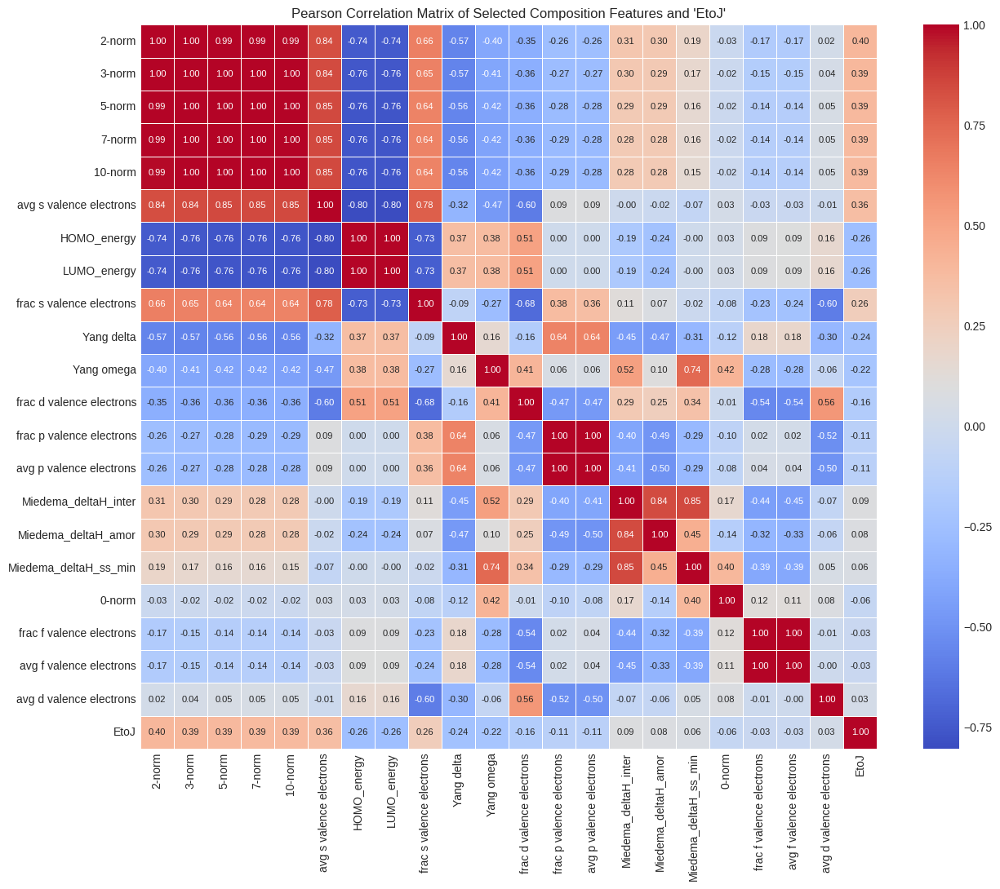


Correlation analysis complete.


In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sys

# Define the filename and target column
input_file = 'corrosion_refined.csv'
TARGET_COLUMN = 'EtoJ'

# Define the numerical and categorical process parameters as per user's description.
# Note: MfgRoute, Process_Clustered, Coolingmedium_Clustered, Solution_Clustered are now label-encoded,
# making them numerical for correlation calculation.
process_parameters = [
    'T[oC]', 't[hr]', 'MfgRoute',
    'Process_Clustered', 'Coolingmedium_Clustered', 'Solution_Clustered'
]

def perform_correlation_analysis(input_csv_file: str, target_col: str, process_params: list):
    """
    Loads the refined corrosion data, identifies composition-derived features,
    and calculates their Pearson Correlation Coefficient with the target variable.
    Visualizes correlations with a heatmap for a manageable number of features.
    """
    # --- 1. Load the data ---
    try:
        df = pd.read_csv(input_csv_file)
        print(f"Successfully loaded '{input_csv_file}'.")
        print(f"Initial DataFrame shape: {df.shape}")
        print(f"Columns in the DataFrame: {list(df.columns)}")
    except FileNotFoundError:
        print(f"Error: '{input_csv_file}' not found. Please ensure the file is in the correct directory.")
        sys.exit(1)
    except Exception as e:
        print(f"An error occurred while loading the CSV: {e}")
        sys.exit(1)

    # Ensure target column exists and is numeric
    if target_col not in df.columns:
        print(f"Error: Target column '{target_col}' not found in the DataFrame.")
        sys.exit(1)
    df[target_col] = pd.to_numeric(df[target_col], errors='coerce')
    df.dropna(subset=[target_col], inplace=True) # Drop rows where target is NaN

    # --- 2. Group features ---
    # Identify all columns that are neither the target nor the explicitly listed process parameters.
    all_columns = set(df.columns)
    exclude_columns = {target_col} | set(process_params)

    composition_derived_features = list(all_columns - exclude_columns)
    
    # Filter out any columns that might have been identified but don't exist in the df (e.g., if lists were manually adjusted)
    composition_derived_features = [col for col in composition_derived_features if col in df.columns]

    print("\n--- Feature Grouping ---")
    print(f"Target Column: '{target_col}'")
    print(f"Process Parameters (Numerical & Label Encoded): {process_params}")
    print(f"Number of Composition-Derived Features identified: {len(composition_derived_features)}")
    # Uncomment the line below to see a sample of identified composition features
    # print(f"Sample Composition-Derived Features: {composition_derived_features[:5]} ... {composition_derived_features[-5:]}")

    if not composition_derived_features:
        print("No composition-derived features were identified based on the provided parameters. "
              "Please check the column names in 'corrosion_refined.csv' and the 'process_parameters' list.")
        return # Exit if no features to analyze

    # --- 3. Correlation Analysis (Pearson Correlation Coefficient) ---
    print("\n--- Correlation Analysis: Composition-Derived Features vs. Target ---")

    correlations = {}
    for feature in composition_derived_features:
        # Ensure the feature column is numeric, coercing errors
        df[feature] = pd.to_numeric(df[feature], errors='coerce')

        # Create a temporary DataFrame for correlation to handle NaNs only for the pair being correlated
        temp_df = df[[feature, target_col]].dropna()

        # Calculate correlation only if there's enough data and variability
        if not temp_df.empty and temp_df[feature].std() > 0 and temp_df[target_col].std() > 0:
            correlation = temp_df[feature].corr(temp_df[target_col], method='pearson')
            correlations[feature] = correlation
        else:
            correlations[feature] = np.nan # Assign NaN if correlation cannot be computed (e.g., all same value)

    # Sort correlations by absolute value to see strongest relationships (positive or negative)
    sorted_correlations = sorted(correlations.items(), key=lambda item: abs(item[1]) if not np.isnan(item[1]) else -1, reverse=True)

    print("\nTop 20 Composition-Derived Feature Correlations with Target (EtoJ):")
    if sorted_correlations:
        for feature, corr_value in sorted_correlations[:20]:
            print(f"- {feature}: {corr_value:.4f}")
    else:
        print("No valid correlations could be computed.")

    # --- 4. Optional: Visualize correlations with a heatmap ---
    # Limiting the number of features for heatmap readability
    if len(composition_derived_features) > 1 and len(composition_derived_features) <= 50:
        print(f"\nVisualizing correlations with a heatmap for top {len(composition_derived_features)} features...")
        
        # Select the top correlated features for the heatmap, including the target
        # Ensure 'target_col' is always included for correlation matrix
        features_for_heatmap = [feature for feature, _ in sorted_correlations if not np.isnan(_)]
        features_for_heatmap = features_for_heatmap[:50] # Take max 50 features for clarity
        
        if target_col not in features_for_heatmap: # Make sure target is in the list
            plot_cols = features_for_heatmap + [target_col]
        else:
            plot_cols = features_for_heatmap # If target is already in top 50

        # Calculate the correlation matrix for the selected columns
        corr_matrix = df[plot_cols].corr(method='pearson')

        plt.figure(figsize=(len(plot_cols)*0.6, len(plot_cols)*0.5)) # Dynamic sizing for better readability
        sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, annot_kws={"size": 8})
        plt.title(f"Pearson Correlation Matrix of Selected Composition Features and '{target_col}'")
        plt.xticks(rotation=90)
        plt.yticks(rotation=0)
        plt.tight_layout()
        plt.show()
    elif len(composition_derived_features) > 50:
        print(f"\nSkipping heatmap visualization due to too many composition-derived features ({len(composition_derived_features)}). Displaying only top 20 correlations.")
    else:
        print("\nNot enough features to generate a heatmap (requires more than 1 feature).")

    print("\nCorrelation analysis complete.")

if __name__ == "__main__":
    perform_correlation_analysis(input_file, TARGET_COLUMN, process_parameters)



Successfully loaded 'corrosion_refined.csv'.
DataFrame shape: (287, 28)

Prepared data for MI analysis: X shape (287, 27), y shape (287,)
Identified 4 discrete features for MI calculation: ['MfgRoute', 'Process_Clustered', 'Coolingmedium_Clustered', 'Solution_Clustered']

Calculating Mutual Information scores...

Mutual Information Scores (Higher value indicates stronger dependency):
Yang delta                  0.961727
frac d valence electrons    0.907013
frac s valence electrons    0.875274
avg s valence electrons     0.860860
avg d valence electrons     0.832324
10-norm                     0.732123
7-norm                      0.731717
5-norm                      0.726939
2-norm                      0.719111
3-norm                      0.718901
avg p valence electrons     0.690104
frac p valence electrons    0.682684
Yang omega                  0.611358
0-norm                      0.461462
T[oC]                       0.400281
Miedema_deltaH_amor         0.303310
Miedema_deltaH_inter 

/tmp/ipykernel_11427/3179072618.py:106: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mi_series_sorted.head(30).values, y=mi_series_sorted.head(30).index, palette='viridis')


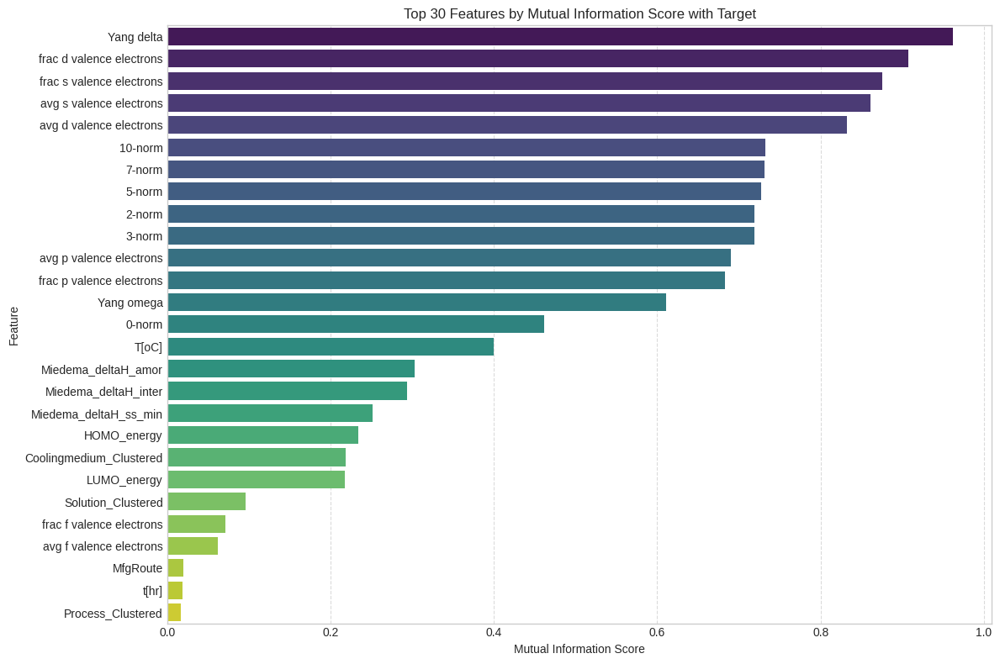


--- Advanced Feature Distribution and Relation Visualization ---

Generating Violin Plots for Target vs. Categorical Features...


/tmp/ipykernel_11427/3179072618.py:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=cat_col, y=target_col, data=plot_df, inner='quartile', palette='Set2')


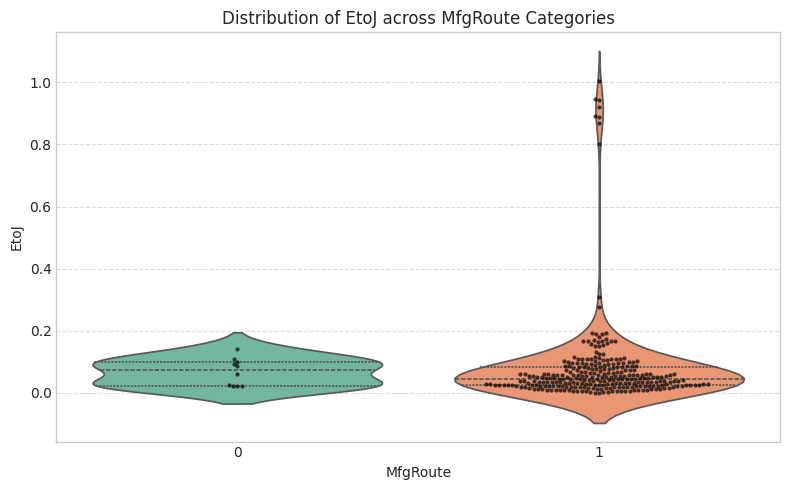

/tmp/ipykernel_11427/3179072618.py:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=cat_col, y=target_col, data=plot_df, inner='quartile', palette='Set2')


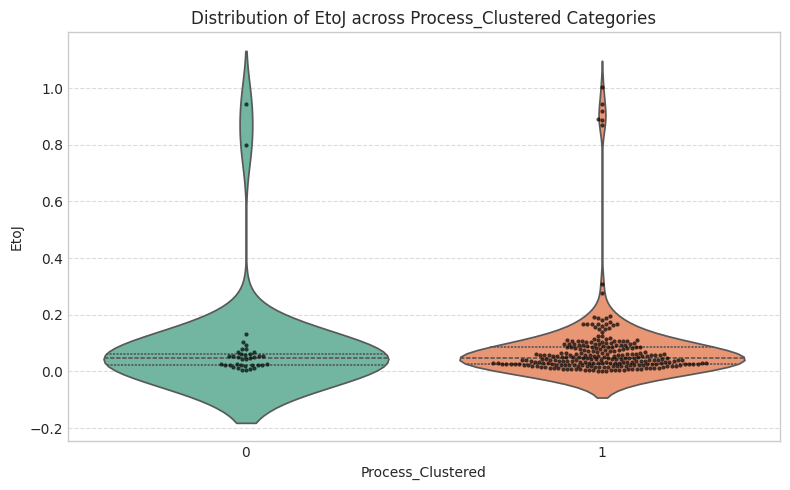

/tmp/ipykernel_11427/3179072618.py:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=cat_col, y=target_col, data=plot_df, inner='quartile', palette='Set2')
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/seaborn/categorical.py:3399: UserWarning: 18.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/seaborn/categorical.py:3399: UserWarning: 10.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


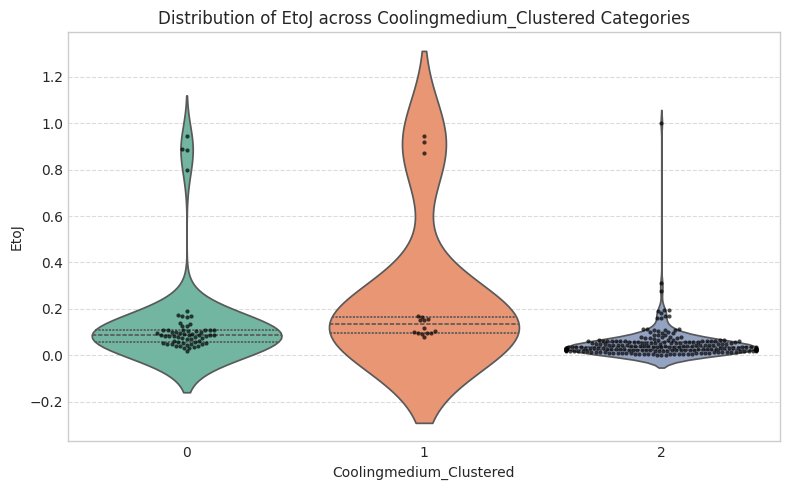

/tmp/ipykernel_11427/3179072618.py:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=cat_col, y=target_col, data=plot_df, inner='quartile', palette='Set2')
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/seaborn/categorical.py:3399: UserWarning: 13.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/seaborn/categorical.py:3399: UserWarning: 7.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/seaborn/categorical.py:3399: UserWarning: 5.2% of the points cannot be placed; you may want to decrease the size of the markers or use strip

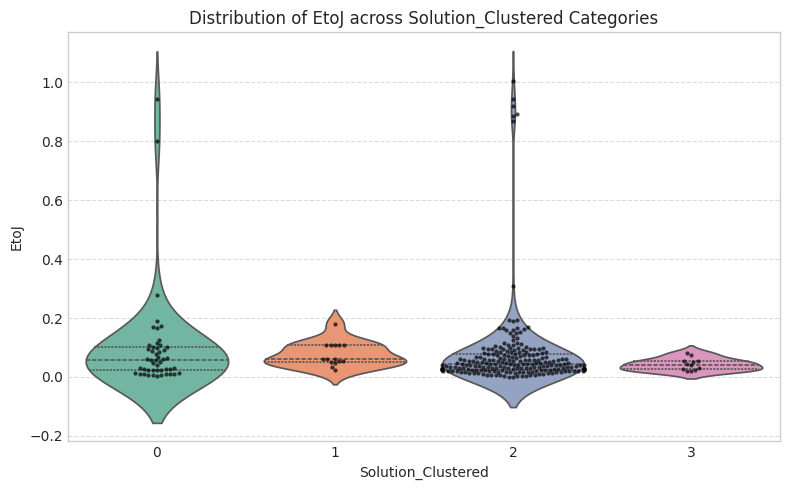


Generating KDE Plots for Continuous Features...


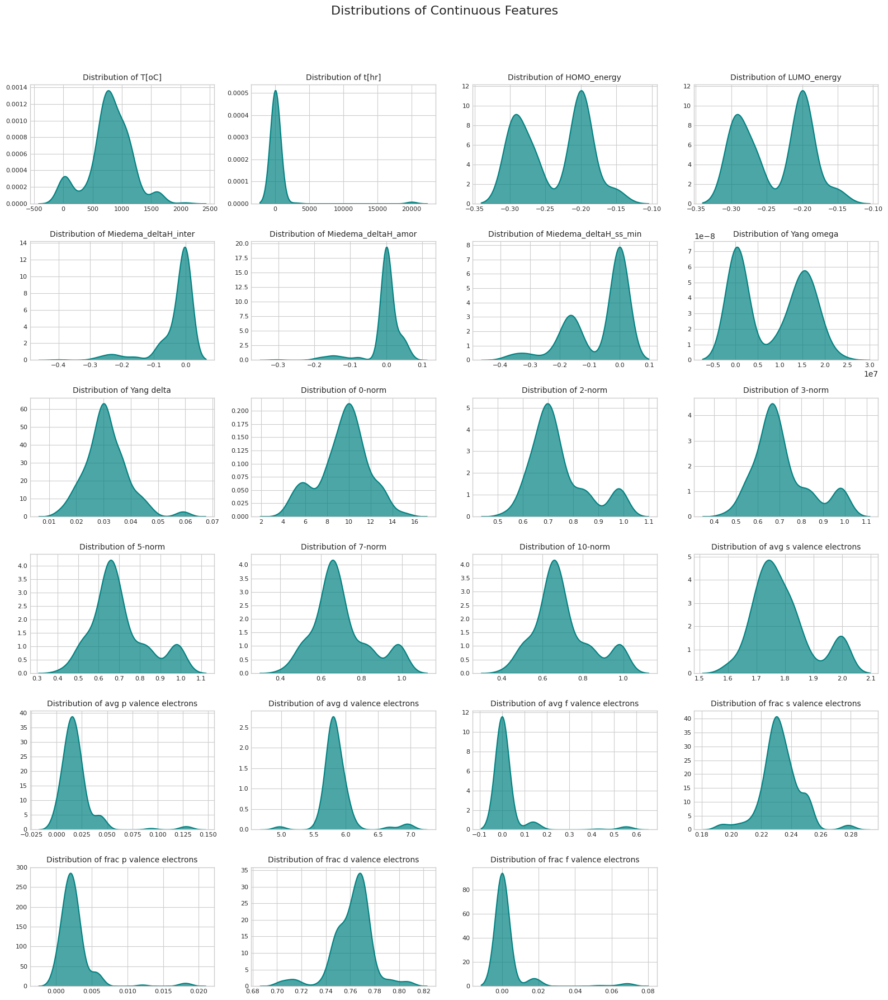


Generating a single, highly compact multi-dimensional plot (Parallel Coordinates Plot)...


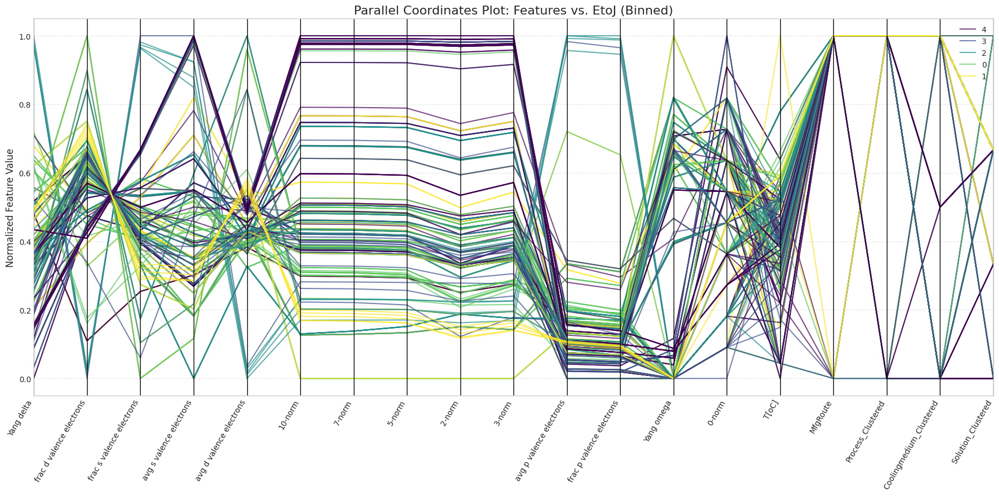


Generating Dimensionality Reduction (t-SNE) Scatter Plot...


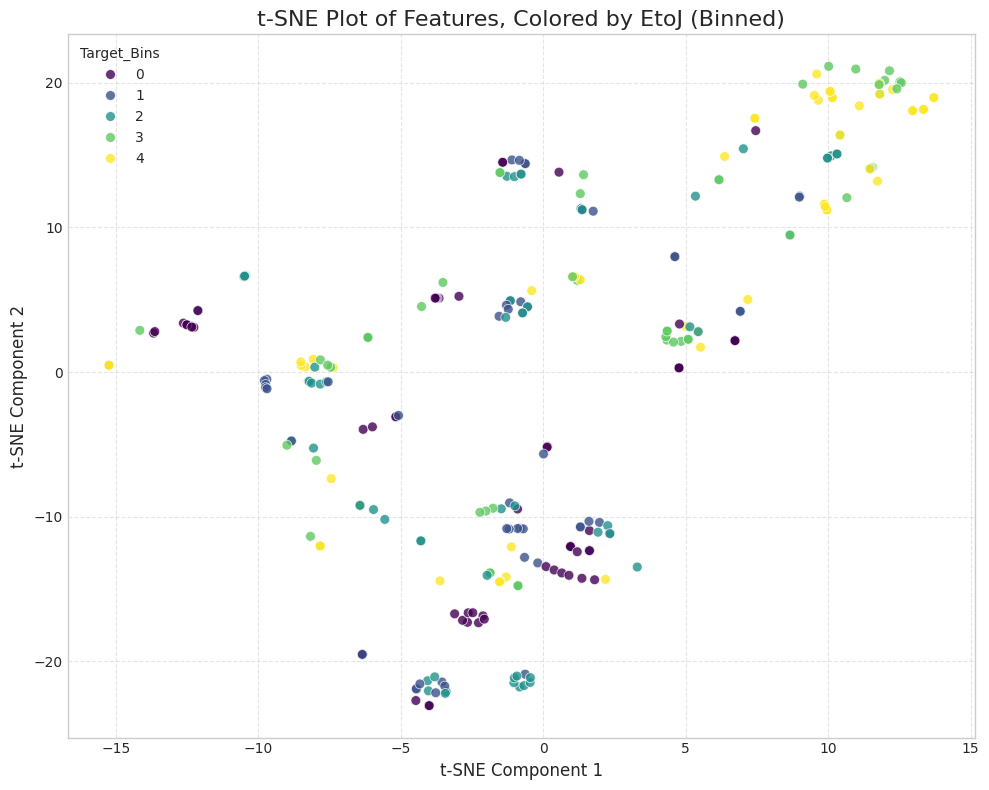


Dimensionality Reduction visualization complete.

Mutual Information analysis complete.


In [6]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import mutual_info_regression
import matplotlib.pyplot as plt
import seaborn as sns
import sys
# Import parallel_coordinates for the single multi-dimensional plot
from pandas.plotting import parallel_coordinates
from sklearn.preprocessing import MinMaxScaler # Import MinMaxScaler for explicit scaling
from sklearn.manifold import TSNE # Import t-SNE for dimensionality reduction
# from umap import UMAP # UMAP is a third-party library, might need separate installation

# Define the filename and target column
input_file = 'corrosion_refined.csv'
TARGET_COLUMN = 'EtoJ'

# Define the process parameters that were label-encoded.
# These will be treated as discrete features by mutual_info_regression.
label_encoded_discrete_features = [
    'MfgRoute',
    'Process_Clustered',
    'Coolingmedium_Clustered',
    'Solution_Clustered'
]

def perform_mutual_information_analysis(input_csv_file: str, target_col: str, discrete_features: list):
    """
    Loads the refined corrosion data, calculates Mutual Information scores
    between all features and the target, and displays the results.
    Also includes more advanced visualizations for feature distributions,
    including t-SNE for dimensionality reduction.
    """
    # --- 1. Load the data ---
    try:
        df = pd.read_csv(input_csv_file)
        print(f"Successfully loaded '{input_csv_file}'.")
        print(f"DataFrame shape: {df.shape}")
    except FileNotFoundError:
        print(f"Error: '{input_csv_file}' not found. Please ensure the file is in the correct directory.")
        sys.exit(1)
    except Exception as e:
        print(f"An error occurred while loading the CSV: {e}")
        sys.exit(1)

    # --- 2. Prepare Features (X) and Target (y) ---
    if target_col not in df.columns:
        print(f"Error: Target column '{target_col}' not found in the DataFrame.")
        sys.exit(1)

    X = df.drop(columns=[target_col])
    y = df[target_col]

    # Ensure all features and target are numeric. Coerce errors to NaN and drop rows with NaN in target.
    for col in X.columns:
        X[col] = pd.to_numeric(X[col], errors='coerce')
    y = pd.to_numeric(y, errors='coerce')

    # Drop rows where target is NaN (or corresponding X features are NaN after conversion)
    # This ensures consistency for MI calculation.
    initial_rows = len(df)
    combined_df = pd.concat([X, y], axis=1).dropna()
    X = combined_df.drop(columns=[target_col])
    y = combined_df[target_col]
    
    if len(X) < initial_rows:
        print(f"Warning: Dropped {initial_rows - len(X)} rows due to NaN values in features or target after conversion.")

    if X.empty or y.empty:
        print("Error: No valid data remaining after handling NaNs. Cannot perform MI analysis.")
        sys.exit(1)

    print(f"\nPrepared data for MI analysis: X shape {X.shape}, y shape {y.shape}")

    # --- 3. Identify Discrete Features for mutual_info_regression ---
    # `mutual_info_regression` treats continuous variables and discrete variables differently.
    # It's important to specify which are discrete.
    # For label-encoded features, treat them as discrete.
    # For others, if they have few unique integer values, they might also be considered discrete.
    
    discrete_features_indices = []
    feature_names = X.columns.tolist()

    for i, col in enumerate(feature_names):
        if col in discrete_features:
            discrete_features_indices.append(i)
        # Optional: You can also infer discrete features if they have low cardinality and integer type
        # elif pd.api.types.is_integer_dtype(X[col]) and X[col].nunique() < 20: # Example threshold
        #     discrete_features_indices.append(i)
    
    print(f"Identified {len(discrete_features_indices)} discrete features for MI calculation: "
          f"{[feature_names[i] for i in discrete_features_indices]}")


    # --- 4. Calculate Mutual Information Scores ---
    print("\nCalculating Mutual Information scores...")
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features_indices, random_state=42)

    mi_series = pd.Series(mi_scores, index=X.columns)
    mi_series_sorted = mi_series.sort_values(ascending=False)

    print("\nMutual Information Scores (Higher value indicates stronger dependency):")
    print(mi_series_sorted.head(20)) # Print top 20 features by MI score

    # --- 5. Visualize Mutual Information Scores ---
    plt.figure(figsize=(12, 8))
    sns.barplot(x=mi_series_sorted.head(30).values, y=mi_series_sorted.head(30).index, palette='viridis')
    plt.title('Top 30 Features by Mutual Information Score with Target')
    plt.xlabel('Mutual Information Score')
    plt.ylabel('Feature')
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

    # --- 6. Advanced Feature Distribution and Relation Visualization ---
    print("\n--- Advanced Feature Distribution and Relation Visualization ---")

    # Set a consistent seaborn style for visually appealing plots
    sns.set_style("whitegrid") 

    # Re-combine X and y for plotting purposes
    plot_df = pd.concat([X, y], axis=1)

    # Plotting target distribution across categorical features using Violin Plots
    print("\nGenerating Violin Plots for Target vs. Categorical Features...")
    for cat_col in discrete_features:
        if cat_col in plot_df.columns:
            plt.figure(figsize=(8, 5))
            sns.violinplot(x=cat_col, y=target_col, data=plot_df, inner='quartile', palette='Set2') 
            sns.swarmplot(x=cat_col, y=target_col, data=plot_df, color='black', size=3, alpha=0.7) 
            plt.title(f'Distribution of {target_col} across {cat_col} Categories')
            plt.xlabel(cat_col)
            plt.ylabel(target_col)
            plt.grid(axis='y', linestyle='--', alpha=0.7)
            plt.tight_layout()
            plt.show()
        else:
            print(f"Warning: Categorical column '{cat_col}' not found for plotting.")

    # Plotting distributions of continuous features using KDE plots in a compact grid
    print("\nGenerating KDE Plots for Continuous Features...")
    continuous_features = [col for col in X.columns if col not in discrete_features]

    if continuous_features:
        n_plots = len(continuous_features)
        n_cols = min(4, n_plots)
        n_rows = int(np.ceil(n_plots / n_cols))

        fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 4, n_rows * 3))
        axes = axes.flatten()

        for i, col in enumerate(continuous_features):
            if i < len(axes):
                sns.kdeplot(plot_df[col], fill=True, ax=axes[i], color='teal', alpha=0.7, linewidth=1.5)
                axes[i].set_title(f'Distribution of {col}', fontsize=10)
                axes[i].set_xlabel('')
                axes[i].set_ylabel('')
                axes[i].tick_params(axis='x', labelsize=8)
                axes[i].tick_params(axis='y', labelsize=8)
            
        # Hide any unused subplots
        for j in range(i + 1, len(axes)):
            fig.delaxes(axes[j])

        plt.suptitle('Distributions of Continuous Features', fontsize=16, y=1.02)
        plt.tight_layout(rect=[0, 0.03, 1, 0.98])
        plt.show()
    else:
        print("No continuous features found for plotting.")

    # --- Parallel Coordinates Plot ---
    print("\nGenerating a single, highly compact multi-dimensional plot (Parallel Coordinates Plot)...")

    plot_df['Target_Bins'] = pd.qcut(plot_df[target_col], q=5, labels=False, duplicates='drop')

    features_for_parallel_plot = mi_series_sorted.head(15).index.tolist()
    features_for_parallel_plot = [f for f in features_for_parallel_plot if f != target_col]
    features_for_parallel_plot.extend([f for f in discrete_features if f not in features_for_parallel_plot and f in X.columns])

    all_cols_for_parallel = features_for_parallel_plot + ['Target_Bins']
    df_plot_filtered = plot_df[all_cols_for_parallel].copy()

    if not df_plot_filtered.empty and len(features_for_parallel_plot) > 1:
        scaler = MinMaxScaler()
        df_plot_filtered[features_for_parallel_plot] = scaler.fit_transform(df_plot_filtered[features_for_parallel_plot])

        plt.figure(figsize=(18, 9))
        parallel_coordinates(
            df_plot_filtered,
            'Target_Bins',
            colormap='viridis',
            alpha=0.7
        )
        plt.title(f'Parallel Coordinates Plot: Features vs. {target_col} (Binned)', fontsize=16)
        plt.ylabel('Normalized Feature Value', fontsize=12)
        plt.xticks(rotation=60, ha='right', fontsize=10)
        plt.yticks(fontsize=10)
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()
    else:
        print("Not enough features or data to generate the Parallel Coordinates Plot.")
        print(f"Number of features selected for parallel plot: {len(features_for_parallel_plot)}")

    # --- New: Dimensionality Reduction (t-SNE) and Scatter Plot ---
    print("\nGenerating Dimensionality Reduction (t-SNE) Scatter Plot...")

    # It's good practice to scale features before t-SNE for better results
    scaler = MinMaxScaler()
    X_scaled = scaler.fit_transform(X)

    # Perform t-SNE
    # perplexity is a crucial parameter, try values between 5 and 50.
    # n_components can be 2 or 3.
    # n_iter_without_progress for convergence check.
    try:
        tsne = TSNE(n_components=2, random_state=42, perplexity=min(30, len(X)-1), n_iter=1000, learning_rate='auto', init='random')
        X_tsne = tsne.fit_transform(X_scaled)

        # Create a DataFrame for plotting
        tsne_df = pd.DataFrame(data=X_tsne, columns=['TSNE_Component_1', 'TSNE_Component_2'])
        tsne_df[target_col] = y.values # Add the original target column
        tsne_df['Target_Bins'] = plot_df['Target_Bins'].values # Add the binned target column

        plt.figure(figsize=(10, 8))
        sns.scatterplot(
            x='TSNE_Component_1',
            y='TSNE_Component_2',
            hue='Target_Bins', # Color points by target bins
            palette='viridis', # Consistent colormap
            data=tsne_df,
            s=50, # Point size
            alpha=0.8,
            legend='full'
        )
        plt.title(f't-SNE Plot of Features, Colored by {target_col} (Binned)', fontsize=16)
        plt.xlabel('t-SNE Component 1', fontsize=12)
        plt.ylabel('t-SNE Component 2', fontsize=12)
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"Error during t-SNE plot generation: {e}")
        print("t-SNE might fail if the number of samples is too small compared to perplexity.")
        print(f"Current number of samples: {len(X)}")


    print("\nDimensionality Reduction visualization complete.")
    print("\nMutual Information analysis complete.")


if __name__ == "__main__":
    perform_mutual_information_analysis(input_file, TARGET_COLUMN, label_encoded_discrete_features)


/tmp/ipykernel_11427/1259212271.py:17: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


Successfully loaded 'corrosion_refined.csv' with shape: (287, 28)

Prepared data for MI analysis: X_poly shape (287, 527), y shape (287,)
Identified 122 discrete features: ['MfgRoute', 'Process_Clustered', 'Coolingmedium_Clustered', 'Solution_Clustered', 'MfgRoute^2', 'MfgRoute T[oC]', 'MfgRoute t[hr]', 'MfgRoute Process_Clustered', 'MfgRoute Coolingmedium_Clustered', 'MfgRoute Solution_Clustered', 'MfgRoute HOMO_energy', 'MfgRoute LUMO_energy', 'MfgRoute Miedema_deltaH_inter', 'MfgRoute Miedema_deltaH_amor', 'MfgRoute Miedema_deltaH_ss_min', 'MfgRoute Yang omega', 'MfgRoute Yang delta', 'MfgRoute 0-norm', 'MfgRoute 2-norm', 'MfgRoute 3-norm', 'MfgRoute 5-norm', 'MfgRoute 7-norm', 'MfgRoute 10-norm', 'MfgRoute avg s valence electrons', 'MfgRoute avg p valence electrons', 'MfgRoute avg d valence electrons', 'MfgRoute avg f valence electrons', 'MfgRoute frac s valence electrons', 'MfgRoute frac p valence electrons', 'MfgRoute frac d valence electrons', 'MfgRoute frac f valence electrons'

/tmp/ipykernel_11427/1259212271.py:60: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mi_series_sorted.head(30).values, y=mi_series_sorted.head(30).index, palette='viridis')


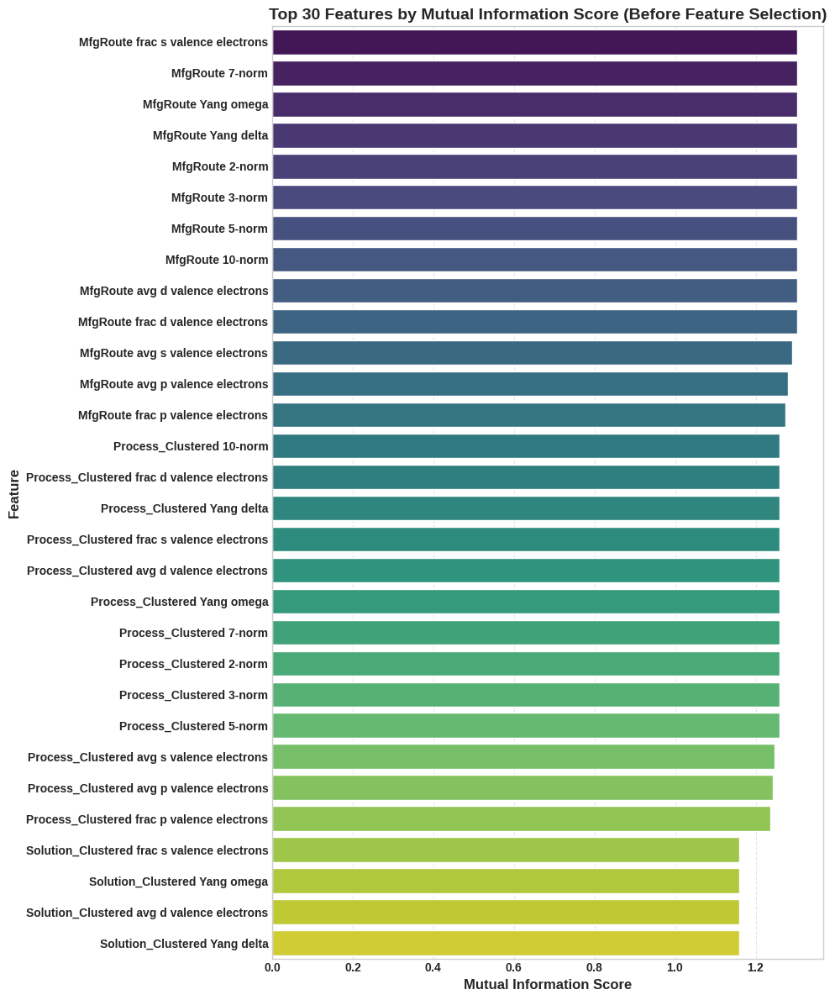


Features selected for NN training (35): ['0-norm avg f valence electrons', '2-norm avg f valence electrons', 'avg d valence electrons avg f valence electrons', '0-norm frac s valence electrons', 'avg p valence electrons frac d valence electrons', 'avg d valence electrons frac d valence electrons', 'T[oC]', 'Miedema_deltaH_inter avg f valence electrons', 'LUMO_energy frac p valence electrons', '1/t', 'avg d valence electrons frac f valence electrons', 'avg d valence electrons', 't_squared', 'avg s valence electrons frac f valence electrons', 'Solution_Clustered frac f valence electrons', 'T_t_interaction', 'Coolingmedium_Clustered', '10-norm avg f valence electrons', 'MfgRoute', '0-norm frac p valence electrons', 'Solution_Clustered avg f valence electrons', 'avg d valence electrons frac s valence electrons', 'avg d valence electrons frac p valence electrons', 'T_squared', 't[hr]', 'Solution_Clustered', 'HOMO_energy avg f valence electrons', 'frac d valence electrons frac f valence ele

/tmp/ipykernel_11427/1259212271.py:206: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mi_series_selected.sort_values(ascending=False).values, y=mi_series_selected.sort_values(ascending=False).index, palette='viridis')


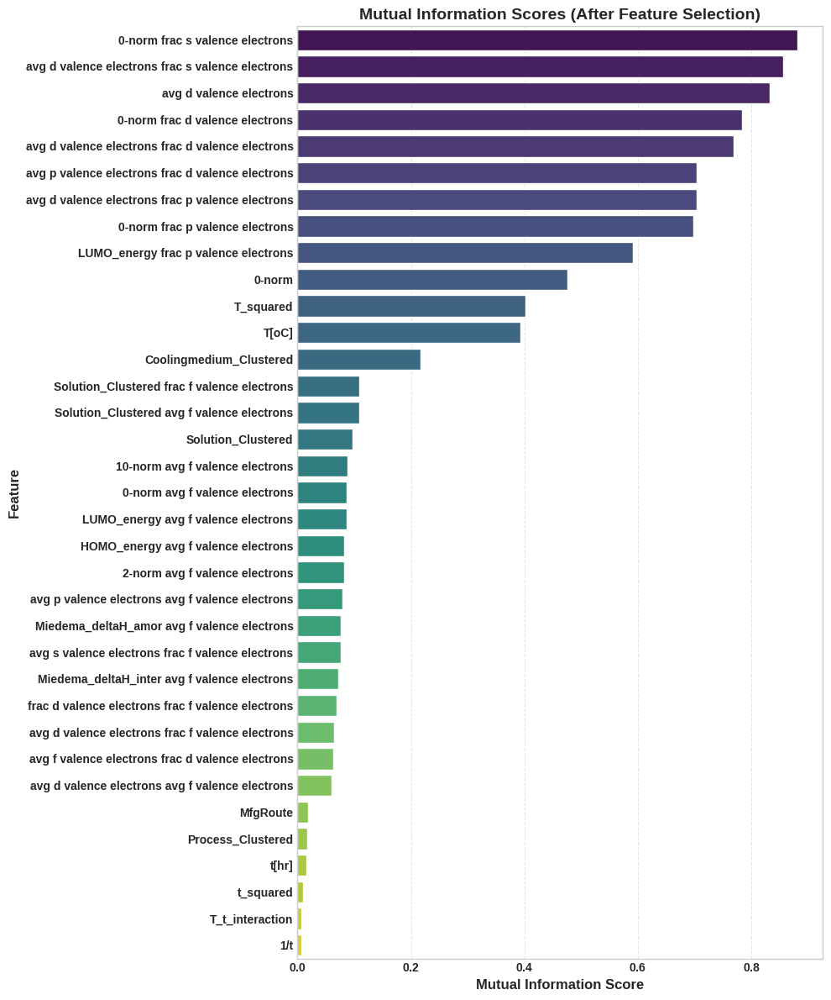

Mask high sum: 8, n_high_samples: 83
y_transformed shape: (287, 1), synth_y shape: (83, 1)
Warmup Epoch 10/50, Loss: 0.4342
Warmup Epoch 20/50, Loss: 0.3278
Warmup Epoch 30/50, Loss: 0.1897
Warmup Epoch 40/50, Loss: 0.0868
Warmup Epoch 50/50, Loss: 0.0647

Beginning model training...
Epoch 1/1500, Train Loss: 0.0569, Val Loss: 0.0466


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 10/1500, Train Loss: 0.0522, Val Loss: 0.0407
Epoch 20/1500, Train Loss: 0.0462, Val Loss: 0.0387
Epoch 30/1500, Train Loss: 0.0449, Val Loss: 0.0358
Epoch 40/1500, Train Loss: 0.0414, Val Loss: 0.0342
Epoch 50/1500, Train Loss: 0.0398, Val Loss: 0.0320
Epoch 60/1500, Train Loss: 0.0357, Val Loss: 0.0317
Epoch 70/1500, Train Loss: 0.0355, Val Loss: 0.0308
Epoch 80/1500, Train Loss: 0.0370, Val Loss: 0.0303
Epoch 90/1500, Train Loss: 0.0344, Val Loss: 0.0311
Epoch 100/1500, Train Loss: 0.0311, Val Loss: 0.0292
Epoch 110/1500, Train Loss: 0.0280, Val Loss: 0.0277
Epoch 120/1500, Train Loss: 0.0268, Val Loss: 0.0283
Epoch 130/1500, Train Loss: 0.0275, Val Loss: 0.0278
Epoch 140/1500, Train Loss: 0.0281, Val Loss: 0.0263
Epoch 150/1500, Train Loss: 0.0259, Val Loss: 0.0273
Epoch 160/1500, Train Loss: 0.0241, Val Loss: 0.0264
Epoch 170/1500, Train Loss: 0.0219, Val Loss: 0.0256
Epoch 180/1500, Train Loss: 0.0224, Val Loss: 0.0249
Epoch 190/1500, Train Loss: 0.0209, Val Loss: 0.0256
Ep

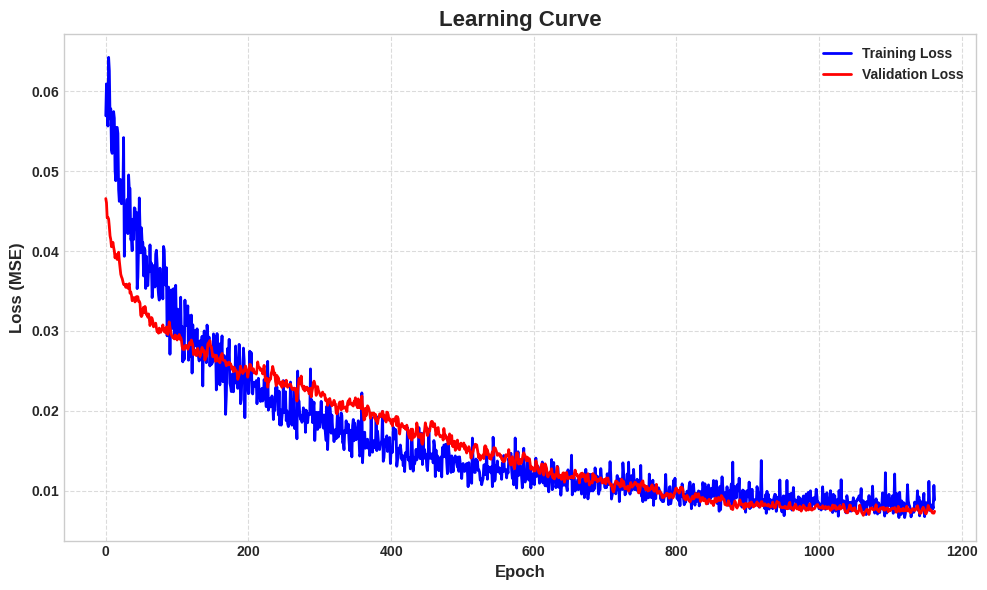


--- Model Performance ---
Train R2: 0.9230, MAE: 0.0389, MAPE: 92.16%, MSE: 0.0107
Validation R2: 0.8822, MAE: 0.0433, MAPE: 96.56%, MSE: 0.0140


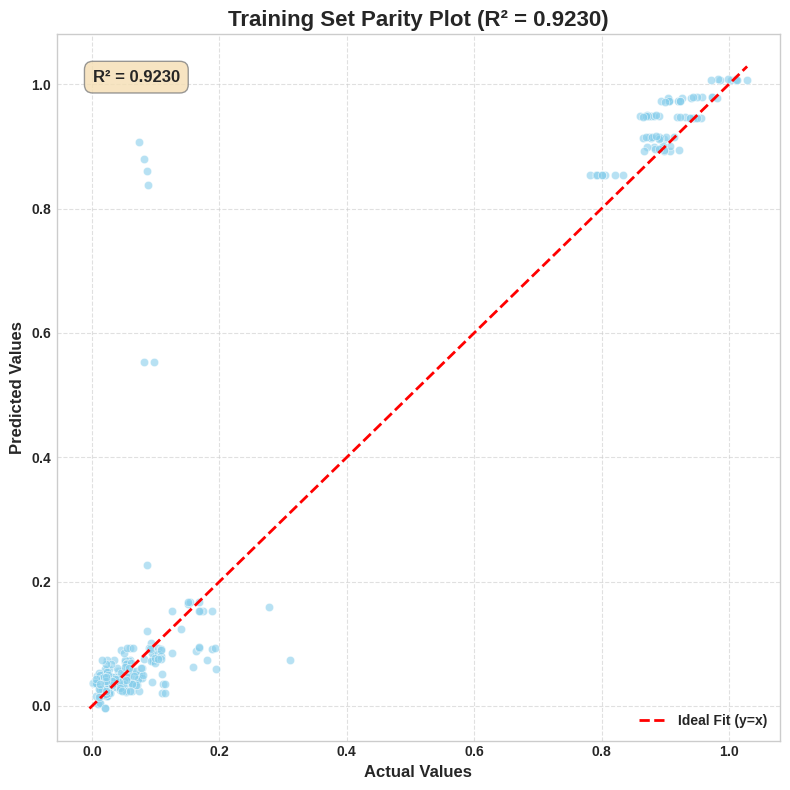

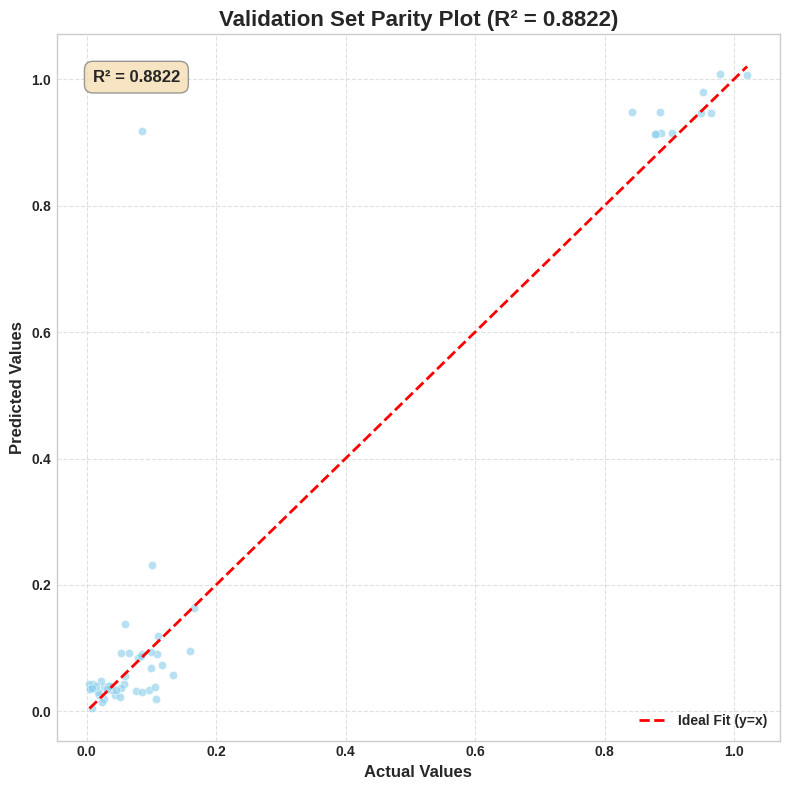

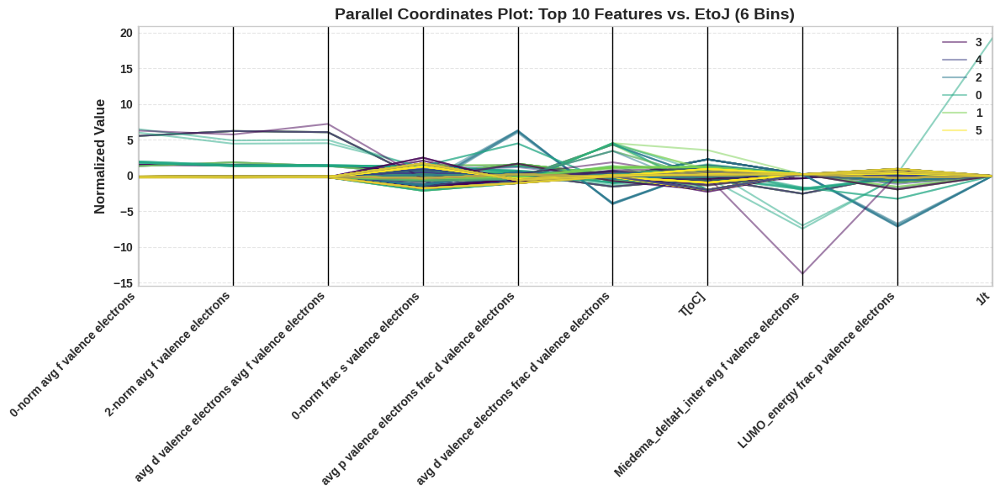

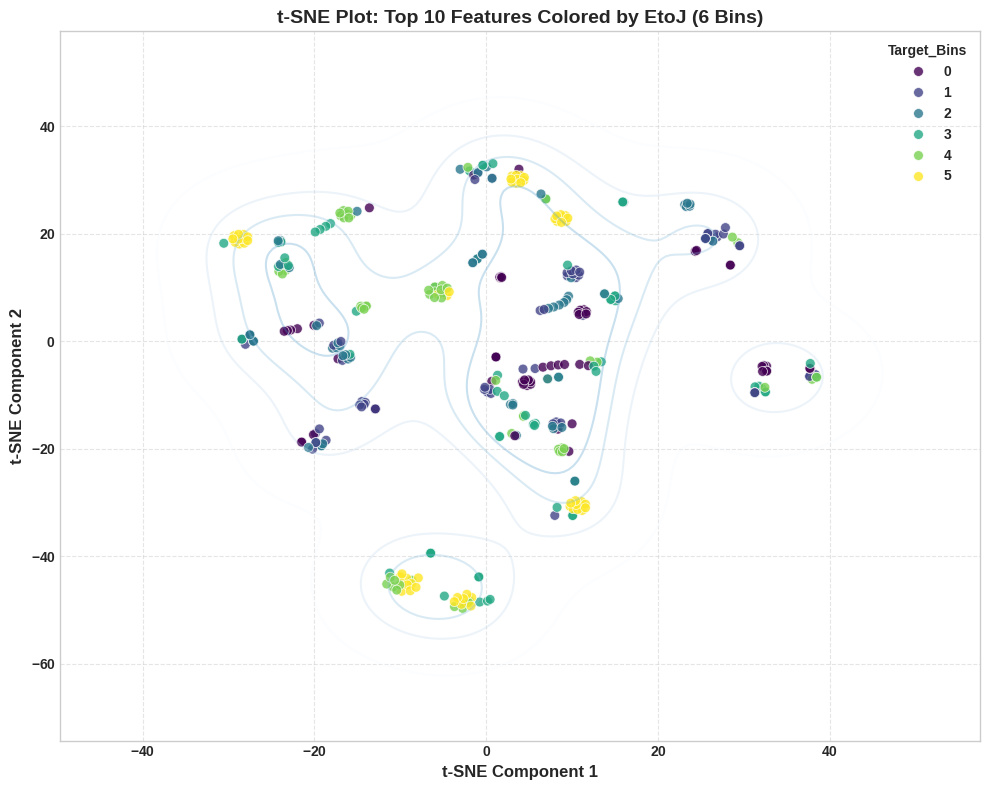

In [11]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import mutual_info_regression, RFE
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler, PolynomialFeatures, StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import sys
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# Set consistent style and random seed for reproducibility
plt.style.use('seaborn-whitegrid')
sns.set_palette('viridis')
np.random.seed(42)
torch.manual_seed(42)

# Define constants
input_file = 'corrosion_refined.csv'
TARGET_COLUMN = 'EtoJ'
label_encoded_discrete_features = [
    'MfgRoute',
    'Process_Clustered',
    'Coolingmedium_Clustered',
    'Solution_Clustered'
]

def perform_mutual_information_analysis(input_csv_file: str, target_col: str, discrete_features: list, X_poly, y):
    """Calculates Mutual Information scores and visualizes top features."""
    # Ensure numeric data and handle NaNs
    for col in X_poly.columns:
        X_poly[col] = pd.to_numeric(X_poly[col], errors='coerce')
    y = pd.to_numeric(y, errors='coerce')
    combined_df = pd.concat([X_poly, pd.Series(y, name=target_col)], axis=1).dropna()
    X_poly = combined_df.drop(columns=[target_col])
    y = combined_df[target_col]
    
    if X_poly.empty or y.empty:
        print("Error: No valid data remaining after handling NaNs.")
        sys.exit(1)

    print(f"\nPrepared data for MI analysis: X_poly shape {X_poly.shape}, y shape {y.shape}")
    discrete_features_indices = [i for i, col in enumerate(X_poly.columns) if any(orig in col for orig in discrete_features)]
    print(f"Identified {len(discrete_features_indices)} discrete features: {[X_poly.columns[i] for i in discrete_features_indices]}")

    print("\nCalculating Mutual Information scores...")
    mi_scores = mutual_info_regression(X_poly, y, discrete_features=discrete_features_indices, random_state=42)
    mi_series = pd.Series(mi_scores, index=X_poly.columns)
    mi_series_sorted = mi_series.sort_values(ascending=False)

    print("\nMutual Information Scores (Top 20):")
    print(mi_series_sorted.head(20))

    # Visualize Mutual Information Scores
    plt.figure(figsize=(10, 12))
    sns.barplot(x=mi_series_sorted.head(30).values, y=mi_series_sorted.head(30).index, palette='viridis')
    plt.title('Top 30 Features by Mutual Information Score (Before Feature Selection)', fontsize=14)
    plt.xlabel('Mutual Information Score', fontsize=12)
    plt.ylabel('Feature', fontsize=12)
    plt.grid(axis='x', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

    return X_poly, y, mi_series_sorted

class RegressionNN(nn.Module):
    """Neural Network for regression tasks."""
    def __init__(self, input_dim):
        super(RegressionNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, 256)
        self.bn1 = nn.BatchNorm1d(256)
        self.fc2 = nn.Linear(256, 128)
        self.bn2 = nn.BatchNorm1d(128)
        self.fc3 = nn.Linear(128, 64)
        self.bn3 = nn.BatchNorm1d(64)
        self.fc4 = nn.Linear(64, 32)
        self.dropout = nn.Dropout(0.4)
        self.fc5 = nn.Linear(32, 1)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.relu(self.bn1(self.fc1(x)))
        x = self.dropout(x)
        x = self.relu(self.bn2(self.fc2(x)))
        x = self.dropout(x)
        x = self.relu(self.bn3(self.fc3(x)))
        x = self.relu(self.fc4(x))
        x = self.fc5(x)
        return x

class WeightedMSELoss(nn.Module):
    """Custom loss function with dynamic weighting."""
    def __init__(self):
        super(WeightedMSELoss, self).__init__()

    def forward(self, predictions, targets):
        weights = 1.0 + 5.0 * torch.sigmoid((targets - 0.6) / 0.1)
        loss = (weights * (predictions - targets) ** 2).mean()
        return loss

def train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs=1500, patience=100):
    """Trains the model with early stopping and learning rate scheduling."""
    train_losses, val_losses = [], []
    best_val_loss = float('inf')
    patience_counter = 0
    
    print("\nBeginning model training...")
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        for inputs, targets in train_loader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
            running_loss += loss.item() * inputs.size(0)
        epoch_train_loss = running_loss / len(train_loader.dataset)
        train_losses.append(epoch_train_loss)

        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for inputs, targets in val_loader:
                outputs = model(inputs)
                loss = criterion(outputs, targets)
                val_loss += loss.item() * inputs.size(0)
        epoch_val_loss = val_loss / len(val_loader.dataset)
        val_losses.append(epoch_val_loss)
        
        scheduler.step(epoch_val_loss)
        if epoch_val_loss < best_val_loss:
            best_val_loss = epoch_val_loss
            patience_counter = 0
            # Save best model (simplified checkpointing)
            torch.save(model.state_dict(), 'best_model.pth')
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"Early stopping at epoch {epoch+1}")
                break
        
        if (epoch + 1) % 10 == 0 or epoch == 0:
            print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}")
    
    print("Model training complete.")
    return train_losses, val_losses

def evaluate_model(model, data_loader, transform_back=None):
    """Evaluates the model and returns performance metrics."""
    model.eval()
    predictions, actuals = [], []
    with torch.no_grad():
        for inputs, targets in data_loader:
            outputs = model(inputs)
            if transform_back:
                outputs = transform_back(outputs)
                targets = transform_back(targets)
            predictions.extend(outputs.squeeze().tolist())
            actuals.extend(targets.squeeze().tolist())
    r2 = r2_score(actuals, predictions)
    mae = mean_absolute_error(actuals, predictions)
    mape = np.mean(np.abs((np.array(actuals) - np.array(predictions)) / np.array(actuals)) * 100)
    mse = mean_squared_error(actuals, predictions)
    return np.array(actuals), np.array(predictions), r2, mae, mape, mse

def plot_learning_curve(train_losses, val_losses):
    """Plots the learning curve for training and validation loss."""
    plt.figure(figsize=(10, 6))
    plt.plot(train_losses, label='Training Loss', color='blue', linewidth=2)
    plt.plot(val_losses, label='Validation Loss', color='red', linewidth=2)
    plt.title('Learning Curve', fontsize=16)
    plt.xlabel('Epoch', fontsize=12)
    plt.ylabel('Loss (MSE)', fontsize=12)
    plt.legend(fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

def plot_parity(actuals, predictions, r2, title="Parity Plot"):
    """Plots a parity plot comparing actual vs predicted values."""
    plt.figure(figsize=(8, 8))
    plt.scatter(actuals, predictions, alpha=0.6, color='skyblue', edgecolors='w', linewidth=0.5)
    min_val = min(actuals.min(), predictions.min())
    max_val = max(actuals.max(), predictions.max())
    plt.plot([min_val, max_val], [min_val, max_val], 'r--', label='Ideal Fit (y=x)', linewidth=2)
    plt.title(f'{title} (R² = {r2:.4f})', fontsize=16)
    plt.xlabel('Actual Values', fontsize=12)
    plt.ylabel('Predicted Values', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.text(0.05, 0.95, f'R² = {r2:.4f}', transform=plt.gca().transAxes, fontsize=12,
             verticalalignment='top', bbox=dict(boxstyle='round,pad=0.5', fc='wheat', alpha=0.8, ec='gray'))
    plt.legend(fontsize=10, loc='lower right')
    plt.tight_layout()
    plt.show()


def plot_mi_after_selection(mi_series_selected):
    """Plots Mutual Information scores after feature selection."""
    plt.figure(figsize=(10, 12))
    sns.barplot(x=mi_series_selected.sort_values(ascending=False).values, y=mi_series_selected.sort_values(ascending=False).index, palette='viridis')
    plt.title('Mutual Information Scores (After Feature Selection)', fontsize=14)
    plt.xlabel('Mutual Information Score', fontsize=12)
    plt.ylabel('Feature', fontsize=12)
    plt.grid(axis='x', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    # Load and preprocess data
    try:
        df_nn = pd.read_csv(input_file)
        print(f"Successfully loaded '{input_file}' with shape: {df_nn.shape}")
    except FileNotFoundError:
        print(f"Error: '{input_file}' not found. Please ensure the file exists in the current directory.")
        sys.exit(1)
    except Exception as e:
        print(f"An error occurred while loading the CSV: {e}")
        sys.exit(1)

    X_nn_raw = df_nn.drop(columns=[TARGET_COLUMN])
    y_nn_raw = df_nn[TARGET_COLUMN].values.ravel()

    # Ensure numeric data and handle NaNs
    for col in X_nn_raw.columns:
        X_nn_raw[col] = pd.to_numeric(X_nn_raw[col], errors='coerce').fillna(0)
    y_nn_raw = pd.to_numeric(y_nn_raw, errors='coerce')

    # Feature Engineering with Domain Knowledge
    X_nn_raw['T_t_interaction'] = X_nn_raw['T[oC]'] * X_nn_raw['t[hr]']
    X_nn_raw['T_squared'] = X_nn_raw['T[oC]'] ** 2
    X_nn_raw['t_squared'] = X_nn_raw['t[hr]'] ** 2
    X_nn_raw['1/t'] = 1.0 / (X_nn_raw['t[hr]'] + 1e-6)

    # Polynomial Features
    poly = PolynomialFeatures(degree=2, include_bias=False)
    X_poly = poly.fit_transform(X_nn_raw)
    feature_names_poly = poly.get_feature_names_out(X_nn_raw.columns)
    X_nn_filtered = pd.DataFrame(X_poly, columns=feature_names_poly)

    # Perform MI analysis on polynomial-expanded data
    X_poly_df, y_poly, mi_series_sorted = perform_mutual_information_analysis(input_file, TARGET_COLUMN, label_encoded_discrete_features, X_nn_filtered, y_nn_raw)

    # Feature Selection with RFE
    X_mi = X_nn_filtered.copy()
    y_mi = y_poly.values
    estimator = LinearRegression()
    selector = RFE(estimator, n_features_to_select=25, step=1)
    selector = selector.fit(X_mi, y_mi)
    selected_features_rfe = X_mi.columns[selector.support_].tolist()
    all_process_params_explicit = ['T[oC]', 't[hr]', 'T_t_interaction', 'T_squared', 't_squared', '1/t'] + label_encoded_discrete_features
    selected_features_for_nn = list(set(all_process_params_explicit + selected_features_rfe))

    X_nn_filtered = X_nn_filtered[selected_features_for_nn]
    print(f"\nFeatures selected for NN training ({len(selected_features_for_nn)}): {selected_features_for_nn}")

    # Plot MI scores after feature selection
    mi_series_selected = mi_series_sorted[mi_series_sorted.index.isin(selected_features_for_nn)]
    plot_mi_after_selection(mi_series_selected)

    # Scaling and Data Preparation with Transformation
    nn_scaler = StandardScaler()
    X_scaled_nn = nn_scaler.fit_transform(X_nn_filtered)

    # Log-transform the target to handle skewed distribution
    y_before_synth = y_nn_raw.copy()
    y_transformed = np.log1p(y_nn_raw.reshape(-1, 1))
    transform_back = lambda x: np.expm1(x)

    # Add synthetic samples with noise for minority range (e.g., > 0.6)
    mask_high = y_nn_raw > 0.6
    n_high_samples = int(0.3 * np.sum(~mask_high))
    print(f"Mask high sum: {np.sum(mask_high)}, n_high_samples: {n_high_samples}")
    if np.sum(mask_high) > 0 and n_high_samples > 0:
        high_indices = np.where(mask_high)[0]
        high_X = X_scaled_nn[high_indices]
        high_y = y_transformed[high_indices]
        synth_indices = np.random.choice(len(high_indices), n_high_samples, replace=True)
        synth_X = high_X[synth_indices] + np.random.normal(0, 0.01, size=(n_high_samples, high_X.shape[1]))
        synth_y = high_y[synth_indices].ravel() + np.random.normal(0, 0.01, size=n_high_samples)
        synth_y = synth_y.reshape(-1, 1)
        print(f"y_transformed shape: {y_transformed.shape}, synth_y shape: {synth_y.shape}")
        X_scaled_nn = np.vstack([X_scaled_nn, synth_X])
        y_transformed = np.vstack([y_transformed, synth_y])



    # Validate shapes
    if X_scaled_nn.shape[0] != y_transformed.shape[0]:
        raise ValueError(f"Shape mismatch: X_scaled_nn has {X_scaled_nn.shape[0]} samples, y_transformed has {y_transformed.shape[0]} samples")

    X_tensor = torch.tensor(X_scaled_nn, dtype=torch.float32)
    y_tensor = torch.tensor(y_transformed, dtype=torch.float32)
    X_train, X_val, y_train, y_val = train_test_split(X_tensor, y_tensor, test_size=0.15, random_state=42)

    # DataLoaders
    train_dataset = TensorDataset(X_train, y_train)
    val_dataset = TensorDataset(X_val, y_val)
    train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)

    # Model Initialization with learning rate warmup
    input_dim = X_train.shape[1]
    model = RegressionNN(input_dim)
    criterion = WeightedMSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.0001, weight_decay=1e-5)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=500)

    # Warmup phase
    warmup_epochs = 50
    for epoch in range(warmup_epochs):
        model.train()
        running_loss = 0.0
        for inputs, targets in train_loader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
            running_loss += loss.item() * inputs.size(0)
        epoch_loss = running_loss / len(train_loader.dataset)
        if (epoch + 1) % 10 == 0:
            print(f"Warmup Epoch {epoch+1}/{warmup_epochs}, Loss: {epoch_loss:.4f}")
        lr = 0.0001 * (epoch + 1) / warmup_epochs
        for param_group in optimizer.param_groups:
            param_group['lr'] = lr

    # Train and Evaluate
    train_losses, val_losses = train_model(model, train_loader, val_loader, criterion, optimizer, scheduler)
    plot_learning_curve(train_losses, val_losses)
    train_actuals, train_predictions, train_r2, train_mae, train_mape, train_mse = evaluate_model(model, train_loader, transform_back)
    val_actuals, val_predictions, val_r2, val_mae, val_mape, val_mse = evaluate_model(model, val_loader, transform_back)

    print(f"\n--- Model Performance ---")
    print(f"Train R2: {train_r2:.4f}, MAE: {train_mae:.4f}, MAPE: {train_mape:.2f}%, MSE: {train_mse:.4f}")
    print(f"Validation R2: {val_r2:.4f}, MAE: {val_mae:.4f}, MAPE: {val_mape:.2f}%, MSE: {val_mse:.4f}")

    # Parity Plots
    plot_parity(train_actuals, train_predictions, train_r2, title="Training Set Parity Plot")
    plot_parity(val_actuals, val_predictions, val_r2, title="Validation Set Parity Plot")

    # Enhanced Parallel Coordinates Plot
    plot_df = pd.DataFrame(X_scaled_nn, columns=selected_features_for_nn)
    plot_df[TARGET_COLUMN] = np.expm1(y_transformed)
    plot_df['Target_Bins'] = pd.qcut(plot_df[TARGET_COLUMN], q=6, labels=False, duplicates='drop')
    features_for_parallel = selected_features_for_nn[:10]
    all_cols_for_parallel = features_for_parallel + ['Target_Bins']
    df_plot_filtered = plot_df[all_cols_for_parallel].copy()
    scaler = StandardScaler()
    df_plot_filtered[features_for_parallel] = scaler.fit_transform(df_plot_filtered[features_for_parallel])
    plt.figure(figsize=(12, 6))
    parallel_coordinates(df_plot_filtered, 'Target_Bins', colormap='viridis', alpha=0.5)
    plt.title(f'Parallel Coordinates Plot: Top 10 Features vs. {TARGET_COLUMN} (6 Bins)', fontsize=14)
    plt.ylabel('Normalized Value', fontsize=12)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

    # Enhanced t-SNE Plot
    X_tsne_data = scaler.fit_transform(plot_df[features_for_parallel])
    tsne = TSNE(n_components=2, random_state=42, perplexity=15, n_iter=1000)
    X_tsne = tsne.fit_transform(X_tsne_data)
    tsne_df = pd.DataFrame(data=X_tsne, columns=['TSNE_Component_1', 'TSNE_Component_2'])
    tsne_df['Target_Bins'] = plot_df['Target_Bins']
    plt.figure(figsize=(10, 8))
    sns.scatterplot(x='TSNE_Component_1', y='TSNE_Component_2', hue='Target_Bins', palette='viridis', data=tsne_df, s=50, alpha=0.8)
    sns.kdeplot(x='TSNE_Component_1', y='TSNE_Component_2', data=tsne_df, cmap='Blues', alpha=0.3, levels=5)
    plt.title(f't-SNE Plot: Top 10 Features Colored by {TARGET_COLUMN} (6 Bins)', fontsize=14)
    plt.xlabel('t-SNE Component 1', fontsize=12)
    plt.ylabel('t-SNE Component 2', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

/tmp/ipykernel_11427/362393477.py:19: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


Successfully loaded 'corrosion_refined.csv' with shape: (287, 28)

Prepared data for MI analysis: X_poly shape (287, 527), y shape (287,)
Identified 122 discrete features: ['MfgRoute', 'Process_Clustered', 'Coolingmedium_Clustered', 'Solution_Clustered', 'MfgRoute^2', 'MfgRoute T[oC]', 'MfgRoute t[hr]', 'MfgRoute Process_Clustered', 'MfgRoute Coolingmedium_Clustered', 'MfgRoute Solution_Clustered', 'MfgRoute HOMO_energy', 'MfgRoute LUMO_energy', 'MfgRoute Miedema_deltaH_inter', 'MfgRoute Miedema_deltaH_amor', 'MfgRoute Miedema_deltaH_ss_min', 'MfgRoute Yang omega', 'MfgRoute Yang delta', 'MfgRoute 0-norm', 'MfgRoute 2-norm', 'MfgRoute 3-norm', 'MfgRoute 5-norm', 'MfgRoute 7-norm', 'MfgRoute 10-norm', 'MfgRoute avg s valence electrons', 'MfgRoute avg p valence electrons', 'MfgRoute avg d valence electrons', 'MfgRoute avg f valence electrons', 'MfgRoute frac s valence electrons', 'MfgRoute frac p valence electrons', 'MfgRoute frac d valence electrons', 'MfgRoute frac f valence electrons'

/tmp/ipykernel_11427/362393477.py:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mi_series_sorted.head(30).values, y=mi_series_sorted.head(30).index, palette='viridis')


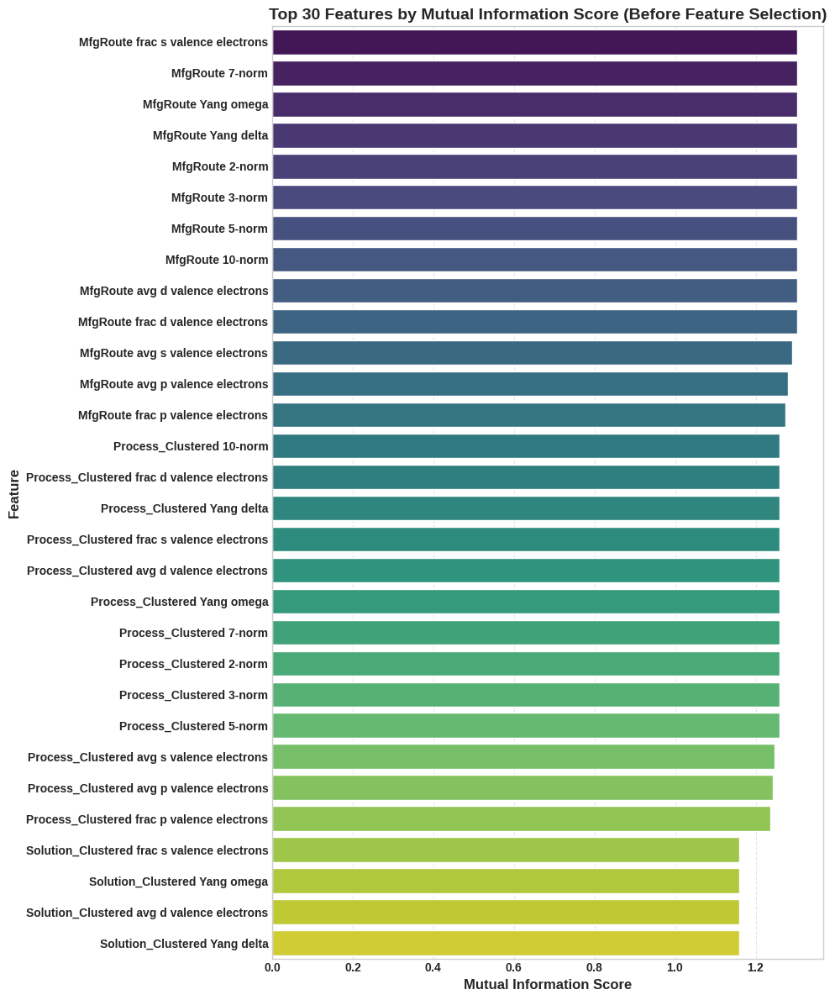


Features selected for NN training (35): ['0-norm avg f valence electrons', '2-norm avg f valence electrons', 'avg d valence electrons avg f valence electrons', '0-norm frac s valence electrons', 'avg p valence electrons frac d valence electrons', 'avg d valence electrons frac d valence electrons', 'T[oC]', 'Miedema_deltaH_inter avg f valence electrons', 'LUMO_energy frac p valence electrons', '1/t', 'avg d valence electrons frac f valence electrons', 'avg d valence electrons', 't_squared', 'avg s valence electrons frac f valence electrons', 'Solution_Clustered frac f valence electrons', 'T_t_interaction', 'Coolingmedium_Clustered', '10-norm avg f valence electrons', 'MfgRoute', '0-norm frac p valence electrons', 'Solution_Clustered avg f valence electrons', 'avg d valence electrons frac s valence electrons', 'avg d valence electrons frac p valence electrons', 'T_squared', 't[hr]', 'Solution_Clustered', 'HOMO_energy avg f valence electrons', 'frac d valence electrons frac f valence ele

/tmp/ipykernel_11427/362393477.py:223: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mi_series_sorted.sort_values(ascending=False).values, y=mi_series_sorted.sort_values(ascending=False).index, palette='viridis')


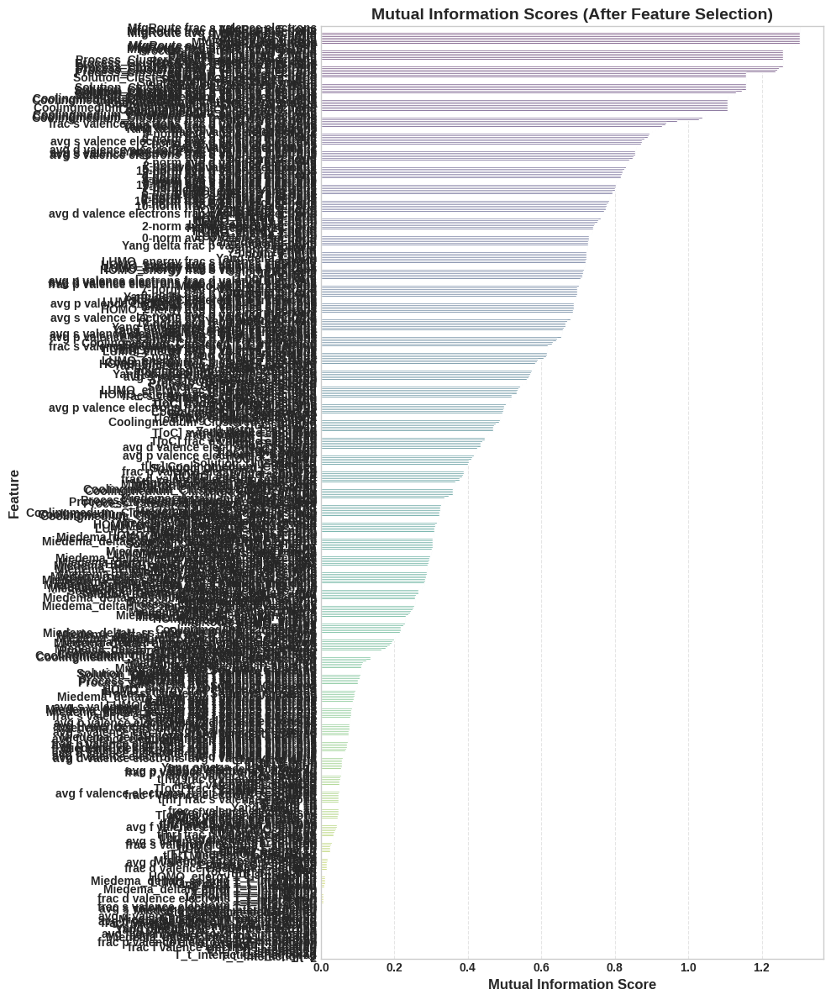

Mask high sum: 8, n_high_samples: 83
y_transformed shape: (287, 1), synth_y shape: (83, 1)
input dim: 35
Warmup Epoch 10/50, Loss: 0.2427
Warmup Epoch 20/50, Loss: 0.2248
Warmup Epoch 30/50, Loss: 0.2086
Warmup Epoch 40/50, Loss: 0.1831
Warmup Epoch 50/50, Loss: 0.1636

Beginning model training...
Epoch 1/1500, Train Loss: 0.1554, Val Loss: 0.1327


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 10/1500, Train Loss: 0.1091, Val Loss: 0.0999
Epoch 20/1500, Train Loss: 0.0893, Val Loss: 0.0899
Epoch 30/1500, Train Loss: 0.0804, Val Loss: 0.0789
Epoch 40/1500, Train Loss: 0.0706, Val Loss: 0.0736
Epoch 50/1500, Train Loss: 0.0626, Val Loss: 0.0740
Epoch 60/1500, Train Loss: 0.0616, Val Loss: 0.0703
Epoch 70/1500, Train Loss: 0.0613, Val Loss: 0.0645
Epoch 80/1500, Train Loss: 0.0645, Val Loss: 0.0688
Epoch 90/1500, Train Loss: 0.0558, Val Loss: 0.0623
Epoch 100/1500, Train Loss: 0.0544, Val Loss: 0.0534
Epoch 110/1500, Train Loss: 0.0547, Val Loss: 0.0473
Epoch 120/1500, Train Loss: 0.0512, Val Loss: 0.0481
Epoch 130/1500, Train Loss: 0.0486, Val Loss: 0.0435
Epoch 140/1500, Train Loss: 0.0499, Val Loss: 0.0429
Epoch 150/1500, Train Loss: 0.0560, Val Loss: 0.0364
Epoch 160/1500, Train Loss: 0.0474, Val Loss: 0.0387
Epoch 170/1500, Train Loss: 0.0428, Val Loss: 0.0399
Epoch 180/1500, Train Loss: 0.0432, Val Loss: 0.0388
Epoch 190/1500, Train Loss: 0.0443, Val Loss: 0.0351
Ep

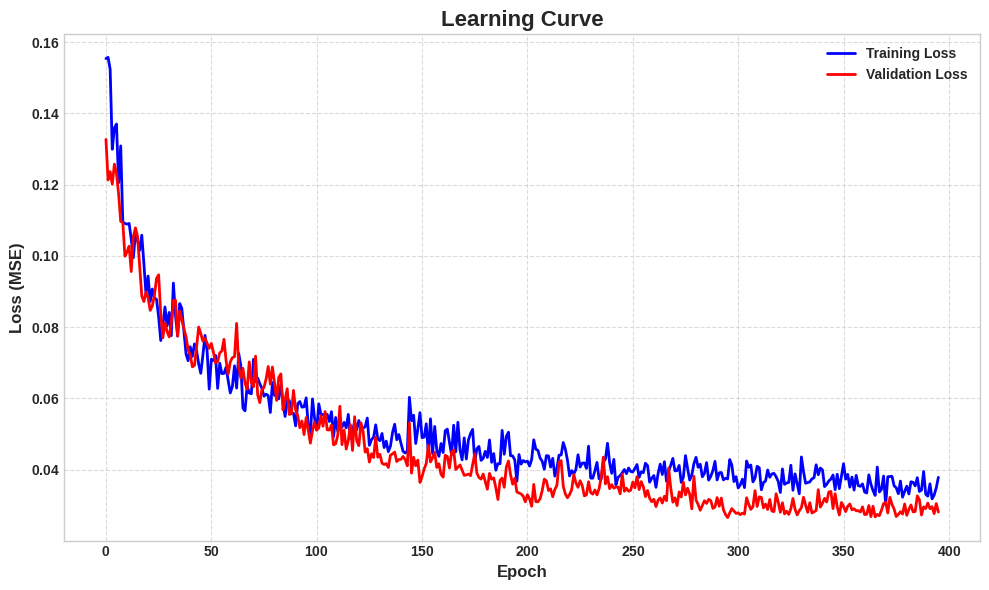


--- Model Performance ---
Train R2: 0.9266, MAE: 0.0317, MAPE: 59.25%, MSE: 0.0102
Validation R2: 0.8983, MAE: 0.0341, MAPE: 56.83%, MSE: 0.0121


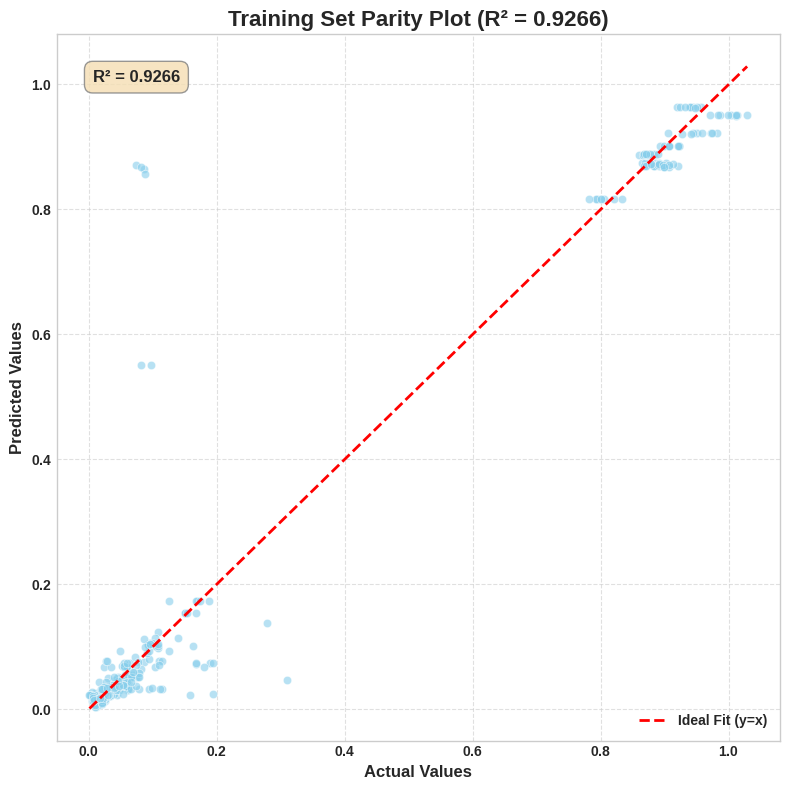

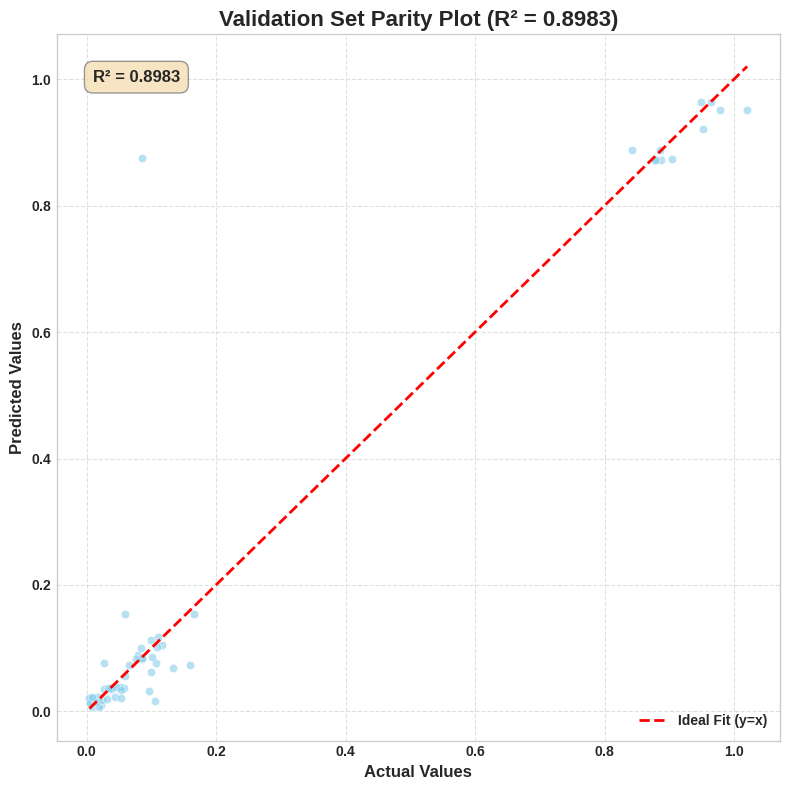

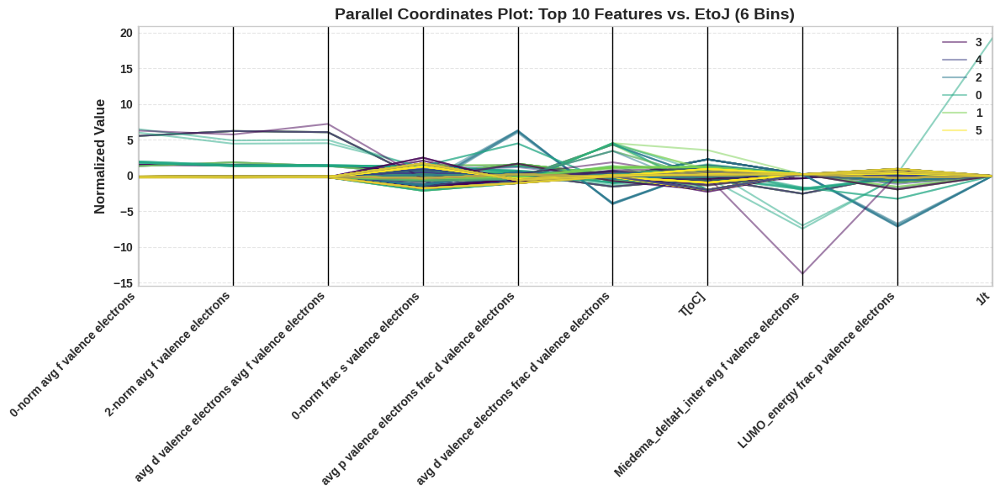

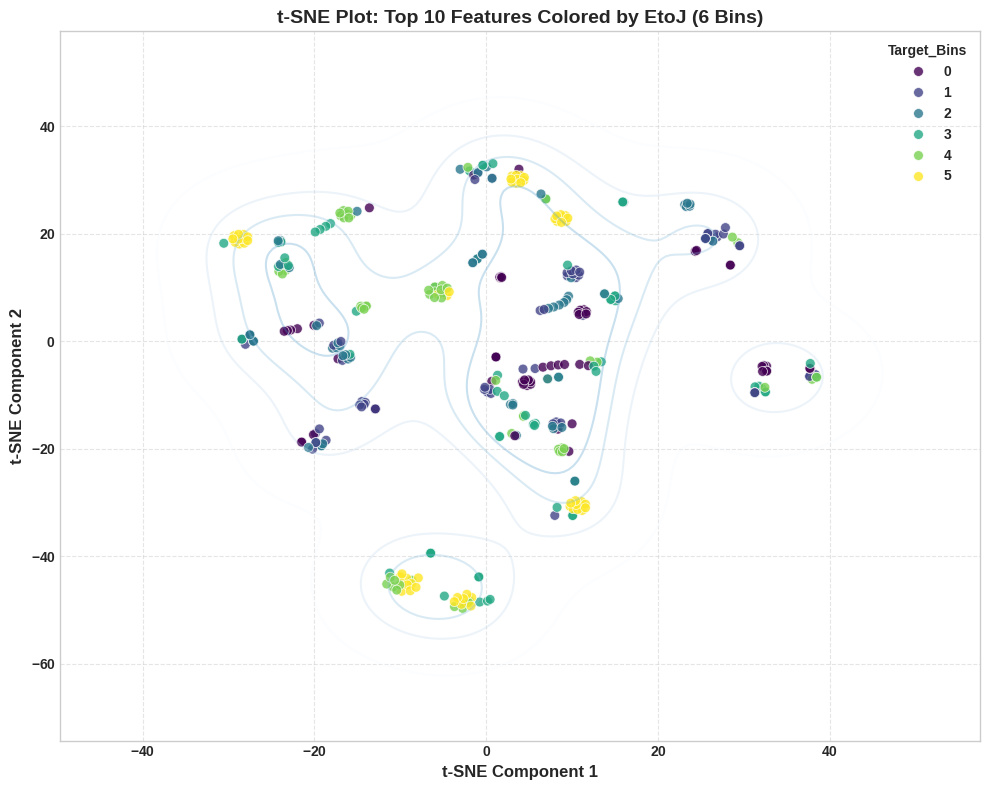

In [53]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import mutual_info_regression, RFE
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler, PolynomialFeatures, StandardScaler
from sklearn.manifold import TSNE
from pandas.plotting import parallel_coordinates
import matplotlib.pyplot as plt
import seaborn as sns
import sys
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# Set consistent style and random seed for reproducibility
plt.style.use('seaborn-whitegrid')
sns.set_palette('viridis')
np.random.seed(42)
torch.manual_seed(42)

# Define constants
input_file = 'corrosion_refined.csv'
TARGET_COLUMN = 'EtoJ'
label_encoded_discrete_features = [
    'MfgRoute',
    'Process_Clustered',
    'Coolingmedium_Clustered',
    'Solution_Clustered'
]

def perform_mutual_information_analysis(input_csv_file: str, target_col: str, discrete_features: list, X_poly, y):
    """Calculates Mutual Information scores and visualizes top features."""
    # Ensure numeric data and handle NaNs
    for col in X_poly.columns:
        X_poly[col] = pd.to_numeric(X_poly[col], errors='coerce')
    y = pd.to_numeric(y, errors='coerce')
    combined_df = pd.concat([X_poly, pd.Series(y, name=target_col)], axis=1).dropna()
    X_poly = combined_df.drop(columns=[target_col])
    y = combined_df[target_col]
    
    if X_poly.empty or y.empty:
        print("Error: No valid data remaining after handling NaNs.")
        sys.exit(1)

    print(f"\nPrepared data for MI analysis: X_poly shape {X_poly.shape}, y shape {y.shape}")
    discrete_features_indices = [i for i, col in enumerate(X_poly.columns) if any(orig in col for orig in discrete_features)]
    print(f"Identified {len(discrete_features_indices)} discrete features: {[X_poly.columns[i] for i in discrete_features_indices]}")

    print("\nCalculating Mutual Information scores...")
    mi_scores = mutual_info_regression(X_poly, y, discrete_features=discrete_features_indices, random_state=42)
    mi_series = pd.Series(mi_scores, index=X_poly.columns)
    mi_series_sorted = mi_series.sort_values(ascending=False)

    print("\nMutual Information Scores (Top 20):")
    print(mi_series_sorted.head(20))

    # Visualize Mutual Information Scores
    plt.figure(figsize=(10, 12))
    sns.barplot(x=mi_series_sorted.head(30).values, y=mi_series_sorted.head(30).index, palette='viridis')
    plt.title('Top 30 Features by Mutual Information Score (Before Feature Selection)', fontsize=14)
    plt.xlabel('Mutual Information Score', fontsize=12)
    plt.ylabel('Feature', fontsize=12)
    plt.grid(axis='x', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

    return X_poly, y, mi_series_sorted

class RegressionNN(nn.Module):
    """Neural Network for regression tasks."""
    def __init__(self, input_dim):
        print("input dim:", input_dim)

        super(RegressionNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, 256)
        self.bn1 = nn.BatchNorm1d(256)
        self.fc2 = nn.Linear(256, 128)
        self.bn2 = nn.BatchNorm1d(128)
        self.fc3 = nn.Linear(128, 64)
        self.bn3 = nn.BatchNorm1d(64)
        self.fc4 = nn.Linear(64, 32)
        self.dropout = nn.Dropout(0.4)
        self.fc5 = nn.Linear(32, 1)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.relu(self.bn1(self.fc1(x)))
        x = self.dropout(x)
        x = self.relu(self.bn2(self.fc2(x)))
        x = self.dropout(x)
        x = self.relu(self.bn3(self.fc3(x)))
        x = self.relu(self.fc4(x))
        x = self.fc5(x)
        return x

# class WeightedMSELoss(nn.Module):
#     def __init__(self):
#         super(WeightedMSELoss, self).__init__()

#     def forward(self, predictions, targets):
#         weights = 1.0 + 1.0 * torch.sigmoid((targets - 0.6) / 0.1)
#         loss = (weights * (predictions - targets) ** 2).mean()
#         return loss

class WeightedMAELoss(nn.Module):
    def __init__(self):
        super(WeightedMAELoss, self).__init__()

    def forward(self, predictions, targets):
        weights = 1.0 + 0.50 * torch.sigmoid((targets - 0.4) / 0.1)
        loss = torch.mean(weights * torch.abs(predictions - targets))
        return loss

criterion = WeightedMAELoss()






def train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs=1500, patience=100):
    """Trains the model with early stopping and learning rate scheduling."""
    train_losses, val_losses = [], []
    best_val_loss = float('inf')
    patience_counter = 0
    
    print("\nBeginning model training...")
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        for inputs, targets in train_loader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
            running_loss += loss.item() * inputs.size(0)
        epoch_train_loss = running_loss / len(train_loader.dataset)
        train_losses.append(epoch_train_loss)

        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for inputs, targets in val_loader:
                outputs = model(inputs)
                loss = criterion(outputs, targets)
                val_loss += loss.item() * inputs.size(0)
        epoch_val_loss = val_loss / len(val_loader.dataset)
        val_losses.append(epoch_val_loss)
        
        scheduler.step(epoch_val_loss)
        if epoch_val_loss < best_val_loss:
            best_val_loss = epoch_val_loss
            patience_counter = 0
            torch.save(model.state_dict(), 'best_model.pth')
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"Early stopping at epoch {epoch+1}")
                break
        
        if (epoch + 1) % 10 == 0 or epoch == 0:
            print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}")
    
    print("Model training complete.")
    return train_losses, val_losses

def evaluate_model(model, data_loader, transform_back=None):
    """Evaluates the model and returns performance metrics."""
    model.eval()
    predictions, actuals = [], []
    with torch.no_grad():
        for inputs, targets in data_loader:
            outputs = model(inputs)
            if transform_back:
                outputs = transform_back(outputs)
                targets = transform_back(targets)
            predictions.extend(outputs.squeeze().tolist())
            actuals.extend(targets.squeeze().tolist())
    r2 = r2_score(actuals, predictions)
    mae = mean_absolute_error(actuals, predictions)
    mape = np.mean(np.abs((np.array(actuals) - np.array(predictions)) / np.array(actuals)) * 100)
    mse = mean_squared_error(actuals, predictions)
    return np.array(actuals), np.array(predictions), r2, mae, mape, mse

def plot_learning_curve(train_losses, val_losses):
    """Plots the learning curve for training and validation loss."""
    plt.figure(figsize=(10, 6))
    plt.plot(train_losses, label='Training Loss', color='blue', linewidth=2)
    plt.plot(val_losses, label='Validation Loss', color='red', linewidth=2)
    plt.title('Learning Curve', fontsize=16)
    plt.xlabel('Epoch', fontsize=12)
    plt.ylabel('Loss (MSE)', fontsize=12)
    plt.legend(fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

def plot_parity(actuals, predictions, r2, title="Parity Plot"):
    """Plots a parity plot comparing actual vs predicted values."""
    plt.figure(figsize=(8, 8))
    plt.scatter(actuals, predictions, alpha=0.6, color='skyblue', edgecolors='w', linewidth=0.5)
    min_val = min(actuals.min(), predictions.min())
    max_val = max(actuals.max(), predictions.max())
    plt.plot([min_val, max_val], [min_val, max_val], 'r--', label='Ideal Fit (y=x)', linewidth=2)
    plt.title(f'{title} (R² = {r2:.4f})', fontsize=16)
    plt.xlabel('Actual Values', fontsize=12)
    plt.ylabel('Predicted Values', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.text(0.05, 0.95, f'R² = {r2:.4f}', transform=plt.gca().transAxes, fontsize=12,
             verticalalignment='top', bbox=dict(boxstyle='round,pad=0.5', fc='wheat', alpha=0.8, ec='gray'))
    plt.legend(fontsize=10, loc='lower right')
    plt.tight_layout()
    plt.show()

def plot_mi_after_selection(mi_series_selected):
    """Plots Mutual Information scores after feature selection."""
    plt.figure(figsize=(10, 12))
    sns.barplot(x=mi_series_sorted.sort_values(ascending=False).values, y=mi_series_sorted.sort_values(ascending=False).index, palette='viridis')
    plt.title('Mutual Information Scores (After Feature Selection)', fontsize=14)
    plt.xlabel('Mutual Information Score', fontsize=12)
    plt.ylabel('Feature', fontsize=12)
    plt.grid(axis='x', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    # Load and preprocess data
    try:
        df_nn = pd.read_csv(input_file)
        print(f"Successfully loaded '{input_file}' with shape: {df_nn.shape}")
    except FileNotFoundError:
        print(f"Error: '{input_file}' not found. Please ensure the file exists in the current directory.")
        sys.exit(1)
    except Exception as e:
        print(f"An error occurred while loading the CSV: {e}")
        sys.exit(1)

    X_nn_raw = df_nn.drop(columns=[TARGET_COLUMN])
    y_nn_raw = df_nn[TARGET_COLUMN].values.ravel()

    # Ensure numeric data and handle NaNs
    for col in X_nn_raw.columns:
        X_nn_raw[col] = pd.to_numeric(X_nn_raw[col], errors='coerce').fillna(0)
    y_nn_raw = pd.to_numeric(y_nn_raw, errors='coerce')

    # Feature Engineering with Domain Knowledge
    X_nn_raw['T_t_interaction'] = X_nn_raw['T[oC]'] * X_nn_raw['t[hr]']
    X_nn_raw['T_squared'] = X_nn_raw['T[oC]'] ** 2
    X_nn_raw['t_squared'] = X_nn_raw['t[hr]'] ** 2
    X_nn_raw['1/t'] = 1.0 / (X_nn_raw['t[hr]'] + 1e-6)

    # Polynomial Features
    poly = PolynomialFeatures(degree=2, include_bias=False)
    X_poly = poly.fit_transform(X_nn_raw)
    feature_names_poly = poly.get_feature_names_out(X_nn_raw.columns)
    X_nn_filtered = pd.DataFrame(X_poly, columns=feature_names_poly)

    # Perform MI analysis on polynomial-expanded data
    X_poly_df, y_poly, mi_series_sorted = perform_mutual_information_analysis(input_file, TARGET_COLUMN, label_encoded_discrete_features, X_nn_filtered, y_nn_raw)

    # Feature Selection with RFE
    X_mi = X_nn_filtered.copy()
    y_mi = y_poly.values
    estimator = LinearRegression()
    selector = RFE(estimator, n_features_to_select=25, step=1)
    selector = selector.fit(X_mi, y_mi)
    selected_features_rfe = X_mi.columns[selector.support_].tolist()
    all_process_params_explicit = ['T[oC]', 't[hr]', 'T_t_interaction', 'T_squared', 't_squared', '1/t'] + label_encoded_discrete_features
    selected_features_for_nn = list(set(all_process_params_explicit + selected_features_rfe))

    X_nn_filtered = X_nn_filtered[selected_features_for_nn]
    print(f"\nFeatures selected for NN training ({len(selected_features_for_nn)}): {selected_features_for_nn}")

    # Plot MI scores after feature selection
    mi_series_selected = mi_series_sorted[mi_series_sorted.index.isin(selected_features_for_nn)]
    plot_mi_after_selection(mi_series_selected)

    # Scaling and Data Preparation with Transformation
    nn_scaler = StandardScaler()
    X_scaled_nn = nn_scaler.fit_transform(X_nn_filtered)

    # Log-transform the target to handle skewed distribution
    y_before_synth = y_nn_raw.copy()
    y_transformed = np.log1p(y_nn_raw.reshape(-1, 1))
    transform_back = lambda x: np.expm1(x)

    # Add synthetic samples with noise for minority range (e.g., > 0.6)
    mask_high = y_nn_raw > 0.6
    n_high_samples = int(0.3 * np.sum(~mask_high))
    print(f"Mask high sum: {np.sum(mask_high)}, n_high_samples: {n_high_samples}")
    if np.sum(mask_high) > 0 and n_high_samples > 0:
        high_indices = np.where(mask_high)[0]
        high_X = X_scaled_nn[high_indices]
        high_y = y_transformed[high_indices]
        synth_indices = np.random.choice(len(high_indices), n_high_samples, replace=True)
        synth_X = high_X[synth_indices] + np.random.normal(0, 0.01, size=(n_high_samples, high_X.shape[1]))
        synth_y = high_y[synth_indices].ravel() + np.random.normal(0, 0.01, size=n_high_samples)
        synth_y = synth_y.reshape(-1, 1)
        print(f"y_transformed shape: {y_transformed.shape}, synth_y shape: {synth_y.shape}")
        X_scaled_nn = np.vstack([X_scaled_nn, synth_X])
        y_transformed = np.vstack([y_transformed, synth_y])

    # Validate shapes
    if X_scaled_nn.shape[0] != y_transformed.shape[0]:
        raise ValueError(f"Shape mismatch: X_scaled_nn has {X_scaled_nn.shape[0]} samples, y_transformed has {y_transformed.shape[0]} samples")

    # Check for NaNs
    if np.any(np.isnan(X_scaled_nn)) or np.any(np.isnan(y_transformed)):
        print("Warning: NaN values detected in data. Replacing with 0.")
        X_scaled_nn = np.nan_to_num(X_scaled_nn, nan=0.0)
        y_transformed = np.nan_to_num(y_transformed, nan=0.0)

    X_tensor = torch.tensor(X_scaled_nn, dtype=torch.float32)
    y_tensor = torch.tensor(y_transformed, dtype=torch.float32)
    X_train, X_val, y_train, y_val = train_test_split(X_tensor, y_tensor, test_size=0.15, random_state=42)

    # DataLoaders
    train_dataset = TensorDataset(X_train, y_train)
    val_dataset = TensorDataset(X_val, y_val)
    train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)

    # Model Initialization with learning rate warmup
    input_dim = X_train.shape[1]
    model = RegressionNN(input_dim)
    criterion = criterion #WeightedMAELoss() #WeightedMSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=500)

    # Warmup phase
    warmup_epochs = 50
    for epoch in range(warmup_epochs):
        model.train()
        running_loss = 0.0
        for inputs, targets in train_loader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
            running_loss += loss.item() * inputs.size(0)
        epoch_loss = running_loss / len(train_loader.dataset)
        if (epoch + 1) % 10 == 0:
            print(f"Warmup Epoch {epoch+1}/{warmup_epochs}, Loss: {epoch_loss:.4f}")
        lr = 0.0001 * (epoch + 1) / warmup_epochs
        for param_group in optimizer.param_groups:
            param_group['lr'] = lr

    # Train and Evaluate
    train_losses, val_losses = train_model(model, train_loader, val_loader, criterion, optimizer, scheduler)
    plot_learning_curve(train_losses, val_losses)
    train_actuals, train_predictions, train_r2, train_mae, train_mape, train_mse = evaluate_model(model, train_loader, transform_back)
    val_actuals, val_predictions, val_r2, val_mae, val_mape, val_mse = evaluate_model(model, val_loader, transform_back)

    print(f"\n--- Model Performance ---")
    print(f"Train R2: {train_r2:.4f}, MAE: {train_mae:.4f}, MAPE: {train_mape:.2f}%, MSE: {train_mse:.4f}")
    print(f"Validation R2: {val_r2:.4f}, MAE: {val_mae:.4f}, MAPE: {val_mape:.2f}%, MSE: {val_mse:.4f}")

    # Parity Plots
    plot_parity(train_actuals, train_predictions, train_r2, title="Training Set Parity Plot")
    plot_parity(val_actuals, val_predictions, val_r2, title="Validation Set Parity Plot")

    # Enhanced Parallel Coordinates Plot
    plot_df = pd.DataFrame(X_scaled_nn, columns=selected_features_for_nn)
    plot_df[TARGET_COLUMN] = np.expm1(y_transformed)
    plot_df['Target_Bins'] = pd.qcut(plot_df[TARGET_COLUMN], q=6, labels=False, duplicates='drop')
    features_for_parallel = selected_features_for_nn[:10]
    all_cols_for_parallel = features_for_parallel + ['Target_Bins']
    df_plot_filtered = plot_df[all_cols_for_parallel].copy()
    scaler = StandardScaler()
    df_plot_filtered[features_for_parallel] = scaler.fit_transform(df_plot_filtered[features_for_parallel])
    plt.figure(figsize=(12, 6))
    parallel_coordinates(df_plot_filtered, 'Target_Bins', colormap='viridis', alpha=0.5)
    plt.title(f'Parallel Coordinates Plot: Top 10 Features vs. {TARGET_COLUMN} (6 Bins)', fontsize=14)
    plt.ylabel('Normalized Value', fontsize=12)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

    # Enhanced t-SNE Plot
    X_tsne_data = scaler.fit_transform(plot_df[features_for_parallel])
    tsne = TSNE(n_components=2, random_state=42, perplexity=15, n_iter=1000)
    X_tsne = tsne.fit_transform(X_tsne_data)
    tsne_df = pd.DataFrame(data=X_tsne, columns=['TSNE_Component_1', 'TSNE_Component_2'])
    tsne_df['Target_Bins'] = plot_df['Target_Bins']
    plt.figure(figsize=(10, 8))
    sns.scatterplot(x='TSNE_Component_1', y='TSNE_Component_2', hue='Target_Bins', palette='viridis', data=tsne_df, s=50, alpha=0.8)
    sns.kdeplot(x='TSNE_Component_1', y='TSNE_Component_2', data=tsne_df, cmap='Blues', alpha=0.3, levels=5)
    plt.title(f't-SNE Plot: Top 10 Features Colored by {TARGET_COLUMN} (6 Bins)', fontsize=14)
    plt.xlabel('t-SNE Component 1', fontsize=12)
    plt.ylabel('t-SNE Component 2', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

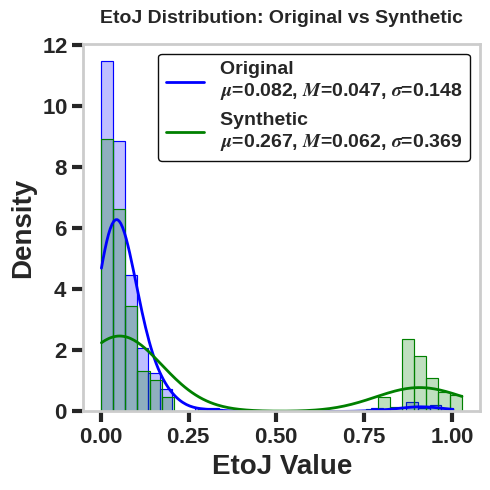

In [37]:
def plot_distribution(y_before, y_after, title_prefix="EtoJ Distribution"):
    """Plots a single figure comparing target distribution before and after synthetic data with enhanced styling and symbols."""
    # Calculate statistics
    stats_before = {'Mean': np.mean(y_before), 'Median': np.median(y_before), 'Std': np.std(y_before)}
    stats_after = {'Mean': np.mean(y_after), 'Median': np.median(y_after), 'Std': np.std(y_after)}

    # Create the plot
    plt.figure(figsize=(5, 5))
    ax = sns.histplot(y_before, kde=True, color='blue', bins=30, alpha=0.25, label='Original', stat='density',
                      line_kws={'linewidth': 2, 'alpha': 1}, edgecolor='blue')
    sns.histplot(y_after, kde=True, color='green', bins=30, alpha=0.25, label='Synthetic', stat='density',
                 line_kws={'linewidth': 2, 'alpha': 1}, edgecolor='green')

    # Customize axis tick lines and labels
    ax.tick_params(axis='both', which='major', length=8, width=3, labelsize=16, labelrotation=0, tick1On=True)
    ax.tick_params(axis='both', which='minor', length=3, width=1, labelsize=12, tick1On=True)
    
    # Make outer frame lines bold
    for spine in ax.spines.values():
        spine.set_linewidth(2.0)

    # Customize the plot
    plt.title(f'{title_prefix}: Original vs Synthetic', fontsize=14, pad=15)
    plt.xlabel('EtoJ Value', fontsize=20)
    plt.ylabel('Density', fontsize=20)
    plt.grid(False)

    # Merge legend with statistical annotations using symbols and two lines
    legend_labels = [
        f'Original \n$\mu$={stats_before["Mean"]:.3f}, $M$={stats_before["Median"]:.3f}, $\sigma$={stats_before["Std"]:.3f}',
        f'Synthetic \n$\mu$={stats_after["Mean"]:.3f}, $M$={stats_after["Median"]:.3f}, $\sigma$={stats_after["Std"]:.3f}'
    ]
    plt.legend(legend_labels, fontsize=14, frameon=True, edgecolor='black', facecolor='white', framealpha=0.95,
               title_fontsize=16)

    plt.tight_layout()
    plt.show()

    
# Plot distribution before and after synthetic data
plot_distribution(y_before_synth, np.expm1(y_transformed.ravel()), title_prefix="EtoJ Distribution")    

/tmp/ipykernel_11427/1406889058.py:19: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


Successfully loaded 'corrosion_refined.csv' with shape: (287, 28)

Prepared data for MI analysis: X_poly shape (287, 779), y shape (287,)
Identified 140 discrete features in X_poly for MI calculation: ['MfgRoute', 'MfgRoute T[oC]', 'MfgRoute t[hr]', 'MfgRoute Process_Clustered', 'MfgRoute Coolingmedium_Clustered', 'MfgRoute Solution_Clustered', 'MfgRoute HOMO_energy', 'MfgRoute LUMO_energy', 'MfgRoute Miedema_deltaH_inter', 'MfgRoute Miedema_deltaH_amor', 'MfgRoute Miedema_deltaH_ss_min', 'MfgRoute Yang omega', 'MfgRoute Yang delta', 'MfgRoute 0-norm', 'MfgRoute 2-norm', 'MfgRoute 3-norm', 'MfgRoute 5-norm', 'MfgRoute 7-norm', 'MfgRoute 10-norm', 'MfgRoute avg s valence electrons', 'MfgRoute avg p valence electrons', 'MfgRoute avg d valence electrons', 'MfgRoute avg f valence electrons', 'MfgRoute frac s valence electrons', 'MfgRoute frac p valence electrons', 'MfgRoute frac d valence electrons', 'MfgRoute frac f valence electrons', 'MfgRoute T_t_interaction', 'MfgRoute T_squared', 'Mf

/tmp/ipykernel_11427/1406889058.py:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mi_series_sorted.head(30).values, y=mi_series_sorted.head(30).index, palette='viridis')


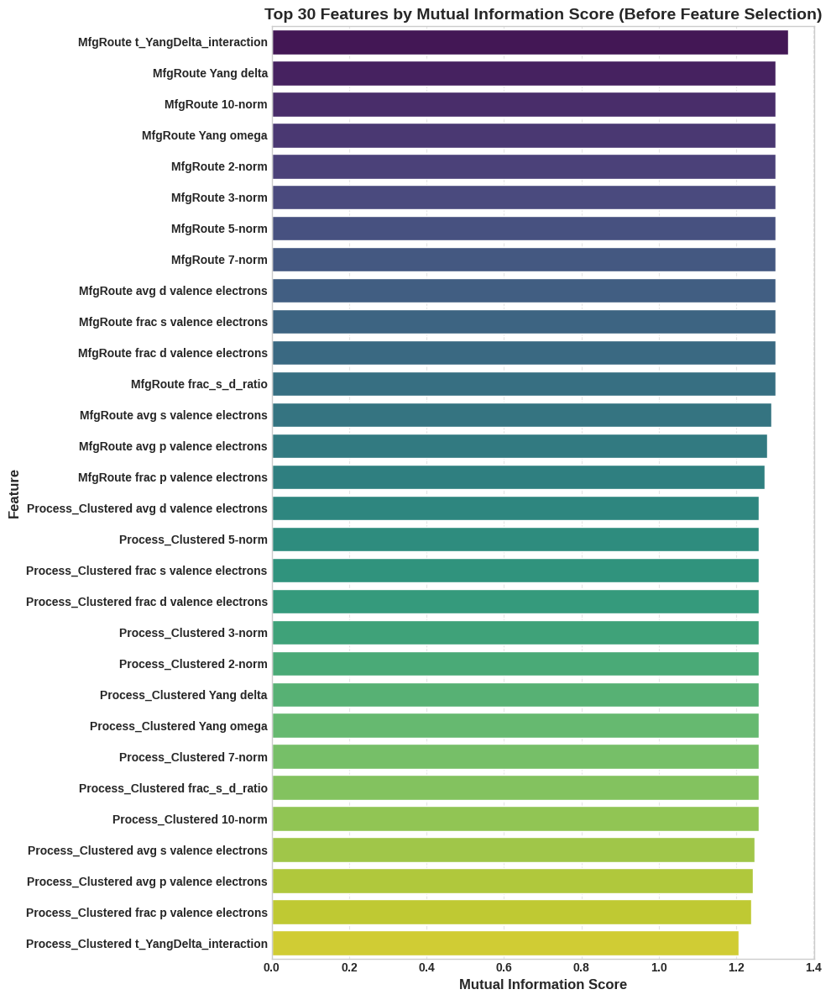


Features selected for NN training (40): ['frac d valence electrons', 'Yang delta', 'MfgRoute frac p valence electrons', 'T[oC]', 'avg s valence electrons', 'frac_s_d_ratio', 'frac d valence electrons frac_s_d_ratio', 'T_LUMO_interaction', 'T_Miedema_deltaH_amor_interaction', '1/t', 'frac s valence electrons frac d valence electrons', 'T_YangDelta_interaction', 'avg d valence electrons', 't_squared', 'frac s valence electrons^2', 'frac_s_d_ratio^2', 'frac d valence electrons^2', 'T_t_interaction', 'MfgRoute avg s valence electrons', 'Coolingmedium_Clustered', 'frac s valence electrons frac_s_d_ratio', 'avg d valence electrons frac_s_d_ratio', 'MfgRoute frac s valence electrons', 'Yang delta frac d valence electrons', 'T_HOMO_interaction', 'HOMO_LUMO_gap', 'MfgRoute', 'avg d valence electrons frac s valence electrons', 'frac s valence electrons', 't[hr]', 'T_squared', 'Solution_Clustered', 'avg s valence electrons frac_s_d_ratio', 'MfgRoute frac d valence electrons', 't_YangDelta_intera

/tmp/ipykernel_11427/1406889058.py:236: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mi_series_selected_sorted.values, y=mi_series_selected_sorted.index, palette='viridis')


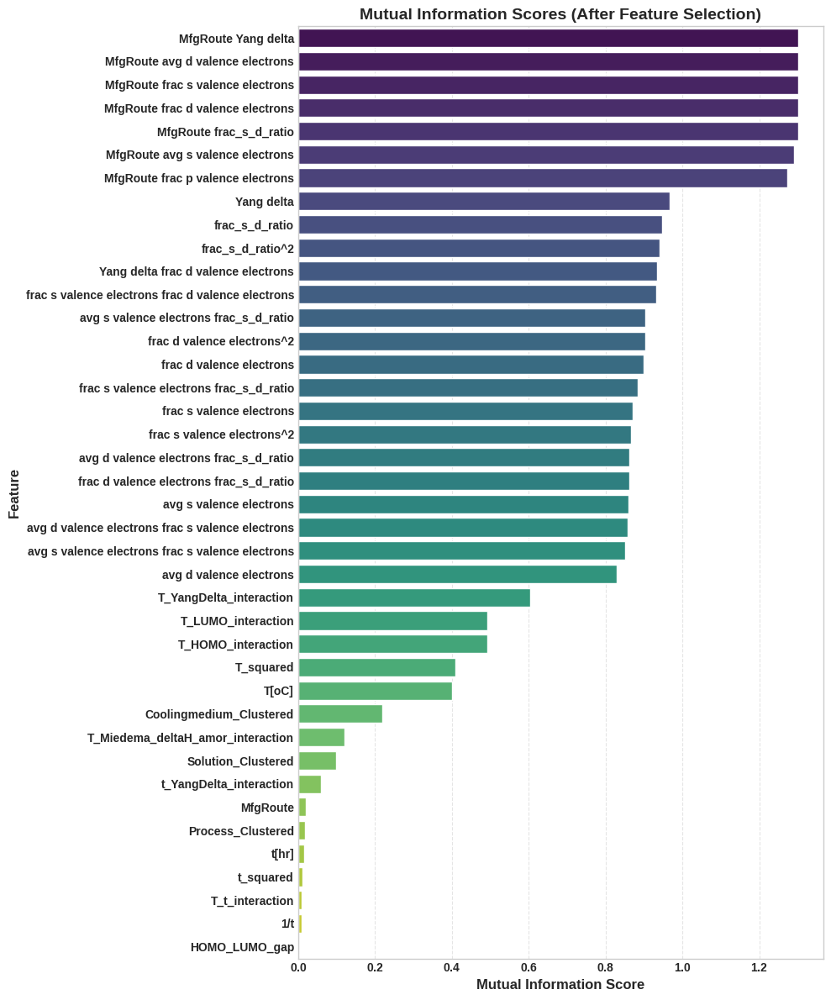

Mask high sum (samples > 0.6): 8, target synthetic samples: 83
y_transformed shape before synthesis: (287, 1), synth_y shape: (83, 1)
Data shape after synthesis: X_scaled_nn (370, 40), y_transformed (370, 1)
input dim: 40

Beginning LR Warmup phase...
Warmup Epoch 1/50, Loss: 0.2486, LR: 0.000100
Warmup Epoch 10/50, Loss: 0.1473, LR: 0.000262
Warmup Epoch 20/50, Loss: 0.1166, LR: 0.000442


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Warmup Epoch 30/50, Loss: 0.0978, LR: 0.000622
Warmup Epoch 40/50, Loss: 0.0800, LR: 0.000802
Warmup Epoch 50/50, Loss: 0.0819, LR: 0.000982
LR Warmup phase complete.

Beginning model training...
Epoch 1/1500, Train Loss: 0.0814, Val Loss: 0.0977
Epoch 10/1500, Train Loss: 0.0750, Val Loss: 0.0893
Epoch 20/1500, Train Loss: 0.0706, Val Loss: 0.0843
Epoch 30/1500, Train Loss: 0.0623, Val Loss: 0.0838
Epoch 40/1500, Train Loss: 0.0593, Val Loss: 0.0804
Epoch 50/1500, Train Loss: 0.0542, Val Loss: 0.0775
Epoch 60/1500, Train Loss: 0.0544, Val Loss: 0.0739
Epoch 70/1500, Train Loss: 0.0543, Val Loss: 0.0756
Epoch 80/1500, Train Loss: 0.0532, Val Loss: 0.0722
Epoch 90/1500, Train Loss: 0.0526, Val Loss: 0.0665
Epoch 100/1500, Train Loss: 0.0462, Val Loss: 0.0602
Epoch 110/1500, Train Loss: 0.0477, Val Loss: 0.0620
Epoch 120/1500, Train Loss: 0.0481, Val Loss: 0.0604
Epoch 130/1500, Train Loss: 0.0481, Val Loss: 0.0507
Epoch 140/1500, Train Loss: 0.0447, Val Loss: 0.0465
Epoch 150/1500, Trai

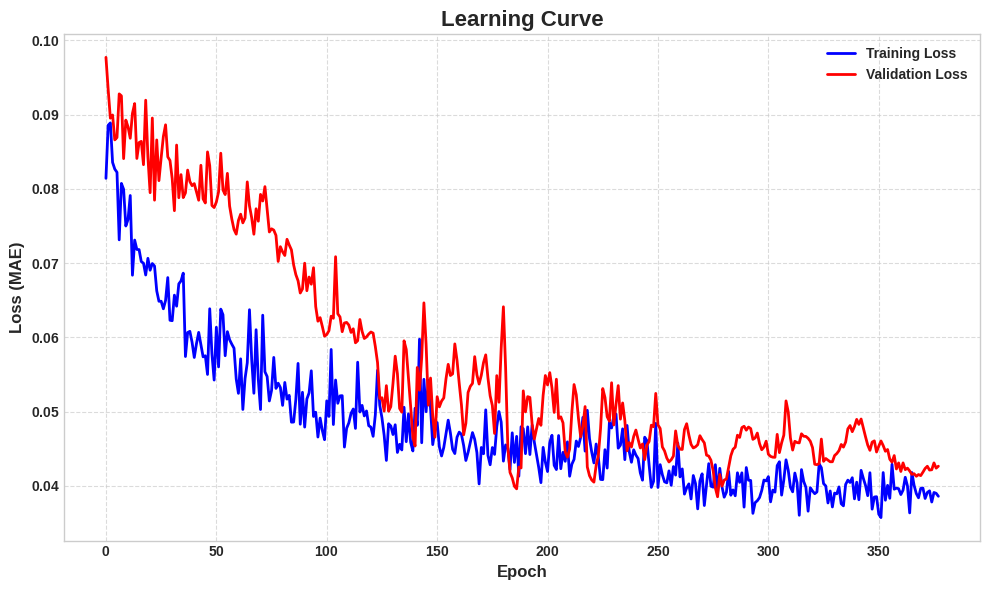


--- Model Performance ---
Train R2: 0.8485, MAE: 0.0438, MAPE: 71.27%, MSE: 0.0210
Validation R2: 0.8158, MAE: 0.0493, MAPE: 84.59%, MSE: 0.0216


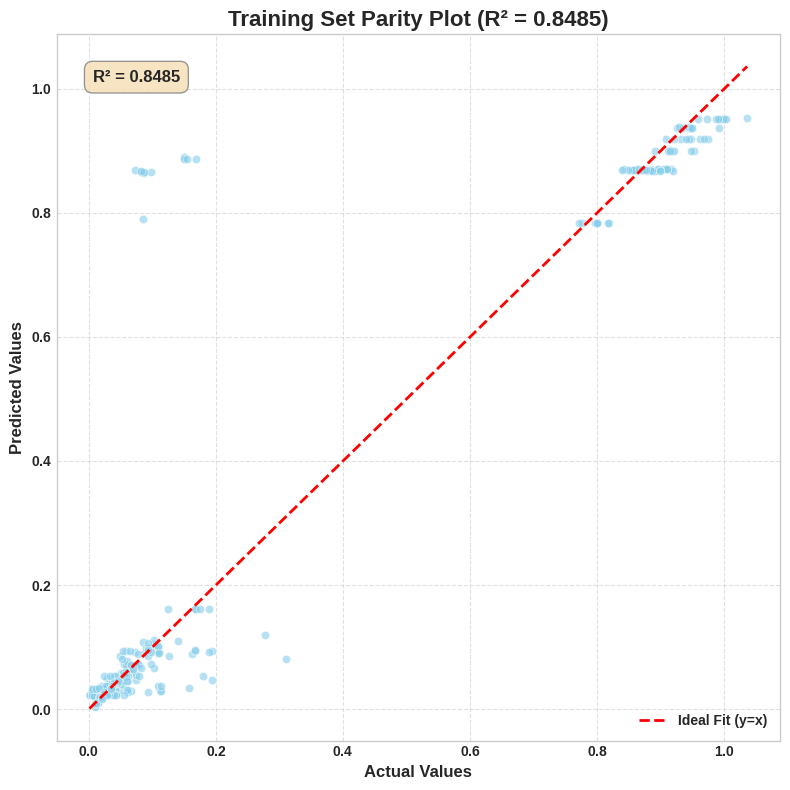

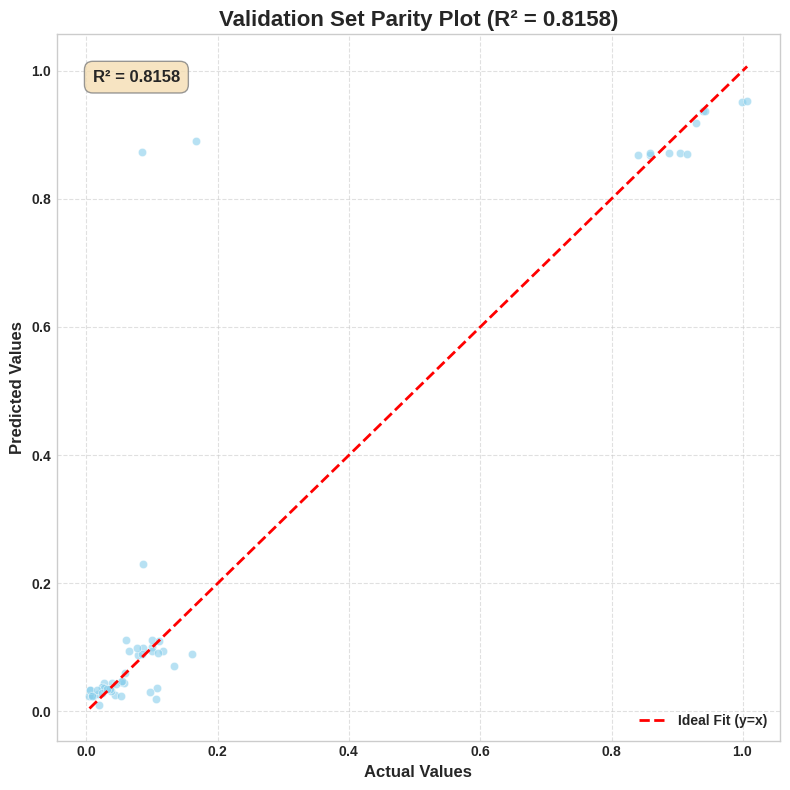

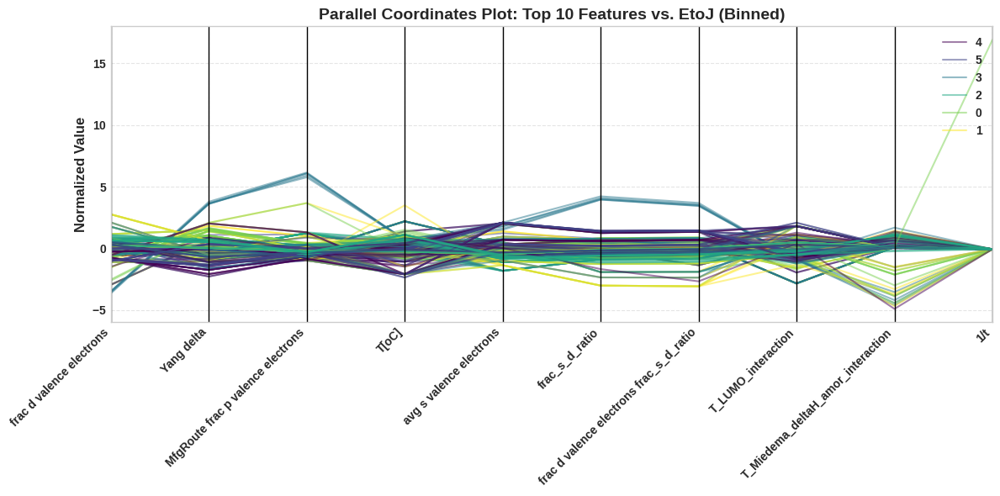

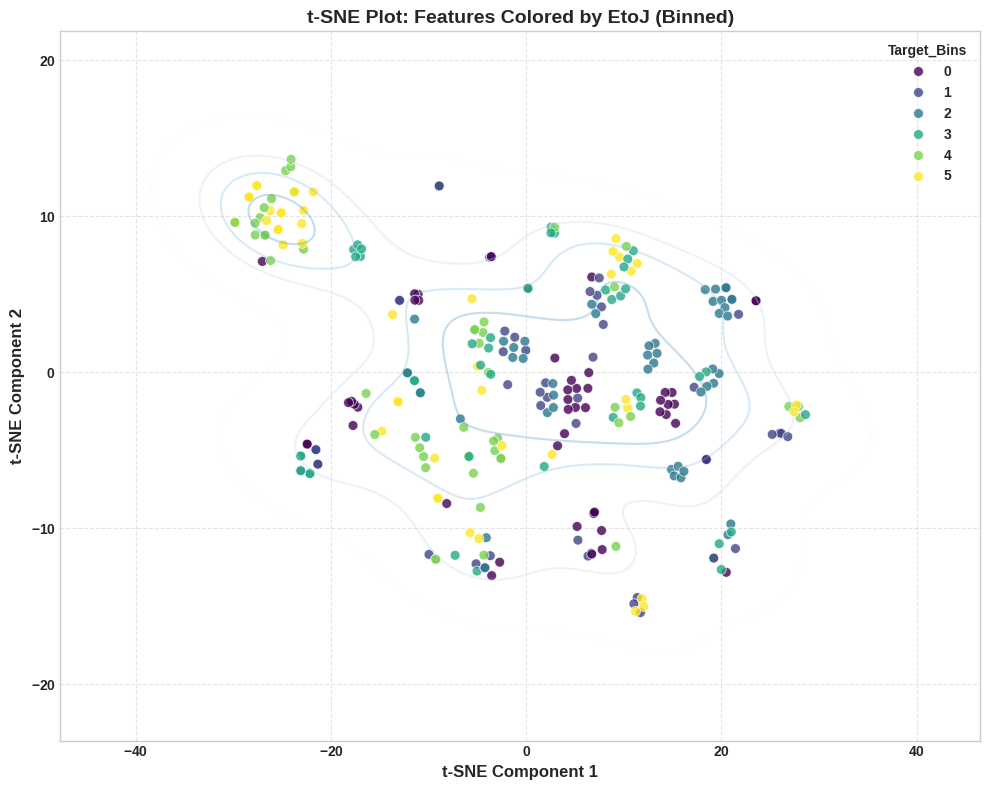

In [58]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import mutual_info_regression, RFE
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler, PolynomialFeatures, StandardScaler
from sklearn.manifold import TSNE
from pandas.plotting import parallel_coordinates
import matplotlib.pyplot as plt
import seaborn as sns
import sys
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# Set consistent style and random seed for reproducibility
plt.style.use('seaborn-whitegrid')
sns.set_palette('viridis')
np.random.seed(42)
torch.manual_seed(42)

# Define constants
input_file = 'corrosion_refined.csv'
TARGET_COLUMN = 'EtoJ'
label_encoded_discrete_features = [
    'MfgRoute',
    'Process_Clustered',
    'Coolingmedium_Clustered',
    'Solution_Clustered'
]

def perform_mutual_information_analysis(input_csv_file: str, target_col: str, discrete_features: list, X_poly, y):
    """Calculates Mutual Information scores and visualizes top features."""
    # Ensure numeric data and handle NaNs
    for col in X_poly.columns:
        X_poly[col] = pd.to_numeric(X_poly[col], errors='coerce')
    y = pd.to_numeric(y, errors='coerce')
    combined_df = pd.concat([X_poly, pd.Series(y, name=target_col)], axis=1).dropna()
    X_poly = combined_df.drop(columns=[target_col])
    y = combined_df[target_col]
    
    if X_poly.empty or y.empty:
        print("Error: No valid data remaining after handling NaNs.")
        sys.exit(1)

    print(f"\nPrepared data for MI analysis: X_poly shape {X_poly.shape}, y shape {y.shape}")
    
    # Identify discrete features within the potentially expanded X_poly columns
    # We need to map the original discrete_features to their corresponding columns in X_poly
    actual_discrete_cols_in_X_poly = []
    for orig_disc_feat in discrete_features:
        # Check for exact match or if it's part of a polynomial feature name
        for col_in_poly in X_poly.columns:
            if orig_disc_feat == col_in_poly or f"{orig_disc_feat} " in col_in_poly: # Add space to avoid partial matches
                actual_discrete_cols_in_X_poly.append(col_in_poly)
    
    # Convert column names to their integer indices for mutual_info_regression
    discrete_features_indices = [X_poly.columns.get_loc(col) for col in actual_discrete_cols_in_X_poly if col in X_poly.columns]
    
    print(f"Identified {len(discrete_features_indices)} discrete features in X_poly for MI calculation: {[X_poly.columns[i] for i in discrete_features_indices]}")

    print("\nCalculating Mutual Information scores...")
    mi_scores = mutual_info_regression(X_poly, y, discrete_features=discrete_features_indices, random_state=42)
    mi_series = pd.Series(mi_scores, index=X_poly.columns)
    mi_series_sorted = mi_series.sort_values(ascending=False)

    print("\nMutual Information Scores (Top 20):")
    print(mi_series_sorted.head(20))

    # Visualize Mutual Information Scores
    plt.figure(figsize=(10, 12))
    sns.barplot(x=mi_series_sorted.head(30).values, y=mi_series_sorted.head(30).index, palette='viridis')
    plt.title('Top 30 Features by Mutual Information Score (Before Feature Selection)', fontsize=14)
    plt.xlabel('Mutual Information Score', fontsize=12)
    plt.ylabel('Feature', fontsize=12)
    plt.grid(axis='x', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

    return X_poly, y, mi_series_sorted

class RegressionNN(nn.Module):
    """Neural Network for regression tasks."""
    def __init__(self, input_dim):
        print("input dim:", input_dim)

        super(RegressionNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, 256)
        self.bn1 = nn.BatchNorm1d(256)
        self.fc2 = nn.Linear(256, 128)
        self.bn2 = nn.BatchNorm1d(128)
        self.fc3 = nn.Linear(128, 64)
        self.bn3 = nn.BatchNorm1d(64)
        self.fc4 = nn.Linear(64, 32)
        self.dropout = nn.Dropout(0.4)
        self.fc5 = nn.Linear(32, 1)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.relu(self.bn1(self.fc1(x)))
        x = self.dropout(x)
        x = self.relu(self.bn2(self.fc2(x)))
        x = self.dropout(x)
        x = self.relu(self.bn3(self.fc3(x)))
        x = self.relu(self.fc4(x))
        x = self.fc5(x)
        return x

class WeightedMAELoss(nn.Module):
    def __init__(self):
        super(WeightedMAELoss, self).__init__()

    def forward(self, predictions, targets):
        # Adjust weights based on your target distribution
        # For values above 0.5, give a higher weight. The sigmoid makes the transition smooth.
        weights = 1.0 + 0.50 * torch.sigmoid((targets - 0.5) / 0.1) 
        loss = torch.mean(weights * torch.abs(predictions - targets))
        return loss

criterion = WeightedMAELoss()

def train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs=1500, patience=100):
    """Trains the model with early stopping and learning rate scheduling."""
    train_losses, val_losses = [], []
    best_val_loss = float('inf')
    patience_counter = 0
    
    print("\nBeginning model training...")
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        for inputs, targets in train_loader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
            running_loss += loss.item() * inputs.size(0)
        epoch_train_loss = running_loss / len(train_loader.dataset)
        train_losses.append(epoch_train_loss)

        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for inputs, targets in val_loader:
                outputs = model(inputs)
                loss = criterion(outputs, targets)
                val_loss += loss.item() * inputs.size(0)
        epoch_val_loss = val_loss / len(val_loader.dataset)
        val_losses.append(epoch_val_loss)
     
        scheduler.step(epoch_val_loss)
        if epoch_val_loss < best_val_loss:
            best_val_loss = epoch_val_loss
            patience_counter = 0
            torch.save(model.state_dict(), 'best_model.pth')
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"Early stopping at epoch {epoch+1}")
                break
     
        if (epoch + 1) % 10 == 0 or epoch == 0:
            print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}")
    
    print("Model training complete.")
    return train_losses, val_losses

def evaluate_model(model, data_loader, transform_back=None):
    """Evaluates the model and returns performance metrics."""
    model.eval()
    predictions, actuals = [], []
    with torch.no_grad():
        for inputs, targets in data_loader:
            outputs = model(inputs)
            if transform_back:
                # Ensure outputs and targets are 2D for transform_back
                outputs = transform_back(outputs.cpu().numpy().reshape(-1, 1))
                targets = transform_back(targets.cpu().numpy().reshape(-1, 1))
            predictions.extend(outputs.squeeze().tolist())
            actuals.extend(targets.squeeze().tolist())
    r2 = r2_score(actuals, predictions)
    mae = mean_absolute_error(actuals, predictions)
    
    # Calculate MAPE, handle division by zero
    actuals_np = np.array(actuals)
    predictions_np = np.array(predictions)
    # Filter out zero actuals to avoid division by zero in MAPE
    non_zero_mask = actuals_np != 0
    if np.sum(non_zero_mask) > 0:
        mape = np.mean(np.abs((actuals_np[non_zero_mask] - predictions_np[non_zero_mask]) / actuals_np[non_zero_mask])) * 100
    else:
        mape = np.nan # Or a very high number, indicating issue

    mse = mean_squared_error(actuals, predictions)
    return np.array(actuals), np.array(predictions), r2, mae, mape, mse

def plot_learning_curve(train_losses, val_losses):
    """Plots the learning curve for training and validation loss."""
    plt.figure(figsize=(10, 6))
    plt.plot(train_losses, label='Training Loss', color='blue', linewidth=2)
    plt.plot(val_losses, label='Validation Loss', color='red', linewidth=2)
    plt.title('Learning Curve', fontsize=16)
    plt.xlabel('Epoch', fontsize=12)
    plt.ylabel('Loss (MAE)', fontsize=12) # Changed to MAE as per WeightedMAELoss
    plt.legend(fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

def plot_parity(actuals, predictions, r2, title="Parity Plot"):
    """Plots a parity plot comparing actual vs predicted values."""
    plt.figure(figsize=(8, 8))
    plt.scatter(actuals, predictions, alpha=0.6, color='skyblue', edgecolors='w', linewidth=0.5)
    min_val = min(actuals.min(), predictions.min())
    max_val = max(actuals.max(), predictions.max())
    plt.plot([min_val, max_val], [min_val, max_val], 'r--', label='Ideal Fit (y=x)', linewidth=2)
    plt.title(f'{title} (R² = {r2:.4f})', fontsize=16)
    plt.xlabel('Actual Values', fontsize=12)
    plt.ylabel('Predicted Values', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.text(0.05, 0.95, f'R² = {r2:.4f}', transform=plt.gca().transAxes, fontsize=12,
             verticalalignment='top', bbox=dict(boxstyle='round,pad=0.5', fc='wheat', alpha=0.8, ec='gray'))
    plt.legend(fontsize=10, loc='lower right')
    plt.tight_layout()
    plt.show()

def plot_mi_after_selection(mi_series_selected):
    """Plots Mutual Information scores after feature selection."""
    plt.figure(figsize=(10, 12))
    # Ensure mi_series_selected is sorted for consistent plotting
    mi_series_selected_sorted = mi_series_selected.sort_values(ascending=False)
    sns.barplot(x=mi_series_selected_sorted.values, y=mi_series_selected_sorted.index, palette='viridis')
    plt.title('Mutual Information Scores (After Feature Selection)', fontsize=14)
    plt.xlabel('Mutual Information Score', fontsize=12)
    plt.ylabel('Feature', fontsize=12)
    plt.grid(axis='x', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    # Load and preprocess data
    try:
        df_nn = pd.read_csv(input_file)
        print(f"Successfully loaded '{input_file}' with shape: {df_nn.shape}")
    except FileNotFoundError:
        print(f"Error: '{input_file}' not found. Please ensure the file exists in the current directory.")
        sys.exit(1)
    except Exception as e:
        print(f"An error occurred while loading the CSV: {e}")
        sys.exit(1)

    X_nn_raw = df_nn.drop(columns=[TARGET_COLUMN]).copy() # Use .copy() to avoid SettingWithCopyWarning
    y_nn_raw = df_nn[TARGET_COLUMN].values.ravel()

    # Ensure numeric data and handle NaNs
    for col in X_nn_raw.columns:
        X_nn_raw[col] = pd.to_numeric(X_nn_raw[col], errors='coerce').fillna(0)
    y_nn_raw = pd.to_numeric(y_nn_raw, errors='coerce')

    # Feature Engineering with Domain Knowledge
    X_nn_raw['T_t_interaction'] = X_nn_raw['T[oC]'] * X_nn_raw['t[hr]']
    X_nn_raw['T_squared'] = X_nn_raw['T[oC]'] ** 2
    X_nn_raw['t_squared'] = X_nn_raw['t[hr]'] ** 2
    X_nn_raw['1/t'] = 1.0 / (X_nn_raw['t[hr]'] + 1e-6) # Add epsilon to prevent division by zero

    # New domain-informed interaction terms for electrochemical behavior
    # Handle potential NaNs created by operations (e.g., division by zero if not handled)
    # Fill NaNs with 0 after creation or impute as appropriate
    X_nn_raw['HOMO_LUMO_gap'] = (X_nn_raw['LUMO_energy'] - X_nn_raw['HOMO_energy']).fillna(0)
    X_nn_raw['T_HOMO_interaction'] = (X_nn_raw['T[oC]'] * X_nn_raw['HOMO_energy']).fillna(0)
    X_nn_raw['T_LUMO_interaction'] = (X_nn_raw['T[oC]'] * X_nn_raw['LUMO_energy']).fillna(0)
    X_nn_raw['t_YangDelta_interaction'] = (X_nn_raw['t[hr]'] * X_nn_raw['Yang delta']).fillna(0)
    X_nn_raw['T_YangDelta_interaction'] = (X_nn_raw['T[oC]'] * X_nn_raw['Yang delta']).fillna(0)
    X_nn_raw['T_Miedema_deltaH_amor_interaction'] = (X_nn_raw['T[oC]'] * X_nn_raw['Miedema_deltaH_amor']).fillna(0)
    X_nn_raw['frac_s_d_ratio'] = (X_nn_raw['frac s valence electrons'] / (X_nn_raw['frac d valence electrons'] + 1e-6)).fillna(0)


    # Polynomial Features - apply to the raw features including new interaction terms
    poly = PolynomialFeatures(degree=2, include_bias=False)
    X_poly_all = poly.fit_transform(X_nn_raw)
    feature_names_poly_all = poly.get_feature_names_out(X_nn_raw.columns)
    X_nn_filtered = pd.DataFrame(X_poly_all, columns=feature_names_poly_all)
    X_nn_filtered = X_nn_filtered.apply(pd.to_numeric, errors='coerce').fillna(0) # Ensure numeric and handle NaNs after poly expansion

    # Perform MI analysis on polynomial-expanded data
    # Ensure y_nn_raw is passed as a Series for MI analysis, after handling NaNs for alignment
    X_poly_df, y_poly, mi_series_sorted = perform_mutual_information_analysis(
        input_file, TARGET_COLUMN, label_encoded_discrete_features, X_nn_filtered.copy(), y_nn_raw.copy()
    )

    # Define mandatory features
    mandatory_features = [
        'T[oC]', 't[hr]', # Mandatory process parameters
        'MfgRoute', 'Process_Clustered', 'Coolingmedium_Clustered', 'Solution_Clustered', # Mandatory categorical features
        'T_t_interaction', 'T_squared', 't_squared', '1/t', # Basic process interactions
        'HOMO_LUMO_gap', 'T_HOMO_interaction', 'T_LUMO_interaction',
        't_YangDelta_interaction', 'T_YangDelta_interaction',
        'T_Miedema_deltaH_amor_interaction', 'frac_s_d_ratio' # New domain-informed interactions
    ]
    
    # Ensure mandatory features exist in X_poly_df (which is X_nn_filtered at this point)
    # If a mandatory feature is an interaction term, its base components will be in X_nn_raw
    # but the expanded term might be e.g. 'T[oC] t[hr]'
    # We need to map them back to the column names created by PolynomialFeatures
    
    # Adjust mandatory features to match potential polynomial-expanded names if needed
    # This loop is a more robust way to find the actual polynomial feature names
    actual_mandatory_poly_features = []
    for m_feat in mandatory_features:
        # Check for exact match first
        if m_feat in X_poly_df.columns:
            actual_mandatory_poly_features.append(m_feat)
        else:
            # Check if it's a component of a polynomial feature
            # This is a heuristic and might need refinement depending on how poly.get_feature_names_out names terms
            for col in X_poly_df.columns:
                if m_feat in col.split(): # Split by space to catch 'A B' for A and B
                    actual_mandatory_poly_features.append(col)
            # Add complex interaction terms from previous feature engineering
            # which are not necessarily created by PolynomialFeatures if they are already in X_nn_raw
            # This is critical to ensure those custom terms are considered.
            
    actual_mandatory_poly_features = list(set(actual_mandatory_poly_features)) # Remove duplicates

    # Feature Selection with RFE
    # Use MI scores to select a broader set of features for RFE to refine
    # We want to select from X_poly_df (which is the full polynomial-expanded dataframe)
    
    # Get top N features from MI (e.g., top 100, a larger pool than the final target)
    top_mi_candidate_features = mi_series_sorted.head(100).index.tolist() # Adjust this number as needed

    # Combine top MI features with mandatory features, ensuring unique list
    features_for_rfe = list(set(top_mi_candidate_features + actual_mandatory_poly_features))
    
    # Filter X_poly_df to only include features in features_for_rfe
    # Handle cases where some features might not exist due to data limitations or other reasons
    existing_features_for_rfe = [f for f in features_for_rfe if f in X_poly_df.columns]
    X_rfe_candidate = X_poly_df[existing_features_for_rfe].copy()

    # Ensure y_poly is aligned with X_rfe_candidate after dropna in MI analysis
    y_rfe = y_poly.values 

    # RFE
    estimator = LinearRegression()
    # n_features_to_select can be fine-tuned. 25 is a reasonable starting point given the complexity.
    # If your dataset is very small, a lower number might be better.
    n_features_target = 25 # Set your target number of features after RFE
    
    # Ensure that n_features_to_select does not exceed the number of available features
    if n_features_target > X_rfe_candidate.shape[1]:
        print(f"Warning: n_features_to_select ({n_features_target}) is greater than available features ({X_rfe_candidate.shape[1]}). Setting n_features_to_select to available features.")
        n_features_target = X_rfe_candidate.shape[1]

    selector = RFE(estimator, n_features_to_select=n_features_target, step=1)
    selector = selector.fit(X_rfe_candidate, y_rfe)
    selected_features_rfe = X_rfe_candidate.columns[selector.support_].tolist()

    # Final selected features for NN training: mandatory features plus RFE-selected
    final_selected_features = list(set(actual_mandatory_poly_features + selected_features_rfe))

    # Re-filter the original X_nn_filtered (full poly expanded df) to get the final set of features
    # This step is crucial to ensure we're using the data that went through initial preprocessing.
    X_nn_filtered = X_nn_filtered[final_selected_features]
    print(f"\nFeatures selected for NN training ({len(final_selected_features)}): {final_selected_features}")

    # Plot MI scores after feature selection
    mi_series_selected = mi_series_sorted[mi_series_sorted.index.isin(final_selected_features)]
    plot_mi_after_selection(mi_series_selected)

    # Scaling and Data Preparation with Transformation
    nn_scaler = StandardScaler()
    X_scaled_nn = nn_scaler.fit_transform(X_nn_filtered)

    # Log-transform the target to handle skewed distribution
    y_before_synth = y_nn_raw.copy()
    y_transformed = np.log1p(y_nn_raw.reshape(-1, 1))
    transform_back = lambda x: np.expm1(x)

    # Add synthetic samples with noise for minority range (e.g., > 0.6)
    mask_high = y_nn_raw > 0.6
    # Ensure there are enough samples in the majority class for ratio calculation
    if np.sum(~mask_high) > 0:
        n_high_samples = int(0.3 * np.sum(~mask_high)) # Synthesize 30% of majority class size
    else:
        n_high_samples = 0 # No majority samples, no synthesis needed

    print(f"Mask high sum (samples > 0.6): {np.sum(mask_high)}, target synthetic samples: {n_high_samples}")
    if np.sum(mask_high) > 0 and n_high_samples > 0:
        high_indices = np.where(mask_high)[0]
        synth_indices = np.random.choice(len(high_indices), n_high_samples, replace=True)
        
        # Ensure that the data for high_X and high_y is correctly indexed
        # X_scaled_nn and y_transformed should correspond to the initial (non-synthetic) data
        original_X_scaled_nn = X_scaled_nn[:len(y_nn_raw)] # Assuming X_scaled_nn might have grown if previous synthetic was added
        original_y_transformed = y_transformed[:len(y_nn_raw)]

        high_X = original_X_scaled_nn[high_indices]
        high_y = original_y_transformed[high_indices]
        
        synth_X = high_X[synth_indices] + np.random.normal(0, 0.01, size=(n_high_samples, high_X.shape[1]))
        synth_y = high_y[synth_indices].ravel() + np.random.normal(0, 0.01, size=n_high_samples)
        synth_y = synth_y.reshape(-1, 1) # Ensure synth_y is 2D for stacking

        print(f"y_transformed shape before synthesis: {y_transformed.shape}, synth_y shape: {synth_y.shape}")
        X_scaled_nn = np.vstack([X_scaled_nn, synth_X])
        y_transformed = np.vstack([y_transformed, synth_y])
        print(f"Data shape after synthesis: X_scaled_nn {X_scaled_nn.shape}, y_transformed {y_transformed.shape}")


    # Validate shapes
    if X_scaled_nn.shape[0] != y_transformed.shape[0]:
        raise ValueError(f"Shape mismatch: X_scaled_nn has {X_scaled_nn.shape[0]} samples, y_transformed has {y_transformed.shape[0]} samples")

    # Check for NaNs
    if np.any(np.isnan(X_scaled_nn)) or np.any(np.isnan(y_transformed)):
        print("Warning: NaN values detected in data. Replacing with 0.")
        X_scaled_nn = np.nan_to_num(X_scaled_nn, nan=0.0)
        y_transformed = np.nan_to_num(y_transformed, nan=0.0)

    X_tensor = torch.tensor(X_scaled_nn, dtype=torch.float32)
    y_tensor = torch.tensor(y_transformed, dtype=torch.float32)

    # Ensure consistent splitting with the original, potentially non-synthetic data if it affects validation
    # If synthetic data is only for training, split before synthesis.
    # Here, assuming synthetic data is for overall data balance for training, so splitting after synthesis is fine.
    X_train, X_val, y_train, y_val = train_test_split(X_tensor, y_tensor, test_size=0.15, random_state=42)

    # DataLoaders
    train_dataset = TensorDataset(X_train, y_train)
    val_dataset = TensorDataset(X_val, y_val)
    train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)

    # Model Initialization with learning rate warmup
    input_dim = X_train.shape[1]
    model = RegressionNN(input_dim)
    criterion = criterion # WeightedMAELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=50, verbose=True) # Changed to ReduceLROnPlateau for more adaptive scheduling

    # Warmup phase
    warmup_epochs = 50
    initial_lr = 0.0001 # Start with a very small LR
    end_warmup_lr = 0.001 # Target LR after warmup
    
    print("\nBeginning LR Warmup phase...")
    for epoch in range(warmup_epochs):
        model.train()
        running_loss = 0.0
        for inputs, targets in train_loader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
            running_loss += loss.item() * inputs.size(0)
        epoch_loss = running_loss / len(train_loader.dataset)
        
        # Linear warmup schedule
        lr = initial_lr + (end_warmup_lr - initial_lr) * (epoch / warmup_epochs)
        for param_group in optimizer.param_groups:
            param_group['lr'] = lr
        
        if (epoch + 1) % 10 == 0 or epoch == 0:
            print(f"Warmup Epoch {epoch+1}/{warmup_epochs}, Loss: {epoch_loss:.4f}, LR: {lr:.6f}")
    print("LR Warmup phase complete.")

    # Train and Evaluate
    train_losses, val_losses = train_model(model, train_loader, val_loader, criterion, optimizer, scheduler)
    plot_learning_curve(train_losses, val_losses)
    
    # Load the best model state before evaluation
    model.load_state_dict(torch.load('best_model.pth'))

    train_actuals, train_predictions, train_r2, train_mae, train_mape, train_mse = evaluate_model(model, train_loader, transform_back)
    val_actuals, val_predictions, val_r2, val_mae, val_mape, val_mse = evaluate_model(model, val_loader, transform_back)

    print(f"\n--- Model Performance ---")
    print(f"Train R2: {train_r2:.4f}, MAE: {train_mae:.4f}, MAPE: {train_mape:.2f}%, MSE: {train_mse:.4f}")
    print(f"Validation R2: {val_r2:.4f}, MAE: {val_mae:.4f}, MAPE: {val_mape:.2f}%, MSE: {val_mse:.4f}")

    # Parity Plots
    plot_parity(train_actuals, train_predictions, train_r2, title="Training Set Parity Plot")
    plot_parity(val_actuals, val_predictions, val_r2, title="Validation Set Parity Plot")

    # Enhanced Parallel Coordinates Plot
    # Re-create plot_df with original data (pre-synthetic) for visualization purposes
    plot_df = pd.DataFrame(nn_scaler.inverse_transform(X_tensor.cpu().numpy()[:len(y_nn_raw)]), columns=final_selected_features)
    plot_df[TARGET_COLUMN] = y_nn_raw # Use original y_nn_raw for plotting
    
    # Handle potential errors with qcut if not enough unique values
    try:
        plot_df['Target_Bins'] = pd.qcut(plot_df[TARGET_COLUMN], q=6, labels=False, duplicates='drop')
    except Exception as e:
        print(f"Warning: Could not create 6 target bins. Attempting with fewer bins. Error: {e}")
        plot_df['Target_Bins'] = pd.qcut(plot_df[TARGET_COLUMN], q=4, labels=False, duplicates='drop')
    
    # Select features for parallel coordinates plot - top 10 from final_selected_features
    features_for_parallel = final_selected_features[:10]
    all_cols_for_parallel = features_for_parallel + ['Target_Bins']
    
    # Ensure these columns exist in plot_df before filtering
    existing_cols_for_parallel = [col for col in all_cols_for_parallel if col in plot_df.columns]
    df_plot_filtered = plot_df[existing_cols_for_parallel].copy()
    
    # Scale numerical features for parallel coordinates plot
    scaler_pc = StandardScaler()
    numerical_features_pc = [f for f in features_for_parallel if f in df_plot_filtered.columns] # Ensure numerical
    if numerical_features_pc: # Only scale if there are numerical features
        df_plot_filtered[numerical_features_pc] = scaler_pc.fit_transform(df_plot_filtered[numerical_features_pc])
    
    plt.figure(figsize=(12, 6))
    if 'Target_Bins' in df_plot_filtered.columns:
        parallel_coordinates(df_plot_filtered, 'Target_Bins', colormap='viridis', alpha=0.5)
        plt.title(f'Parallel Coordinates Plot: Top 10 Features vs. {TARGET_COLUMN} (Binned)', fontsize=14)
        plt.ylabel('Normalized Value', fontsize=12)
        plt.xticks(rotation=45, ha='right', fontsize=10)
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()
    else:
        print("Skipping Parallel Coordinates Plot: 'Target_Bins' column not available.")


    # Enhanced t-SNE Plot
    # Ensure the data used for t-SNE is from the original, scaled features before synthetic data
    X_tsne_data_raw = nn_scaler.inverse_transform(X_tensor.cpu().numpy()[:len(y_nn_raw)])
    X_tsne_data_df = pd.DataFrame(X_tsne_data_raw, columns=final_selected_features)
    
    # Select features for t-SNE (e.g., the same top 10 as parallel plot or all selected features)
    features_for_tsne = final_selected_features # Use all final selected features for t-SNE for a broader view
    
    # Ensure all selected features exist and are numeric before TSNE
    X_tsne_input = X_tsne_data_df[features_for_tsne].apply(pd.to_numeric, errors='coerce').fillna(0)
    
    # Scale for t-SNE if not already done consistently
    scaler_tsne = StandardScaler()
    X_tsne_scaled = scaler_tsne.fit_transform(X_tsne_input)

    # Check if there are enough samples and features for t-SNE
    if X_tsne_scaled.shape[0] > 1 and X_tsne_scaled.shape[1] > 1:
        tsne = TSNE(n_components=2, random_state=42, perplexity=min(30, len(X_tsne_scaled) - 1), n_iter=1000) # Adjust perplexity based on data size
        X_tsne = tsne.fit_transform(X_tsne_scaled)
        tsne_df = pd.DataFrame(data=X_tsne, columns=['TSNE_Component_1', 'TSNE_Component_2'])
        tsne_df['Target_Bins'] = plot_df['Target_Bins'] # Use the same bins as for parallel plot

        plt.figure(figsize=(10, 8))
        if 'Target_Bins' in tsne_df.columns:
            sns.scatterplot(x='TSNE_Component_1', y='TSNE_Component_2', hue='Target_Bins', palette='viridis', data=tsne_df, s=50, alpha=0.8)
            sns.kdeplot(x='TSNE_Component_1', y='TSNE_Component_2', data=tsne_df, cmap='Blues', alpha=0.3, levels=5)
            plt.title(f't-SNE Plot: Features Colored by {TARGET_COLUMN} (Binned)', fontsize=14)
            plt.xlabel('t-SNE Component 1', fontsize=12)
            plt.ylabel('t-SNE Component 2', fontsize=12)
            plt.grid(True, linestyle='--', alpha=0.5)
            plt.tight_layout()
            plt.show()
        else:
            print("Skipping t-SNE Plot: 'Target_Bins' column not available.")
    else:
        print("Skipping t-SNE Plot: Insufficient data samples or features for t-SNE.")

/tmp/ipykernel_11427/2041836652.py:17: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')
/tmp/ipykernel_11427/2041836652.py:188: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X['homo_lumo_gap']   = X['LUMO_energy'] - X['HOMO_energy']
/tmp/ipykernel_11427/2041836652.py:189: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-f

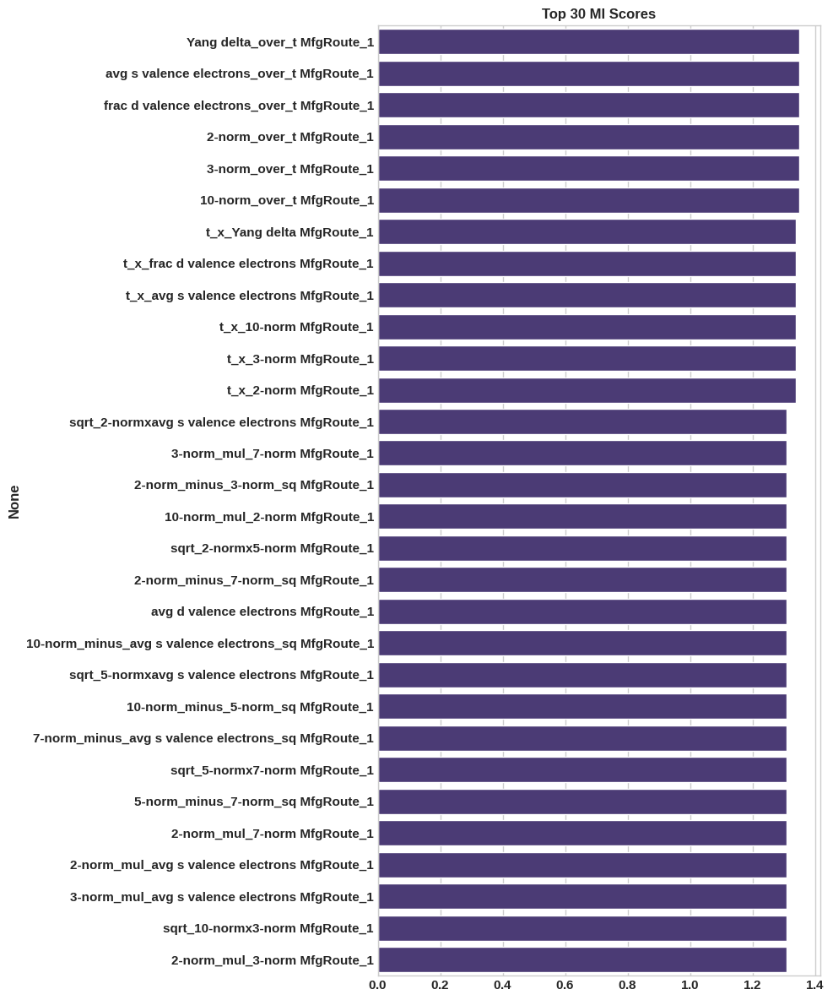

Warmup 0
Warmup 10
Warmup 20
Warmup 30
Warmup 40


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 0: Train 0.0526, Val 0.0409
Epoch 50: Train 0.0379, Val 0.0309
Epoch 100: Train 0.0286, Val 0.0256
Epoch 150: Train 0.0256, Val 0.0198
Epoch 200: Train 0.0192, Val 0.0171
Epoch 250: Train 0.0164, Val 0.0157
Epoch 300: Train 0.0136, Val 0.0110
Epoch 350: Train 0.0124, Val 0.0096
Epoch 400: Train 0.0111, Val 0.0096
Epoch 450: Train 0.0105, Val 0.0087
Epoch 500: Train 0.0093, Val 0.0080
Epoch 550: Train 0.0081, Val 0.0086
Epoch 600: Train 0.0075, Val 0.0075
Epoch 650: Train 0.0071, Val 0.0071
Epoch 700: Train 0.0057, Val 0.0070
Epoch 750: Train 0.0067, Val 0.0072
Epoch 800: Train 0.0079, Val 0.0074
Early stopping at epoch 841
Train R2 0.959, MAE 0.035, MAPE 106.0%
Val   R2 0.893, MAE 0.045, MAPE 103.3%


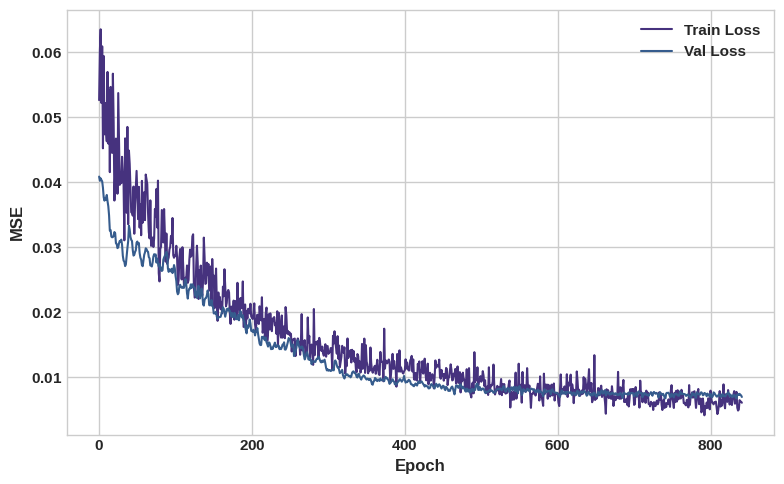

In [67]:
import pandas as pd
import numpy as np
import sys
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from sklearn.feature_selection import mutual_info_regression, RFE
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns

# Set styles and seeds
plt.style.use('seaborn-whitegrid')
sns.set_palette('viridis')
np.random.seed(42)
torch.manual_seed(42)

# Constants
INPUT_FILE = 'corrosion_refined.csv'
TARGET_COLUMN = 'EtoJ'
CATEGORICAL_FEATURES = [
    'MfgRoute',
    'Process_Clustered',
    'Coolingmedium_Clustered',
    'Solution_Clustered'
]

# Neural network definition
class RegressionNN(nn.Module):
    def __init__(self, input_dim):
        super(RegressionNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, 256)
        self.bn1 = nn.BatchNorm1d(256)
        self.fc2 = nn.Linear(256, 128)
        self.bn2 = nn.BatchNorm1d(128)
        self.fc3 = nn.Linear(128, 64)
        self.bn3 = nn.BatchNorm1d(64)
        self.fc4 = nn.Linear(64, 32)
        self.dropout = nn.Dropout(0.4)
        self.fc5 = nn.Linear(32, 1)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.relu(self.bn1(self.fc1(x)))
        x = self.dropout(x)
        x = self.relu(self.bn2(self.fc2(x)))
        x = self.dropout(x)
        x = self.relu(self.bn3(self.fc3(x)))
        x = self.relu(self.fc4(x))
        return self.fc5(x)

# Custom weighted MSE loss
class WeightedMSELoss(nn.Module):
    def __init__(self):
        super(WeightedMSELoss, self).__init__()

    def forward(self, predictions, targets):
        weights = 1.0 + 5.0 * torch.sigmoid((targets - 0.6) / 0.1)
        return (weights * (predictions - targets)**2).mean()

# Function to compute MI and plot
def perform_mutual_information_analysis(X, y, discrete_idx, target_col):
    mi = mutual_info_regression(X, y, discrete_features=discrete_idx, random_state=42)
    mi_series = pd.Series(mi, index=X.columns).sort_values(ascending=False)
    plt.figure(figsize=(10,12))
    sns.barplot(x=mi_series.head(30).values, y=mi_series.head(30).index)
    plt.title('Top 30 MI Scores')
    plt.tight_layout()
    plt.show()
    return mi_series

# Model training with early stopping
def train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, epochs=1500, patience=100):
    best_val = float('inf')
    wait = 0
    history = {'train': [], 'val': []}
    for epoch in range(epochs):
        # Train
        model.train()
        tr_loss = 0
        for Xb, yb in train_loader:
            optimizer.zero_grad()
            pred = model(Xb)
            loss = criterion(pred, yb)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()
            tr_loss += loss.item() * Xb.size(0)
        tr_loss /= len(train_loader.dataset)
        history['train'].append(tr_loss)
        # Validate
        model.eval()
        val_loss = 0
        with torch.no_grad():
            for Xb, yb in val_loader:
                pred = model(Xb)
                val_loss += criterion(pred, yb).item() * Xb.size(0)
        val_loss /= len(val_loader.dataset)
        history['val'].append(val_loss)
        scheduler.step(val_loss)
        if val_loss < best_val:
            best_val = val_loss
            torch.save(model.state_dict(), 'best_model.pth')
            wait = 0
        else:
            wait += 1
            if wait >= patience:
                print(f"Early stopping at epoch {epoch}")
                break
        if epoch % 50 == 0:
            print(f"Epoch {epoch}: Train {tr_loss:.4f}, Val {val_loss:.4f}")
    return history

# Evaluation
def evaluate_model(model, loader, inv_transform=None):
    model.eval()
    preds, trues = [], []
    with torch.no_grad():
        for Xb, yb in loader:
            out = model(Xb)
            if inv_transform:
                preds.extend(inv_transform(out).squeeze().tolist())
                trues.extend(inv_transform(yb).squeeze().tolist())
            else:
                preds.extend(out.squeeze().tolist())
                trues.extend(yb.squeeze().tolist())
    preds, trues = np.array(preds), np.array(trues)
    r2 = r2_score(trues, preds)
    mae = mean_absolute_error(trues, preds)
    mse = mean_squared_error(trues, preds)
    mape = np.mean(np.abs((trues-preds)/trues))*100
    return r2, mae, mse, mape

if __name__ == '__main__':
    # Load data
    try:
        df = pd.read_csv(INPUT_FILE)
    except FileNotFoundError:
        print(f"File '{INPUT_FILE}' not found.")
        sys.exit(1)

    # Separate
    y = pd.to_numeric(df[TARGET_COLUMN], errors='coerce').values
    X = df.drop(columns=[TARGET_COLUMN])

    # Coerce numerics
    for c in X.columns:
        X[c] = pd.to_numeric(X[c], errors='coerce').fillna(0)

    # --- Enhanced Feature Engineering ---
    # Base process interactions
    X['T_t_interaction'] = X['T[oC]'] * X['t[hr]']
    X['T_squared'] = X['T[oC]']**2
    X['t_squared'] = X['t[hr]']**2
    X['1_over_t'] = 1/(X['t[hr]'] + 1e-6)

    # Top composition features
    top_comps = [
        '2-norm', '3-norm', 'avg s valence electrons',
        'Yang delta', 'frac d valence electrons', '10-norm'
    ]
    # Cross-terms
    for comp in top_comps:
        X[f'T_x_{comp}']     = X['T[oC]'] * X[comp]
        X[f't_x_{comp}']     = X['t[hr]'] * X[comp]
        X[f'ln_{comp}_x_T']  = np.log1p(X[comp]) * X['T[oC]']
        X[f'{comp}_over_t']  = X[comp] / (X['t[hr]'] + 1e-6)

    # Compute PCC matrix on composition only
    comp_cols = [c for c in df.columns if c not in CATEGORICAL_FEATURES + ['T[oC]', 't[hr]', TARGET_COLUMN]]
    pcc = df[comp_cols + [TARGET_COLUMN]].corr().loc[comp_cols, TARGET_COLUMN]
    strong = pcc.abs() > 0.35
    strong_comps = pcc[strong].index.tolist()

    # Composition-composition interactions
    for i in strong_comps:
        for j in strong_comps:
            if i < j:
                X[f'{i}_mul_{j}'] = X[i] * X[j]
                X[f'{i}_minus_{j}_sq'] = (X[i] - X[j])**2
                X[f'sqrt_{i}x{j}'] = np.sqrt(np.abs(X[i]*X[j]) + 1e-6)

    # HOMO-LUMO gap
    X['homo_lumo_gap']   = X['LUMO_energy'] - X['HOMO_energy']
    X['sqrt_gap_x_T']    = np.sqrt(np.abs(X['homo_lumo_gap'])) * X['T[oC]']

    # --- Encoding categoricals ---
    X = pd.get_dummies(X, columns=CATEGORICAL_FEATURES, drop_first=True)

    # --- Polynomial Features ---
    poly = PolynomialFeatures(degree=2, include_bias=False)
    X_poly = pd.DataFrame(poly.fit_transform(X),
                          columns=poly.get_feature_names_out(X.columns))

    # --- MI Analysis ---
    discrete_idx = [i for i, f in enumerate(X_poly.columns) if any(c in f for c in CATEGORICAL_FEATURES)]
    mi_series = perform_mutual_information_analysis(X_poly, y, discrete_idx, TARGET_COLUMN)

    # --- RFE Selection ---
    lin = LinearRegression()
    selector = RFE(lin, n_features_to_select=25, step=1)
    selector.fit(X_poly, y)
    selected = list(X_poly.columns[selector.support_])
    mandatory = ['T[oC]', 't[hr]'] + [col for col in X_poly.columns if any(c in col for c in CATEGORICAL_FEATURES)]
    final_feats = list(set(selected + mandatory))
    X_sel = X_poly[final_feats]

    # --- Scale and split ---
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_sel)
    y_log = np.log1p(y).reshape(-1,1)
    inv = lambda t: np.expm1(t)

    # Add synthetic
    mask = y > 0.6
    n_syn = int(0.3 * np.sum(~mask))
    if np.sum(mask)>0 and n_syn>0:
        idx = np.where(mask)[0]
        syn_idx = np.random.choice(len(idx), n_syn)
        X_scaled = np.vstack([X_scaled, X_scaled[idx[syn_idx]] + np.random.normal(0,0.01,X_scaled.shape[1])])
        y_log = np.vstack([y_log, y_log[idx[syn_idx]] + np.random.normal(0,0.01,(n_syn,1))])

    X_t = torch.tensor(X_scaled, dtype=torch.float32)
    y_t = torch.tensor(y_log, dtype=torch.float32)
    X_tr, X_val, y_tr, y_val = train_test_split(X_t, y_t, test_size=0.15, random_state=42)

    train_loader = DataLoader(TensorDataset(X_tr, y_tr), batch_size=64, shuffle=True)
    val_loader   = DataLoader(TensorDataset(X_val, y_val), batch_size=64)

    # --- Model setup ---
    model = RegressionNN(X_tr.shape[1])
    criterion = WeightedMSELoss()
    opt = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-5)
    sched = optim.lr_scheduler.CosineAnnealingLR(opt, T_max=500)

    # Warmup
    for e in range(50):
        for Xb, yb in train_loader:
            opt.zero_grad(); loss=criterion(model(Xb), yb); loss.backward(); opt.step()
            for pg in opt.param_groups: pg['lr'] = 1e-4*(e+1)/50
        if e%10==0: print(f"Warmup {e}")

    # Train
    history = train_model(model, train_loader, val_loader, criterion, opt, sched)

    # Evaluate
    r2_tr, mae_tr, mse_tr, mape_tr = evaluate_model(model, train_loader, inv)
    r2_v , mae_v , mse_v , mape_v  = evaluate_model(model, val_loader, inv)
    print(f"Train R2 {r2_tr:.3f}, MAE {mae_tr:.3f}, MAPE {mape_tr:.1f}%")
    print(f"Val   R2 {r2_v:.3f}, MAE {mae_v:.3f}, MAPE {mape_v:.1f}%")

    # Learning curves
    plt.figure(figsize=(8,5))
    plt.plot(history['train'], label='Train Loss')
    plt.plot(history['val'],   label='Val Loss')
    plt.xlabel('Epoch'); plt.ylabel('MSE'); plt.legend(); plt.tight_layout(); plt.show()


Successfully loaded 'corrosion_refined.csv' with shape: (287, 28)

Identified 6 strongly correlated original composition features (PCC > 0.35): ['2-norm', '3-norm', '5-norm', '7-norm', '10-norm', 'avg s valence electrons']
Finished feature engineering. Current X shape: (287, 102)
One-hot encoded categorical features. Current X shape: (287, 105)


/tmp/ipykernel_11427/840520929.py:371: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X['homo_lumo_gap'] = (X['LUMO_energy'] - X['HOMO_energy']).fillna(0)
/tmp/ipykernel_11427/840520929.py:372: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X['sqrt_gap_x_T'] = (np.sqrt(np.abs(X['homo_lumo_gap']) + 1e-6) * X['T[oC]']).fillna(0)



Polynomial features generated. New feature count: 5670

Identified 8 discrete features in the polynomial-expanded set for MI analysis.

Mutual Information Scores (Top 20):
Yang delta 0-norm                                 1.028155
2-norm_minus_3-norm_sq 3-norm_mul_7-norm          0.983846
2-norm_minus_3-norm_sq 3-norm_mul_10-norm         0.979232
2-norm_minus_3-norm_sq 3-norm_mul_5-norm          0.977666
2-norm_minus_3-norm_sq 5-norm_mul_7-norm          0.975564
2-norm_minus_3-norm_sq 2-norm_mul_5-norm          0.970287
2-norm_minus_3-norm_sq 2-norm_mul_7-norm          0.968808
2-norm 5-norm_minus_avg s valence electrons_sq    0.968709
2-norm_mul_3-norm 2-norm_minus_3-norm_sq          0.968332
10-norm 2-norm_minus_3-norm_sq                    0.965384
Yang delta                                        0.964933
2-norm_minus_3-norm_sq sqrt_7-normx10-norm        0.964897
7-norm 2-norm_minus_3-norm_sq                     0.964503
2-norm_minus_3-norm_sq 7-norm_mul_10-norm         0.963053
2

/tmp/ipykernel_11427/840520929.py:120: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=plot_mi_series.values, y=plot_mi_series.index, palette='viridis')


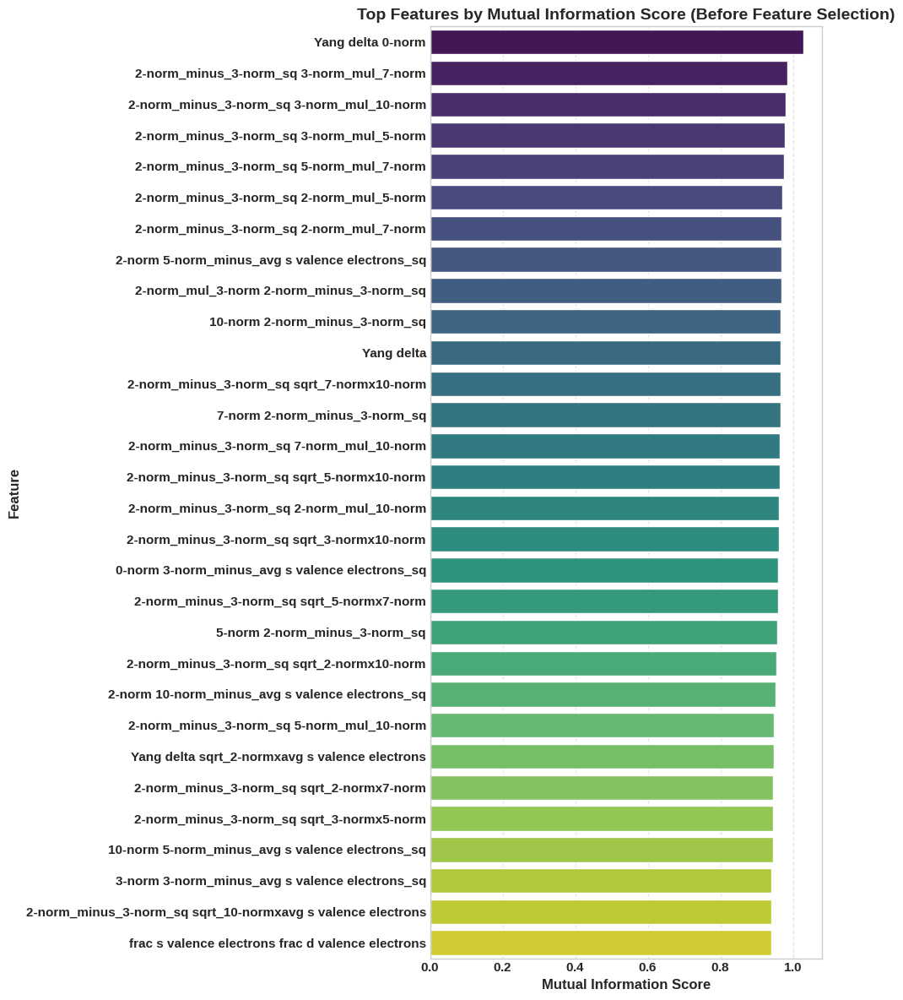


Fitting RFE on 5670 features and 287 samples...
RFE selected 25 features.

Mandatory features identified in polynomial space (217): ['t[hr] 5-norm_over_t', 't[hr] 2-norm_mul_10-norm', 't[hr] 3-norm_mul_10-norm', 'T[oC] ln_abs_3-norm_x_T', 'T[oC] Miedema_deltaH_inter', 't[hr] avg p valence electrons', 't[hr] ln_abs_avg s valence electrons_x_T', 'T[oC] 3-norm', 'T[oC]', 'T[oC] 5-norm_mul_avg s valence electrons', 't[hr] 7-norm_minus_10-norm_sq', 'T[oC] Solution_Clustered_2', 'T[oC] 10-norm_over_t', 't[hr] 2-norm_mul_7-norm', 't[hr] sqrt_7-normxavg s valence electrons', 't[hr] t_x_7-norm', 'T[oC] 0-norm', 'T[oC] 5-norm', 'T[oC] sqrt_5-normx7-norm', 'T[oC] Miedema_deltaH_amor', 'T[oC] 3-norm_minus_7-norm_sq', 't[hr] sqrt_2-normx7-norm', 'T[oC] t_x_2-norm', 't[hr] homo_lumo_gap', 'T[oC] 5-norm_minus_7-norm_sq', 't[hr] sqrt_7-normx10-norm', 'T[oC] 2-norm', 'T[oC] 5-norm_over_t', 'T[oC] 2-norm_minus_5-norm_sq', 't[hr] 3-norm_mul_5-norm', 'T[oC] sqrt_2-normx10-norm', 'T[oC] 3-norm_mul_avg s v

/tmp/ipykernel_11427/840520929.py:265: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mi_series_selected_sorted.values, y=mi_series_selected_sorted.index, palette='viridis')


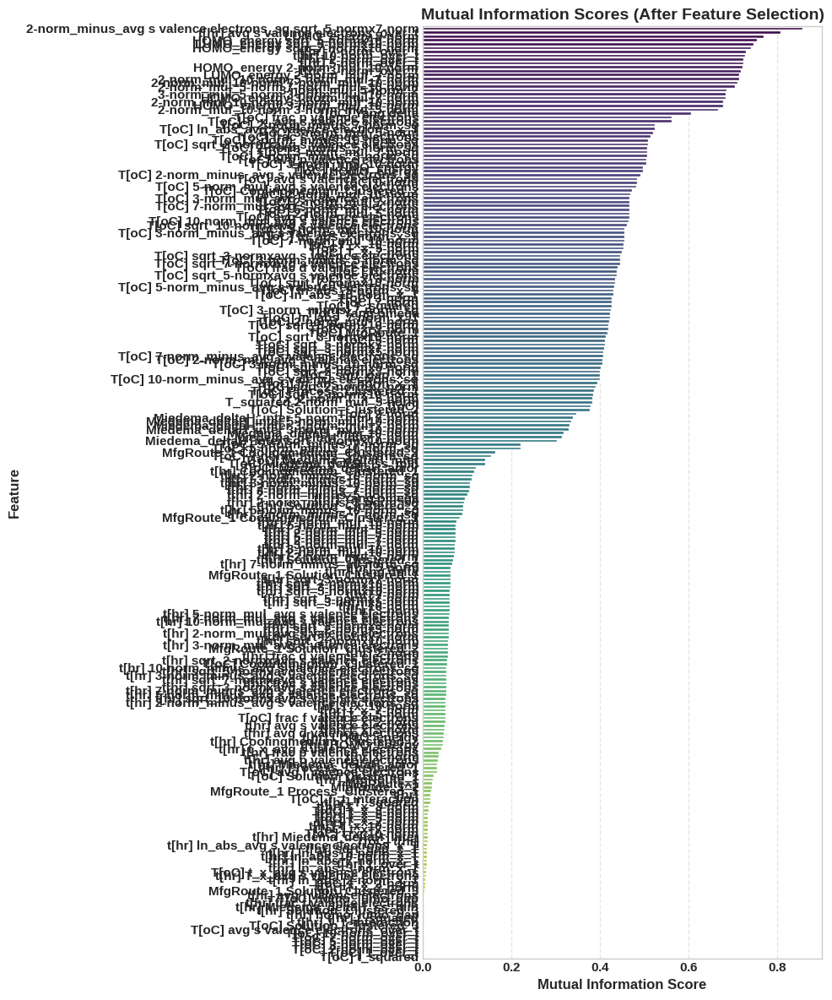


Original high EtoJ samples (>0.6): 8
Targeting 83 synthetic samples to balance.
Dataset size after synthesis: X_scaled (370, 242), y_log (370, 1)

Beginning LR Warmup phase...
Warmup 0/50, Current LR: 0.000002, Loss: 0.3027
Warmup 10/50, Current LR: 0.000022, Loss: 0.2598
Warmup 20/50, Current LR: 0.000042, Loss: 0.1550
Warmup 30/50, Current LR: 0.000062, Loss: 0.1199
Warmup 40/50, Current LR: 0.000082, Loss: 0.0843
Warmup 49/50, Current LR: 0.000100, Loss: 0.0749
LR Warmup phase complete.
Epoch 0: Train 0.0686, Val 0.0370


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 50: Train 0.0499, Val 0.0354
Epoch 100: Train 0.0390, Val 0.0283
Epoch 150: Train 0.0324, Val 0.0240
Epoch 200: Train 0.0318, Val 0.0210
Epoch 250: Train 0.0252, Val 0.0185
Epoch 300: Train 0.0193, Val 0.0181
Epoch 350: Train 0.0178, Val 0.0181
Epoch 400: Train 0.0140, Val 0.0176
Epoch 450: Train 0.0143, Val 0.0164
Epoch 500: Train 0.0152, Val 0.0160
Epoch 550: Train 0.0122, Val 0.0149
Epoch 600: Train 0.0107, Val 0.0146
Epoch 650: Train 0.0103, Val 0.0152
Epoch 700: Train 0.0111, Val 0.0153
Epoch 750: Train 0.0114, Val 0.0134
Epoch 800: Train 0.0080, Val 0.0137
Epoch 850: Train 0.0092, Val 0.0143
Epoch 900: Train 0.0088, Val 0.0137
Epoch 950: Train 0.0089, Val 0.0125
Epoch 1000: Train 0.0068, Val 0.0109
Epoch 1050: Train 0.0085, Val 0.0124
Epoch 1100: Train 0.0067, Val 0.0119
Epoch 1150: Train 0.0067, Val 0.0113
Early stopping at epoch 1154

Loaded best model for final evaluation.

--- Evaluating Model Performance ---

--- Model Performance ---
Train R2: 0.9484, MAE: 0.0385, MAP

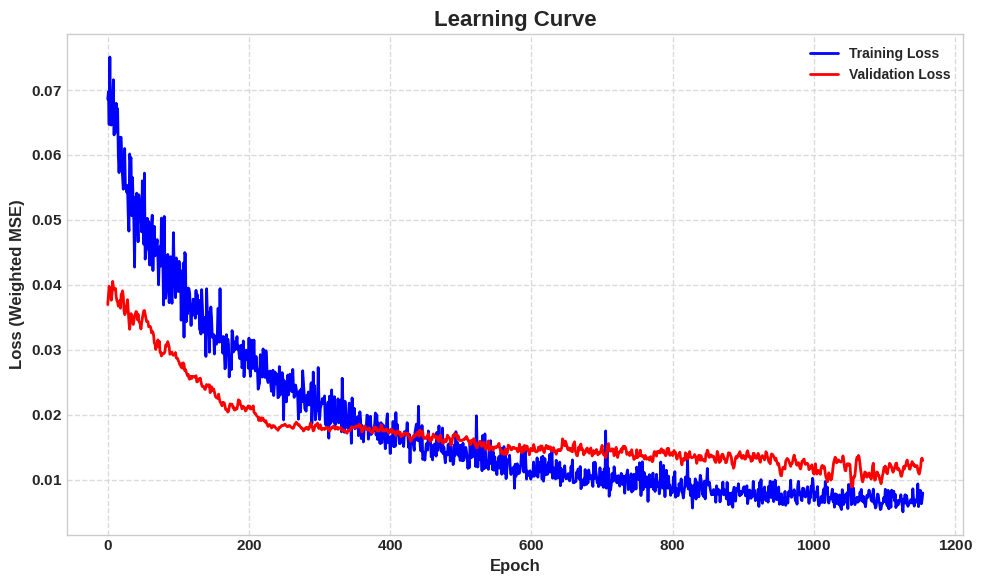

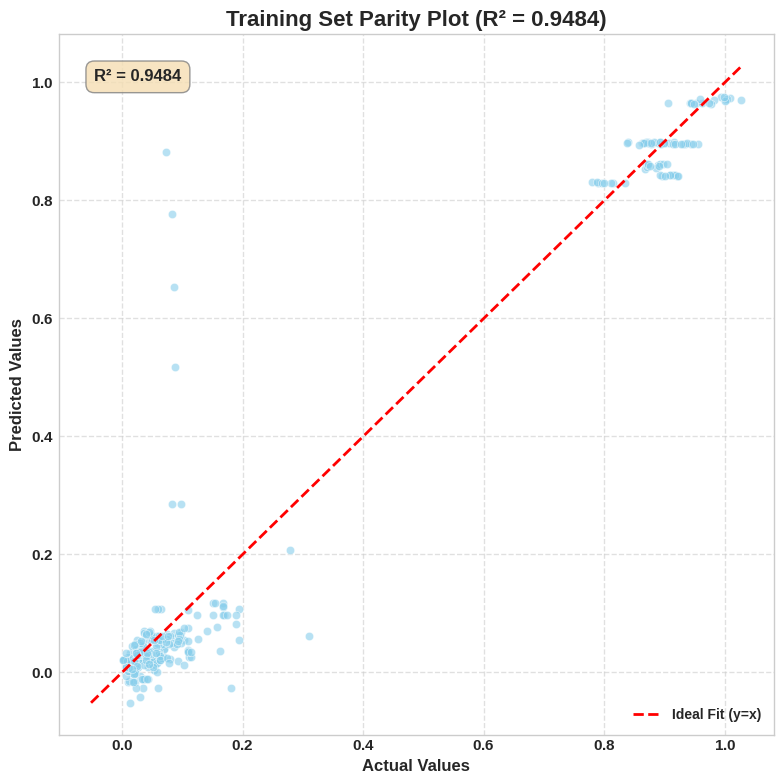

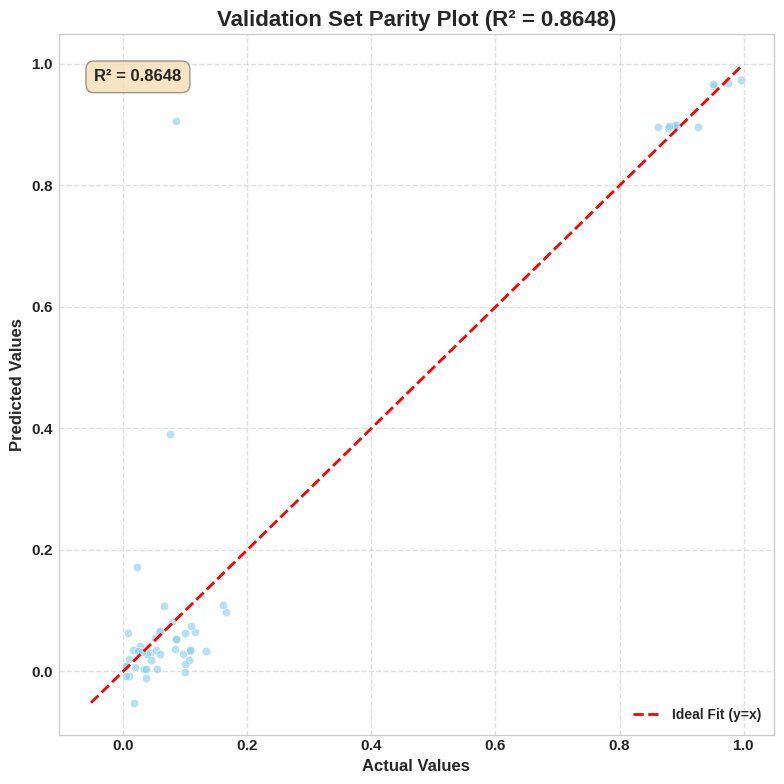

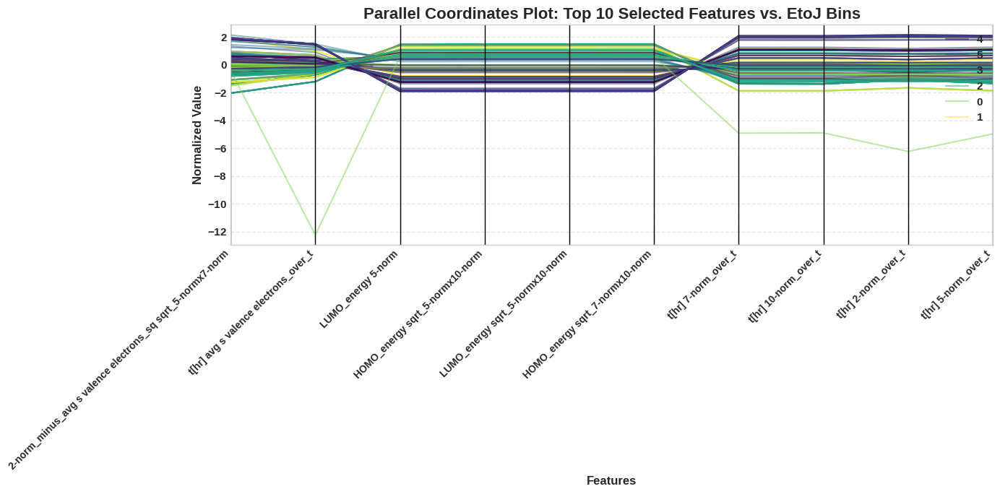

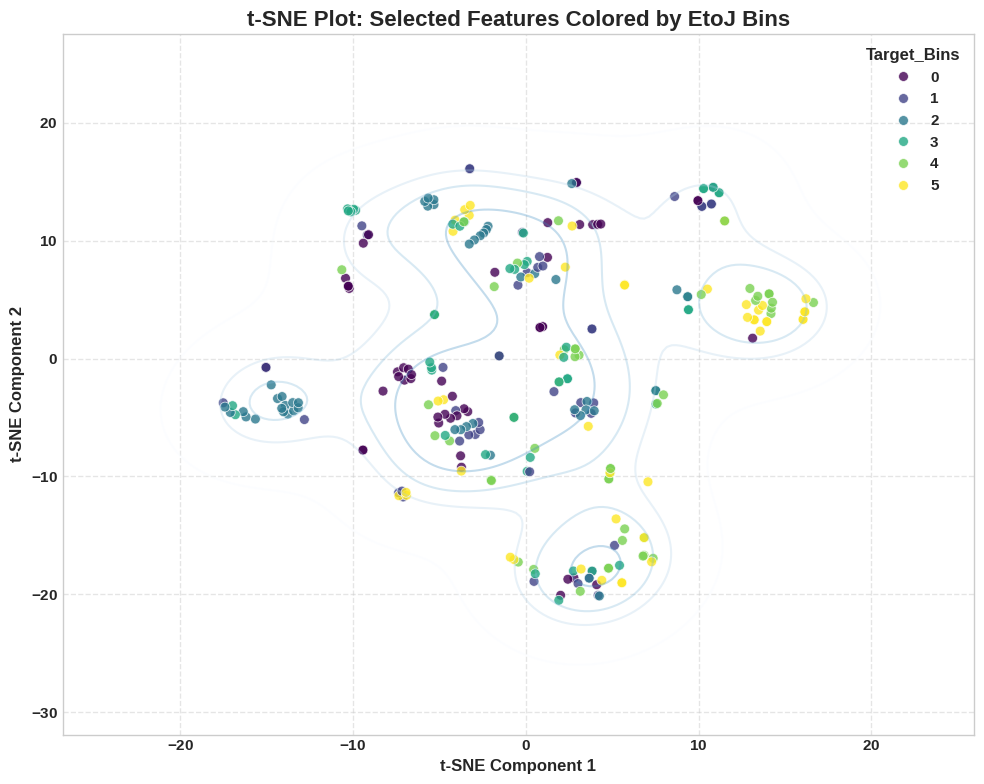

In [80]:
import pandas as pd
import numpy as np
import sys
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from sklearn.feature_selection import mutual_info_regression, RFE
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE # For t-SNE plot
from pandas.plotting import parallel_coordinates # For parallel coordinates plot

# Set consistent style and random seed for reproducibility
plt.style.use('seaborn-v0_8-whitegrid') # Updated to a more recent seaborn style
sns.set_palette('viridis')
np.random.seed(42)
torch.manual_seed(42)

# Define constants
INPUT_FILE = 'corrosion_refined.csv'
TARGET_COLUMN = 'EtoJ'
CATEGORICAL_FEATURES = [
    'MfgRoute',
    'Process_Clustered',
    'Coolingmedium_Clustered',
    'Solution_Clustered'
]

# Neural network definition - STICKING TO THIS EXACT MODEL
class RegressionNN(nn.Module):
    def __init__(self, input_dim):
        super(RegressionNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, 256)
        self.bn1 = nn.BatchNorm1d(256)
        self.fc2 = nn.Linear(256, 128)
        self.bn2 = nn.BatchNorm1d(128)
        self.fc3 = nn.Linear(128, 64)
        self.bn3 = nn.BatchNorm1d(64)
        self.fc4 = nn.Linear(64, 32)
        self.dropout = nn.Dropout(0.4)
        self.fc5 = nn.Linear(32, 1)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.relu(self.bn1(self.fc1(x)))
        x = self.dropout(x)
        x = self.relu(self.bn2(self.fc2(x)))
        x = self.dropout(x)
        x = self.relu(self.bn3(self.fc3(x)))
        x = self.relu(self.fc4(x))
        return self.fc5(x)

# Custom weighted MSE loss
class WeightedMSELoss(nn.Module):
    def __init__(self):
        super(WeightedMSELoss, self).__init__()

    def forward(self, predictions, targets):
        # Weights increase significantly for targets > 0.6
        # Sigmoid creates a smooth transition. `targets - 0.6` shifts the center, `0.1` controls steepness.
        weights = 1.0 + 5.0 * torch.sigmoid((targets - 0.6) / 0.1)
        return (weights * (predictions - targets)**2).mean()

# Function to compute MI and plot
def perform_mutual_information_analysis(X, y, categorical_features_list, target_col):
    """Calculates Mutual Information scores and visualizes top features.

    Robustly handles NaNs and ensures correct data types for sklearn's MI function.
    """
    # Ensure all data is numeric and handle NaNs for MI calculation in X
    X_mi = X.apply(pd.to_numeric, errors='coerce').fillna(0)

    # y is a NumPy array, convert to Series with X's index for proper alignment during concat
    y_series_for_mi = pd.Series(y.flatten(), name=target_col, index=X.index)
    y_mi_numeric = pd.to_numeric(y_series_for_mi, errors='coerce')

    # Align X and y by dropping rows with NaNs in either
    combined_df = pd.concat([X_mi, y_mi_numeric], axis=1).dropna()

    X_mi_cleaned = combined_df.drop(columns=[target_col])
    y_mi_cleaned = combined_df[target_col].values # Convert back to numpy array for mutual_info_regression

    if X_mi_cleaned.empty or len(y_mi_cleaned) == 0:
        print("Error: No valid data remaining after NaN handling for MI analysis. Returning empty series.")
        return pd.Series() # Return empty series if no data

    # Identify discrete features (indices) in the X_mi_cleaned DataFrame
    discrete_features_indices = []
    for orig_cat_feat in categorical_features_list:
        for i, col_name in enumerate(X_mi_cleaned.columns):
            if orig_cat_feat in col_name.split('_') or orig_cat_feat == col_name:
                discrete_features_indices.append(i)

    discrete_features_indices = list(set(discrete_features_indices)) # Remove duplicates

    mi_discrete_features_arg = 'auto'
    if not discrete_features_indices:
        print("Warning: No discrete features identified for MI analysis based on provided list and column names. MI will treat all features as continuous.")
    else:
        mi_discrete_features_arg = discrete_features_indices

    if X_mi_cleaned.shape[0] < 2 or X_mi_cleaned.shape[1] == 0:
        print(f"Warning: Insufficient samples ({X_mi_cleaned.shape[0]}) or features ({X_mi_cleaned.shape[1]}) for MI analysis. mutual_info_regression requires at least 2 samples and > 0 features. Returning empty series.")
        return pd.Series()

    mi = mutual_info_regression(X_mi_cleaned, y_mi_cleaned, discrete_features=mi_discrete_features_arg, random_state=42)
    mi_series = pd.Series(mi, index=X_mi_cleaned.columns).sort_values(ascending=False)

    print("\nMutual Information Scores (Top 20):")
    print(mi_series.head(20))

    plt.figure(figsize=(10,12))
    if not mi_series.empty:
        plot_mi_series = mi_series.head(min(30, len(mi_series))) # Plot up to 30 features
        sns.barplot(x=plot_mi_series.values, y=plot_mi_series.index, palette='viridis')
        plt.title('Top Features by Mutual Information Score (Before Feature Selection)', fontsize=14)
        plt.xlabel('Mutual Information Score', fontsize=12)
        plt.ylabel('Feature', fontsize=12)
        plt.grid(axis='x', linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()
    else:
        print("MI series is empty, skipping MI bar plot.")

    return mi_series

# Model training with early stopping - STICKING TO THIS EXACT FUNCTION
def train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, epochs=1500, patience=100):
    best_val = float('inf')
    wait = 0
    history = {'train': [], 'val': []}
    for epoch in range(epochs):
        # Train
        model.train()
        tr_loss = 0
        for Xb, yb in train_loader:
            optimizer.zero_grad()
            pred = model(Xb)
            loss = criterion(pred, yb)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()
            tr_loss += loss.item() * Xb.size(0)
        tr_loss /= len(train_loader.dataset)
        history['train'].append(tr_loss)
        # Validate
        model.eval()
        val_loss = 0
        with torch.no_grad():
            for Xb, yb in val_loader:
                pred = model(Xb)
                val_loss += criterion(pred, yb).item() * Xb.size(0)
        val_loss /= len(val_loader.dataset)
        history['val'].append(val_loss)
        scheduler.step(val_loss) # Scheduler steps based on validation loss
        if val_loss < best_val:
            best_val = val_loss
            torch.save(model.state_dict(), 'best_model.pth')
            wait = 0
        else:
            wait += 1
            if wait >= patience:
                print(f"Early stopping at epoch {epoch}")
                break
        if epoch % 50 == 0:
            print(f"Epoch {epoch}: Train {tr_loss:.4f}, Val {val_loss:.4f}")
    return history

# Evaluation
def evaluate_model(model, loader, inv_transform=None):
    """Evaluates the model and calculates R2, MAE, MSE, MAPE.

    Args:
        model: Trained PyTorch model.
        loader: DataLoader for the dataset (train or validation).
        inv_transform: Function to inverse transform predictions and actuals (e.g., np.expm1 for log1p).

    Returns:
        tuple: (R2, MAE, MSE, MAPE, actuals, predictions)
    """
    model.eval()
    preds, trues = [], []
    with torch.no_grad():
        for Xb, yb in loader:
            out = model(Xb)
            if inv_transform:
                preds.extend(inv_transform(out.cpu().numpy()).squeeze().tolist())
                trues.extend(inv_transform(yb.cpu().numpy()).squeeze().tolist())
            else:
                preds.extend(out.squeeze().tolist())
                trues.extend(yb.squeeze().tolist())
    preds, trues = np.array(preds), np.array(trues)

    finite_mask = np.isfinite(trues) & np.isfinite(preds)
    if not np.all(finite_mask):
        print(f"Warning: Non-finite values detected in actuals or predictions for evaluation. Filtering them out. ({np.sum(~finite_mask)} values removed)")
        trues = trues[finite_mask]
        preds = preds[finite_mask]

    if len(trues) == 0:
        print("Warning: No finite actual/prediction pairs remaining for metric calculation.")
        return np.nan, np.nan, np.nan, np.nan, np.array([]), np.array([])

    r2 = r2_score(trues, preds)
    mae = mean_absolute_error(trues, preds)
    mse = mean_squared_error(trues, preds)

    non_zero_trues_mask = trues != 0
    if np.sum(non_zero_trues_mask) > 0:
        mape = np.mean(np.abs((trues[non_zero_trues_mask]-preds[non_zero_trues_mask])/trues[non_zero_trues_mask]))*100
    else:
        mape = np.nan
        print("Warning: All true values are zero, MAPE is undefined.")

    return r2, mae, mse, mape, trues, preds # Also return trues and preds for plotting

# Plotting functions
def plot_learning_curve(train_losses, val_losses):
    """Plots the training and validation loss curves."""
    plt.figure(figsize=(10, 6))
    plt.plot(train_losses, label='Training Loss', color='blue', linewidth=2)
    plt.plot(val_losses, label='Validation Loss', color='red', linewidth=2)
    plt.title('Learning Curve', fontsize=16)
    plt.xlabel('Epoch', fontsize=12)
    plt.ylabel('Loss (Weighted MSE)', fontsize=12)
    plt.legend(fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

def plot_parity(actuals, predictions, r2, title="Parity Plot"):
    """Generates a parity plot (actual vs. predicted values)."""
    plt.figure(figsize=(8, 8))
    plt.scatter(actuals, predictions, alpha=0.6, color='skyblue', edgecolors='w', linewidth=0.5)

    min_val = np.nanmin([np.nanmin(actuals), np.nanmin(predictions)]) if np.isfinite(np.nanmin(actuals)) and np.isfinite(np.nanmin(predictions)) else 0
    max_val = np.nanmax([np.nanmax(actuals), np.nanmax(predictions)]) if np.isfinite(np.nanmax(actuals)) and np.isfinite(np.nanmax(predictions)) else 1

    if max_val - min_val < 1e-6: # Handle cases where data range is very small
        buffer = 0.1
        min_val -= buffer
        max_val += buffer

    plt.plot([min_val, max_val], [min_val, max_val], 'r--', label='Ideal Fit (y=x)', linewidth=2)
    plt.title(f'{title} (R² = {r2:.4f})', fontsize=16)
    plt.xlabel('Actual Values', fontsize=12)
    plt.ylabel('Predicted Values', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.text(0.05, 0.95, f'R² = {r2:.4f}', transform=plt.gca().transAxes, fontsize=12,
             verticalalignment='top', bbox=dict(boxstyle='round,pad=0.5', fc='wheat', alpha=0.8, ec='gray'))
    plt.legend(fontsize=10, loc='lower right')
    plt.tight_layout()
    plt.show()

def plot_mi_after_selection(mi_series_selected):
    """Plots Mutual Information scores for selected features."""
    plt.figure(figsize=(10, 12))
    mi_series_selected_sorted = mi_series_selected.sort_values(ascending=False)
    if not mi_series_selected_sorted.empty:
        sns.barplot(x=mi_series_selected_sorted.values, y=mi_series_selected_sorted.index, palette='viridis')
        plt.title('Mutual Information Scores (After Feature Selection)', fontsize=14)
        plt.xlabel('Mutual Information Score', fontsize=12)
        plt.ylabel('Feature', fontsize=12)
        plt.grid(axis='x', linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()
    else:
        print("MI series after selection is empty, skipping plot.")


if __name__ == '__main__':
    # Load data
    try:
        df = pd.read_csv(INPUT_FILE)
        print(f"Successfully loaded '{INPUT_FILE}' with shape: {df.shape}")
    except FileNotFoundError:
        print(f"File '{INPUT_FILE}' not found. Please ensure the file exists in the current directory.")
        sys.exit(1)
    except Exception as e:
        print(f"An error occurred while loading the CSV: {e}")
        sys.exit(1)

    # Separate target from features
    y = pd.to_numeric(df[TARGET_COLUMN], errors='coerce').values
    X = df.drop(columns=[TARGET_COLUMN]).copy()

    # Coerce all feature columns to numeric, filling NaNs
    for c in X.columns:
        X[c] = pd.to_numeric(X[c], errors='coerce').fillna(0)

    # Determine original composition columns for PCC analysis
    all_known_non_composition_features_in_original_df = ['T[oC]', 't[hr]', TARGET_COLUMN] + CATEGORICAL_FEATURES
    original_composition_cols = [
        col for col in df.columns
        if col not in all_known_non_composition_features_in_original_df
    ]

    # --- Enhanced Feature Engineering ---

    # Base process interactions
    if 'T[oC]' in X.columns and 't[hr]' in X.columns:
        X['T_t_interaction'] = (X['T[oC]'] * X['t[hr]']).fillna(0)
        X['T_squared'] = (X['T[oC]']**2).fillna(0)
        X['t_squared'] = (X['t[hr]']**2).fillna(0)
        X['1_over_t'] = (1 / (X['t[hr]'] + 1e-6)).fillna(0)
    else:
        print("Warning: Missing 'T[oC]' or 't[hr]' for process interaction features.")

    # --- PCC Analysis on original composition only ---
    df_for_pcc = df[original_composition_cols + [TARGET_COLUMN]].copy()
    for col in df_for_pcc.columns:
        df_for_pcc[col] = pd.to_numeric(df_for_pcc[col], errors='coerce')
    df_for_pcc = df_for_pcc.dropna()

    strong_comps = []
    if not df_for_pcc.empty and TARGET_COLUMN in df_for_pcc.columns:
        if len(df_for_pcc) > 1 and len(df_for_pcc[TARGET_COLUMN].unique()) > 1:
            pcc = df_for_pcc.corr().loc[original_composition_cols, TARGET_COLUMN]
            strong = pcc.abs() > 0.35
            strong_comps = pcc[strong].index.tolist()
            print(f"\nIdentified {len(strong_comps)} strongly correlated original composition features (PCC > 0.35): {strong_comps}")
        else:
            print("Warning: Not enough data points or variability in target for meaningful PCC analysis. Strong composition features list will be empty.")
    else:
        print("Warning: df_for_pcc is empty or target column missing. Strong composition features list will be empty.")

    # --- Cross-terms between process parameters and top composition features ---
    if not strong_comps:
        # Fallback list if no strong correlations found, ensuring columns exist in X
        top_comps_for_interactions = [
            '2-norm', '3-norm', 'avg s valence electrons',
            'Yang delta', 'frac d valence electrons', '10-norm',
            'HOMO_energy', 'LUMO_energy'
        ]
        top_comps_for_interactions = [c for c in top_comps_for_interactions if c in X.columns]
        print(f"Using a default list for process-composition interactions as no strong_comps were found: {top_comps_for_interactions}")
    else:
        top_comps_for_interactions = [c for c in strong_comps if c in X.columns]

    for comp in top_comps_for_interactions:
        if comp in X.columns and 'T[oC]' in X.columns and 't[hr]' in X.columns:
            X[f'T_x_{comp}'] = (X['T[oC]'] * X[comp]).fillna(0)
            X[f't_x_{comp}'] = (X['t[hr]'] * X[comp]).fillna(0)
            X[f'ln_abs_{comp}_x_T'] = (np.log1p(np.abs(X[comp]) + 1e-6) * X['T[oC]']).fillna(0) # Using abs for safety
            X[f'{comp}_over_t'] = (X[comp] / (X['t[hr]'] + 1e-6)).fillna(0)
        else:
            print(f"Skipping process-composition interaction for {comp}: one or more base columns missing or not numeric.")

    # --- Composition-composition interactions based on strongly correlated features ---
    valid_strong_comps = [c for c in strong_comps if c in X.columns]
    if len(valid_strong_comps) > 1:
        for i in range(len(valid_strong_comps)):
            for j in range(i + 1, len(valid_strong_comps)):
                comp_i = valid_strong_comps[i]
                comp_j = valid_strong_comps[j]
                X[f'{comp_i}_mul_{comp_j}'] = (X[comp_i] * X[comp_j]).fillna(0)
                X[f'{comp_i}_minus_{comp_j}_sq'] = ((X[comp_i] - X[comp_j])**2).fillna(0)
                X[f'sqrt_{comp_i}x{comp_j}'] = (np.sqrt(np.abs(X[comp_i]*X[comp_j]) + 1e-6)).fillna(0)
    elif len(valid_strong_comps) == 1:
        print("Only one strongly correlated composition feature, skipping composition-composition interactions.")
    else:
        print("No valid strongly correlated composition features for composition-composition interactions.")

    # --- HOMO-LUMO gap and its interaction with Temperature ---
    if 'LUMO_energy' in X.columns and 'HOMO_energy' in X.columns and 'T[oC]' in X.columns:
        X['homo_lumo_gap'] = (X['LUMO_energy'] - X['HOMO_energy']).fillna(0)
        X['sqrt_gap_x_T'] = (np.sqrt(np.abs(X['homo_lumo_gap']) + 1e-6) * X['T[oC]']).fillna(0)
    else:
        print("Skipping HOMO-LUMO gap features: 'LUMO_energy', 'HOMO_energy', or 'T[oC]' columns missing.")

    print(f"Finished feature engineering. Current X shape: {X.shape}")

    # --- Encoding categoricals ---
    existing_categorical_features = [f for f in CATEGORICAL_FEATURES if f in X.columns]
    if existing_categorical_features:
        X = pd.get_dummies(X, columns=existing_categorical_features, drop_first=True)
        print(f"One-hot encoded categorical features. Current X shape: {X.shape}")
    else:
        print("No specified categorical features found in the DataFrame to encode.")

    # Ensure all data is numeric before polynomial features
    X_for_poly = X.copy().apply(pd.to_numeric, errors='coerce').fillna(0)

    # --- Polynomial Features ---
    poly = PolynomialFeatures(degree=2, include_bias=False)
    try:
        X_poly_transformed = poly.fit_transform(X_for_poly)
        X_poly = pd.DataFrame(X_poly_transformed, columns=poly.get_feature_names_out(X_for_poly.columns), index=X_for_poly.index)
        # Re-fill NaNs after poly transform as it can sometimes introduce them
        X_poly = X_poly.apply(pd.to_numeric, errors='coerce').fillna(0)
        print(f"\nPolynomial features generated. New feature count: {X_poly.shape[1]}")
    except Exception as e:
        print(f"Error during PolynomialFeatures transformation: {e}")
        print("Proceeding without polynomial features, using original X (after initial engineering and encoding).")
        X_poly = X_for_poly.copy() # Fallback to X_for_poly if polynomial fails

    # --- MI Analysis ---
    # Need to correctly identify discrete features in the X_poly space
    discrete_idx_for_mi = []
    for orig_cat_feat in CATEGORICAL_FEATURES:
        for i, col_name in enumerate(X_poly.columns):
            if orig_cat_feat in col_name.split('_') or orig_cat_feat == col_name:
                discrete_idx_for_mi.append(i)
    discrete_idx_for_mi = list(set(discrete_idx_for_mi))

    print(f"\nIdentified {len(discrete_idx_for_mi)} discrete features in the polynomial-expanded set for MI analysis.")
    mi_series = perform_mutual_information_analysis(X_poly.copy(), y.copy(), CATEGORICAL_FEATURES, TARGET_COLUMN)
    if mi_series.empty:
        print("MI analysis resulted in an empty series. Cannot proceed with feature selection based on MI.")
        sys.exit(1)

    # --- RFE Selection ---
    lin = LinearRegression()
    n_features_to_select_rfe = 25 # You can adjust this number
    
    # Ensure RFE does not select more features than available
    if n_features_to_select_rfe > X_poly.shape[1]:
        print(f"Warning: RFE target features ({n_features_to_select_rfe}) > total features ({X_poly.shape[1]}). Adjusting n_features_to_select_rfe to {X_poly.shape[1]}.")
        n_features_to_select_rfe = X_poly.shape[1]
    
    selector = RFE(lin, n_features_to_select=n_features_to_select_rfe, step=1)
    
    # Prepare data for RFE, ensuring alignment and no NaNs
    X_poly_cleaned_for_rfe = X_poly.copy().apply(pd.to_numeric, errors='coerce').fillna(0)
    y_series_for_rfe = pd.Series(y.flatten(), name='temp_target', index=X_poly_cleaned_for_rfe.index)
    y_cleaned_numeric_for_rfe = pd.to_numeric(y_series_for_rfe, errors='coerce')

    # Drop rows with NaNs only for the RFE fitting
    temp_df_rfe = pd.concat([X_poly_cleaned_for_rfe, y_cleaned_numeric_for_rfe], axis=1).dropna()
    X_poly_cleaned_aligned = temp_df_rfe.drop(columns=['temp_target'])
    y_cleaned_aligned = temp_df_rfe['temp_target'].values

    if X_poly_cleaned_aligned.empty or len(y_cleaned_aligned) == 0:
        print("Error: No valid data remaining after NaN handling for RFE. Cannot perform feature selection. Exiting.")
        sys.exit(1)

    print(f"\nFitting RFE on {X_poly_cleaned_aligned.shape[1]} features and {X_poly_cleaned_aligned.shape[0]} samples...")
    selected_rfe_features = []
    try:
        selector.fit(X_poly_cleaned_aligned, y_cleaned_aligned)
        selected_rfe_features = list(X_poly_cleaned_aligned.columns[selector.support_])
        print(f"RFE selected {len(selected_rfe_features)} features.")
    except Exception as e:
        print(f"Error during RFE fitting: {e}. Fallback to MI top features.")
        selected_rfe_features = mi_series.head(n_features_to_select_rfe).index.tolist()
        # Ensure fallback features actually exist in X_poly
        selected_rfe_features = [f for f in selected_rfe_features if f in X_poly.columns]
        if not selected_rfe_features:
            print("Warning: Fallback MI features list is empty or features not found. Cannot proceed with feature selection. Exiting.")
            sys.exit(1)


    # Identify mandatory features in the polynomial feature space
    mandatory_base_features = ['T[oC]', 't[hr]'] + CATEGORICAL_FEATURES # Include original categoricals
    mandatory_features_in_poly_space = []
    for base_feat in mandatory_base_features:
        for col_name in X_poly.columns:
            # Check for exact match or if original feature name is part of the polynomial feature name
            if base_feat == col_name or (base_feat + '_' in col_name and base_feat in col_name.split('_')) or (base_feat in col_name.split(' ') and '_' not in base_feat):
                 mandatory_features_in_poly_space.append(col_name)

    # Clean up mandatory features to ensure uniqueness and existence in X_poly
    mandatory_features_in_poly_space = list(set(mandatory_features_in_poly_space))
    mandatory_features_in_poly_space = [f for f in mandatory_features_in_poly_space if f in X_poly.columns]

    print(f"\nMandatory features identified in polynomial space ({len(mandatory_features_in_poly_space)}): {mandatory_features_in_poly_space}")

    # Combine RFE selected features and mandatory features
    final_selected_features = list(set(selected_rfe_features + mandatory_features_in_poly_space))
    # Final check to ensure all selected features actually exist in X_poly
    final_selected_features = [f for f in final_selected_features if f in X_poly.columns]

    if not final_selected_features:
        print("Error: No features selected for training. This might indicate an issue with feature selection. Exiting.")
        sys.exit(1)

    X_sel = X_poly[final_selected_features].copy()
    print(f"\nTotal features selected for NN training ({len(final_selected_features)}): {final_selected_features}")

    # Plot MI for selected features
    plot_mi_after_selection(mi_series[mi_series.index.isin(final_selected_features)])

    # --- Scale and split ---
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_sel)

    # Log transform target
    y_log = np.log1p(y).reshape(-1,1)
    inv_transform_y = lambda t: np.expm1(t)

    # Synthetic data generation for high EtoJ values
    # Align y_original_for_synthesis with X_scaled (which might have dropped NaNs)
    # The original y has shape (n_samples,), X_scaled is (n_samples, n_features)
    # We need to make sure the indices align after any data cleaning steps that might have happened.
    # The simplest way is to ensure y corresponds directly to X_scaled after all transformations.
    # We use the original 'y' but apply the same 'dropna' logic that was implicitly applied to X_scaled via X_sel selection.
    
    # Re-align y to X_sel's index to ensure consistency with filtered X_sel
    y_aligned_to_X_sel = pd.Series(y.flatten(), index=df.index).loc[X_sel.index].values
    
    mask_high_log = y_aligned_to_X_sel > 0.6 # Use the original scale of y for thresholding
    n_majority_samples = np.sum(~mask_high_log) # Number of samples below or equal to threshold
    n_synthetic_samples_target = int(0.3 * n_majority_samples)

    print(f"\nOriginal high {TARGET_COLUMN} samples (>0.6): {np.sum(mask_high_log)}")
    print(f"Targeting {n_synthetic_samples_target} synthetic samples to balance.")

    if np.sum(mask_high_log) > 0 and n_synthetic_samples_target > 0:
        high_indices_in_aligned_data = np.where(mask_high_log)[0]
        
        if len(high_indices_in_aligned_data) == 0:
            print("No high EtoJ samples found after alignment, skipping synthesis.")
        else:
            synth_indices_from_high = np.random.choice(len(high_indices_in_aligned_data), n_synthetic_samples_target, replace=True)

            X_high_samples = X_scaled[high_indices_in_aligned_data[synth_indices_from_high]]
            y_log_high_samples = y_log[high_indices_in_aligned_data[synth_indices_from_high]] # Use log-transformed y for synthesis

            synth_X = X_high_samples + np.random.normal(0, 0.01, size=X_high_samples.shape)
            synth_y = y_log_high_samples + np.random.normal(0, 0.01, size=y_log_high_samples.shape)

            X_scaled = np.vstack([X_scaled, synth_X])
            y_log = np.vstack([y_log, synth_y])
            print(f"Dataset size after synthesis: X_scaled {X_scaled.shape}, y_log {y_log.shape}")
    else:
        print("Skipping synthetic data generation: Not enough high EtoJ samples or target for synthesis is zero.")


    X_t = torch.tensor(X_scaled, dtype=torch.float32)
    y_t = torch.tensor(y_log, dtype=torch.float32)

    X_tr, X_val, y_tr, y_val = train_test_split(X_t, y_t, test_size=0.15, random_state=42)

    train_loader = DataLoader(TensorDataset(X_tr, y_tr), batch_size=64, shuffle=True)
    val_loader   = DataLoader(TensorDataset(X_val, y_val), batch_size=64, shuffle=False)

    # --- Model setup ---
    model = RegressionNN(X_tr.shape[1])
    criterion = WeightedMSELoss()
    opt = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-5)

    epochs_for_scheduler = 1500 # Max epochs for training, also used for T_max
    sched = optim.lr_scheduler.CosineAnnealingLR(opt, T_max=epochs_for_scheduler)

    # Warmup - STICKING TO THIS EXACT WARMUP LOGIC
    warmup_epochs = 50
    end_warmup_lr = 1e-4 # Consistent with original example's LR change logic in warmup

    print("\nBeginning LR Warmup phase...")
    for e in range(warmup_epochs):
        model.train()
        # Manually set LR for warmup phase
        for pg in opt.param_groups:
            pg['lr'] = end_warmup_lr * (e+1) / warmup_epochs

        tr_loss_warmup = 0
        for Xb, yb in train_loader:
            opt.zero_grad()
            loss = criterion(model(Xb), yb)
            loss.backward()
            opt.step()
            tr_loss_warmup += loss.item() * Xb.size(0)
        tr_loss_warmup /= len(train_loader.dataset) # Average loss for the epoch

        if e % 10 == 0 or e == warmup_epochs - 1:
            print(f"Warmup {e}/{warmup_epochs}, Current LR: {opt.param_groups[0]['lr']:.6f}, Loss: {tr_loss_warmup:.4f}")
    print("LR Warmup phase complete.")


    # Train the model
    history = train_model(model, train_loader, val_loader, criterion, opt, sched, epochs=epochs_for_scheduler)

    try:
        model.load_state_dict(torch.load('best_model.pth'))
        print("\nLoaded best model for final evaluation.")
    except FileNotFoundError:
        print("\nWarning: best_model.pth not found. Using the last trained model state for evaluation.")

    print("\n--- Evaluating Model Performance ---")
    r2_tr, mae_tr, mse_tr, mape_tr, train_actuals, train_predictions = evaluate_model(model, train_loader, inv_transform_y)
    r2_v , mae_v , mse_v , mape_v, val_actuals, val_predictions  = evaluate_model(model, val_loader, inv_transform_y)

    print(f"\n--- Model Performance ---")
    print(f"Train R2: {r2_tr:.4f}, MAE: {mae_tr:.4f}, MAPE: {mape_tr:.2f}%, MSE: {mse_tr:.4f}")
    print(f"Validation R2: {r2_v:.4f}, MAE: {mae_v:.4f}, MAPE: {mape_v:.2f}%, MSE: {mse_v:.4f}")

    # Plot learning curves and parity plots
    plot_learning_curve(history['train'], history['val'])
    plot_parity(train_actuals, train_predictions, r2_tr, title="Training Set Parity Plot")
    plot_parity(val_actuals, val_predictions, r2_v, title="Validation Set Parity Plot")

    # For parallel coordinates and t-SNE, ensure original indices are preserved for plotting target bins
    # Ensure X_sel and df align for target binning
    common_indices_for_plot = X_sel.index.intersection(df.index)
    X_plot_features = X_sel.loc[common_indices_for_plot].copy()
    y_original_aligned_for_plot = df.loc[common_indices_for_plot, TARGET_COLUMN].values

    # Add target bins to the plotting dataframe
    X_plot_features[TARGET_COLUMN] = y_original_aligned_for_plot

    if len(X_plot_features[TARGET_COLUMN].unique()) > 1:
        try:
            X_plot_features['Target_Bins'] = pd.qcut(X_plot_features[TARGET_COLUMN], q=6, labels=False, duplicates='drop')
        except ValueError:
            print("Could not create 6 quantile bins for Target_Bins, trying with fewer.")
            try:
                X_plot_features['Target_Bins'] = pd.qcut(X_plot_features[TARGET_COLUMN], q=4, labels=False, duplicates='drop')
            except ValueError:
                print("Could not create 4 quantile bins either. Skipping Target_Bins.")
                X_plot_features['Target_Bins'] = pd.Series(0, index=X_plot_features.index) # Fallback to single bin
    else:
        print("Not enough unique target values to create bins for plotting. Target_Bins will be a single category.")
        X_plot_features['Target_Bins'] = pd.Series(0, index=X_plot_features.index) # Fallback to single bin

    # Select top MI features for Parallel Coordinates plot
    features_for_parallel = mi_series[mi_series.index.isin(final_selected_features)].head(min(10, len(mi_series[mi_series.index.isin(final_selected_features)]))).index.tolist()
    existing_plot_features = [f for f in features_for_parallel if f in X_plot_features.columns]

    if 'Target_Bins' in X_plot_features.columns and existing_plot_features:
        parallel_plot_df = X_plot_features[existing_plot_features + ['Target_Bins']].copy()

        scaler_for_plot = StandardScaler()
        numerical_cols_for_parallel = [col for col in existing_plot_features if pd.api.types.is_numeric_dtype(parallel_plot_df[col])]

        if numerical_cols_for_parallel:
            parallel_plot_df[numerical_cols_for_parallel] = scaler_for_plot.fit_transform(parallel_plot_df[numerical_cols_for_parallel])

        plt.figure(figsize=(14, 7))
        parallel_coordinates(parallel_plot_df, 'Target_Bins', colormap='viridis', alpha=0.5)
        plt.title(f'Parallel Coordinates Plot: Top {len(existing_plot_features)} Selected Features vs. {TARGET_COLUMN} Bins', fontsize=16)
        plt.xlabel('Features', fontsize=12)
        plt.ylabel('Normalized Value', fontsize=12)
        plt.xticks(rotation=45, ha='right', fontsize=10)
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()
    else:
        print("Skipping Parallel Coordinates Plot: Not enough valid features or 'Target_Bins' missing.")

    # t-SNE Plot
    tsne_input_data = X_sel.copy().apply(pd.to_numeric, errors='coerce').fillna(0)
    scaler_tsne = StandardScaler()
    tsne_scaled_data = scaler_tsne.fit_transform(tsne_input_data)

    if tsne_scaled_data.shape[0] > 1 and tsne_scaled_data.shape[1] > 1:
        perplexity_val = min(30, tsne_scaled_data.shape[0] - 1)
        if perplexity_val < 1: # Ensure perplexity is at least 1
            perplexity_val = 1
            print("Warning: Perplexity for t-SNE adjusted to 1 due to very small number of samples.")

        tsne = TSNE(n_components=2, random_state=42, perplexity=perplexity_val, n_iter=1000)
        try:
            X_tsne = tsne.fit_transform(tsne_scaled_data)
            tsne_df = pd.DataFrame(data=X_tsne, columns=['TSNE_Component_1', 'TSNE_Component_2'])

            # Align Target_Bins with t-SNE output, which is based on X_sel
            # Since X_plot_features also uses X_sel's index, we can simply re-index
            tsne_df['Target_Bins'] = X_plot_features['Target_Bins'].loc[X_sel.index].reset_index(drop=True)

            if 'Target_Bins' in tsne_df.columns:
                plt.figure(figsize=(10, 8))
                sns.scatterplot(x='TSNE_Component_1', y='TSNE_Component_2', hue='Target_Bins', palette='viridis', data=tsne_df, s=50, alpha=0.8)

                if tsne_df.shape[0] > 1:
                    try:
                        sns.kdeplot(x='TSNE_Component_1', y='TSNE_Component_2', data=tsne_df, cmap='Blues', alpha=0.3, levels=5)
                    except Exception as kde_e:
                        print(f"Could not draw KDE plot for t-SNE: {kde_e}")

                plt.title(f't-SNE Plot: Selected Features Colored by {TARGET_COLUMN} Bins', fontsize=16)
                plt.xlabel('t-SNE Component 1', fontsize=12)
                plt.ylabel('t-SNE Component 2', fontsize=12)
                plt.grid(True, linestyle='--', alpha=0.5)
                plt.tight_layout()
                plt.show()
            else:
                print("Skipping t-SNE Plot: 'Target_Bins' column not available.")

        except Exception as e:
            print(f"Error during t-SNE computation or plotting: {e}")
            print("Skipping t-SNE plot.")
    else:
        print(f"Skipping t-SNE Plot: Insufficient data samples ({tsne_scaled_data.shape[0]}) or features ({tsne_scaled_data.shape[1]}) for t-SNE.")

Successfully loaded 'corrosion_refined.csv' with shape: (287, 28)

Identified 6 strongly correlated original composition features (PCC > 0.35): ['2-norm', '3-norm', '5-norm', '7-norm', '10-norm', 'avg s valence electrons']
Finished feature engineering. Current X shape: (287, 102)
One-hot encoded categorical features. Current X shape: (287, 105)


/tmp/ipykernel_11427/1125513706.py:402: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X['homo_lumo_gap'] = (X['LUMO_energy'] - X['HOMO_energy']).fillna(0)
/tmp/ipykernel_11427/1125513706.py:403: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X['sqrt_gap_x_T'] = (np.sqrt(np.abs(X['homo_lumo_gap']) + 1e-6) * X['T[oC]']).fillna(0)



Polynomial features generated. New feature count: 5670

Identified 8 discrete features in the polynomial-expanded set for MI analysis.

Mutual Information Scores (Top 20):
Yang delta 0-norm                                 1.028155
2-norm_minus_3-norm_sq 3-norm_mul_7-norm          0.983846
2-norm_minus_3-norm_sq 3-norm_mul_10-norm         0.979232
2-norm_minus_3-norm_sq 3-norm_mul_5-norm          0.977666
2-norm_minus_3-norm_sq 5-norm_mul_7-norm          0.975564
2-norm_minus_3-norm_sq 2-norm_mul_5-norm          0.970287
2-norm_minus_3-norm_sq 2-norm_mul_7-norm          0.968808
2-norm 5-norm_minus_avg s valence electrons_sq    0.968709
2-norm_mul_3-norm 2-norm_minus_3-norm_sq          0.968332
10-norm 2-norm_minus_3-norm_sq                    0.965384
Yang delta                                        0.964933
2-norm_minus_3-norm_sq sqrt_7-normx10-norm        0.964897
7-norm 2-norm_minus_3-norm_sq                     0.964503
2-norm_minus_3-norm_sq 7-norm_mul_10-norm         0.963053
2

/tmp/ipykernel_11427/1125513706.py:121: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=plot_mi_series.values, y=plot_mi_series.index, palette='viridis')


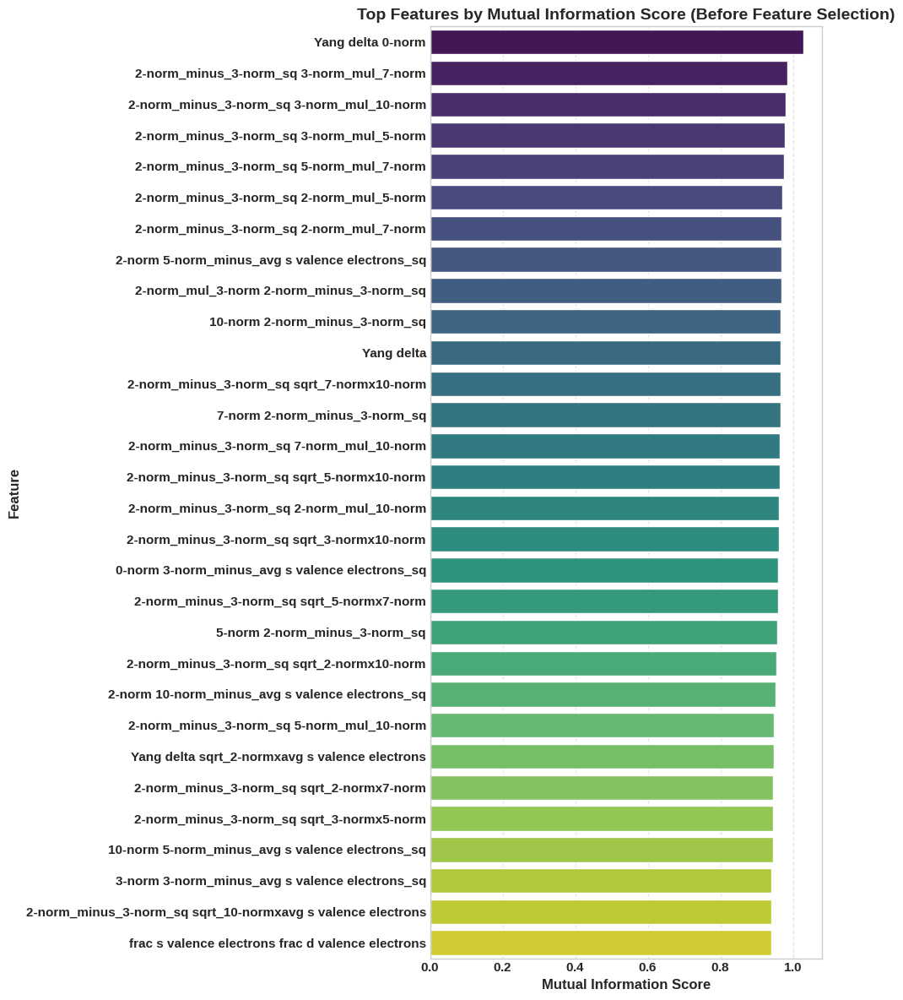


Starting Hyperparameter Tuning with 162 combinations...

--- Tuning Run 1/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-06, 'dropout_rate': 0.2, 'batch_size': 32, 'n_features_rfe': 20}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0127

--- Tuning Run 2/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-06, 'dropout_rate': 0.2, 'batch_size': 32, 'n_features_rfe': 30}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0128

--- Tuning Run 3/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-06, 'dropout_rate': 0.2, 'batch_size': 32, 'n_features_rfe': 40}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0136

--- Tuning Run 4/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-06, 'dropout_rate': 0.2, 'batch_size': 64, 'n_features_rfe': 20}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0124

--- Tuning Run 5/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-06, 'dropout_rate': 0.2, 'batch_size': 64, 'n_features_rfe': 30}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0136

--- Tuning Run 6/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-06, 'dropout_rate': 0.2, 'batch_size': 64, 'n_features_rfe': 40}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0143

--- Tuning Run 7/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-06, 'dropout_rate': 0.4, 'batch_size': 32, 'n_features_rfe': 20}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0147

--- Tuning Run 8/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-06, 'dropout_rate': 0.4, 'batch_size': 32, 'n_features_rfe': 30}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0123

--- Tuning Run 9/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-06, 'dropout_rate': 0.4, 'batch_size': 32, 'n_features_rfe': 40}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0153

--- Tuning Run 10/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-06, 'dropout_rate': 0.4, 'batch_size': 64, 'n_features_rfe': 20}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0212

--- Tuning Run 11/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-06, 'dropout_rate': 0.4, 'batch_size': 64, 'n_features_rfe': 30}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0148

--- Tuning Run 12/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-06, 'dropout_rate': 0.4, 'batch_size': 64, 'n_features_rfe': 40}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0142

--- Tuning Run 13/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-06, 'dropout_rate': 0.6, 'batch_size': 32, 'n_features_rfe': 20}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0195

--- Tuning Run 14/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-06, 'dropout_rate': 0.6, 'batch_size': 32, 'n_features_rfe': 30}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0390

--- Tuning Run 15/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-06, 'dropout_rate': 0.6, 'batch_size': 32, 'n_features_rfe': 40}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0256

--- Tuning Run 16/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-06, 'dropout_rate': 0.6, 'batch_size': 64, 'n_features_rfe': 20}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0423

--- Tuning Run 17/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-06, 'dropout_rate': 0.6, 'batch_size': 64, 'n_features_rfe': 30}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0425

--- Tuning Run 18/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-06, 'dropout_rate': 0.6, 'batch_size': 64, 'n_features_rfe': 40}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0252

--- Tuning Run 19/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-05, 'dropout_rate': 0.2, 'batch_size': 32, 'n_features_rfe': 20}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0144

--- Tuning Run 20/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-05, 'dropout_rate': 0.2, 'batch_size': 32, 'n_features_rfe': 30}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0131

--- Tuning Run 21/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-05, 'dropout_rate': 0.2, 'batch_size': 32, 'n_features_rfe': 40}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0124

--- Tuning Run 22/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-05, 'dropout_rate': 0.2, 'batch_size': 64, 'n_features_rfe': 20}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0132

--- Tuning Run 23/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-05, 'dropout_rate': 0.2, 'batch_size': 64, 'n_features_rfe': 30}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0140

--- Tuning Run 24/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-05, 'dropout_rate': 0.2, 'batch_size': 64, 'n_features_rfe': 40}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0144

--- Tuning Run 25/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-05, 'dropout_rate': 0.4, 'batch_size': 32, 'n_features_rfe': 20}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0125

--- Tuning Run 26/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-05, 'dropout_rate': 0.4, 'batch_size': 32, 'n_features_rfe': 30}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0114

--- Tuning Run 27/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-05, 'dropout_rate': 0.4, 'batch_size': 32, 'n_features_rfe': 40}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0118

--- Tuning Run 28/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-05, 'dropout_rate': 0.4, 'batch_size': 64, 'n_features_rfe': 20}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0187

--- Tuning Run 29/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-05, 'dropout_rate': 0.4, 'batch_size': 64, 'n_features_rfe': 30}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0148

--- Tuning Run 30/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-05, 'dropout_rate': 0.4, 'batch_size': 64, 'n_features_rfe': 40}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0144

--- Tuning Run 31/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-05, 'dropout_rate': 0.6, 'batch_size': 32, 'n_features_rfe': 20}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0203

--- Tuning Run 32/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-05, 'dropout_rate': 0.6, 'batch_size': 32, 'n_features_rfe': 30}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0464

--- Tuning Run 33/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-05, 'dropout_rate': 0.6, 'batch_size': 32, 'n_features_rfe': 40}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0285

--- Tuning Run 34/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-05, 'dropout_rate': 0.6, 'batch_size': 64, 'n_features_rfe': 20}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0580

--- Tuning Run 35/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-05, 'dropout_rate': 0.6, 'batch_size': 64, 'n_features_rfe': 30}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0232

--- Tuning Run 36/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 1e-05, 'dropout_rate': 0.6, 'batch_size': 64, 'n_features_rfe': 40}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0337

--- Tuning Run 37/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 0.0001, 'dropout_rate': 0.2, 'batch_size': 32, 'n_features_rfe': 20}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0142

--- Tuning Run 38/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 0.0001, 'dropout_rate': 0.2, 'batch_size': 32, 'n_features_rfe': 30}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0126

--- Tuning Run 39/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 0.0001, 'dropout_rate': 0.2, 'batch_size': 32, 'n_features_rfe': 40}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0137

--- Tuning Run 40/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 0.0001, 'dropout_rate': 0.2, 'batch_size': 64, 'n_features_rfe': 20}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0138

--- Tuning Run 41/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 0.0001, 'dropout_rate': 0.2, 'batch_size': 64, 'n_features_rfe': 30}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0137

--- Tuning Run 42/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 0.0001, 'dropout_rate': 0.2, 'batch_size': 64, 'n_features_rfe': 40}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0125

--- Tuning Run 43/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 0.0001, 'dropout_rate': 0.4, 'batch_size': 32, 'n_features_rfe': 20}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0142

--- Tuning Run 44/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 0.0001, 'dropout_rate': 0.4, 'batch_size': 32, 'n_features_rfe': 30}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0135

--- Tuning Run 45/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 0.0001, 'dropout_rate': 0.4, 'batch_size': 32, 'n_features_rfe': 40}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0134

--- Tuning Run 46/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 0.0001, 'dropout_rate': 0.4, 'batch_size': 64, 'n_features_rfe': 20}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0287

--- Tuning Run 47/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 0.0001, 'dropout_rate': 0.4, 'batch_size': 64, 'n_features_rfe': 30}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0167

--- Tuning Run 48/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 0.0001, 'dropout_rate': 0.4, 'batch_size': 64, 'n_features_rfe': 40}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0110

--- Tuning Run 49/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 0.0001, 'dropout_rate': 0.6, 'batch_size': 32, 'n_features_rfe': 20}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0168

--- Tuning Run 50/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 0.0001, 'dropout_rate': 0.6, 'batch_size': 32, 'n_features_rfe': 30}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0172

--- Tuning Run 51/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 0.0001, 'dropout_rate': 0.6, 'batch_size': 32, 'n_features_rfe': 40}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0205

--- Tuning Run 52/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 0.0001, 'dropout_rate': 0.6, 'batch_size': 64, 'n_features_rfe': 20}


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


  Run Val Loss: 0.0561

--- Tuning Run 53/162 ---
Parameters: {'learning_rate': 5e-05, 'weight_decay': 0.0001, 'dropout_rate': 0.6, 'batch_size': 64, 'n_features_rfe': 30}


KeyboardInterrupt: 

In [81]:
import pandas as pd
import numpy as np
import sys
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from sklearn.feature_selection import mutual_info_regression, RFE
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE # For t-SNE plot
from pandas.plotting import parallel_coordinates # For parallel coordinates plot
import itertools # For hyperparameter grid search

# Set consistent style and random seed for reproducibility
plt.style.use('seaborn-v0_8-whitegrid') # Updated to a more recent seaborn style
sns.set_palette('viridis')
np.random.seed(42)
torch.manual_seed(42)

# Define constants
INPUT_FILE = 'corrosion_refined.csv'
TARGET_COLUMN = 'EtoJ'
CATEGORICAL_FEATURES = [
    'MfgRoute',
    'Process_Clustered',
    'Coolingmedium_Clustered',
    'Solution_Clustered'
]

# Neural network definition - STICKING TO THIS EXACT MODEL
class RegressionNN(nn.Module):
    def __init__(self, input_dim, dropout_rate=0.4):
        super(RegressionNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, 256)
        self.bn1 = nn.BatchNorm1d(256)
        self.fc2 = nn.Linear(256, 128)
        self.bn2 = nn.BatchNorm1d(128)
        self.fc3 = nn.Linear(128, 64)
        self.bn3 = nn.BatchNorm1d(64)
        self.fc4 = nn.Linear(64, 32)
        self.dropout = nn.Dropout(dropout_rate) # Dropout rate is now a parameter
        self.fc5 = nn.Linear(32, 1)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.relu(self.bn1(self.fc1(x)))
        x = self.dropout(x)
        x = self.relu(self.bn2(self.fc2(x)))
        x = self.dropout(x)
        x = self.relu(self.bn3(self.fc3(x)))
        x = self.relu(self.fc4(x))
        return self.fc5(x)

# Custom weighted MSE loss
class WeightedMSELoss(nn.Module):
    def __init__(self):
        super(WeightedMSELoss, self).__init__()

    def forward(self, predictions, targets):
        # Weights increase significantly for targets > 0.6
        # Sigmoid creates a smooth transition. `targets - 0.6` shifts the center, `0.1` controls steepness.
        weights = 1.0 + 5.0 * torch.sigmoid((targets - 0.6) / 0.1)
        return (weights * (predictions - targets)**2).mean()

# Function to compute MI and plot
def perform_mutual_information_analysis(X, y, categorical_features_list, target_col):
    """Calculates Mutual Information scores and visualizes top features.

    Robustly handles NaNs and ensures correct data types for sklearn's MI function.
    """
    # Ensure all data is numeric and handle NaNs for MI calculation in X
    X_mi = X.apply(pd.to_numeric, errors='coerce').fillna(0)

    # y is a NumPy array, convert to Series with X's index for proper alignment during concat
    y_series_for_mi = pd.Series(y.flatten(), name=target_col, index=X.index)
    y_mi_numeric = pd.to_numeric(y_series_for_mi, errors='coerce')

    # Align X and y by dropping rows with NaNs in either
    combined_df = pd.concat([X_mi, y_mi_numeric], axis=1).dropna()

    X_mi_cleaned = combined_df.drop(columns=[target_col])
    y_mi_cleaned = combined_df[target_col].values # Convert back to numpy array for mutual_info_regression

    if X_mi_cleaned.empty or len(y_mi_cleaned) == 0:
        print("Error: No valid data remaining after NaN handling for MI analysis. Returning empty series.")
        return pd.Series() # Return empty series if no data

    # Identify discrete features (indices) in the X_mi_cleaned DataFrame
    discrete_features_indices = []
    for orig_cat_feat in categorical_features_list:
        for i, col_name in enumerate(X_mi_cleaned.columns):
            if orig_cat_feat in col_name.split('_') or orig_cat_feat == col_name:
                discrete_features_indices.append(i)

    discrete_features_indices = list(set(discrete_features_indices)) # Remove duplicates

    mi_discrete_features_arg = 'auto'
    if not discrete_features_indices:
        print("Warning: No discrete features identified for MI analysis based on provided list and column names. MI will treat all features as continuous.")
    else:
        mi_discrete_features_arg = discrete_features_indices

    if X_mi_cleaned.shape[0] < 2 or X_mi_cleaned.shape[1] == 0:
        print(f"Warning: Insufficient samples ({X_mi_cleaned.shape[0]}) or features ({X_mi_cleaned.shape[1]}) for MI analysis. mutual_info_regression requires at least 2 samples and > 0 features. Returning empty series.")
        return pd.Series()

    mi = mutual_info_regression(X_mi_cleaned, y_mi_cleaned, discrete_features=mi_discrete_features_arg, random_state=42)
    mi_series = pd.Series(mi, index=X_mi_cleaned.columns).sort_values(ascending=False)

    print("\nMutual Information Scores (Top 20):")
    print(mi_series.head(20))

    plt.figure(figsize=(10,12))
    if not mi_series.empty:
        plot_mi_series = mi_series.head(min(30, len(mi_series))) # Plot up to 30 features
        sns.barplot(x=plot_mi_series.values, y=plot_mi_series.index, palette='viridis')
        plt.title('Top Features by Mutual Information Score (Before Feature Selection)', fontsize=14)
        plt.xlabel('Mutual Information Score', fontsize=12)
        plt.ylabel('Feature', fontsize=12)
        plt.grid(axis='x', linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()
    else:
        print("MI series is empty, skipping MI bar plot.")

    return mi_series

# Model training with early stopping
def train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, epochs, patience, run_warmup=True, warmup_epochs=50, end_warmup_lr=1e-4, verbose=True):
    best_val_loss = float('inf')
    wait = 0
    history = {'train': [], 'val': []}
    best_model_state = None

    if run_warmup:
        if verbose: print("\nBeginning LR Warmup phase...")
        for e in range(warmup_epochs):
            model.train()
            # Manually set LR for warmup phase
            for pg in optimizer.param_groups:
                pg['lr'] = end_warmup_lr * (e+1) / warmup_epochs

            tr_loss_warmup = 0
            for Xb, yb in train_loader:
                optimizer.zero_grad()
                loss = criterion(model(Xb), yb)
                loss.backward()
                optimizer.step()
                tr_loss_warmup += loss.item() * Xb.size(0)
            tr_loss_warmup /= len(train_loader.dataset)

            if verbose and (e % 10 == 0 or e == warmup_epochs - 1):
                print(f"Warmup {e}/{warmup_epochs}, Current LR: {optimizer.param_groups[0]['lr']:.6f}, Loss: {tr_loss_warmup:.4f}")
        if verbose: print("LR Warmup phase complete.")

    for epoch in range(epochs):
        # Train
        model.train()
        tr_loss = 0
        for Xb, yb in train_loader:
            optimizer.zero_grad()
            pred = model(Xb)
            loss = criterion(pred, yb)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()
            tr_loss += loss.item() * Xb.size(0)
        tr_loss /= len(train_loader.dataset)
        history['train'].append(tr_loss)

        # Validate
        model.eval()
        val_loss = 0
        with torch.no_grad():
            for Xb, yb in val_loader:
                pred = model(Xb)
                val_loss += criterion(pred, yb).item() * Xb.size(0)
        val_loss /= len(val_loader.dataset)
        history['val'].append(val_loss)

        scheduler.step(val_loss) # Scheduler steps based on validation loss

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_state = model.state_dict() # Store state dict directly
            wait = 0
        else:
            wait += 1
            if wait >= patience:
                if verbose: print(f"Early stopping at epoch {epoch}")
                break
        if verbose and epoch % 50 == 0:
            print(f"Epoch {epoch}: Train {tr_loss:.4f}, Val {val_loss:.4f}")

    # Load best model state if it was saved
    if best_model_state is not None:
        model.load_state_dict(best_model_state)
    return history, best_val_loss

# Evaluation
def evaluate_model(model, loader, inv_transform=None):
    """Evaluates the model and calculates R2, MAE, MSE, MAPE.

    Args:
        model: Trained PyTorch model.
        loader: DataLoader for the dataset (train or validation).
        inv_transform: Function to inverse transform predictions and actuals (e.g., np.expm1 for log1p).

    Returns:
        tuple: (R2, MAE, MSE, MAPE, actuals, predictions)
    """
    model.eval()
    preds, trues = [], []
    with torch.no_grad():
        for Xb, yb in loader:
            out = model(Xb)
            if inv_transform:
                preds.extend(inv_transform(out.cpu().numpy()).squeeze().tolist())
                trues.extend(inv_transform(yb.cpu().numpy()).squeeze().tolist())
            else:
                preds.extend(out.squeeze().tolist())
                trues.extend(yb.squeeze().tolist())
    preds, trues = np.array(preds), np.array(trues)

    finite_mask = np.isfinite(trues) & np.isfinite(preds)
    if not np.all(finite_mask):
        print(f"Warning: Non-finite values detected in actuals or predictions for evaluation. Filtering them out. ({np.sum(~finite_mask)} values removed)")
        trues = trues[finite_mask]
        preds = preds[finite_mask]

    if len(trues) == 0:
        print("Warning: No finite actual/prediction pairs remaining for metric calculation.")
        return np.nan, np.nan, np.nan, np.nan, np.array([]), np.array([])

    r2 = r2_score(trues, preds)
    mae = mean_absolute_error(trues, preds)
    mse = mean_squared_error(trues, preds)

    non_zero_trues_mask = trues != 0
    if np.sum(non_zero_trues_mask) > 0:
        mape = np.mean(np.abs((trues[non_zero_trues_mask]-preds[non_zero_trues_mask])/trues[non_zero_trues_mask]))*100
    else:
        mape = np.nan
        print("Warning: All true values are zero, MAPE is undefined.")

    return r2, mae, mse, mape, trues, preds # Also return trues and preds for plotting

# Plotting functions
def plot_learning_curve(train_losses, val_losses):
    """Plots the training and validation loss curves."""
    plt.figure(figsize=(10, 6))
    plt.plot(train_losses, label='Training Loss', color='blue', linewidth=2)
    plt.plot(val_losses, label='Validation Loss', color='red', linewidth=2)
    plt.title('Learning Curve', fontsize=16)
    plt.xlabel('Epoch', fontsize=12)
    plt.ylabel('Loss (Weighted MSE)', fontsize=12)
    plt.legend(fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

def plot_parity(actuals, predictions, r2, title="Parity Plot"):
    """Generates a parity plot (actual vs. predicted values)."""
    plt.figure(figsize=(8, 8))
    plt.scatter(actuals, predictions, alpha=0.6, color='skyblue', edgecolors='w', linewidth=0.5)

    min_val = np.nanmin([np.nanmin(actuals), np.nanmin(predictions)]) if np.isfinite(np.nanmin(actuals)) and np.isfinite(np.nanmin(predictions)) else 0
    max_val = np.nanmax([np.nanmax(actuals), np.nanmax(predictions)]) if np.isfinite(np.nanmax(actuals)) and np.isfinite(np.nanmax(predictions)) else 1

    if max_val - min_val < 1e-6: # Handle cases where data range is very small
        buffer = 0.1
        min_val -= buffer
        max_val += buffer

    plt.plot([min_val, max_val], [min_val, max_val], 'r--', label='Ideal Fit (y=x)', linewidth=2)
    plt.title(f'{title} (R² = {r2:.4f})', fontsize=16)
    plt.xlabel('Actual Values', fontsize=12)
    plt.ylabel('Predicted Values', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.text(0.05, 0.95, f'R² = {r2:.4f}', transform=plt.gca().transAxes, fontsize=12,
             verticalalignment='top', bbox=dict(boxstyle='round,pad=0.5', fc='wheat', alpha=0.8, ec='gray'))
    plt.legend(fontsize=10, loc='lower right')
    plt.tight_layout()
    plt.show()

def plot_mi_after_selection(mi_series_selected):
    """Plots Mutual Information scores for selected features."""
    plt.figure(figsize=(10, 12))
    mi_series_selected_sorted = mi_series_selected.sort_values(ascending=False)
    if not mi_series_selected_sorted.empty:
        sns.barplot(x=mi_series_selected_sorted.values, y=mi_series_selected_sorted.index, palette='viridis')
        plt.title('Mutual Information Scores (After Feature Selection)', fontsize=14)
        plt.xlabel('Mutual Information Score', fontsize=12)
        plt.ylabel('Feature', fontsize=12)
        plt.grid(axis='x', linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()
    else:
        print("MI series after selection is empty, skipping plot.")


if __name__ == '__main__':
    # Load data
    try:
        df = pd.read_csv(INPUT_FILE)
        print(f"Successfully loaded '{INPUT_FILE}' with shape: {df.shape}")
    except FileNotFoundError:
        print(f"File '{INPUT_FILE}' not found. Please ensure the file exists in the current directory.")
        sys.exit(1)
    except Exception as e:
        print(f"An error occurred while loading the CSV: {e}")
        sys.exit(1)

    # Separate target from features
    y = pd.to_numeric(df[TARGET_COLUMN], errors='coerce').values
    X = df.drop(columns=[TARGET_COLUMN]).copy()

    # Coerce all feature columns to numeric, filling NaNs
    for c in X.columns:
        X[c] = pd.to_numeric(X[c], errors='coerce').fillna(0)

    # Determine original composition columns for PCC analysis
    all_known_non_composition_features_in_original_df = ['T[oC]', 't[hr]', TARGET_COLUMN] + CATEGORICAL_FEATURES
    original_composition_cols = [
        col for col in df.columns
        if col not in all_known_non_composition_features_in_original_df
    ]

    # --- Enhanced Feature Engineering ---

    # Base process interactions
    if 'T[oC]' in X.columns and 't[hr]' in X.columns:
        X['T_t_interaction'] = (X['T[oC]'] * X['t[hr]']).fillna(0)
        X['T_squared'] = (X['T[oC]']**2).fillna(0)
        X['t_squared'] = (X['t[hr]']**2).fillna(0)
        X['1_over_t'] = (1 / (X['t[hr]'] + 1e-6)).fillna(0)
    else:
        print("Warning: Missing 'T[oC]' or 't[hr]' for process interaction features.")

    # --- PCC Analysis on original composition only ---
    df_for_pcc = df[original_composition_cols + [TARGET_COLUMN]].copy()
    for col in df_for_pcc.columns:
        df_for_pcc[col] = pd.to_numeric(df_for_pcc[col], errors='coerce')
    df_for_pcc = df_for_pcc.dropna()

    strong_comps = []
    if not df_for_pcc.empty and TARGET_COLUMN in df_for_pcc.columns:
        if len(df_for_pcc) > 1 and len(df_for_pcc[TARGET_COLUMN].unique()) > 1:
            pcc = df_for_pcc.corr().loc[original_composition_cols, TARGET_COLUMN]
            strong = pcc.abs() > 0.35
            strong_comps = pcc[strong].index.tolist()
            print(f"\nIdentified {len(strong_comps)} strongly correlated original composition features (PCC > 0.35): {strong_comps}")
        else:
            print("Warning: Not enough data points or variability in target for meaningful PCC analysis. Strong composition features list will be empty.")
    else:
        print("Warning: df_for_pcc is empty or target column missing. Strong composition features list will be empty.")

    # --- Cross-terms between process parameters and top composition features ---
    if not strong_comps:
        # Fallback list if no strong correlations found, ensuring columns exist in X
        top_comps_for_interactions = [
            '2-norm', '3-norm', 'avg s valence electrons',
            'Yang delta', 'frac d valence electrons', '10-norm',
            'HOMO_energy', 'LUMO_energy'
        ]
        top_comps_for_interactions = [c for c in top_comps_for_interactions if c in X.columns]
        print(f"Using a default list for process-composition interactions as no strong_comps were found: {top_comps_for_interactions}")
    else:
        top_comps_for_interactions = [c for c in strong_comps if c in X.columns]

    for comp in top_comps_for_interactions:
        if comp in X.columns and 'T[oC]' in X.columns and 't[hr]' in X.columns:
            X[f'T_x_{comp}'] = (X['T[oC]'] * X[comp]).fillna(0)
            X[f't_x_{comp}'] = (X['t[hr]'] * X[comp]).fillna(0)
            X[f'ln_abs_{comp}_x_T'] = (np.log1p(np.abs(X[comp]) + 1e-6) * X['T[oC]']).fillna(0) # Using abs for safety
            X[f'{comp}_over_t'] = (X[comp] / (X['t[hr]'] + 1e-6)).fillna(0)
        else:
            print(f"Skipping process-composition interaction for {comp}: one or more base columns missing or not numeric.")

    # --- Composition-composition interactions based on strongly correlated features ---
    valid_strong_comps = [c for c in strong_comps if c in X.columns]
    if len(valid_strong_comps) > 1:
        for i in range(len(valid_strong_comps)):
            for j in range(i + 1, len(valid_strong_comps)):
                comp_i = valid_strong_comps[i]
                comp_j = valid_strong_comps[j]
                X[f'{comp_i}_mul_{comp_j}'] = (X[comp_i] * X[comp_j]).fillna(0)
                X[f'{comp_i}_minus_{comp_j}_sq'] = ((X[comp_i] - X[comp_j])**2).fillna(0)
                X[f'sqrt_{comp_i}x{comp_j}'] = (np.sqrt(np.abs(X[comp_i]*X[comp_j]) + 1e-6)).fillna(0)
    elif len(valid_strong_comps) == 1:
        print("Only one strongly correlated composition feature, skipping composition-composition interactions.")
    else:
        print("No valid strongly correlated composition features for composition-composition interactions.")

    # --- HOMO-LUMO gap and its interaction with Temperature ---
    if 'LUMO_energy' in X.columns and 'HOMO_energy' in X.columns and 'T[oC]' in X.columns:
        X['homo_lumo_gap'] = (X['LUMO_energy'] - X['HOMO_energy']).fillna(0)
        X['sqrt_gap_x_T'] = (np.sqrt(np.abs(X['homo_lumo_gap']) + 1e-6) * X['T[oC]']).fillna(0)
    else:
        print("Skipping HOMO-LUMO gap features: 'LUMO_energy', 'HOMO_energy', or 'T[oC]' columns missing.")

    print(f"Finished feature engineering. Current X shape: {X.shape}")

    # --- Encoding categoricals ---
    existing_categorical_features = [f for f in CATEGORICAL_FEATURES if f in X.columns]
    if existing_categorical_features:
        X = pd.get_dummies(X, columns=existing_categorical_features, drop_first=True)
        print(f"One-hot encoded categorical features. Current X shape: {X.shape}")
    else:
        print("No specified categorical features found in the DataFrame to encode.")

    # Ensure all data is numeric before polynomial features
    X_for_poly = X.copy().apply(pd.to_numeric, errors='coerce').fillna(0)

    # --- Polynomial Features ---
    poly = PolynomialFeatures(degree=2, include_bias=False)
    try:
        X_poly_transformed = poly.fit_transform(X_for_poly)
        X_poly = pd.DataFrame(X_poly_transformed, columns=poly.get_feature_names_out(X_for_poly.columns), index=X_for_poly.index)
        # Re-fill NaNs after poly transform as it can sometimes introduce them
        X_poly = X_poly.apply(pd.to_numeric, errors='coerce').fillna(0)
        print(f"\nPolynomial features generated. New feature count: {X_poly.shape[1]}")
    except Exception as e:
        print(f"Error during PolynomialFeatures transformation: {e}")
        print("Proceeding without polynomial features, using original X (after initial engineering and encoding).")
        X_poly = X_for_poly.copy() # Fallback to X_for_poly if polynomial fails

    # --- MI Analysis ---
    # Need to correctly identify discrete features in the X_poly space
    discrete_idx_for_mi = []
    for orig_cat_feat in CATEGORICAL_FEATURES:
        for i, col_name in enumerate(X_poly.columns):
            if orig_cat_feat in col_name.split('_') or orig_cat_feat == col_name:
                discrete_idx_for_mi.append(i)
    discrete_idx_for_mi = list(set(discrete_idx_for_mi))

    print(f"\nIdentified {len(discrete_idx_for_mi)} discrete features in the polynomial-expanded set for MI analysis.")
    mi_series = perform_mutual_information_analysis(X_poly.copy(), y.copy(), CATEGORICAL_FEATURES, TARGET_COLUMN)
    if mi_series.empty:
        print("MI analysis resulted in an empty series. Cannot proceed with feature selection based on MI.")
        sys.exit(1)

    # --- Hyperparameter Tuning Setup ---
    # Define the grid of hyperparameters to search
    param_grid = {
        'learning_rate': [5e-5, 1e-4, 5e-4],
        'weight_decay': [1e-6, 1e-5, 1e-4],
        'dropout_rate': [0.2, 0.4, 0.6],
        'batch_size': [32, 64],
        'n_features_rfe': [20, 30, 40] # Number of features selected by RFE
    }

    # Number of epochs and patience for tuning trials (can be shorter than final training)
    tuning_epochs = 500
    tuning_patience = 50

    best_val_loss_overall = float('inf')
    best_params = None
    best_model_state_overall = None
    best_X_sel = None

    # Generate all combinations of hyperparameters
    keys, values = zip(*param_grid.items())
    hyperparameter_combinations = [dict(zip(keys, v)) for v in itertools.product(*values)]

    print(f"\nStarting Hyperparameter Tuning with {len(hyperparameter_combinations)} combinations...")
    for i, params in enumerate(hyperparameter_combinations):
        print(f"\n--- Tuning Run {i+1}/{len(hyperparameter_combinations)} ---")
        print(f"Parameters: {params}")

        # --- RFE Selection (inside tuning loop as n_features_rfe changes) ---
        lin = LinearRegression()
        n_features_to_select_rfe_current = params['n_features_rfe']

        if n_features_to_select_rfe_current > X_poly.shape[1]:
            print(f"Warning: RFE target features ({n_features_to_select_rfe_current}) > total features ({X_poly.shape[1]}). Adjusting n_features_to_select_rfe to {X_poly.shape[1]}.")
            n_features_to_select_rfe_current = X_poly.shape[1]

        selector = RFE(lin, n_features_to_select=n_features_to_select_rfe_current, step=1)

        X_poly_cleaned_for_rfe = X_poly.copy().apply(pd.to_numeric, errors='coerce').fillna(0)
        y_series_for_rfe = pd.Series(y.flatten(), name='temp_target', index=X_poly_cleaned_for_rfe.index)
        y_cleaned_numeric_for_rfe = pd.to_numeric(y_series_for_rfe, errors='coerce')

        temp_df_rfe = pd.concat([X_poly_cleaned_for_rfe, y_cleaned_numeric_for_rfe], axis=1).dropna()
        X_poly_cleaned_aligned = temp_df_rfe.drop(columns=['temp_target'])
        y_cleaned_aligned = temp_df_rfe['temp_target'].values

        if X_poly_cleaned_aligned.empty or len(y_cleaned_aligned) == 0:
            print("Error: No valid data remaining after NaN handling for RFE. Skipping this tuning run.")
            continue # Skip to next hyperparameter combination

        selected_rfe_features = []
        try:
            selector.fit(X_poly_cleaned_aligned, y_cleaned_aligned)
            selected_rfe_features = list(X_poly_cleaned_aligned.columns[selector.support_])
        except Exception as e:
            print(f"Error during RFE fitting for this run: {e}. Fallback to MI top features.")
            selected_rfe_features = mi_series.head(n_features_to_select_rfe_current).index.tolist()
            selected_rfe_features = [f for f in selected_rfe_features if f in X_poly.columns]
            if not selected_rfe_features:
                print("Warning: Fallback MI features list is empty or features not found. Skipping this tuning run.")
                continue # Skip to next hyperparameter combination


        mandatory_base_features = ['T[oC]', 't[hr]'] + CATEGORICAL_FEATURES
        mandatory_features_in_poly_space = []
        for base_feat in mandatory_base_features:
            for col_name in X_poly.columns:
                if base_feat == col_name or (base_feat + '_' in col_name and base_feat in col_name.split('_')) or (base_feat in col_name.split(' ') and '_' not in base_feat):
                    mandatory_features_in_poly_space.append(col_name)

        mandatory_features_in_poly_space = list(set(mandatory_features_in_poly_space))
        mandatory_features_in_poly_space = [f for f in mandatory_features_in_poly_space if f in X_poly.columns]

        final_selected_features = list(set(selected_rfe_features + mandatory_features_in_poly_space))
        final_selected_features = [f for f in final_selected_features if f in X_poly.columns]

        if not final_selected_features:
            print("Error: No features selected for training in this run. Skipping.")
            continue

        X_sel_current = X_poly[final_selected_features].copy()

        # --- Scale and split (inside tuning loop as X_sel_current changes) ---
        scaler = StandardScaler()
        X_scaled_current = scaler.fit_transform(X_sel_current)
        y_log = np.log1p(y).reshape(-1,1) # Target is always the same

        # Synthetic data generation for high EtoJ values (consistent)
        y_aligned_to_X_sel = pd.Series(y.flatten(), index=df.index).loc[X_sel_current.index].values
        mask_high_log = y_aligned_to_X_sel > 0.6
        n_majority_samples = np.sum(~mask_high_log)
        n_synthetic_samples_target = int(0.3 * n_majority_samples)

        X_synth = X_scaled_current.copy()
        y_synth = y_log.copy()

        if np.sum(mask_high_log) > 0 and n_synthetic_samples_target > 0:
            high_indices_in_aligned_data = np.where(mask_high_log)[0]
            if len(high_indices_in_aligned_data) > 0:
                synth_indices_from_high = np.random.choice(len(high_indices_in_aligned_data), n_synthetic_samples_target, replace=True)
                X_high_samples = X_scaled_current[high_indices_in_aligned_data[synth_indices_from_high]]
                y_log_high_samples = y_log[high_indices_in_aligned_data[synth_indices_from_high]]
                synth_X_added = X_high_samples + np.random.normal(0, 0.01, size=X_high_samples.shape)
                synth_y_added = y_log_high_samples + np.random.normal(0, 0.01, size=y_log_high_samples.shape)
                X_synth = np.vstack([X_scaled_current, synth_X_added])
                y_synth = np.vstack([y_log, synth_y_added])
        # else: print("Skipping synthetic data generation in tuning run.")


        X_t_current = torch.tensor(X_synth, dtype=torch.float32)
        y_t_current = torch.tensor(y_synth, dtype=torch.float32)

        # Split data for this tuning run
        X_tr, X_val, y_tr, y_val = train_test_split(X_t_current, y_t_current, test_size=0.15, random_state=42)

        train_loader = DataLoader(TensorDataset(X_tr, y_tr), batch_size=params['batch_size'], shuffle=True)
        val_loader   = DataLoader(TensorDataset(X_val, y_val), batch_size=params['batch_size'], shuffle=False)

        # --- Model setup for current params ---
        model_current = RegressionNN(X_tr.shape[1], dropout_rate=params['dropout_rate'])
        criterion = WeightedMSELoss()
        opt_current = optim.Adam(model_current.parameters(), lr=params['learning_rate'], weight_decay=params['weight_decay'])
        sched_current = optim.lr_scheduler.CosineAnnealingLR(opt_current, T_max=tuning_epochs) # T_max based on tuning epochs

        # Train model for this set of hyperparameters
        history_current, current_val_loss = train_model(
            model_current, train_loader, val_loader, criterion, opt_current, sched_current,
            epochs=tuning_epochs, patience=tuning_patience,
            run_warmup=True, end_warmup_lr=params['learning_rate'], # Warmup ends at the current LR
            verbose=False # Suppress detailed output during tuning
        )
        print(f"  Run Val Loss: {current_val_loss:.4f}")

        # Check if this is the best model so far
        if current_val_loss < best_val_loss_overall:
            best_val_loss_overall = current_val_loss
            best_params = params
            best_model_state_overall = model_current.state_dict() # Save the state dict
            best_X_sel = X_sel_current # Save the selected features DataFrame for the best model

    print("\n--- Hyperparameter Tuning Complete ---")
    if best_params:
        print(f"Best Validation Loss: {best_val_loss_overall:.4f}")
        print(f"Best Hyperparameters: {best_params}")
    else:
        print("No successful tuning runs. Exiting.")
        sys.exit(1)

    # --- Final Training with Best Parameters ---
    print("\n--- Final Model Training with Best Hyperparameters ---")

    # Re-prepare data using best_X_sel (features selected by the best run)
    scaler = StandardScaler()
    X_scaled_final = scaler.fit_transform(best_X_sel)
    y_log_final = np.log1p(y).reshape(-1,1)

    # Synthetic data generation with the best feature set
    y_aligned_to_best_X_sel = pd.Series(y.flatten(), index=df.index).loc[best_X_sel.index].values
    mask_high_log_final = y_aligned_to_best_X_sel > 0.6
    n_majority_samples_final = np.sum(~mask_high_log_final)
    n_synthetic_samples_target_final = int(0.3 * n_majority_samples_final)

    X_synth_final = X_scaled_final.copy()
    y_synth_final = y_log_final.copy()

    if np.sum(mask_high_log_final) > 0 and n_synthetic_samples_target_final > 0:
        high_indices_in_aligned_data_final = np.where(mask_high_log_final)[0]
        if len(high_indices_in_aligned_data_final) > 0:
            synth_indices_from_high_final = np.random.choice(len(high_indices_in_aligned_data_final), n_synthetic_samples_target_final, replace=True)
            X_high_samples_final = X_scaled_final[high_indices_in_aligned_data_final[synth_indices_from_high_final]]
            y_log_high_samples_final = y_log_final[high_indices_in_aligned_data_final[synth_indices_from_high_final]]
            synth_X_added_final = X_high_samples_final + np.random.normal(0, 0.01, size=X_high_samples_final.shape)
            synth_y_added_final = y_log_high_samples_final + np.random.normal(0, 0.01, size=y_log_high_samples_final.shape)
            X_synth_final = np.vstack([X_scaled_final, synth_X_added_final])
            y_synth_final = np.vstack([y_log_final, synth_y_added_final])

    X_t_final = torch.tensor(X_synth_final, dtype=torch.float32)
    y_t_final = torch.tensor(y_synth_final, dtype=torch.float32)

    X_tr_final, X_val_final, y_tr_final, y_val_final = train_test_split(X_t_final, y_t_final, test_size=0.15, random_state=42)

    train_loader_final = DataLoader(TensorDataset(X_tr_final, y_tr_final), batch_size=best_params['batch_size'], shuffle=True)
    val_loader_final   = DataLoader(TensorDataset(X_val_final, y_val_final), batch_size=best_params['batch_size'], shuffle=False)

    final_model = RegressionNN(X_tr_final.shape[1], dropout_rate=best_params['dropout_rate'])
    final_criterion = WeightedMSELoss()
    final_opt = optim.Adam(final_model.parameters(), lr=best_params['learning_rate'], weight_decay=best_params['weight_decay'])

    final_epochs = 1500 # Use full epochs for final training
    final_patience = 100
    final_sched = optim.lr_scheduler.CosineAnnealingLR(final_opt, T_max=final_epochs)

    final_history, _ = train_model(
        final_model, train_loader_final, val_loader_final, final_criterion, final_opt, final_sched,
        epochs=final_epochs, patience=final_patience,
        run_warmup=True, end_warmup_lr=best_params['learning_rate'], # Warmup for final model
        verbose=True # Show full training output for final model
    )

    # Load best state from final training run (which was saved by train_model)
    # The train_model function now directly loads the best state it finds back into the model
    # so we don't need to explicitly load 'best_model.pth' here if we only call it once for the final run.

    print("\n--- Evaluating Final Model Performance ---")
    inv_transform_y = lambda t: np.expm1(t) # Define inverse transform for evaluation

    r2_tr, mae_tr, mse_tr, mape_tr, train_actuals, train_predictions = evaluate_model(final_model, train_loader_final, inv_transform_y)
    r2_v , mae_v , mse_v , mape_v, val_actuals, val_predictions  = evaluate_model(final_model, val_loader_final, inv_transform_y)

    print(f"\n--- Final Model Performance ---")
    print(f"Train R2: {r2_tr:.4f}, MAE: {mae_tr:.4f}, MAPE: {mape_tr:.2f}%, MSE: {mse_tr:.4f}")
    print(f"Validation R2: {r2_v:.4f}, MAE: {mae_v:.4f}, MAPE: {mape_v:.2f}%, MSE: {mse_v:.4f}")

    # Plot learning curves and parity plots for the final model
    plot_learning_curve(final_history['train'], final_history['val'])
    plot_parity(train_actuals, train_predictions, r2_tr, title="Final Training Set Parity Plot")
    plot_parity(val_actuals, val_predictions, r2_v, title="Final Validation Set Parity Plot")

    # Plot MI for features selected by the best model
    plot_mi_after_selection(mi_series[mi_series.index.isin(best_X_sel.columns)])

    # For parallel coordinates and t-SNE, use best_X_sel
    common_indices_for_plot = best_X_sel.index.intersection(df.index)
    X_plot_features = best_X_sel.loc[common_indices_for_plot].copy()
    y_original_aligned_for_plot = df.loc[common_indices_for_plot, TARGET_COLUMN].values

    # Add target bins to the plotting dataframe
    X_plot_features[TARGET_COLUMN] = y_original_aligned_for_plot

    if len(X_plot_features[TARGET_COLUMN].unique()) > 1:
        try:
            X_plot_features['Target_Bins'] = pd.qcut(X_plot_features[TARGET_COLUMN], q=6, labels=False, duplicates='drop')
        except ValueError:
            print("Could not create 6 quantile bins for Target_Bins, trying with fewer.")
            try:
                X_plot_features['Target_Bins'] = pd.qcut(X_plot_features[TARGET_COLUMN], q=4, labels=False, duplicates='drop')
            except ValueError:
                print("Could not create 4 quantile bins either. Skipping Target_Bins.")
                X_plot_features['Target_Bins'] = pd.Series(0, index=X_plot_features.index) # Fallback to single bin
    else:
        print("Not enough unique target values to create bins for plotting. Target_Bins will be a single category.")
        X_plot_features['Target_Bins'] = pd.Series(0, index=X_plot_features.index) # Fallback to single bin

    # Select top MI features for Parallel Coordinates plot
    features_for_parallel = mi_series[mi_series.index.isin(best_X_sel.columns)].head(min(10, len(mi_series[mi_series.index.isin(best_X_sel.columns)]))).index.tolist()
    existing_plot_features = [f for f in features_for_parallel if f in X_plot_features.columns]

    if 'Target_Bins' in X_plot_features.columns and existing_plot_features:
        parallel_plot_df = X_plot_features[existing_plot_features + ['Target_Bins']].copy()

        scaler_for_plot = StandardScaler()
        numerical_cols_for_parallel = [col for col in existing_plot_features if pd.api.types.is_numeric_dtype(parallel_plot_df[col])]

        if numerical_cols_for_parallel:
            parallel_plot_df[numerical_cols_for_parallel] = scaler_for_plot.fit_transform(parallel_plot_df[numerical_cols_for_parallel])

        plt.figure(figsize=(14, 7))
        parallel_coordinates(parallel_plot_df, 'Target_Bins', colormap='viridis', alpha=0.5)
        plt.title(f'Parallel Coordinates Plot: Top {len(existing_plot_features)} Selected Features vs. {TARGET_COLUMN} Bins', fontsize=16)
        plt.xlabel('Features', fontsize=12)
        plt.ylabel('Normalized Value', fontsize=12)
        plt.xticks(rotation=45, ha='right', fontsize=10)
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()
    else:
        print("Skipping Parallel Coordinates Plot: Not enough valid features or 'Target_Bins' missing.")

    # t-SNE Plot
    tsne_input_data = best_X_sel.copy().apply(pd.to_numeric, errors='coerce').fillna(0)
    scaler_tsne = StandardScaler()
    tsne_scaled_data = scaler_tsne.fit_transform(tsne_input_data)

    if tsne_scaled_data.shape[0] > 1 and tsne_scaled_data.shape[1] > 1:
        perplexity_val = min(30, tsne_scaled_data.shape[0] - 1)
        if perplexity_val < 1: # Ensure perplexity is at least 1
            perplexity_val = 1
            print("Warning: Perplexity for t-SNE adjusted to 1 due to very small number of samples.")

        tsne = TSNE(n_components=2, random_state=42, perplexity=perplexity_val, n_iter=1000)
        try:
            X_tsne = tsne.fit_transform(tsne_scaled_data)
            tsne_df = pd.DataFrame(data=X_tsne, columns=['TSNE_Component_1', 'TSNE_Component_2'])

            # Align Target_Bins with t-SNE output, which is based on best_X_sel
            tsne_df['Target_Bins'] = X_plot_features['Target_Bins'].loc[best_X_sel.index].reset_index(drop=True)

            if 'Target_Bins' in tsne_df.columns:
                plt.figure(figsize=(10, 8))
                sns.scatterplot(x='TSNE_Component_1', y='TSNE_Component_2', hue='Target_Bins', palette='viridis', data=tsne_df, s=50, alpha=0.8)

                if tsne_df.shape[0] > 1:
                    try:
                        sns.kdeplot(x='TSNE_Component_1', y='TSNE_Component_2', data=tsne_df, cmap='Blues', alpha=0.3, levels=5)
                    except Exception as kde_e:
                        print(f"Could not draw KDE plot for t-SNE: {kde_e}")

                plt.title(f't-SNE Plot: Selected Features Colored by {TARGET_COLUMN} Bins', fontsize=16)
                plt.xlabel('t-SNE Component 1', fontsize=12)
                plt.ylabel('t-SNE Component 2', fontsize=12)
                plt.grid(True, linestyle='--', alpha=0.5)
                plt.tight_layout()
                plt.show()
            else:
                print("Skipping t-SNE Plot: 'Target_Bins' column not available.")

        except Exception as e:
            print(f"Error during t-SNE computation or plotting: {e}")
            print("Skipping t-SNE plot.")
    else:
        print(f"Skipping t-SNE Plot: Insufficient data samples ({tsne_scaled_data.shape[0]}) or features ({tsne_scaled_data.shape[1]}) for t-SNE.")

Successfully loaded 'corrosion_refined.csv' with shape: (287, 28)

Identified 6 strongly correlated original composition features (PCC > 0.35): ['2-norm', '3-norm', '5-norm', '7-norm', '10-norm', 'avg s valence electrons']
Finished initial feature engineering. Current X_fe shape: (287, 102)
One-hot encoded categorical features. Current X_fe shape: (287, 105)

Polynomial features generated. New feature count: 5670

Identified 8 discrete features in the polynomial-expanded set for MI analysis.


[I 2025-06-15 22:44:02,641] Using an existing study with name 'corrosion_regression_tuning' instead of creating a new one.



Mutual Information Scores (Top 20):
Yang delta 0-norm                                 1.028155
2-norm_minus_3-norm_sq 3-norm_mul_7-norm          0.983846
2-norm_minus_3-norm_sq 3-norm_mul_10-norm         0.979232
2-norm_minus_3-norm_sq 3-norm_mul_5-norm          0.977666
2-norm_minus_3-norm_sq 5-norm_mul_7-norm          0.975564
2-norm_minus_3-norm_sq 2-norm_mul_5-norm          0.970287
2-norm_minus_3-norm_sq 2-norm_mul_7-norm          0.968808
2-norm 5-norm_minus_avg s valence electrons_sq    0.968709
2-norm_mul_3-norm 2-norm_minus_3-norm_sq          0.968332
10-norm 2-norm_minus_3-norm_sq                    0.965384
Yang delta                                        0.964933
2-norm_minus_3-norm_sq sqrt_7-normx10-norm        0.964897
7-norm 2-norm_minus_3-norm_sq                     0.964503
2-norm_minus_3-norm_sq 7-norm_mul_10-norm         0.963053
2-norm_minus_3-norm_sq sqrt_5-normx10-norm        0.962222
2-norm_minus_3-norm_sq 2-norm_mul_10-norm         0.961810
2-norm_minus_3-norm

  0%|          | 0/50 [00:00<?, ?it/s]

/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

[I 2025-06-15 22:50:03,419] Trial 1 finished with value: 0.03631516599229404 and parameters: {'learning_rate': 5.6115164153345e-05, 'weight_decay': 0.0006351221010640698, 'dropout_rate': 0.49279757672456204, 'batch_size': 32, 'n_features_rfe': 17}. Best is trial 1 with value: 0.03631516599229404.


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

[I 2025-06-15 22:56:10,506] Trial 2 finished with value: 0.01184171624481678 and parameters: {'learning_rate': 0.0005399484409787432, 'weight_decay': 2.5378155082656606e-05, 'dropout_rate': 0.4832290311184182, 'batch_size': 64, 'n_features_rfe': 22}. Best is trial 2 with value: 0.01184171624481678.


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

[I 2025-06-15 23:01:37,173] Trial 3 finished with value: 0.034253405673163276 and parameters: {'learning_rate': 2.3102018878452926e-05, 'weight_decay': 5.415244119402535e-07, 'dropout_rate': 0.3216968971838151, 'batch_size': 32, 'n_features_rfe': 37}. Best is trial 2 with value: 0.01184171624481678.


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

[I 2025-06-15 23:07:07,967] Trial 4 finished with value: 0.04585546627640724 and parameters: {'learning_rate': 1.9010245319870364e-05, 'weight_decay': 1.4742753159914645e-06, 'dropout_rate': 0.3465447373174767, 'batch_size': 64, 'n_features_rfe': 33}. Best is trial 2 with value: 0.01184171624481678.


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

[I 2025-06-15 23:12:17,072] Trial 5 finished with value: 0.04412466287612915 and parameters: {'learning_rate': 0.00015304852121831474, 'weight_decay': 1.5339162591163606e-07, 'dropout_rate': 0.4430179407605753, 'batch_size': 128, 'n_features_rfe': 49}. Best is trial 2 with value: 0.01184171624481678.


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

[I 2025-06-15 23:17:38,669] Trial 6 finished with value: 0.012802515178918839 and parameters: {'learning_rate': 0.0004138040112561013, 'weight_decay': 1.6536937182824404e-06, 'dropout_rate': 0.23906884560255356, 'batch_size': 32, 'n_features_rfe': 32}. Best is trial 2 with value: 0.01184171624481678.


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

Trial 7 pruned.
[I 2025-06-15 23:23:04,092] Trial 7 pruned. 


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

Trial 8 pruned.
[I 2025-06-15 23:28:52,560] Trial 8 pruned. 


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

Trial 9 pruned.
[I 2025-06-15 23:34:29,020] Trial 9 pruned. 


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

[I 2025-06-15 23:40:14,370] Trial 10 finished with value: 0.0388076975941658 and parameters: {'learning_rate': 5.170191786366994e-05, 'weight_decay': 1.3296521457299496e-06, 'dropout_rate': 0.4170784332632994, 'batch_size': 64, 'n_features_rfe': 50}. Best is trial 2 with value: 0.01184171624481678.


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

[I 2025-06-15 23:45:36,455] Trial 11 finished with value: 0.016892559826374054 and parameters: {'learning_rate': 0.0009071731730117336, 'weight_decay': 4.181532171277182e-05, 'dropout_rate': 0.5878148443151463, 'batch_size': 128, 'n_features_rfe': 18}. Best is trial 2 with value: 0.01184171624481678.


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

[I 2025-06-15 23:51:18,326] Trial 12 finished with value: 0.013992039486765862 and parameters: {'learning_rate': 0.0005593881642861807, 'weight_decay': 1.5455082385721075e-05, 'dropout_rate': 0.21663287696827788, 'batch_size': 64, 'n_features_rfe': 24}. Best is trial 2 with value: 0.01184171624481678.


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

Trial 13 pruned.
[I 2025-06-15 23:56:42,966] Trial 13 pruned. 


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

[I 2025-06-16 00:02:31,147] Trial 14 finished with value: 0.014538638293743134 and parameters: {'learning_rate': 0.0003230674617349937, 'weight_decay': 5.1103332581513954e-06, 'dropout_rate': 0.36953770285334236, 'batch_size': 64, 'n_features_rfe': 27}. Best is trial 2 with value: 0.01184171624481678.


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

[I 2025-06-16 00:08:25,492] Trial 15 finished with value: 0.012631590478122234 and parameters: {'learning_rate': 0.00018296113632150133, 'weight_decay': 4.406772202142147e-06, 'dropout_rate': 0.2833382938871492, 'batch_size': 128, 'n_features_rfe': 40}. Best is trial 2 with value: 0.01184171624481678.


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

Trial 16 pruned.
[I 2025-06-16 00:13:53,692] Trial 16 pruned. 


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

[I 2025-06-16 00:19:24,032] Trial 17 finished with value: 0.013373334892094135 and parameters: {'learning_rate': 0.0009970682275036447, 'weight_decay': 9.13419944362437e-06, 'dropout_rate': 0.26753679655965595, 'batch_size': 128, 'n_features_rfe': 21}. Best is trial 2 with value: 0.01184171624481678.


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

Trial 18 pruned.
[I 2025-06-16 00:25:01,952] Trial 18 pruned. 


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

Trial 19 pruned.
[I 2025-06-16 00:30:22,692] Trial 19 pruned. 


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

[I 2025-06-16 00:35:55,529] Trial 20 finished with value: 0.01223842240869999 and parameters: {'learning_rate': 0.0005733619722885079, 'weight_decay': 0.00015838565945011662, 'dropout_rate': 0.2818053332603471, 'batch_size': 128, 'n_features_rfe': 22}. Best is trial 2 with value: 0.01184171624481678.


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

[I 2025-06-16 00:41:02,154] Trial 21 finished with value: 0.012899438850581646 and parameters: {'learning_rate': 0.0006203873581926511, 'weight_decay': 0.00023690403297384668, 'dropout_rate': 0.4135266081654474, 'batch_size': 128, 'n_features_rfe': 15}. Best is trial 2 with value: 0.01184171624481678.


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

Trial 22 pruned.
[I 2025-06-16 00:46:43,096] Trial 22 pruned. 


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

[I 2025-06-16 00:52:35,361] Trial 23 finished with value: 0.01617170125246048 and parameters: {'learning_rate': 0.000550108539740588, 'weight_decay': 0.00013978135405266952, 'dropout_rate': 0.26087372745863086, 'batch_size': 128, 'n_features_rfe': 28}. Best is trial 2 with value: 0.01184171624481678.


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

Trial 24 pruned.
[I 2025-06-16 00:57:47,404] Trial 24 pruned. 


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

Trial 25 pruned.
[I 2025-06-16 01:03:21,952] Trial 25 pruned. 


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

[I 2025-06-16 01:08:37,150] Trial 26 finished with value: 0.013155230320990086 and parameters: {'learning_rate': 0.0006483239409748437, 'weight_decay': 9.194387905130383e-05, 'dropout_rate': 0.30588905051023835, 'batch_size': 64, 'n_features_rfe': 45}. Best is trial 2 with value: 0.01184171624481678.


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

Trial 27 pruned.
[I 2025-06-16 01:14:26,998] Trial 27 pruned. 


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

Trial 28 pruned.
[I 2025-06-16 01:20:04,569] Trial 28 pruned. 


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

Trial 29 pruned.
[I 2025-06-16 01:25:20,176] Trial 29 pruned. 


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

Trial 30 pruned.
[I 2025-06-16 01:31:11,374] Trial 30 pruned. 


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

[I 2025-06-16 01:36:27,731] Trial 31 finished with value: 0.011888154782354832 and parameters: {'learning_rate': 0.0007949621643139201, 'weight_decay': 0.000230427021913244, 'dropout_rate': 0.380576637831245, 'batch_size': 128, 'n_features_rfe': 45}. Best is trial 2 with value: 0.01184171624481678.


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

[I 2025-06-16 01:41:55,208] Trial 32 finished with value: 0.014682690612971783 and parameters: {'learning_rate': 0.0007568704542548414, 'weight_decay': 0.00016926312982988858, 'dropout_rate': 0.3849895260116145, 'batch_size': 128, 'n_features_rfe': 35}. Best is trial 2 with value: 0.01184171624481678.


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

Trial 33 pruned.
[I 2025-06-16 01:47:38,506] Trial 33 pruned. 


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

Trial 34 pruned.
[I 2025-06-16 01:52:46,956] Trial 34 pruned. 


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

Trial 35 pruned.
[I 2025-06-16 01:58:05,516] Trial 35 pruned. 


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

Trial 36 pruned.
[I 2025-06-16 02:03:12,767] Trial 36 pruned. 


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

[I 2025-06-16 02:09:08,339] Trial 37 finished with value: 0.013096081225999765 and parameters: {'learning_rate': 0.0008113476476723097, 'weight_decay': 2.580908971946322e-06, 'dropout_rate': 0.3202616790109711, 'batch_size': 32, 'n_features_rfe': 39}. Best is trial 2 with value: 0.01184171624481678.


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

Trial 38 pruned.
[I 2025-06-16 02:14:36,708] Trial 38 pruned. 


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

Trial 39 pruned.
[I 2025-06-16 02:19:49,190] Trial 39 pruned. 


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

[I 2025-06-16 02:25:23,116] Trial 40 finished with value: 0.01364250760525465 and parameters: {'learning_rate': 0.00037369998430139073, 'weight_decay': 0.00020593758867690182, 'dropout_rate': 0.20282078320263167, 'batch_size': 64, 'n_features_rfe': 47}. Best is trial 2 with value: 0.01184171624481678.


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

Trial 41 pruned.
[I 2025-06-16 02:30:56,282] Trial 41 pruned. 


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

[I 2025-06-16 02:36:34,173] Trial 42 finished with value: 0.010601875039615802 and parameters: {'learning_rate': 0.0006666406788815509, 'weight_decay': 2.068944376378427e-06, 'dropout_rate': 0.2408881035020892, 'batch_size': 32, 'n_features_rfe': 31}. Best is trial 42 with value: 0.010601875039615802.


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

[I 2025-06-16 02:41:59,629] Trial 43 finished with value: 0.011866913842303413 and parameters: {'learning_rate': 0.0006895583722901722, 'weight_decay': 3.473212465433234e-07, 'dropout_rate': 0.2300739228966302, 'batch_size': 32, 'n_features_rfe': 32}. Best is trial 42 with value: 0.010601875039615802.


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

[I 2025-06-16 02:47:38,806] Trial 44 finished with value: 0.013362194810594832 and parameters: {'learning_rate': 0.0006551012453068371, 'weight_decay': 3.1182817138476333e-07, 'dropout_rate': 0.2325212528732547, 'batch_size': 32, 'n_features_rfe': 31}. Best is trial 42 with value: 0.010601875039615802.


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

[I 2025-06-16 02:53:17,560] Trial 45 finished with value: 0.012424633439098085 and parameters: {'learning_rate': 0.0009323435408020122, 'weight_decay': 4.334815934009709e-07, 'dropout_rate': 0.20390586264608446, 'batch_size': 32, 'n_features_rfe': 33}. Best is trial 42 with value: 0.010601875039615802.


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

[I 2025-06-16 02:58:34,485] Trial 46 finished with value: 0.013291318501744951 and parameters: {'learning_rate': 0.0006761819533914715, 'weight_decay': 1.0546037514858831e-07, 'dropout_rate': 0.24964355570644614, 'batch_size': 32, 'n_features_rfe': 28}. Best is trial 42 with value: 0.010601875039615802.


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

[I 2025-06-16 03:03:40,297] Trial 47 finished with value: 0.01374778404299702 and parameters: {'learning_rate': 0.00047237252780951277, 'weight_decay': 8.805889898739906e-07, 'dropout_rate': 0.22146135633306396, 'batch_size': 32, 'n_features_rfe': 24}. Best is trial 42 with value: 0.010601875039615802.


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

[I 2025-06-16 03:08:41,949] Trial 48 finished with value: 0.01837239574108805 and parameters: {'learning_rate': 0.0008321081557626963, 'weight_decay': 2.5606896848563703e-07, 'dropout_rate': 0.26733398379029927, 'batch_size': 32, 'n_features_rfe': 34}. Best is trial 42 with value: 0.010601875039615802.


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

Trial 49 pruned.
[I 2025-06-16 03:14:00,624] Trial 49 pruned. 


/tmp/ipykernel_11427/2171981246.py:424: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-3)
/tmp/ipykernel_11427/2171981246.py:425: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  weight_decay = trial.suggest_loguniform('weight_decay', 1e-7, 1e-3)
/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainab

Trial 50 pruned.
[I 2025-06-16 03:19:28,765] Trial 50 pruned. 

--- Hyperparameter Tuning Complete ---
Number of finished trials: 51
Best trial number: 42
Best validation loss: 0.0106
Best hyperparameters:
  learning_rate: 0.0006666406788815509
  weight_decay: 2.068944376378427e-06
  dropout_rate: 0.2408881035020892
  batch_size: 32
  n_features_rfe: 31

--- Performing Final Feature Selection with Best RFE Count ---
Final RFE selected 31 features.

Total features selected for final NN training (248): ['t[hr] 5-norm_over_t', 't[hr] 2-norm_mul_10-norm', 't[hr] 3-norm_mul_10-norm', 'T[oC] ln_abs_3-norm_x_T', 'T[oC] Miedema_deltaH_inter', 't[hr] avg p valence electrons', 't[hr] ln_abs_avg s valence electrons_x_T', 'T[oC] 3-norm', 'T[oC]', '2-norm_mul_10-norm 7-norm_mul_10-norm', 'T[oC] 5-norm_mul_avg s valence electrons', 't[hr] 7-norm_minus_10-norm_sq', 'T[oC] Solution_Clustered_2', 'T[oC] 10-norm_over_t', 't[hr] 2-norm_mul_7-norm', 't[hr] sqrt_7-normxavg s valence electrons', 'T[oC] avg 

/tmp/ipykernel_11427/2171981246.py:267: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mi_series_selected_sorted.values, y=mi_series_selected_sorted.index, palette='viridis')


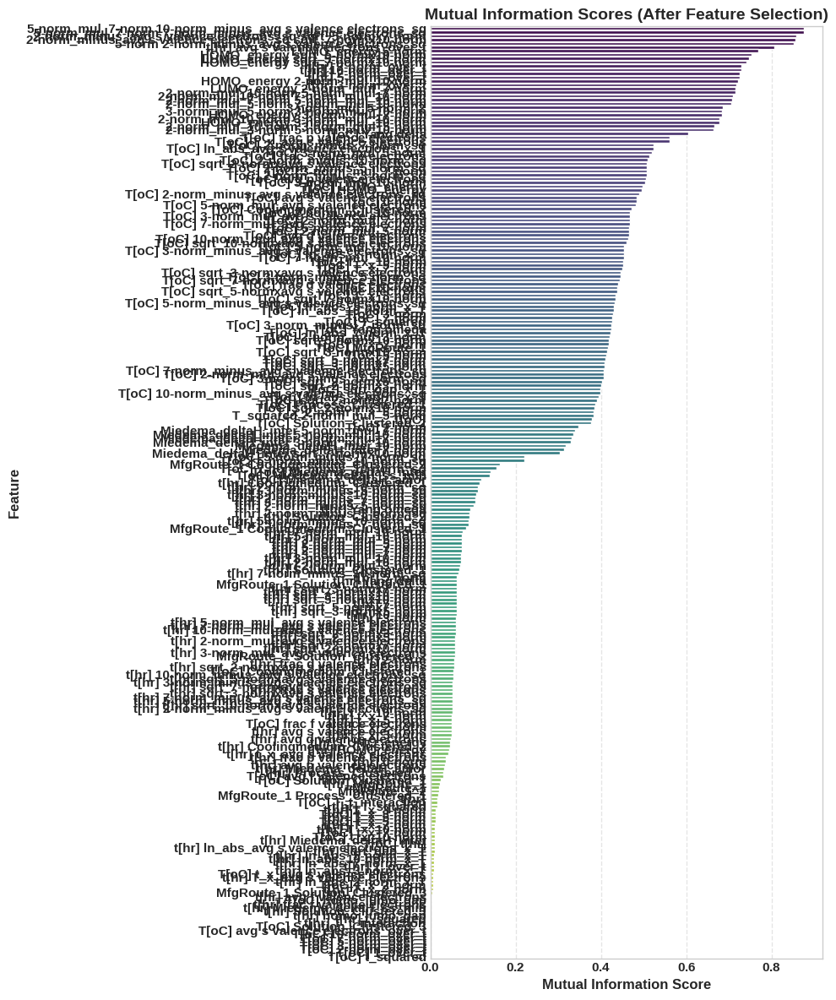


--- Beginning Final Model Training with Best Hyperparameters ---

Beginning LR Warmup phase...
Warmup 0/50, Current LR: 0.000013, Loss: 0.2096
Warmup 10/50, Current LR: 0.000147, Loss: 0.0624
Warmup 20/50, Current LR: 0.000280, Loss: 0.0398
Warmup 30/50, Current LR: 0.000413, Loss: 0.0360
Warmup 40/50, Current LR: 0.000547, Loss: 0.0305
Warmup 49/50, Current LR: 0.000667, Loss: 0.0299
LR Warmup phase complete.


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 0: Train 0.0316, Val 0.0235
Epoch 50: Train 0.0135, Val 0.0134
Epoch 100: Train 0.0147, Val 0.0150
Epoch 150: Train 0.0101, Val 0.0121
Epoch 200: Train 0.0082, Val 0.0148
Early stopping at epoch 205

--- Evaluating Final Model Performance ---

--- Final Model Performance (Trained with Best Hyperparameters) ---
Train R2: 0.9345, MAE: 0.0431, MAPE: 126.36%, MSE: 0.0093
Validation R2: 0.7360, MAE: 0.0691, MAPE: 162.80%, MSE: 0.0288


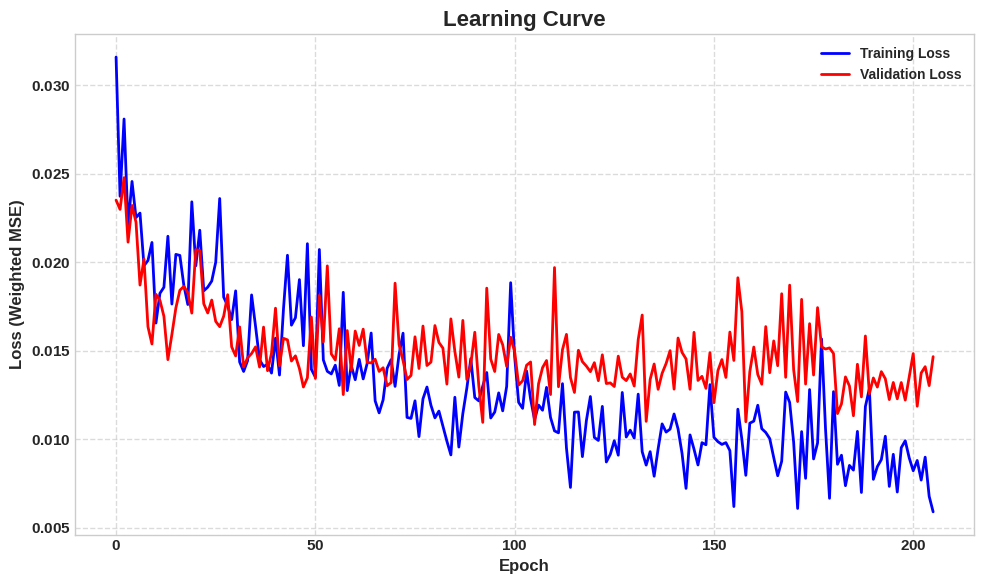

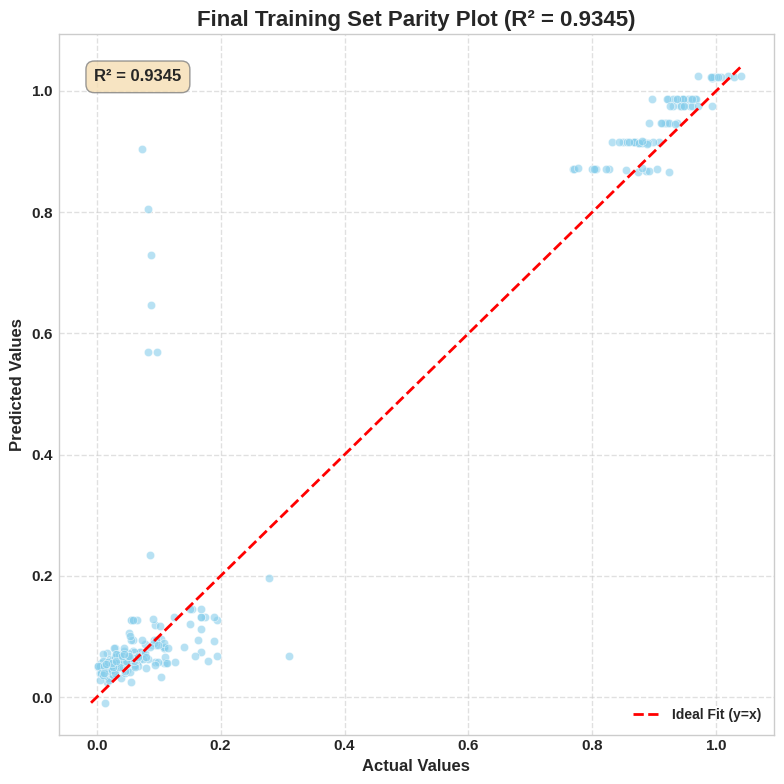

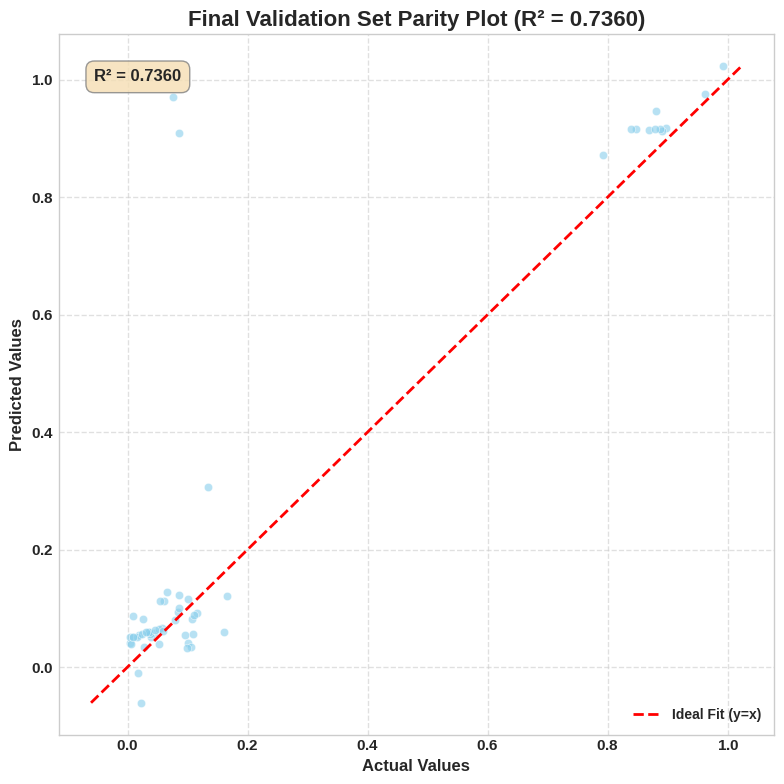

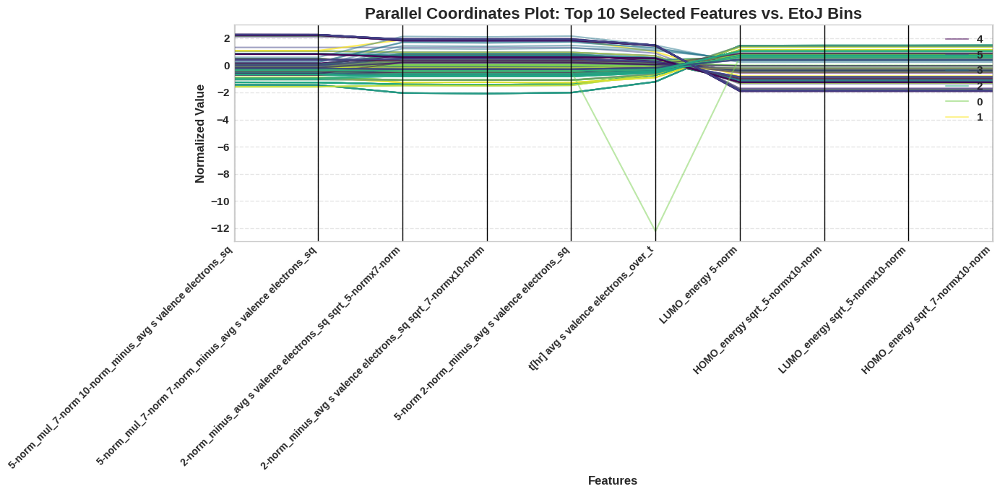

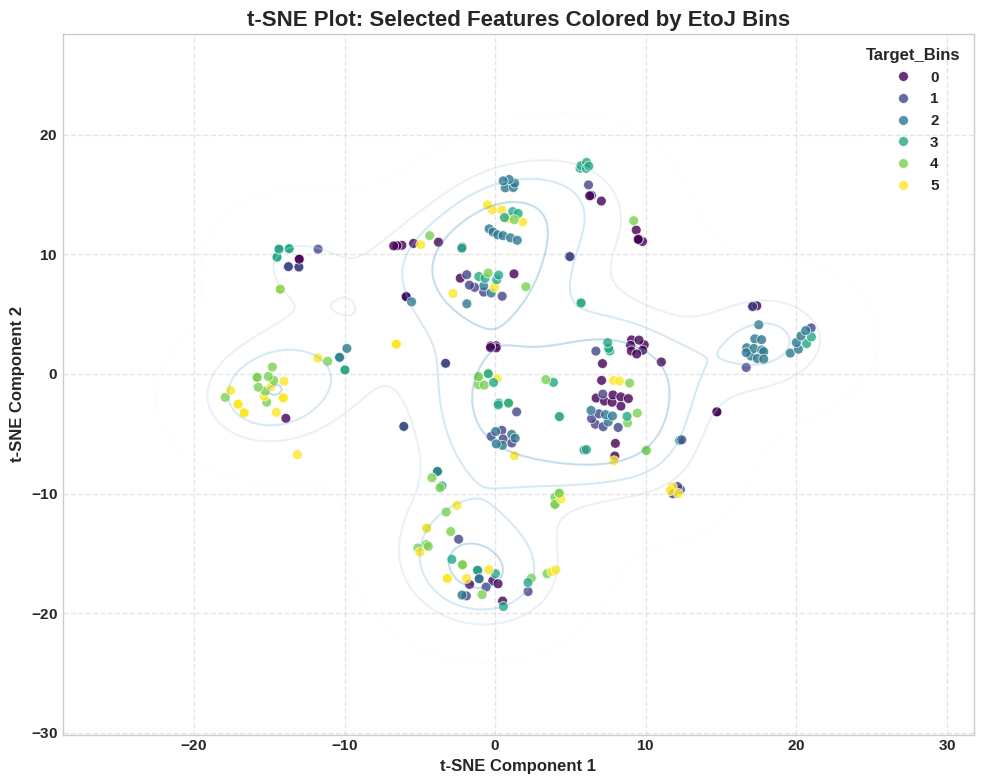

In [86]:
import pandas as pd
import numpy as np
import sys
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from sklearn.feature_selection import mutual_info_regression, RFE
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from pandas.plotting import parallel_coordinates

# Import Optuna
import optuna
from optuna.pruners import MedianPruner # Or other pruners like HyperbandPruner
from optuna.samplers import TPESampler # Default sampler, but good to be explicit

# Set consistent style and random seed for reproducibility
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette('viridis')
np.random.seed(42)
torch.manual_seed(42)

# Define constants
INPUT_FILE = 'corrosion_refined.csv'
TARGET_COLUMN = 'EtoJ'
CATEGORICAL_FEATURES = [
    'MfgRoute',
    'Process_Clustered',
    'Coolingmedium_Clustered',
    'Solution_Clustered'
]

# Neural network definition
class RegressionNN(nn.Module):
    def __init__(self, input_dim, dropout_rate=0.4):
        super(RegressionNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, 256)
        self.bn1 = nn.BatchNorm1d(256)
        self.fc2 = nn.Linear(256, 128)
        self.bn2 = nn.BatchNorm1d(128)
        self.fc3 = nn.Linear(128, 64)
        self.bn3 = nn.BatchNorm1d(64)
        self.fc4 = nn.Linear(64, 32)
        self.dropout = nn.Dropout(dropout_rate)
        self.fc5 = nn.Linear(32, 1)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.relu(self.bn1(self.fc1(x)))
        x = self.dropout(x)
        x = self.relu(self.bn2(self.fc2(x)))
        x = self.dropout(x)
        x = self.relu(self.bn3(self.fc3(x)))
        x = self.relu(self.fc4(x))
        return self.fc5(x)

# Custom weighted MSE loss
class WeightedMSELoss(nn.Module):
    def __init__(self):
        super(WeightedMSELoss, self).__init__()

    def forward(self, predictions, targets):
        weights = 1.0 + 5.0 * torch.sigmoid((targets - 0.6) / 0.1)
        return (weights * (predictions - targets)**2).mean()

# Function to compute MI and plot (no changes, but kept for completeness)
def perform_mutual_information_analysis(X, y, categorical_features_list, target_col):
    X_mi = X.apply(pd.to_numeric, errors='coerce').fillna(0)
    y_series_for_mi = pd.Series(y.flatten(), name=target_col, index=X.index)
    y_mi_numeric = pd.to_numeric(y_series_for_mi, errors='coerce')

    combined_df = pd.concat([X_mi, y_mi_numeric], axis=1).dropna()
    X_mi_cleaned = combined_df.drop(columns=[target_col])
    y_mi_cleaned = combined_df[target_col].values

    if X_mi_cleaned.empty or len(y_mi_cleaned) == 0:
        print("Error: No valid data remaining after NaN handling for MI analysis. Returning empty series.")
        return pd.Series()

    discrete_features_indices = []
    for orig_cat_feat in categorical_features_list:
        for i, col_name in enumerate(X_mi_cleaned.columns):
            if orig_cat_feat in col_name.split('_') or orig_cat_feat == col_name:
                discrete_features_indices.append(i)
    discrete_features_indices = list(set(discrete_features_indices))

    mi_discrete_features_arg = 'auto'
    if not discrete_features_indices:
        print("Warning: No discrete features identified for MI analysis based on provided list and column names. MI will treat all features as continuous.")
    else:
        mi_discrete_features_arg = discrete_features_indices

    if X_mi_cleaned.shape[0] < 2 or X_mi_cleaned.shape[1] == 0:
        print(f"Warning: Insufficient samples ({X_mi_cleaned.shape[0]}) or features ({X_mi_cleaned.shape[1]}) for MI analysis. mutual_info_regression requires at least 2 samples and > 0 features. Returning empty series.")
        return pd.Series()

    mi = mutual_info_regression(X_mi_cleaned, y_mi_cleaned, discrete_features=mi_discrete_features_arg, random_state=42)
    mi_series = pd.Series(mi, index=X_mi_cleaned.columns).sort_values(ascending=False)

    print("\nMutual Information Scores (Top 20):")
    print(mi_series.head(20))

    return mi_series

# Model training with early stopping and Optuna Pruner integration
def train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, epochs, patience,
                run_warmup=True, warmup_epochs=50, end_warmup_lr=1e-4, verbose=True, trial=None):
    best_val_loss = float('inf')
    wait = 0
    history = {'train': [], 'val': []}
    best_model_state = None

    if run_warmup:
        if verbose: print("\nBeginning LR Warmup phase...")
        for e in range(warmup_epochs):
            model.train()
            for pg in optimizer.param_groups:
                pg['lr'] = end_warmup_lr * (e+1) / warmup_epochs

            tr_loss_warmup = 0
            for Xb, yb in train_loader:
                optimizer.zero_grad()
                loss = criterion(model(Xb), yb)
                loss.backward()
                optimizer.step()
                tr_loss_warmup += loss.item() * Xb.size(0)
            tr_loss_warmup /= len(train_loader.dataset)

            if verbose and (e % 10 == 0 or e == warmup_epochs - 1):
                print(f"Warmup {e}/{warmup_epochs}, Current LR: {optimizer.param_groups[0]['lr']:.6f}, Loss: {tr_loss_warmup:.4f}")
        if verbose: print("LR Warmup phase complete.")

    for epoch in range(epochs):
        # Train
        model.train()
        tr_loss = 0
        for Xb, yb in train_loader:
            optimizer.zero_grad()
            pred = model(Xb)
            loss = criterion(pred, yb)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()
            tr_loss += loss.item() * Xb.size(0)
        tr_loss /= len(train_loader.dataset)
        history['train'].append(tr_loss)

        # Validate
        model.eval()
        val_loss = 0
        with torch.no_grad():
            for Xb, yb in val_loader:
                pred = model(Xb)
                val_loss += criterion(pred, yb).item() * Xb.size(0)
        val_loss /= len(val_loader.dataset)
        history['val'].append(val_loss)

        scheduler.step(val_loss)

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_state = model.state_dict()
            wait = 0
        else:
            wait += 1
            if wait >= patience:
                if verbose: print(f"Early stopping at epoch {epoch}")
                break

        # Optuna Pruning: Report intermediate value
        if trial is not None:
            trial.report(val_loss, epoch)
            if trial.should_prune():
                raise optuna.exceptions.TrialPruned()

        if verbose and epoch % 50 == 0:
            print(f"Epoch {epoch}: Train {tr_loss:.4f}, Val {val_loss:.4f}")

    if best_model_state is not None:
        model.load_state_dict(best_model_state)
    return history, best_val_loss

# Evaluation (no changes)
def evaluate_model(model, loader, inv_transform=None):
    model.eval()
    preds, trues = [], []
    with torch.no_grad():
        for Xb, yb in loader:
            out = model(Xb)
            if inv_transform:
                preds.extend(inv_transform(out.cpu().numpy()).squeeze().tolist())
                trues.extend(inv_transform(yb.cpu().numpy()).squeeze().tolist())
            else:
                preds.extend(out.squeeze().tolist())
                trues.extend(yb.squeeze().tolist())
    preds, trues = np.array(preds), np.array(trues)

    finite_mask = np.isfinite(trues) & np.isfinite(preds)
    if not np.all(finite_mask):
        print(f"Warning: Non-finite values detected in actuals or predictions for evaluation. Filtering them out. ({np.sum(~finite_mask)} values removed)")
        trues = trues[finite_mask]
        preds = preds[finite_mask]

    if len(trues) == 0:
        print("Warning: No finite actual/prediction pairs remaining for metric calculation.")
        return np.nan, np.nan, np.nan, np.nan, np.array([]), np.array([])

    r2 = r2_score(trues, preds)
    mae = mean_absolute_error(trues, preds)
    mse = mean_squared_error(trues, preds)

    non_zero_trues_mask = trues != 0
    if np.sum(non_zero_trues_mask) > 0:
        mape = np.mean(np.abs((trues[non_zero_trues_mask]-preds[non_zero_trues_mask])/trues[non_zero_trues_mask]))*100
    else:
        mape = np.nan
        print("Warning: All true values are zero, MAPE is undefined.")

    return r2, mae, mse, mape, trues, preds

# Plotting functions (no changes)
def plot_learning_curve(train_losses, val_losses):
    plt.figure(figsize=(10, 6))
    plt.plot(train_losses, label='Training Loss', color='blue', linewidth=2)
    plt.plot(val_losses, label='Validation Loss', color='red', linewidth=2)
    plt.title('Learning Curve', fontsize=16)
    plt.xlabel('Epoch', fontsize=12)
    plt.ylabel('Loss (Weighted MSE)', fontsize=12)
    plt.legend(fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

def plot_parity(actuals, predictions, r2, title="Parity Plot"):
    plt.figure(figsize=(8, 8))
    plt.scatter(actuals, predictions, alpha=0.6, color='skyblue', edgecolors='w', linewidth=0.5)

    min_val = np.nanmin([np.nanmin(actuals), np.nanmin(predictions)]) if np.isfinite(np.nanmin(actuals)) and np.isfinite(np.nanmin(predictions)) else 0
    max_val = np.nanmax([np.nanmax(actuals), np.nanmax(predictions)]) if np.isfinite(np.nanmax(actuals)) and np.isfinite(np.nanmax(predictions)) else 1

    if max_val - min_val < 1e-6:
        buffer = 0.1
        min_val -= buffer
        max_val += buffer

    plt.plot([min_val, max_val], [min_val, max_val], 'r--', label='Ideal Fit (y=x)', linewidth=2)
    plt.title(f'{title} (R² = {r2:.4f})', fontsize=16)
    plt.xlabel('Actual Values', fontsize=12)
    plt.ylabel('Predicted Values', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.text(0.05, 0.95, f'R² = {r2:.4f}', transform=plt.gca().transAxes, fontsize=12,
             verticalalignment='top', bbox=dict(boxstyle='round,pad=0.5', fc='wheat', alpha=0.8, ec='gray'))
    plt.legend(fontsize=10, loc='lower right')
    plt.tight_layout()
    plt.show()

def plot_mi_after_selection(mi_series_selected):
    plt.figure(figsize=(10, 12))
    mi_series_selected_sorted = mi_series_selected.sort_values(ascending=False)
    if not mi_series_selected_sorted.empty:
        sns.barplot(x=mi_series_selected_sorted.values, y=mi_series_selected_sorted.index, palette='viridis')
        plt.title('Mutual Information Scores (After Feature Selection)', fontsize=14)
        plt.xlabel('Mutual Information Score', fontsize=12)
        plt.ylabel('Feature', fontsize=12)
        plt.grid(axis='x', linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()
    else:
        print("MI series after selection is empty, skipping plot.")


if __name__ == '__main__':
    # Load data
    try:
        df = pd.read_csv(INPUT_FILE)
        print(f"Successfully loaded '{INPUT_FILE}' with shape: {df.shape}")
    except FileNotFoundError:
        print(f"File '{INPUT_FILE}' not found. Please ensure the file exists in the current directory.")
        sys.exit(1)
    except Exception as e:
        print(f"An error occurred while loading the CSV: {e}")
        sys.exit(1)

    # Separate target from features
    y_original = pd.to_numeric(df[TARGET_COLUMN], errors='coerce').values # Keep original y for later alignment
    X_original = df.drop(columns=[TARGET_COLUMN]).copy()

    # Coerce all feature columns to numeric, filling NaNs
    for c in X_original.columns:
        X_original[c] = pd.to_numeric(X_original[c], errors='coerce').fillna(0)

    # Determine original composition columns for PCC analysis
    all_known_non_composition_features_in_original_df = ['T[oC]', 't[hr]', TARGET_COLUMN] + CATEGORICAL_FEATURES
    original_composition_cols = [
        col for col in df.columns
        if col not in all_known_non_composition_features_in_original_df
    ]

    # --- Feature Engineering (applied once to the full dataset) ---
    # This block remains outside the Optuna objective because feature engineering
    # should be consistent across all trials to reduce redundant computation.
    # The output of this block (X_poly) will be the input to the objective function.

    X_fe = X_original.copy() # Start feature engineering on a copy of original X

    # Base process interactions
    if 'T[oC]' in X_fe.columns and 't[hr]' in X_fe.columns:
        X_fe['T_t_interaction'] = (X_fe['T[oC]'] * X_fe['t[hr]']).fillna(0)
        X_fe['T_squared'] = (X_fe['T[oC]']**2).fillna(0)
        X_fe['t_squared'] = (X_fe['t[hr]']**2).fillna(0)
        X_fe['1_over_t'] = (1 / (X_fe['t[hr]'] + 1e-6)).fillna(0)
    else:
        print("Warning: Missing 'T[oC]' or 't[hr]' for process interaction features.")

    # PCC Analysis on original composition only
    df_for_pcc = df[original_composition_cols + [TARGET_COLUMN]].copy()
    for col in df_for_pcc.columns:
        df_for_pcc[col] = pd.to_numeric(df_for_pcc[col], errors='coerce')
    df_for_pcc = df_for_pcc.dropna()

    strong_comps = []
    if not df_for_pcc.empty and TARGET_COLUMN in df_for_pcc.columns:
        if len(df_for_pcc) > 1 and len(df_for_pcc[TARGET_COLUMN].unique()) > 1:
            pcc = df_for_pcc.corr().loc[original_composition_cols, TARGET_COLUMN]
            strong = pcc.abs() > 0.35
            strong_comps = pcc[strong].index.tolist()
            print(f"\nIdentified {len(strong_comps)} strongly correlated original composition features (PCC > 0.35): {strong_comps}")
        else:
            print("Warning: Not enough data points or variability in target for meaningful PCC analysis. Strong composition features list will be empty.")
    else:
        print("Warning: df_for_pcc is empty or target column missing. Strong composition features list will be empty.")

    # Cross-terms between process parameters and top composition features
    if not strong_comps:
        top_comps_for_interactions = [
            '2-norm', '3-norm', 'avg s valence electrons',
            'Yang delta', 'frac d valence electrons', '10-norm',
            'HOMO_energy', 'LUMO_energy'
        ]
        top_comps_for_interactions = [c for c in top_comps_for_interactions if c in X_fe.columns]
        print(f"Using a default list for process-composition interactions as no strong_comps were found: {top_comps_for_interactions}")
    else:
        top_comps_for_interactions = [c for c in strong_comps if c in X_fe.columns]

    for comp in top_comps_for_interactions:
        if comp in X_fe.columns and 'T[oC]' in X_fe.columns and 't[hr]' in X_fe.columns:
            X_fe[f'T_x_{comp}'] = (X_fe['T[oC]'] * X_fe[comp]).fillna(0)
            X_fe[f't_x_{comp}'] = (X_fe['t[hr]'] * X_fe[comp]).fillna(0)
            X_fe[f'ln_abs_{comp}_x_T'] = (np.log1p(np.abs(X_fe[comp]) + 1e-6) * X_fe['T[oC]']).fillna(0)
            X_fe[f'{comp}_over_t'] = (X_fe[comp] / (X_fe['t[hr]'] + 1e-6)).fillna(0)
        else:
            print(f"Skipping process-composition interaction for {comp}: one or more base columns missing or not numeric.")

    # Composition-composition interactions based on strongly correlated features
    valid_strong_comps = [c for c in strong_comps if c in X_fe.columns]
    if len(valid_strong_comps) > 1:
        for i in range(len(valid_strong_comps)):
            for j in range(i + 1, len(valid_strong_comps)):
                comp_i = valid_strong_comps[i]
                comp_j = valid_strong_comps[j]
                X_fe[f'{comp_i}_mul_{comp_j}'] = (X_fe[comp_i] * X_fe[comp_j]).fillna(0)
                X_fe[f'{comp_i}_minus_{comp_j}_sq'] = ((X_fe[comp_i] - X_fe[comp_j])**2).fillna(0)
                X_fe[f'sqrt_{comp_i}x{comp_j}'] = (np.sqrt(np.abs(X_fe[comp_i]*X_fe[comp_j]) + 1e-6)).fillna(0)
    elif len(valid_strong_comps) == 1:
        print("Only one strongly correlated composition feature, skipping composition-composition interactions.")
    else:
        print("No valid strongly correlated composition features for composition-composition interactions.")

    # HOMO-LUMO gap and its interaction with Temperature
    if 'LUMO_energy' in X_fe.columns and 'HOMO_energy' in X_fe.columns and 'T[oC]' in X_fe.columns:
        X_fe['homo_lumo_gap'] = (X_fe['LUMO_energy'] - X_fe['HOMO_energy']).fillna(0)
        X_fe['sqrt_gap_x_T'] = (np.sqrt(np.abs(X_fe['homo_lumo_gap']) + 1e-6) * X_fe['T[oC]']).fillna(0)
    else:
        print("Skipping HOMO-LUMO gap features: 'LUMO_energy', 'HOMO_energy', or 'T[oC]' columns missing.")

    print(f"Finished initial feature engineering. Current X_fe shape: {X_fe.shape}")

    # Encoding categoricals
    existing_categorical_features = [f for f in CATEGORICAL_FEATURES if f in X_fe.columns]
    if existing_categorical_features:
        X_fe = pd.get_dummies(X_fe, columns=existing_categorical_features, drop_first=True)
        print(f"One-hot encoded categorical features. Current X_fe shape: {X_fe.shape}")
    else:
        print("No specified categorical features found in the DataFrame to encode.")

    # Ensure all data is numeric before polynomial features
    X_for_poly_base = X_fe.copy().apply(pd.to_numeric, errors='coerce').fillna(0)

    # Polynomial Features
    poly_transformer = PolynomialFeatures(degree=2, include_bias=False)
    try:
        X_poly_transformed_base = poly_transformer.fit_transform(X_for_poly_base)
        X_poly_base = pd.DataFrame(X_poly_transformed_base, columns=poly_transformer.get_feature_names_out(X_for_poly_base.columns), index=X_for_poly_base.index)
        X_poly_base = X_poly_base.apply(pd.to_numeric, errors='coerce').fillna(0)
        print(f"\nPolynomial features generated. New feature count: {X_poly_base.shape[1]}")
    except Exception as e:
        print(f"Error during PolynomialFeatures transformation: {e}")
        print("Proceeding without polynomial features, using X_fe (after initial engineering and encoding).")
        X_poly_base = X_for_poly_base.copy() # Fallback if polynomial fails

    # MI Analysis (performed once on the full, expanded feature set)
    discrete_idx_for_mi_base = []
    for orig_cat_feat in CATEGORICAL_FEATURES:
        for i, col_name in enumerate(X_poly_base.columns):
            if orig_cat_feat in col_name.split('_') or orig_cat_feat == col_name:
                discrete_idx_for_mi_base.append(i)
    discrete_idx_for_mi_base = list(set(discrete_idx_for_mi_base))

    print(f"\nIdentified {len(discrete_idx_for_mi_base)} discrete features in the polynomial-expanded set for MI analysis.")
    mi_series_full = perform_mutual_information_analysis(X_poly_base.copy(), y_original.copy(), CATEGORICAL_FEATURES, TARGET_COLUMN)
    if mi_series_full.empty:
        print("MI analysis resulted in an empty series. Cannot proceed with feature selection.")
        sys.exit(1)

    # --- Optuna Objective Function ---
    def objective(trial: optuna.Trial):
        # Hyperparameters to tune
        learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-3, log=True)
        weight_decay = trial.suggest_float('weight_decay', 1e-7, 1e-3, log=True)
        dropout_rate = trial.suggest_float('dropout_rate', 0.3, 0.5)
        batch_size = trial.suggest_categorical('batch_size', [8, 12, 16])
        n_features_rfe = trial.suggest_int('n_features_rfe', 15, 50) # Range for RFE selected features

        # Feature Selection (RFE) - now dynamic within each trial
        lin = LinearRegression()
        # Ensure RFE does not select more features than available
        current_n_features_rfe = min(n_features_rfe, X_poly_base.shape[1])
        if current_n_features_rfe < 1: # Ensure at least one feature if possible
             current_n_features_rfe = 1
             if X_poly_base.shape[1] > 0:
                 print(f"Warning: n_features_rfe adjusted to 1 for trial {trial.number}.")
             else:
                 print(f"Error: No features available in X_poly_base. Cannot run trial {trial.number}.")
                 raise optuna.exceptions.TrialPruned() # Prune if no features at all

        selector = RFE(lin, n_features_to_select=current_n_features_rfe, step=1)

        # Prepare data for RFE, ensuring alignment and no NaNs
        X_poly_cleaned_for_rfe = X_poly_base.copy().apply(pd.to_numeric, errors='coerce').fillna(0)
        y_series_for_rfe = pd.Series(y_original.flatten(), name='temp_target', index=X_poly_cleaned_for_rfe.index)
        y_cleaned_numeric_for_rfe = pd.to_numeric(y_series_for_rfe, errors='coerce')

        temp_df_rfe = pd.concat([X_poly_cleaned_for_rfe, y_cleaned_numeric_for_rfe], axis=1).dropna()
        X_poly_cleaned_aligned = temp_df_rfe.drop(columns=['temp_target'])
        y_cleaned_aligned = temp_df_rfe['temp_target'].values

        if X_poly_cleaned_aligned.empty or len(y_cleaned_aligned) == 0:
            print(f"Error: No valid data remaining after NaN handling for RFE in trial {trial.number}. Pruning trial.")
            raise optuna.exceptions.TrialPruned()

        selected_rfe_features = []
        try:
            selector.fit(X_poly_cleaned_aligned, y_cleaned_aligned)
            selected_rfe_features = list(X_poly_cleaned_aligned.columns[selector.support_])
        except Exception as e:
            print(f"Error during RFE fitting for trial {trial.number}: {e}. Falling back to top MI features.")
            selected_rfe_features = mi_series_full.head(current_n_features_rfe).index.tolist()
            selected_rfe_features = [f for f in selected_rfe_features if f in X_poly_base.columns]
            if not selected_rfe_features:
                print(f"Warning: Fallback MI features list is empty or features not found for trial {trial.number}. Pruning trial.")
                raise optuna.exceptions.TrialPruned()

        # Identify mandatory features in the polynomial feature space
        mandatory_base_features = ['T[oC]', 't[hr]'] + CATEGORICAL_FEATURES
        mandatory_features_in_poly_space = []
        for base_feat in mandatory_base_features:
            for col_name in X_poly_base.columns:
                if base_feat == col_name or (base_feat + '_' in col_name and base_feat in col_name.split('_')) or (base_feat in col_name.split(' ') and '_' not in base_feat):
                     mandatory_features_in_poly_space.append(col_name)
        mandatory_features_in_poly_space = list(set(mandatory_features_in_poly_space))
        mandatory_features_in_poly_space = [f for f in mandatory_features_in_poly_space if f in X_poly_base.columns]

        final_selected_features = list(set(selected_rfe_features + mandatory_features_in_poly_space))
        final_selected_features = [f for f in final_selected_features if f in X_poly_base.columns]

        if not final_selected_features:
            print(f"Error: No features selected for training in trial {trial.number}. Pruning trial.")
            raise optuna.exceptions.TrialPruned()

        X_sel_current = X_poly_base[final_selected_features].copy()

        # Scale and split data for this trial
        scaler = StandardScaler()
        X_scaled_current = scaler.fit_transform(X_sel_current)
        y_log = np.log1p(y_original).reshape(-1,1)

        # Synthetic data generation for high EtoJ values
        y_aligned_to_X_sel = pd.Series(y_original.flatten(), index=df.index).loc[X_sel_current.index].values
        mask_high_log = y_aligned_to_X_sel > 0.6
        n_majority_samples = np.sum(~mask_high_log)
        n_synthetic_samples_target = int(0.3 * n_majority_samples)

        X_synth = X_scaled_current.copy()
        y_synth = y_log.copy()

        if np.sum(mask_high_log) > 0 and n_synthetic_samples_target > 0:
            high_indices_in_aligned_data = np.where(mask_high_log)[0]
            if len(high_indices_in_aligned_data) > 0:
                synth_indices_from_high = np.random.choice(len(high_indices_in_aligned_data), n_synthetic_samples_target, replace=True)
                X_high_samples = X_scaled_current[high_indices_in_aligned_data[synth_indices_from_high]]
                y_log_high_samples = y_log[high_indices_in_aligned_data[synth_indices_from_high]]
                synth_X_added = X_high_samples + np.random.normal(0, 0.01, size=X_high_samples.shape)
                synth_y_added = y_log_high_samples + np.random.normal(0, 0.01, size=y_log_high_samples.shape)
                X_synth = np.vstack([X_scaled_current, synth_X_added])
                y_synth = np.vstack([y_log, synth_y_added])

        X_t_current = torch.tensor(X_synth, dtype=torch.float32)
        y_t_current = torch.tensor(y_synth, dtype=torch.float32)

        X_tr, X_val, y_tr, y_val = train_test_split(X_t_current, y_t_current, test_size=0.15, random_state=42)

        train_loader = DataLoader(TensorDataset(X_tr, y_tr), batch_size=batch_size, shuffle=True)
        val_loader   = DataLoader(TensorDataset(X_val, y_val), batch_size=batch_size, shuffle=False)

        # Model setup for current params
        model_current = RegressionNN(X_tr.shape[1], dropout_rate=dropout_rate)
        criterion = WeightedMSELoss()
        opt_current = optim.Adam(model_current.parameters(), lr=learning_rate, weight_decay=weight_decay)

        # Use shorter epochs and patience for tuning trials
        tuning_epochs = 200 # Reduced epochs for faster trials
        tuning_patience = 20 # Reduced patience for faster trials
        sched_current = optim.lr_scheduler.CosineAnnealingLR(opt_current, T_max=tuning_epochs)

        # Train model for this set of hyperparameters, passing the trial object for pruning
        try:
            _, current_val_loss = train_model(
                model_current, train_loader, val_loader, criterion, opt_current, sched_current,
                epochs=tuning_epochs, patience=tuning_patience,
                run_warmup=True, end_warmup_lr=learning_rate,
                verbose=False, # Suppress detailed output during tuning
                trial=trial # Pass the Optuna trial object
            )
        except optuna.exceptions.TrialPruned:
            print(f"Trial {trial.number} pruned.")
            raise

        return current_val_loss # Optuna will minimize this value

    # --- Optuna Study ---
    study = optuna.create_study(
        direction='minimize', # Minimize the validation loss
        sampler=TPESampler(seed=42),
        pruner=MedianPruner(n_startup_trials=5, n_warmup_steps=10, interval_steps=5), # Pruner settings
        study_name='corrosion_regression_tuning',
        storage='sqlite:///corrosion_tuning.db', # Store results in a database file
        load_if_exists=True # Load existing study if it exists
    )

    n_tuning_trials = 50 # Number of hyperparameter combinations to try (adjust as needed)
    print(f"\nRunning Optuna optimization for {n_tuning_trials} trials...")
    study.optimize(objective, n_trials=n_tuning_trials, show_progress_bar=True)

    print("\n--- Hyperparameter Tuning Complete ---")
    best_trial = study.best_trial

    print(f"Number of finished trials: {len(study.trials)}")
    print(f"Best trial number: {best_trial.number}")
    print(f"Best validation loss: {best_trial.value:.4f}")
    print("Best hyperparameters:")
    for key, value in best_trial.params.items():
        print(f"  {key}: {value}")

    best_params = best_trial.params
    # Re-extract n_features_rfe for the final selection using the best found value
    final_n_features_rfe = best_params['n_features_rfe']

    # --- Final Feature Selection based on Best RFE count ---
    print("\n--- Performing Final Feature Selection with Best RFE Count ---")
    lin = LinearRegression()
    n_features_to_select_rfe_final = min(final_n_features_rfe, X_poly_base.shape[1])
    if n_features_to_select_rfe_final < 1:
        n_features_to_select_rfe_final = 1
        print("Warning: n_features_to_select_rfe_final adjusted to 1 as it was too low.")

    selector_final = RFE(lin, n_features_to_select=n_features_to_select_rfe_final, step=1)

    X_poly_cleaned_for_rfe_final = X_poly_base.copy().apply(pd.to_numeric, errors='coerce').fillna(0)
    y_series_for_rfe_final = pd.Series(y_original.flatten(), name='temp_target', index=X_poly_cleaned_for_rfe_final.index)
    y_cleaned_numeric_for_rfe_final = pd.to_numeric(y_series_for_rfe_final, errors='coerce')

    temp_df_rfe_final = pd.concat([X_poly_cleaned_for_rfe_final, y_cleaned_numeric_for_rfe_final], axis=1).dropna()
    X_poly_cleaned_aligned_final = temp_df_rfe_final.drop(columns=['temp_target'])
    y_cleaned_aligned_final = temp_df_rfe_final['temp_target'].values

    if X_poly_cleaned_aligned_final.empty or len(y_cleaned_aligned_final) == 0:
        print("Error: No valid data remaining after NaN handling for final RFE. Exiting.")
        sys.exit(1)

    selected_rfe_features_final = []
    try:
        selector_final.fit(X_poly_cleaned_aligned_final, y_cleaned_aligned_final)
        selected_rfe_features_final = list(X_poly_cleaned_aligned_final.columns[selector_final.support_])
        print(f"Final RFE selected {len(selected_rfe_features_final)} features.")
    except Exception as e:
        print(f"Error during final RFE fitting: {e}. Falling back to top MI features based on best RFE count.")
        selected_rfe_features_final = mi_series_full.head(n_features_to_select_rfe_final).index.tolist()
        selected_rfe_features_final = [f for f in selected_rfe_features_final if f in X_poly_base.columns]
        if not selected_rfe_features_final:
            print("Warning: Fallback MI features list is empty or features not found for final selection. Exiting.")
            sys.exit(1)

    mandatory_base_features_final = ['T[oC]', 't[hr]'] + CATEGORICAL_FEATURES
    mandatory_features_in_poly_space_final = []
    for base_feat in mandatory_base_features_final:
        for col_name in X_poly_base.columns:
            if base_feat == col_name or (base_feat + '_' in col_name and base_feat in col_name.split('_')) or (base_feat in col_name.split(' ') and '_' not in base_feat):
                 mandatory_features_in_poly_space_final.append(col_name)

    mandatory_features_in_poly_space_final = list(set(mandatory_features_in_poly_space_final))
    mandatory_features_in_poly_space_final = [f for f in mandatory_features_in_poly_space_final if f in X_poly_base.columns]

    final_selected_features_for_best_model = list(set(selected_rfe_features_final + mandatory_features_in_poly_space_final))
    final_selected_features_for_best_model = [f for f in final_selected_features_for_best_model if f in X_poly_base.columns]

    if not final_selected_features_for_best_model:
        print("Error: No features selected for final training. Exiting.")
        sys.exit(1)

    best_X_sel = X_poly_base[final_selected_features_for_best_model].copy()
    print(f"\nTotal features selected for final NN training ({len(final_selected_features_for_best_model)}): {final_selected_features_for_best_model}")

    # Plot MI for features selected by the best model
    plot_mi_after_selection(mi_series_full[mi_series_full.index.isin(best_X_sel.columns)])

    # --- Final Training with Best Parameters ---
    print("\n--- Beginning Final Model Training with Best Hyperparameters ---")

    scaler_final_train = StandardScaler()
    X_scaled_final_train = scaler_final_train.fit_transform(best_X_sel)
    y_log_final_train = np.log1p(y_original).reshape(-1,1)

    # Synthetic data generation with the best feature set
    y_aligned_to_best_X_sel_final = pd.Series(y_original.flatten(), index=df.index).loc[best_X_sel.index].values
    mask_high_log_final = y_aligned_to_best_X_sel_final > 0.6
    n_majority_samples_final = np.sum(~mask_high_log_final)
    n_synthetic_samples_target_final = int(0.3 * n_majority_samples_final)

    X_synth_final_train = X_scaled_final_train.copy()
    y_synth_final_train = y_log_final_train.copy()

    if np.sum(mask_high_log_final) > 0 and n_synthetic_samples_target_final > 0:
        high_indices_in_aligned_data_final = np.where(mask_high_log_final)[0]
        if len(high_indices_in_aligned_data_final) > 0:
            synth_indices_from_high_final = np.random.choice(len(high_indices_in_aligned_data_final), n_synthetic_samples_target_final, replace=True)
            X_high_samples_final = X_scaled_final_train[high_indices_in_aligned_data_final[synth_indices_from_high_final]]
            y_log_high_samples_final = y_log_final_train[high_indices_in_aligned_data_final[synth_indices_from_high_final]]
            synth_X_added_final = X_high_samples_final + np.random.normal(0, 0.01, size=X_high_samples_final.shape)
            synth_y_added_final = y_log_high_samples_final + np.random.normal(0, 0.01, size=y_log_high_samples_final.shape)
            X_synth_final_train = np.vstack([X_scaled_final_train, synth_X_added_final])
            y_synth_final_train = np.vstack([y_log_final_train, synth_y_added_final])

    X_t_final = torch.tensor(X_synth_final_train, dtype=torch.float32)
    y_t_final = torch.tensor(y_synth_final_train, dtype=torch.float32)

    X_tr_final, X_val_final, y_tr_final, y_val_final = train_test_split(X_t_final, y_t_final, test_size=0.15, random_state=42)

    train_loader_final = DataLoader(TensorDataset(X_tr_final, y_tr_final), batch_size=best_params['batch_size'], shuffle=True)
    val_loader_final   = DataLoader(TensorDataset(X_val_final, y_val_final), batch_size=best_params['batch_size'], shuffle=False)

    final_model = RegressionNN(X_tr_final.shape[1], dropout_rate=best_params['dropout_rate'])
    final_criterion = WeightedMSELoss()
    final_opt = optim.Adam(final_model.parameters(), lr=best_params['learning_rate'], weight_decay=best_params['weight_decay'])

    # Full epochs and patience for the final training
    final_epochs_full = 1500
    final_patience_full = 100
    final_sched = optim.lr_scheduler.CosineAnnealingLR(final_opt, T_max=final_epochs_full)

    final_history, _ = train_model(
        final_model, train_loader_final, val_loader_final, final_criterion, final_opt, final_sched,
        epochs=final_epochs_full, patience=final_patience_full,
        run_warmup=True, end_warmup_lr=best_params['learning_rate'],
        verbose=True, # Show full training output for final model
        trial=None # No Optuna trial object for final training
    )

    print("\n--- Evaluating Final Model Performance ---")
    inv_transform_y = lambda t: np.expm1(t)

    r2_tr, mae_tr, mse_tr, mape_tr, train_actuals, train_predictions = evaluate_model(final_model, train_loader_final, inv_transform_y)
    r2_v , mae_v , mse_v , mape_v, val_actuals, val_predictions  = evaluate_model(final_model, val_loader_final, inv_transform_y)

    print(f"\n--- Final Model Performance (Trained with Best Hyperparameters) ---")
    print(f"Train R2: {r2_tr:.4f}, MAE: {mae_tr:.4f}, MAPE: {mape_tr:.2f}%, MSE: {mse_tr:.4f}")
    print(f"Validation R2: {r2_v:.4f}, MAE: {mae_v:.4f}, MAPE: {mape_v:.2f}%, MSE: {mse_v:.4f}")

    # Plotting for the final model
    plot_learning_curve(final_history['train'], final_history['val'])
    plot_parity(train_actuals, train_predictions, r2_tr, title="Final Training Set Parity Plot")
    plot_parity(val_actuals, val_predictions, r2_v, title="Final Validation Set Parity Plot")

    # For parallel coordinates and t-SNE, use best_X_sel (features selected for the best model)
    common_indices_for_plot = best_X_sel.index.intersection(df.index)
    X_plot_features = best_X_sel.loc[common_indices_for_plot].copy()
    y_original_aligned_for_plot = df.loc[common_indices_for_plot, TARGET_COLUMN].values

    X_plot_features[TARGET_COLUMN] = y_original_aligned_for_plot

    if len(X_plot_features[TARGET_COLUMN].unique()) > 1:
        try:
            X_plot_features['Target_Bins'] = pd.qcut(X_plot_features[TARGET_COLUMN], q=6, labels=False, duplicates='drop')
        except ValueError:
            print("Could not create 6 quantile bins for Target_Bins, trying with fewer.")
            try:
                X_plot_features['Target_Bins'] = pd.qcut(X_plot_features[TARGET_COLUMN], q=4, labels=False, duplicates='drop')
            except ValueError:
                print("Could not create 4 quantile bins either. Skipping Target_Bins.")
                X_plot_features['Target_Bins'] = pd.Series(0, index=X_plot_features.index)
    else:
        print("Not enough unique target values to create bins for plotting. Target_Bins will be a single category.")
        X_plot_features['Target_Bins'] = pd.Series(0, index=X_plot_features.index)

    features_for_parallel = mi_series_full[mi_series_full.index.isin(best_X_sel.columns)].head(min(10, len(mi_series_full[mi_series_full.index.isin(best_X_sel.columns)]))).index.tolist()
    existing_plot_features = [f for f in features_for_parallel if f in X_plot_features.columns]

    if 'Target_Bins' in X_plot_features.columns and existing_plot_features:
        parallel_plot_df = X_plot_features[existing_plot_features + ['Target_Bins']].copy()
        scaler_for_plot = StandardScaler()
        numerical_cols_for_parallel = [col for col in existing_plot_features if pd.api.types.is_numeric_dtype(parallel_plot_df[col])]

        if numerical_cols_for_parallel:
            parallel_plot_df[numerical_cols_for_parallel] = scaler_for_plot.fit_transform(parallel_plot_df[numerical_cols_for_parallel])

        plt.figure(figsize=(14, 7))
        parallel_coordinates(parallel_plot_df, 'Target_Bins', colormap='viridis', alpha=0.5)
        plt.title(f'Parallel Coordinates Plot: Top {len(existing_plot_features)} Selected Features vs. {TARGET_COLUMN} Bins', fontsize=16)
        plt.xlabel('Features', fontsize=12)
        plt.ylabel('Normalized Value', fontsize=12)
        plt.xticks(rotation=45, ha='right', fontsize=10)
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()
    else:
        print("Skipping Parallel Coordinates Plot: Not enough valid features or 'Target_Bins' missing.")

    tsne_input_data = best_X_sel.copy().apply(pd.to_numeric, errors='coerce').fillna(0)
    scaler_tsne = StandardScaler()
    tsne_scaled_data = scaler_tsne.fit_transform(tsne_input_data)

    if tsne_scaled_data.shape[0] > 1 and tsne_scaled_data.shape[1] > 1:
        perplexity_val = min(30, tsne_scaled_data.shape[0] - 1)
        if perplexity_val < 1:
            perplexity_val = 1
            print("Warning: Perplexity for t-SNE adjusted to 1 due to very small number of samples.")

        tsne = TSNE(n_components=2, random_state=42, perplexity=perplexity_val, n_iter=1000)
        try:
            X_tsne = tsne.fit_transform(tsne_scaled_data)
            tsne_df = pd.DataFrame(data=X_tsne, columns=['TSNE_Component_1', 'TSNE_Component_2'])
            tsne_df['Target_Bins'] = X_plot_features['Target_Bins'].loc[best_X_sel.index].reset_index(drop=True)

            if 'Target_Bins' in tsne_df.columns:
                plt.figure(figsize=(10, 8))
                sns.scatterplot(x='TSNE_Component_1', y='TSNE_Component_2', hue='Target_Bins', palette='viridis', data=tsne_df, s=50, alpha=0.8)

                if tsne_df.shape[0] > 1:
                    try:
                        sns.kdeplot(x='TSNE_Component_1', y='TSNE_Component_2', data=tsne_df, cmap='Blues', alpha=0.3, levels=5)
                    except Exception as kde_e:
                        print(f"Could not draw KDE plot for t-SNE: {kde_e}")

                plt.title(f't-SNE Plot: Selected Features Colored by {TARGET_COLUMN} Bins', fontsize=16)
                plt.xlabel('t-SNE Component 1', fontsize=12)
                plt.ylabel('t-SNE Component 2', fontsize=12)
                plt.grid(True, linestyle='--', alpha=0.5)
                plt.tight_layout()
                plt.show()
            else:
                print("Skipping t-SNE Plot: 'Target_Bins' column not available.")

        except Exception as e:
            print(f"Error during t-SNE computation or plotting: {e}")
            print("Skipping t-SNE plot.")
    else:
        print(f"Skipping t-SNE Plot: Insufficient data samples ({tsne_scaled_data.shape[0]}) or features ({tsne_scaled_data.shape[1]}) for t-SNE.")

Successfully loaded 'corrosion_refined.csv' with shape: (287, 28)

Identified 6 strongly correlated composition features: ['2-norm', '3-norm', '5-norm', '7-norm', '10-norm', 'avg s valence electrons']
Finished feature engineering. Current X shape: (287, 102)
One-hot encoded categorical features. Current X shape: (287, 105)


/tmp/ipykernel_11803/2294696875.py:454: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X['homo_lumo_gap'] = (X['LUMO_energy'] - X['HOMO_energy']).fillna(0)
/tmp/ipykernel_11803/2294696875.py:455: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X['sqrt_gap_x_T'] = (np.sqrt(np.abs(X['homo_lumo_gap']) + 1e-6) * X['T[oC]']).fillna(0)



Polynomial features generated. New feature count: 5670

Identified 8 discrete features for MI analysis.

Mutual Information Scores (Top 20):
Yang delta 0-norm                                 1.028155
2-norm_minus_3-norm_sq 3-norm_mul_7-norm          0.983846
2-norm_minus_3-norm_sq 3-norm_mul_10-norm         0.979232
2-norm_minus_3-norm_sq 3-norm_mul_5-norm          0.977666
2-norm_minus_3-norm_sq 5-norm_mul_7-norm          0.975564
2-norm_minus_3-norm_sq 2-norm_mul_5-norm          0.970287
2-norm_minus_3-norm_sq 2-norm_mul_7-norm          0.968808
2-norm 5-norm_minus_avg s valence electrons_sq    0.968709
2-norm_mul_3-norm 2-norm_minus_3-norm_sq          0.968332
10-norm 2-norm_minus_3-norm_sq                    0.965384
Yang delta                                        0.964933
2-norm_minus_3-norm_sq sqrt_7-normx10-norm        0.964897
7-norm 2-norm_minus_3-norm_sq                     0.964503
2-norm_minus_3-norm_sq 7-norm_mul_10-norm         0.963053
2-norm_minus_3-norm_sq sqrt_5-no

/tmp/ipykernel_11803/2294696875.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=plot_mi_series.values, y=plot_mi_series.index, palette='viridis')


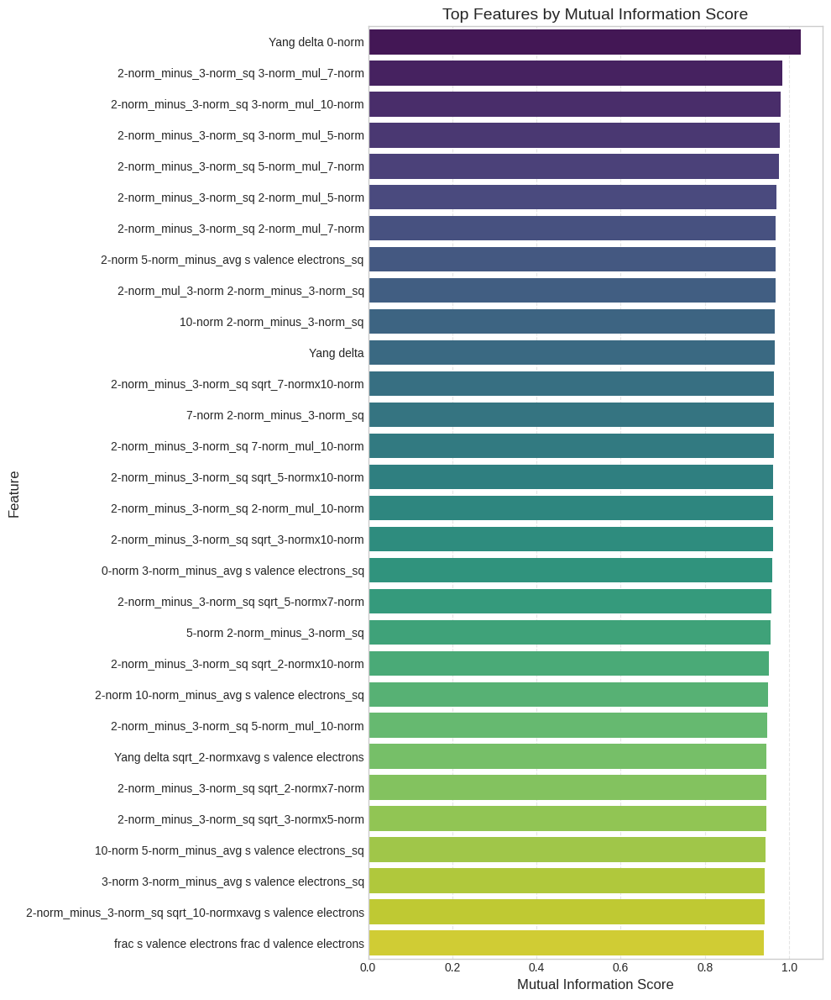

[I 2025-06-16 17:20:33,771] A new study created in memory with name: no-name-8311086a-87d4-4cea-8738-22844d93a936



Starting Optuna Hyperparameter Tuning...


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)
[I 2025-06-16 17:27:19,451] Trial 0 finished with value: 0.029233720153570175 and parameters: {'learning_rate': 1.737588718152687e-05, 'weight_decay': 5.7665507644187806e-05, 'dropout_rate': 0.37564026740525647, 'batch_size': 64, 'n_features_rfe': 33}. Best is trial 0 with value: 0.029233720153570175.
[W 2025-06-16 17:29:13,660] Trial 1 failed with parameters: {'learning_rate': 0.0007496927717631789, 'weight_decay': 7.5186926

KeyboardInterrupt: 

In [4]:
import pandas as pd
import numpy as np
import sys
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from sklearn.feature_selection import mutual_info_regression, RFE
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from pandas.plotting import parallel_coordinates
import optuna

# Set consistent style and random seed for reproducibility
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette('viridis')
np.random.seed(42)
torch.manual_seed(42)

# Define constants
INPUT_FILE = 'corrosion_refined.csv'
TARGET_COLUMN = 'EtoJ'
CATEGORICAL_FEATURES = [
    'MfgRoute',
    'Process_Clustered',
    'Coolingmedium_Clustered',
    'Solution_Clustered'
]

# Neural network definition
class RegressionNN(nn.Module):
    def __init__(self, input_dim, dropout_rate=0.4):
        super(RegressionNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, 256)
        self.bn1 = nn.BatchNorm1d(256)
        self.fc2 = nn.Linear(256, 128)
        self.bn2 = nn.BatchNorm1d(128)
        self.fc3 = nn.Linear(128, 64)
        self.bn3 = nn.BatchNorm1d(64)
        self.fc4 = nn.Linear(64, 32)
        self.dropout = nn.Dropout(dropout_rate)
        self.fc5 = nn.Linear(32, 1)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.relu(self.bn1(self.fc1(x)))
        x = self.dropout(x)
        x = self.relu(self.bn2(self.fc2(x)))
        x = self.dropout(x)
        x = self.relu(self.bn3(self.fc3(x)))
        x = self.relu(self.fc4(x))
        return self.fc5(x)

# Custom weighted MSE loss
class WeightedMSELoss(nn.Module):
    def __init__(self):
        super(WeightedMSELoss, self).__init__()

    def forward(self, predictions, targets):
        weights = 1.0 + 5.0 * torch.sigmoid((targets - 0.6) / 0.1)
        return (weights * (predictions - targets)**2).mean()

# Function to compute MI and plot
def perform_mutual_information_analysis(X, y, categorical_features_list, target_col):
    X_mi = X.apply(pd.to_numeric, errors='coerce').fillna(0)
    y_series_for_mi = pd.Series(y.flatten(), name=target_col, index=X.index)
    y_mi_numeric = pd.to_numeric(y_series_for_mi, errors='coerce')
    combined_df = pd.concat([X_mi, y_mi_numeric], axis=1).dropna()
    X_mi_cleaned = combined_df.drop(columns=[target_col])
    y_mi_cleaned = combined_df[target_col].values

    if X_mi_cleaned.empty or len(y_mi_cleaned) == 0:
        print("Error: No valid data remaining after NaN handling for MI analysis.")
        return pd.Series()

    discrete_features_indices = []
    for orig_cat_feat in categorical_features_list:
        for i, col_name in enumerate(X_mi_cleaned.columns):
            if orig_cat_feat in col_name.split('_') or orig_cat_feat == col_name:
                discrete_features_indices.append(i)
    discrete_features_indices = list(set(discrete_features_indices))

    mi_discrete_features_arg = 'auto' if not discrete_features_indices else discrete_features_indices
    if not discrete_features_indices:
        print("Warning: No discrete features identified for MI analysis.")
    
    if X_mi_cleaned.shape[0] < 2 or X_mi_cleaned.shape[1] == 0:
        print(f"Warning: Insufficient samples ({X_mi_cleaned.shape[0]}) or features ({X_mi_cleaned.shape[1]}) for MI analysis.")
        return pd.Series()

    mi = mutual_info_regression(X_mi_cleaned, y_mi_cleaned, discrete_features=mi_discrete_features_arg, random_state=42)
    mi_series = pd.Series(mi, index=X_mi_cleaned.columns).sort_values(ascending=False)

    print("\nMutual Information Scores (Top 20):")
    print(mi_series.head(20))

    plt.figure(figsize=(10,12))
    if not mi_series.empty:
        plot_mi_series = mi_series.head(min(30, len(mi_series)))
        sns.barplot(x=plot_mi_series.values, y=plot_mi_series.index, palette='viridis')
        plt.title('Top Features by Mutual Information Score', fontsize=14)
        plt.xlabel('Mutual Information Score', fontsize=12)
        plt.ylabel('Feature', fontsize=12)
        plt.grid(axis='x', linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()
    else:
        print("MI series is empty, skipping MI bar plot.")
    
    return mi_series

# Model training with early stopping
def train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, epochs, patience, run_warmup=True, warmup_epochs=50, end_warmup_lr=1e-4, verbose=True):
    best_val_loss = float('inf')
    wait = 0
    history = {'train': [], 'val': []}
    best_model_state = None

    if run_warmup:
        if verbose: print("\nBeginning LR Warmup phase...")
        for e in range(warmup_epochs):
            model.train()
            for pg in optimizer.param_groups:
                pg['lr'] = end_warmup_lr * (e+1) / warmup_epochs
            tr_loss_warmup = 0
            for Xb, yb in train_loader:
                optimizer.zero_grad()
                loss = criterion(model(Xb), yb)
                loss.backward()
                optimizer.step()
                tr_loss_warmup += loss.item() * Xb.size(0)
            tr_loss_warmup /= len(train_loader.dataset)
            if verbose and (e % 10 == 0 or e == warmup_epochs - 1):
                print(f"Warmup {e}/{warmup_epochs}, Current LR: {optimizer.param_groups[0]['lr']:.6f}, Loss: {tr_loss_warmup:.4f}")
        if verbose: print("LR Warmup phase complete.")

    for epoch in range(epochs):
        model.train()
        tr_loss = 0
        for Xb, yb in train_loader:
            optimizer.zero_grad()
            pred = model(Xb)
            loss = criterion(pred, yb)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()
            tr_loss += loss.item() * Xb.size(0)
        tr_loss /= len(train_loader.dataset)
        history['train'].append(tr_loss)

        model.eval()
        val_loss = 0
        with torch.no_grad():
            for Xb, yb in val_loader:
                pred = model(Xb)
                val_loss += criterion(pred, yb).item() * Xb.size(0)
        val_loss /= len(val_loader.dataset)
        history['val'].append(val_loss)

        scheduler.step(val_loss)

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_state = model.state_dict()
            wait = 0
        else:
            wait += 1
            if wait >= patience:
                if verbose: print(f"Early stopping at epoch {epoch}")
                break
        if verbose and epoch % 50 == 0:
            print(f"Epoch {epoch}: Train {tr_loss:.4f}, Val {val_loss:.4f}")

    if best_model_state is not None:
        model.load_state_dict(best_model_state)
    return history, best_val_loss

# Evaluation
def evaluate_model(model, loader, inv_transform=None):
    model.eval()
    preds, trues = [], []
    with torch.no_grad():
        for Xb, yb in loader:
            out = model(Xb)
            if inv_transform:
                preds.extend(inv_transform(out.cpu().numpy()).squeeze().tolist())
                trues.extend(inv_transform(yb.cpu().numpy()).squeeze().tolist())
            else:
                preds.extend(out.squeeze().tolist())
                trues.extend(yb.squeeze().tolist())
    preds, trues = np.array(preds), np.array(trues)

    finite_mask = np.isfinite(trues) & np.isfinite(preds)
    if not np.all(finite_mask):
        print(f"Warning: Non-finite values detected in actuals or predictions. Filtering them out. ({np.sum(~finite_mask)} values removed)")
        trues = trues[finite_mask]
        preds = preds[finite_mask]

    if len(trues) == 0:
        print("Warning: No finite actual/prediction pairs remaining for metric calculation.")
        return np.nan, np.nan, np.nan, np.nan, np.array([]), np.array([])

    r2 = r2_score(trues, preds)
    mae = mean_absolute_error(trues, preds)
    mse = mean_squared_error(trues, preds)
    non_zero_trues_mask = trues != 0
    if np.sum(non_zero_trues_mask) > 0:
        mape = np.mean(np.abs((trues[non_zero_trues_mask]-preds[non_zero_trues_mask])/trues[non_zero_trues_mask]))*100
    else:
        mape = np.nan
        print("Warning: All true values are zero, MAPE is undefined.")

    return r2, mae, mse, mape, trues, preds

# Plotting functions
def plot_learning_curve(train_losses, val_losses):
    plt.figure(figsize=(10, 6))
    plt.plot(train_losses, label='Training Loss', color='blue', linewidth=2)
    plt.plot(val_losses, label='Validation Loss', color='red', linewidth=2)
    plt.title('Learning Curve', fontsize=16)
    plt.xlabel('Epoch', fontsize=12)
    plt.ylabel('Loss (Weighted MSE)', fontsize=12)
    plt.legend(fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

def plot_parity(actuals, predictions, r2, title="Parity Plot"):
    plt.figure(figsize=(8, 8))
    plt.scatter(actuals, predictions, alpha=0.6, color='skyblue', edgecolors='w', linewidth=0.5)
    min_val = np.nanmin([np.nanmin(actuals), np.nanmin(predictions)]) if np.isfinite(np.nanmin(actuals)) and np.isfinite(np.nanmin(predictions)) else 0
    max_val = np.nanmax([np.nanmax(actuals), np.nanmax(predictions)]) if np.isfinite(np.nanmax(actuals)) and np.isfinite(np.nanmax(predictions)) else 1
    if max_val - min_val < 1e-6:
        buffer = 0.1
        min_val -= buffer
        max_val += buffer
    plt.plot([min_val, max_val], [min_val, max_val], 'r--', label='Ideal Fit (y=x)', linewidth=2)
    plt.title(f'{title} (R² = {r2:.4f})', fontsize=16)
    plt.xlabel('Actual Values', fontsize=12)
    plt.ylabel('Predicted Values', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.text(0.05, 0.95, f'R² = {r2:.4f}', transform=plt.gca().transAxes, fontsize=12,
             verticalalignment='top', bbox=dict(boxstyle='round,pad=0.5', fc='wheat', alpha=0.8, ec='gray'))
    plt.legend(fontsize=10, loc='lower right')
    plt.tight_layout()
    plt.show()

def plot_mi_after_selection(mi_series_selected):
    plt.figure(figsize=(10, 12))
    mi_series_selected_sorted = mi_series_selected.sort_values(ascending=False)
    if not mi_series_selected_sorted.empty:
        sns.barplot(x=mi_series_selected_sorted.values, y=mi_series_selected_sorted.index, palette='viridis')
        plt.title('Mutual Information Scores (After Feature Selection)', fontsize=14)
        plt.xlabel('Mutual Information Score', fontsize=12)
        plt.ylabel('Feature', fontsize=12)
        plt.grid(axis='x', linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()
    else:
        print("MI series after selection is empty, skipping plot.")

# Optuna objective function
def objective(trial, X_poly, y, mi_series):
    # Define hyperparameter search space
    params = {
        'learning_rate': trial.suggest_float('learning_rate', 1e-5, 1e-3, log=True),
        'weight_decay': trial.suggest_float('weight_decay', 1e-6, 1e-4, log=True),
        'dropout_rate': trial.suggest_float('dropout_rate', 0.2, 0.6),
        'batch_size': trial.suggest_categorical('batch_size', [32, 64]),
        'n_features_rfe': trial.suggest_int('n_features_rfe', 20, min(40, X_poly.shape[1]))
    }

    # RFE Selection
    lin = LinearRegression()
    n_features_to_select_rfe = params['n_features_rfe']
    selector = RFE(lin, n_features_to_select=n_features_to_select_rfe, step=1)

    X_poly_cleaned_for_rfe = X_poly.copy().apply(pd.to_numeric, errors='coerce').fillna(0)
    y_series_for_rfe = pd.Series(y.flatten(), name='temp_target', index=X_poly_cleaned_for_rfe.index)
    y_cleaned_numeric_for_rfe = pd.to_numeric(y_series_for_rfe, errors='coerce')
    temp_df_rfe = pd.concat([X_poly_cleaned_for_rfe, y_cleaned_numeric_for_rfe], axis=1).dropna()
    X_poly_cleaned_aligned = temp_df_rfe.drop(columns=['temp_target'])
    y_cleaned_aligned = temp_df_rfe['temp_target'].values

    if X_poly_cleaned_aligned.empty or len(y_cleaned_aligned) == 0:
        print("Error: No valid data remaining after NaN handling for RFE.")
        return float('inf')

    try:
        selector.fit(X_poly_cleaned_aligned, y_cleaned_aligned)
        selected_rfe_features = list(X_poly_cleaned_aligned.columns[selector.support_])
    except Exception as e:
        print(f"Error during RFE fitting: {e}. Fallback to MI top features.")
        selected_rfe_features = mi_series.head(n_features_to_select_rfe).index.tolist()
        selected_rfe_features = [f for f in selected_rfe_features if f in X_poly.columns]
        if not selected_rfe_features:
            print("Warning: Fallback MI features list is empty.")
            return float('inf')

    mandatory_base_features = ['T[oC]', 't[hr]'] + CATEGORICAL_FEATURES
    mandatory_features_in_poly_space = []
    for base_feat in mandatory_base_features:
        for col_name in X_poly.columns:
            if base_feat == col_name or (base_feat + '_' in col_name and base_feat in col_name.split('_')) or (base_feat in col_name.split(' ') and '_' not in base_feat):
                mandatory_features_in_poly_space.append(col_name)
    mandatory_features_in_poly_space = list(set(mandatory_features_in_poly_space))
    mandatory_features_in_poly_space = [f for f in mandatory_features_in_poly_space if f in X_poly.columns]

    final_selected_features = list(set(selected_rfe_features + mandatory_features_in_poly_space))
    final_selected_features = [f for f in final_selected_features if f in X_poly.columns]

    if not final_selected_features:
        print("Error: No features selected for training.")
        return float('inf')

    X_sel_current = X_poly[final_selected_features].copy()

    # Scale and split
    scaler = StandardScaler()
    X_scaled_current = scaler.fit_transform(X_sel_current)
    y_log = np.log1p(y).reshape(-1,1)

    # Synthetic data generation
    y_aligned_to_X_sel = pd.Series(y.flatten(), index=df.index).loc[X_sel_current.index].values
    mask_high_log = y_aligned_to_X_sel > 0.6
    n_majority_samples = np.sum(~mask_high_log)
    n_synthetic_samples_target = int(0.3 * n_majority_samples)

    X_synth = X_scaled_current.copy()
    y_synth = y_log.copy()

    if np.sum(mask_high_log) > 0 and n_synthetic_samples_target > 0:
        high_indices_in_aligned_data = np.where(mask_high_log)[0]
        if len(high_indices_in_aligned_data) > 0:
            synth_indices_from_high = np.random.choice(len(high_indices_in_aligned_data), n_synthetic_samples_target, replace=True)
            X_high_samples = X_scaled_current[high_indices_in_aligned_data[synth_indices_from_high]]
            y_log_high_samples = y_log[high_indices_in_aligned_data[synth_indices_from_high]]
            synth_X_added = X_high_samples + np.random.normal(0, 0.01, size=X_high_samples.shape)
            synth_y_added = y_log_high_samples + np.random.normal(0, 0.01, size=y_log_high_samples.shape)
            X_synth = np.vstack([X_scaled_current, synth_X_added])
            y_synth = np.vstack([y_log, synth_y_added])

    X_t_current = torch.tensor(X_synth, dtype=torch.float32)
    y_t_current = torch.tensor(y_synth, dtype=torch.float32)

    X_tr, X_val, y_tr, y_val = train_test_split(X_t_current, y_t_current, test_size=0.15, random_state=42)

    train_loader = DataLoader(TensorDataset(X_tr, y_tr), batch_size=params['batch_size'], shuffle=True)
    val_loader = DataLoader(TensorDataset(X_val, y_val), batch_size=params['batch_size'], shuffle=False)

    # Model setup
    model_current = RegressionNN(X_tr.shape[1], dropout_rate=params['dropout_rate'])
    criterion = WeightedMSELoss()
    opt_current = optim.Adam(model_current.parameters(), lr=params['learning_rate'], weight_decay=params['weight_decay'])
    sched_current = optim.lr_scheduler.CosineAnnealingLR(opt_current, T_max=500)

    # Train model
    _, current_val_loss = train_model(
        model_current, train_loader, val_loader, criterion, opt_current, sched_current,
        epochs=500, patience=50, run_warmup=True, end_warmup_lr=params['learning_rate'], verbose=False
    )

    return current_val_loss

if __name__ == '__main__':
    # Load data
    try:
        df = pd.read_csv(INPUT_FILE)
        print(f"Successfully loaded '{INPUT_FILE}' with shape: {df.shape}")
    except FileNotFoundError:
        print(f"File '{INPUT_FILE}' not found.")
        sys.exit(1)
    except Exception as e:
        print(f"An error occurred while loading the CSV: {e}")
        sys.exit(1)

    # Separate target from features
    y = pd.to_numeric(df[TARGET_COLUMN], errors='coerce').values
    X = df.drop(columns=[TARGET_COLUMN]).copy()

    # Coerce all feature columns to numeric
    for c in X.columns:
        X[c] = pd.to_numeric(X[c], errors='coerce').fillna(0)

    # Determine original composition columns for PCC analysis
    all_known_non_composition_features_in_original_df = ['T[oC]', 't[hr]', TARGET_COLUMN] + CATEGORICAL_FEATURES
    original_composition_cols = [
        col for col in df.columns
        if col not in all_known_non_composition_features_in_original_df
    ]

    # Feature Engineering
    if 'T[oC]' in X.columns and 't[hr]' in X.columns:
        X['T_t_interaction'] = (X['T[oC]'] * X['t[hr]']).fillna(0)
        X['T_squared'] = (X['T[oC]']**2).fillna(0)
        X['t_squared'] = (X['t[hr]']**2).fillna(0)
        X['1_over_t'] = (1 / (X['t[hr]'] + 1e-6)).fillna(0)
    else:
        print("Warning: Missing 'T[oC]' or 't[hr]' for process interaction features.")

    # PCC Analysis
    df_for_pcc = df[original_composition_cols + [TARGET_COLUMN]].copy()
    for col in df_for_pcc.columns:
        df_for_pcc[col] = pd.to_numeric(df_for_pcc[col], errors='coerce')
    df_for_pcc = df_for_pcc.dropna()

    strong_comps = []
    if not df_for_pcc.empty and TARGET_COLUMN in df_for_pcc.columns:
        if len(df_for_pcc) > 1 and len(df_for_pcc[TARGET_COLUMN].unique()) > 1:
            pcc = df_for_pcc.corr().loc[original_composition_cols, TARGET_COLUMN]
            strong = pcc.abs() > 0.35
            strong_comps = pcc[strong].index.tolist()
            print(f"\nIdentified {len(strong_comps)} strongly correlated composition features: {strong_comps}")
        else:
            print("Warning: Insufficient data for PCC analysis.")

    # Cross-terms
    if not strong_comps:
        top_comps_for_interactions = [
            '2-norm', '3-norm', 'avg s valence electrons',
            'Yang delta', 'frac d valence electrons', '10-norm',
            'HOMO_energy', 'LUMO_energy'
        ]
        top_comps_for_interactions = [c for c in top_comps_for_interactions if c in X.columns]
        print(f"Using default list for interactions: {top_comps_for_interactions}")
    else:
        top_comps_for_interactions = [c for c in strong_comps if c in X.columns]

    for comp in top_comps_for_interactions:
        if comp in X.columns and 'T[oC]' in X.columns and 't[hr]' in X.columns:
            X[f'T_x_{comp}'] = (X['T[oC]'] * X[comp]).fillna(0)
            X[f't_x_{comp}'] = (X['t[hr]'] * X[comp]).fillna(0)
            X[f'ln_abs_{comp}_x_T'] = (np.log1p(np.abs(X[comp]) + 1e-6) * X['T[oC]']).fillna(0)
            X[f'{comp}_over_t'] = (X[comp] / (X['t[hr]'] + 1e-6)).fillna(0)

    # Composition-composition interactions
    valid_strong_comps = [c for c in strong_comps if c in X.columns]
    if len(valid_strong_comps) > 1:
        for i in range(len(valid_strong_comps)):
            for j in range(i + 1, len(valid_strong_comps)):
                comp_i = valid_strong_comps[i]
                comp_j = valid_strong_comps[j]
                X[f'{comp_i}_mul_{comp_j}'] = (X[comp_i] * X[comp_j]).fillna(0)
                X[f'{comp_i}_minus_{comp_j}_sq'] = ((X[comp_i] - X[comp_j])**2).fillna(0)
                X[f'sqrt_{comp_i}x{comp_j}'] = (np.sqrt(np.abs(X[comp_i]*X[comp_j]) + 1e-6)).fillna(0)

    # HOMO-LUMO gap
    if 'LUMO_energy' in X.columns and 'HOMO_energy' in X.columns and 'T[oC]' in X.columns:
        X['homo_lumo_gap'] = (X['LUMO_energy'] - X['HOMO_energy']).fillna(0)
        X['sqrt_gap_x_T'] = (np.sqrt(np.abs(X['homo_lumo_gap']) + 1e-6) * X['T[oC]']).fillna(0)

    print(f"Finished feature engineering. Current X shape: {X.shape}")

    # Encoding categoricals
    existing_categorical_features = [f for f in CATEGORICAL_FEATURES if f in X.columns]
    if existing_categorical_features:
        X = pd.get_dummies(X, columns=existing_categorical_features, drop_first=True)
        print(f"One-hot encoded categorical features. Current X shape: {X.shape}")

    # Polynomial Features
    X_for_poly = X.copy().apply(pd.to_numeric, errors='coerce').fillna(0)
    poly = PolynomialFeatures(degree=2, include_bias=False)
    try:
        X_poly_transformed = poly.fit_transform(X_for_poly)
        X_poly = pd.DataFrame(X_poly_transformed, columns=poly.get_feature_names_out(X_for_poly.columns), index=X_for_poly.index)
        X_poly = X_poly.apply(pd.to_numeric, errors='coerce').fillna(0)
        print(f"\nPolynomial features generated. New feature count: {X_poly.shape[1]}")
    except Exception as e:
        print(f"Error during PolynomialFeatures transformation: {e}")
        X_poly = X_for_poly.copy()

    # MI Analysis
    discrete_idx_for_mi = []
    for orig_cat_feat in CATEGORICAL_FEATURES:
        for i, col_name in enumerate(X_poly.columns):
            if orig_cat_feat in col_name.split('_') or orig_cat_feat == col_name:
                discrete_idx_for_mi.append(i)
    discrete_idx_for_mi = list(set(discrete_idx_for_mi))
    print(f"\nIdentified {len(discrete_idx_for_mi)} discrete features for MI analysis.")
    mi_series = perform_mutual_information_analysis(X_poly.copy(), y.copy(), CATEGORICAL_FEATURES, TARGET_COLUMN)
    if mi_series.empty:
        print("MI analysis resulted in an empty series.")
        sys.exit(1)

    # Optuna Hyperparameter Tuning
    print("\nStarting Optuna Hyperparameter Tuning...")
    study = optuna.create_study(direction='minimize')
    study.optimize(lambda trial: objective(trial, X_poly, y, mi_series), n_trials=50)

    best_params = study.best_params
    best_val_loss_overall = study.best_value
    print("\n--- Hyperparameter Tuning Complete ---")
    print(f"Best Validation Loss: {best_val_loss_overall:.4f}")
    print(f"Best Hyperparameters: {best_params}")

    # Recreate best model data
    lin = LinearRegression()
    selector = RFE(lin, n_features_to_select=best_params['n_features_rfe'], step=1)
    X_poly_cleaned_for_rfe = X_poly.copy().apply(pd.to_numeric, errors='coerce').fillna(0)
    y_series_for_rfe = pd.Series(y.flatten(), name='temp_target', index=X_poly_cleaned_for_rfe.index)
    y_cleaned_numeric_for_rfe = pd.to_numeric(y_series_for_rfe, errors='coerce')
    temp_df_rfe = pd.concat([X_poly_cleaned_for_rfe, y_cleaned_numeric_for_rfe], axis=1).dropna()
    X_poly_cleaned_aligned = temp_df_rfe.drop(columns=['temp_target'])
    y_cleaned_aligned = temp_df_rfe['temp_target'].values

    try:
        selector.fit(X_poly_cleaned_aligned, y_cleaned_aligned)
        selected_rfe_features = list(X_poly_cleaned_aligned.columns[selector.support_])
    except Exception as e:
        print(f"Error during RFE fitting: {e}. Fallback to MI top features.")
        selected_rfe_features = mi_series.head(best_params['n_features_rfe']).index.tolist()
        selected_rfe_features = [f for f in selected_rfe_features if f in X_poly.columns]

    mandatory_base_features = ['T[oC]', 't[hr]'] + CATEGORICAL_FEATURES
    mandatory_features_in_poly_space = []
    for base_feat in mandatory_base_features:
        for col_name in X_poly.columns:
            if base_feat == col_name or (base_feat + '_' in col_name and base_feat in col_name.split('_')) or (base_feat in col_name.split(' ') and '_' not in base_feat):
                mandatory_features_in_poly_space.append(col_name)
    mandatory_features_in_poly_space = list(set(mandatory_features_in_poly_space))
    mandatory_features_in_poly_space = [f for f in mandatory_features_in_poly_space if f in X_poly.columns]

    final_selected_features = list(set(selected_rfe_features + mandatory_features_in_poly_space))
    final_selected_features = [f for f in final_selected_features if f in X_poly.columns]

    best_X_sel = X_poly[final_selected_features].copy()

    # Final Training with Best Parameters
    print("\n--- Final Model Training with Best Hyperparameters ---")
    scaler = StandardScaler()
    X_scaled_final = scaler.fit_transform(best_X_sel)
    y_log_final = np.log1p(y).reshape(-1,1)

    y_aligned_to_best_X_sel = pd.Series(y.flatten(), index=df.index).loc[best_X_sel.index].values
    mask_high_log_final = y_aligned_to_best_X_sel > 0.6
    n_majority_samples_final = np.sum(~mask_high_log_final)
    n_synthetic_samples_target_final = int(0.3 * n_majority_samples_final)

    X_synth_final = X_scaled_final.copy()
    y_synth_final = y_log_final.copy()

    if np.sum(mask_high_log_final) > 0 and n_synthetic_samples_target_final > 0:
        high_indices_in_aligned_data_final = np.where(mask_high_log_final)[0]
        if len(high_indices_in_aligned_data_final) > 0:
            synth_indices_from_high_final = np.random.choice(len(high_indices_in_aligned_data_final), n_synthetic_samples_target_final, replace=True)
            X_high_samples_final = X_scaled_final[high_indices_in_aligned_data_final[synth_indices_from_high_final]]
            y_log_high_samples_final = y_log_final[high_indices_in_aligned_data_final[synth_indices_from_high_final]]
            synth_X_added_final = X_high_samples_final + np.random.normal(0, 0.01, size=X_high_samples_final.shape)
            synth_y_added_final = y_log_high_samples_final + np.random.normal(0, 0.01, size=y_log_high_samples_final.shape)
            X_synth_final = np.vstack([X_scaled_final, synth_X_added_final])
            y_synth_final = np.vstack([y_log_final, synth_y_added_final])

    X_t_final = torch.tensor(X_synth_final, dtype=torch.float32)
    y_t_final = torch.tensor(y_synth_final, dtype=torch.float32)

    X_tr_final, X_val_final, y_tr_final, y_val_final = train_test_split(X_t_final, y_t_final, test_size=0.15, random_state=42)

    train_loader_final = DataLoader(TensorDataset(X_tr_final, y_tr_final), batch_size=best_params['batch_size'], shuffle=True)
    val_loader_final = DataLoader(TensorDataset(X_val_final, y_val_final), batch_size=best_params['batch_size'], shuffle=False)

    final_model = RegressionNN(X_tr_final.shape[1], dropout_rate=best_params['dropout_rate'])
    final_criterion = WeightedMSELoss()
    final_opt = optim.Adam(final_model.parameters(), lr=best_params['learning_rate'], weight_decay=best_params['weight_decay'])
    final_sched = optim.lr_scheduler.CosineAnnealingLR(final_opt, T_max=1500)

    final_history, _ = train_model(
        final_model, train_loader_final, val_loader_final, final_criterion, final_opt, final_sched,
        epochs=1500, patience=100, run_warmup=True, end_warmup_lr=best_params['learning_rate'], verbose=True
    )

    print("\n--- Evaluating Final Model Performance ---")
    inv_transform_y = lambda t: np.expm1(t)

    r2_tr, mae_tr, mse_tr, mape_tr, train_actuals, train_predictions = evaluate_model(final_model, train_loader_final, inv_transform_y)
    r2_v, mae_v, mse_v, mape_v, val_actuals, val_predictions = evaluate_model(final_model, val_loader_final, inv_transform_y)

    print(f"\n--- Final Model Performance ---")
    print(f"Train R2: {r2_tr:.4f}, MAE: {mae_tr:.4f}, MAPE: {mape_tr:.2f}%, MSE: {mse_tr:.4f}")
    print(f"Validation R2: {r2_v:.4f}, MAE: {mae_v:.4f}, MAPE: {mape_v:.2f}%, MSE: {mse_v:.4f}")

    plot_learning_curve(final_history['train'], final_history['val'])
    plot_parity(train_actuals, train_predictions, r2_tr, title="Final Training Set Parity Plot")
    plot_parity(val_actuals, val_predictions, r2_v, title="Final Validation Set Parity Plot")
    plot_mi_after_selection(mi_series[mi_series.index.isin(best_X_sel.columns)])

    # Parallel Coordinates and t-SNE
    common_indices_for_plot = best_X_sel.index.intersection(df.index)
    X_plot_features = best_X_sel.loc[common_indices_for_plot].copy()
    y_original_aligned_for_plot = df.loc[common_indices_for_plot, TARGET_COLUMN].values
    X_plot_features[TARGET_COLUMN] = y_original_aligned_for_plot

    if len(X_plot_features[TARGET_COLUMN].unique()) > 1:
        try:
            X_plot_features['Target_Bins'] = pd.qcut(X_plot_features[TARGET_COLUMN], q=6, labels=False, duplicates='drop')
        except ValueError:
            print("Could not create 6 quantile bins for Target_Bins, trying with fewer.")
            try:
                X_plot_features['Target_Bins'] = pd.qcut(X_plot_features[TARGET_COLUMN], q=4, labels=False, duplicates='drop')
            except ValueError:
                print("Could not create 4 quantile bins either. Skipping Target_Bins.")
                X_plot_features['Target_Bins'] = pd.Series(0, index=X_plot_features.index)
    else:
        print("Not enough unique target values to create bins for plotting.")
        X_plot_features['Target_Bins'] = pd.Series(0, index=X_plot_features.index)

    features_for_parallel = mi_series[mi_series.index.isin(best_X_sel.columns)].head(min(10, len(mi_series[mi_series.index.isin(best_X_sel.columns)]))).index.tolist()
    existing_plot_features = [f for f in features_for_parallel if f in X_plot_features.columns]

    if 'Target_Bins' in X_plot_features.columns and existing_plot_features:
        parallel_plot_df = X_plot_features[existing_plot_features + ['Target_Bins']].copy()
        scaler_for_plot = StandardScaler()
        numerical_cols_for_parallel = [col for col in existing_plot_features if pd.api.types.is_numeric_dtype(parallel_plot_df[col])]
        if numerical_cols_for_parallel:
            parallel_plot_df[numerical_cols_for_parallel] = scaler_for_plot.fit_transform(parallel_plot_df[numerical_cols_for_parallel])
        plt.figure(figsize=(14, 7))
        parallel_coordinates(parallel_plot_df, 'Target_Bins', colormap='viridis', alpha=0.5)
        plt.title(f'Parallel Coordinates Plot: Top {len(existing_plot_features)} Selected Features vs. {TARGET_COLUMN} Bins', fontsize=16)
        plt.xlabel('Features', fontsize=12)
        plt.ylabel('Normalized Value', fontsize=12)
        plt.xticks(rotation=45, ha='right', fontsize=10)
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()

    tsne_input_data = best_X_sel.copy().apply(pd.to_numeric, errors='coerce').fillna(0)
    scaler_tsne = StandardScaler()
    tsne_scaled_data = scaler_tsne.fit_transform(tsne_input_data)

    if tsne_scaled_data.shape[0] > 1 and tsne_scaled_data.shape[1] > 1:
        perplexity_val = min(30, tsne_scaled_data.shape[0] - 1)
        if perplexity_val < 1:
            perplexity_val = 1
            print("Warning: Perplexity for t-SNE adjusted to 1 due to small sample size.")
        tsne = TSNE(n_components=2, random_state=42, perplexity=perplexity_val, n_iter=1000)
        try:
            X_tsne = tsne.fit_transform(tsne_scaled_data)
            tsne_df = pd.DataFrame(data=X_tsne, columns=['TSNE_Component_1', 'TSNE_Component_2'])
            tsne_df['Target_Bins'] = X_plot_features['Target_Bins'].loc[best_X_sel.index].reset_index(drop=True)
            if 'Target_Bins' in tsne_df.columns:
                plt.figure(figsize=(10, 8))
                sns.scatterplot(x='TSNE_Component_1', y='TSNE_Component_2', hue='Target_Bins', palette='viridis', data=tsne_df, s=50, alpha=0.8)
                if tsne_df.shape[0] > 1:
                    try:
                        sns.kdeplot(x='TSNE_Component_1', y='TSNE_Component_2', data=tsne_df, cmap='Blues', alpha=0.3, levels=5)
                    except Exception as kde_e:
                        print(f"Could not draw KDE plot for t-SNE: {kde_e}")
                plt.title(f't-SNE Plot: Selected Features Colored by {TARGET_COLUMN} Bins', fontsize=16)
                plt.xlabel('t-SNE Component 1', fontsize=12)
                plt.ylabel('t-SNE Component 2', fontsize=12)
                plt.grid(True, linestyle='--', alpha=0.5)
                plt.tight_layout()
                plt.show()
        except Exception as e:
            print(f"Error during t-SNE computation or plotting: {e}")

Successfully loaded 'corrosion_refined.csv' with shape: (287, 28)

Identified 6 strongly correlated composition features: ['2-norm', '3-norm', '5-norm', '7-norm', '10-norm', 'avg s valence electrons']
Finished feature engineering. Current X shape: (287, 102)
One-hot encoded categorical features. Current X shape: (287, 105)


/tmp/ipykernel_8006/848916237.py:318: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X['homo_lumo_gap'] = (X['LUMO_energy'] - X['HOMO_energy']).fillna(0)
/tmp/ipykernel_8006/848916237.py:319: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X['sqrt_gap_x_T'] = (np.sqrt(np.abs(X['homo_lumo_gap']) + 1e-6) * X['T[oC]']).fillna(0)



Polynomial features generated. New feature count: 5670

Identified 8 discrete features for MI analysis.
Identified 8 discrete features for MI.

Mutual Information Scores (Top 20):
Yang delta 0-norm                                 1.028155
2-norm_minus_3-norm_sq 3-norm_mul_7-norm          0.983846
2-norm_minus_3-norm_sq 3-norm_mul_10-norm         0.979232
2-norm_minus_3-norm_sq 3-norm_mul_5-norm          0.977666
2-norm_minus_3-norm_sq 5-norm_mul_7-norm          0.975564
2-norm_minus_3-norm_sq 2-norm_mul_5-norm          0.970287
2-norm_minus_3-norm_sq 2-norm_mul_7-norm          0.968808
2-norm 5-norm_minus_avg s valence electrons_sq    0.968709
2-norm_mul_3-norm 2-norm_minus_3-norm_sq          0.968332
10-norm 2-norm_minus_3-norm_sq                    0.965384
Yang delta                                        0.964933
2-norm_minus_3-norm_sq sqrt_7-normx10-norm        0.964897
7-norm 2-norm_minus_3-norm_sq                     0.964503
2-norm_minus_3-norm_sq 7-norm_mul_10-norm         0.

/tmp/ipykernel_8006/848916237.py:109: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=plot_mi_series.values, y=plot_mi_series.index, palette='viridis')


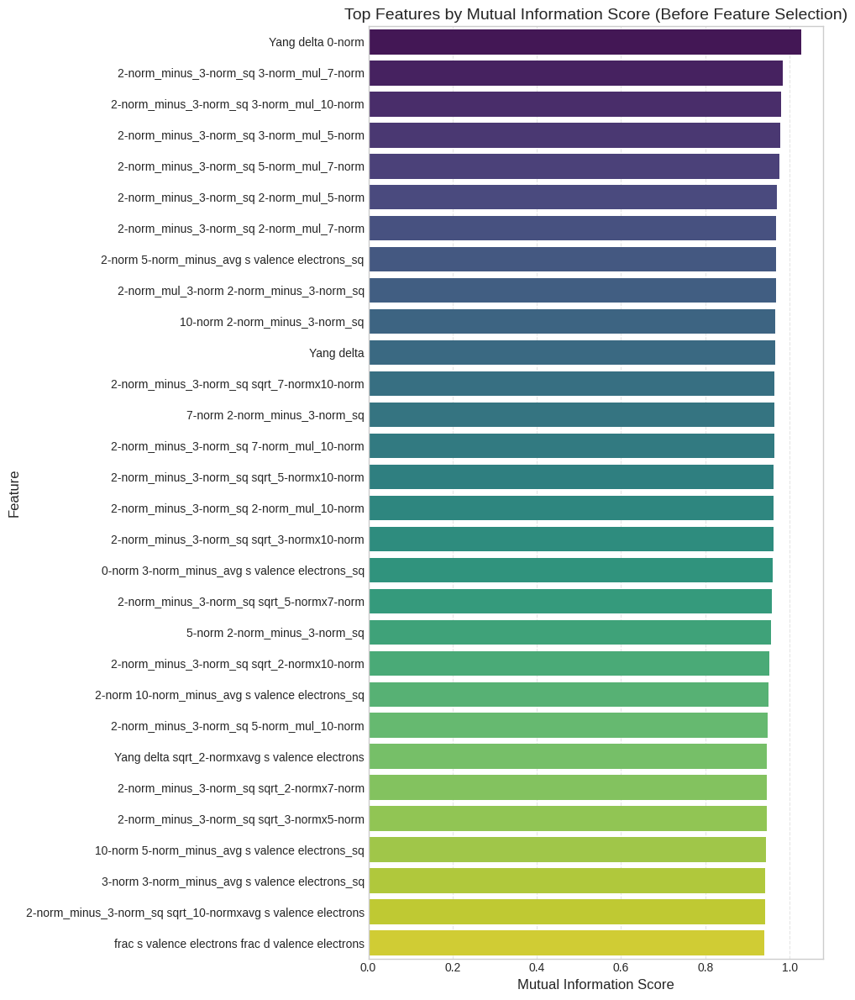


Fitting RFE on 5670 features and 287 samples...
RFE selected 25 features.

Mandatory features identified in polynomial space (217): ['t[hr] sqrt_10-normxavg s valence electrons', 't[hr] t_squared', 'T[oC] t_squared', 'T[oC] ln_abs_avg s valence electrons_x_T', 'MfgRoute_1^2', 't[hr] sqrt_5-normx10-norm', 't[hr] Miedema_deltaH_inter', 't[hr] MfgRoute_1', 'T[oC] sqrt_3-normx7-norm', 'T[oC] 5-norm_over_t', 'T[oC] Miedema_deltaH_inter', 't[hr] 3-norm_minus_10-norm_sq', 'T[oC] LUMO_energy', 'T[oC] ln_abs_5-norm_x_T', 't[hr] frac f valence electrons', 't[hr] 7-norm_minus_10-norm_sq', 't[hr] t_x_5-norm', 't[hr] sqrt_5-normx7-norm', 't[hr] Process_Clustered_1', 'T[oC] sqrt_3-normxavg s valence electrons', 'T[oC] 2-norm_minus_3-norm_sq', 'T[oC] 3-norm_minus_avg s valence electrons_sq', 'T[oC] 2-norm_over_t', 'MfgRoute_1 Solution_Clustered_3', 't[hr] sqrt_3-normx10-norm', 't[hr] sqrt_7-normx10-norm', 't[hr] ln_abs_10-norm_x_T', 'T[oC] T_x_3-norm', 'T[oC] avg f valence electrons', 't[hr] T_x_3-n

/tmp/ipykernel_8006/848916237.py:235: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mi_series_selected_sorted.values, y=mi_series_selected_sorted.index, palette='viridis')


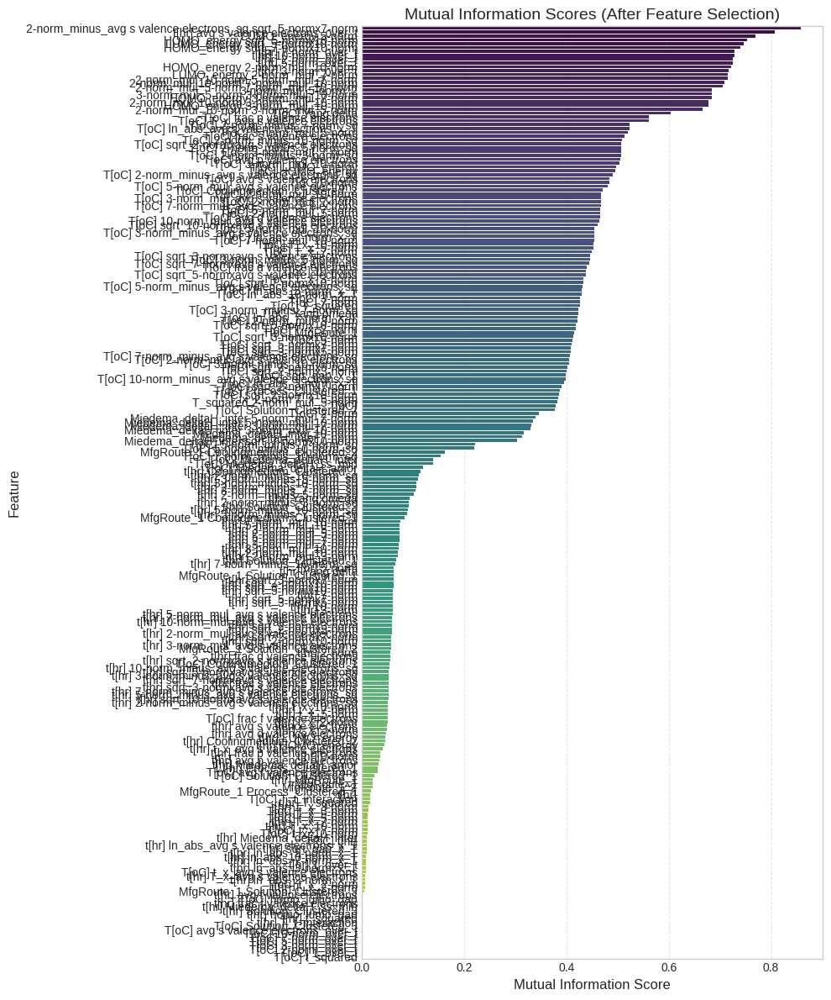

No transformation applied to target EtoJ.

Original high EtoJ samples (>0.6): 8
Targeting 83 synthetic samples to balance.
Dataset size after synthesis: X_scaled (370, 242), y_transformed (370, 1)

Beginning LR Warmup phase...
Warmup 0/50, Current LR: 0.000002, Loss: 0.3245
Warmup 10/50, Current LR: 0.000022, Loss: 0.1821
Warmup 20/50, Current LR: 0.000042, Loss: 0.1310
Warmup 30/50, Current LR: 0.000062, Loss: 0.1205
Warmup 40/50, Current LR: 0.000082, Loss: 0.1171
Warmup 49/50, Current LR: 0.000100, Loss: 0.0831
LR Warmup phase complete.
Epoch 0: Train 0.0894, Val 0.0774


/home/sachin/anaconda3/envs/tfenv/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:156: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 50: Train 0.0663, Val 0.0541
Epoch 100: Train 0.0801, Val 0.0337
Epoch 150: Train 0.0541, Val 0.0283
Epoch 200: Train 0.0407, Val 0.0249
Epoch 250: Train 0.0268, Val 0.0214
Epoch 300: Train 0.0281, Val 0.0279
Epoch 350: Train 0.0277, Val 0.0194
Epoch 400: Train 0.0205, Val 0.0204
Epoch 450: Train 0.0258, Val 0.0216
Epoch 500: Train 0.0226, Val 0.0253
Early stopping at epoch 516

Loaded best model for final evaluation.

--- Evaluating Model Performance ---

--- Model Performance ---
Train R2: 0.9145, MAE: 0.0464, MAPE: 78.83%, MSE: 0.0119
Validation R2: 0.8854, MAE: 0.0491, MAPE: 102.62%, MSE: 0.0135


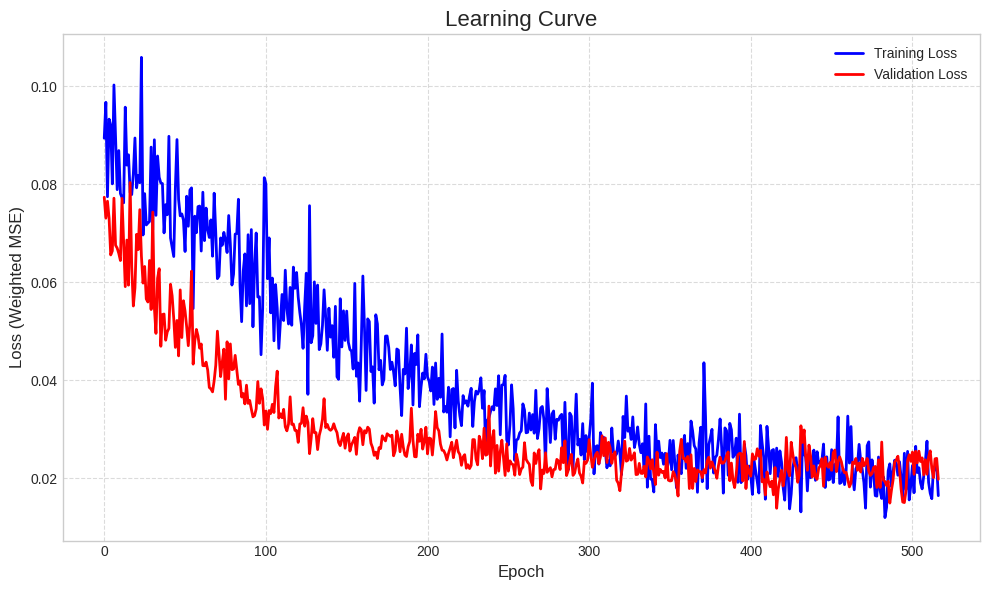

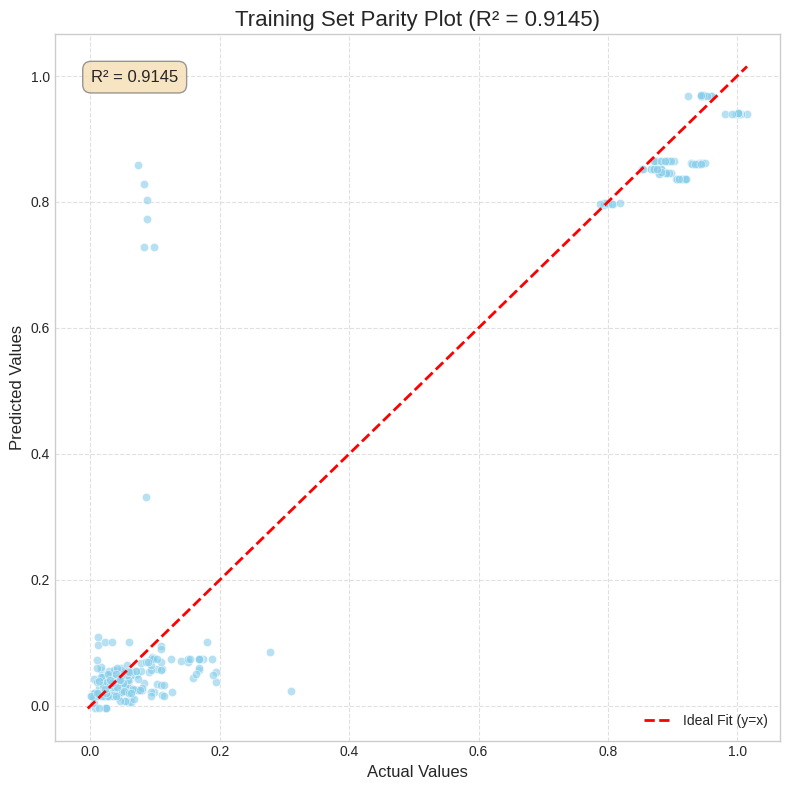

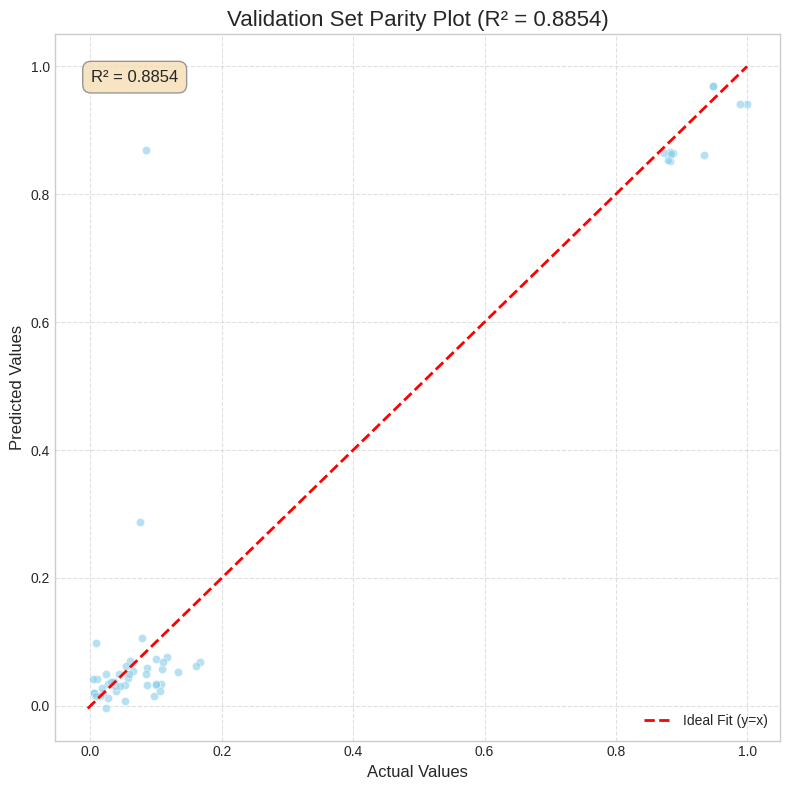

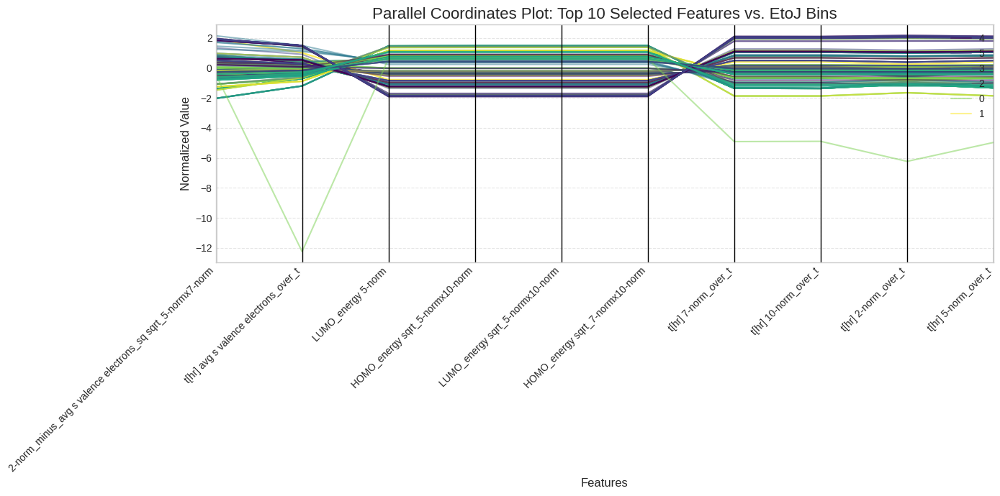

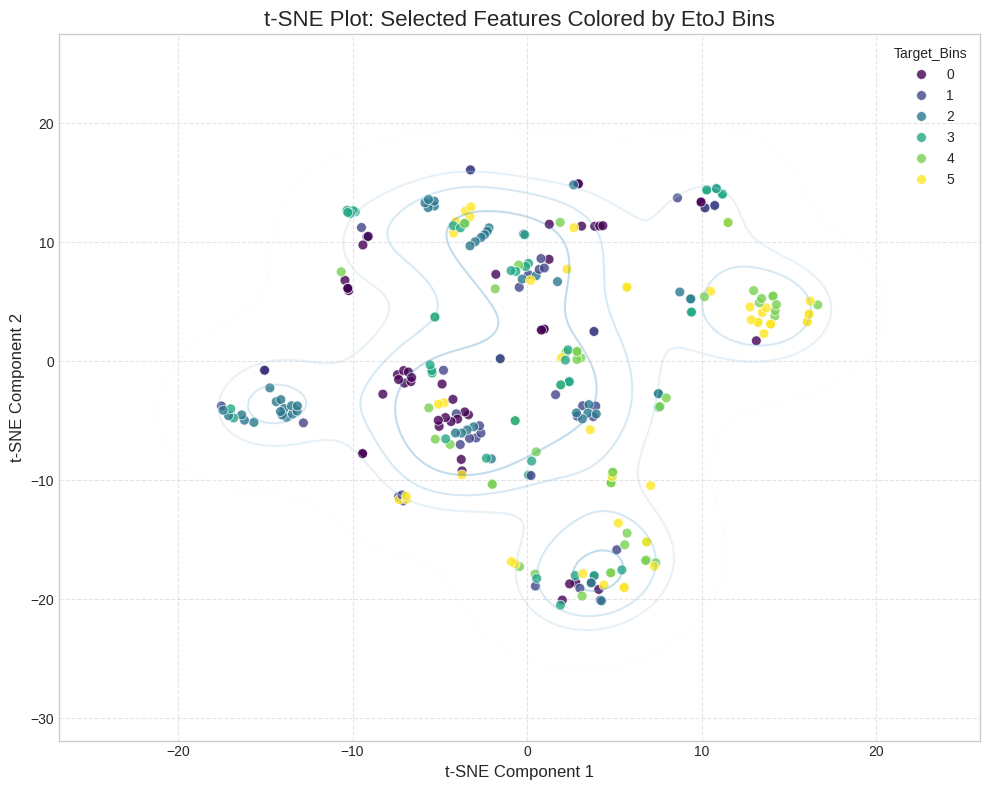

In [1]:

import pandas as pd
import numpy as np
import sys
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
from sklearn.feature_selection import mutual_info_regression, RFE
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures, StandardScaler, QuantileTransformer
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from pandas.plotting import parallel_coordinates

# Set consistent style and random seed for reproducibility
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette('viridis')
np.random.seed(42)
torch.manual_seed(42)

# Define constants
INPUT_FILE = 'corrosion_refined.csv'
TARGET_COLUMN = 'EtoJ'
CATEGORICAL_FEATURES = [
    'MfgRoute',
    'Process_Clustered',
    'Coolingmedium_Clustered',
    'Solution_Clustered'
]
TARGET_TRANSFORM = 'none'  # Options: 'quantile', 'none', 'log'

# Neural network definition
class RegressionNN(nn.Module):
    def __init__(self, input_dim):
        super(RegressionNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, 256)
        self.bn1 = nn.BatchNorm1d(256)
        self.fc2 = nn.Linear(256, 128)
        self.dropout = nn.Dropout(0.4)
        self.bn2 = nn.BatchNorm1d(128)
        self.fc3 = nn.Linear(128, 64)
        self.dropout = nn.Dropout(0.4)
        self.bn3 = nn.BatchNorm1d(64)
        self.fc4 = nn.Linear(64, 32)
        self.dropout = nn.Dropout(0.4)
        self.fc5 = nn.Linear(32, 1)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.relu(self.bn1(self.fc1(x)))
        x = self.dropout(x)
        x = self.relu(self.bn2(self.fc2(x)))
        x = self.dropout(x)
        x = self.relu(self.bn3(self.fc3(x)))
        x = self.relu(self.fc4(x))
        return self.fc5(x)

# Custom weighted MSE loss
class WeightedMSELoss(nn.Module):
    def __init__(self):
        super(WeightedMSELoss, self).__init__()

    def forward(self, predictions, targets):
        weights = 1.0 + 1.0 * torch.sigmoid((targets - 0.6) / 0.1)
        return (weights * (predictions - targets)**2).mean()

# Function to compute MI and plot
def perform_mutual_information_analysis(X, y, categorical_features_list, target_col):
    X_mi = X.apply(pd.to_numeric, errors='coerce').fillna(0)
    y_series_for_mi = pd.Series(y.flatten(), name=target_col, index=X.index)
    y_mi_numeric = pd.to_numeric(y_series_for_mi, errors='coerce')
    combined_df = pd.concat([X_mi, y_mi_numeric], axis=1).dropna()
    X_mi_cleaned = combined_df.drop(columns=[target_col])
    y_mi_cleaned = combined_df[target_col].values

    if X_mi_cleaned.empty or len(y_mi_cleaned) == 0:
        print("Error: No valid data remaining after NaN handling for MI analysis.")
        return pd.Series()

    discrete_features_indices = []
    for orig_cat_feat in categorical_features_list:
        for i, col_name in enumerate(X_mi_cleaned.columns):
            if orig_cat_feat in col_name.split('_') or orig_cat_feat == col_name:
                discrete_features_indices.append(i)
    discrete_features_indices = list(set(discrete_features_indices))

    mi_discrete_features_arg = 'auto' if not discrete_features_indices else discrete_features_indices
    if not discrete_features_indices:
        print("Warning: No discrete features identified for MI analysis.")
    else:
        print(f"Identified {len(discrete_features_indices)} discrete features for MI.")

    if X_mi_cleaned.shape[0] < 2 or X_mi_cleaned.shape[1] == 0:
        print(f"Warning: Insufficient samples ({X_mi_cleaned.shape[0]}) or features ({X_mi_cleaned.shape[1]}) for MI analysis.")
        return pd.Series()

    mi = mutual_info_regression(X_mi_cleaned, y_mi_cleaned, discrete_features=mi_discrete_features_arg, random_state=42)
    mi_series = pd.Series(mi, index=X_mi_cleaned.columns).sort_values(ascending=False)

    print("\nMutual Information Scores (Top 20):")
    print(mi_series.head(20))

    plt.figure(figsize=(10,12))
    if not mi_series.empty:
        plot_mi_series = mi_series.head(min(30, len(mi_series)))
        sns.barplot(x=plot_mi_series.values, y=plot_mi_series.index, palette='viridis')
        plt.title('Top Features by Mutual Information Score (Before Feature Selection)', fontsize=14)
        plt.xlabel('Mutual Information Score', fontsize=12)
        plt.ylabel('Feature', fontsize=12)
        plt.grid(axis='x', linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()
    else:
        print("MI series is empty, skipping MI bar plot.")

    return mi_series

# Model training with early stopping
def train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, epochs=1500, patience=100):
    best_val = float('inf')
    wait = 0
    history = {'train': [], 'val': []}
    for epoch in range(epochs):
        model.train()
        tr_loss = 0
        for Xb, yb in train_loader:
            optimizer.zero_grad()
            pred = model(Xb)
            loss = criterion(pred, yb)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()
            tr_loss += loss.item() * Xb.size(0)
        tr_loss /= len(train_loader.dataset)
        history['train'].append(tr_loss)
        model.eval()
        val_loss = 0
        with torch.no_grad():
            for Xb, yb in val_loader:
                pred = model(Xb)
                val_loss += criterion(pred, yb).item() * Xb.size(0)
        val_loss /= len(val_loader.dataset)
        history['val'].append(val_loss)
        scheduler.step(val_loss)
        if val_loss < best_val:
            best_val = val_loss
            torch.save(model.state_dict(), 'best_model.pth')
            wait = 0
        else:
            wait += 1
            if wait >= patience:
                print(f"Early stopping at epoch {epoch}")
                break
        if epoch % 50 == 0:
            print(f"Epoch {epoch}: Train {tr_loss:.4f}, Val {val_loss:.4f}")
    return history

# Evaluation
def evaluate_model(model, loader, inv_transform=None):
    model.eval()
    preds, trues = [], []
    with torch.no_grad():
        for Xb, yb in loader:
            out = model(Xb)
            if inv_transform:
                preds.extend(inv_transform(out.cpu().numpy()).squeeze().tolist())
                trues.extend(inv_transform(yb.cpu().numpy()).squeeze().tolist())
            else:
                preds.extend(out.squeeze().tolist())
                trues.extend(yb.squeeze().tolist())
    preds, trues = np.array(preds), np.array(trues)

    finite_mask = np.isfinite(trues) & np.isfinite(preds)
    if not np.all(finite_mask):
        print(f"Warning: Non-finite values detected in actuals or predictions. Filtering them out. ({np.sum(~finite_mask)} values removed)")
        trues = trues[finite_mask]
        preds = preds[finite_mask]

    if len(trues) == 0:
        print("Warning: No finite actual/prediction pairs remaining for metric calculation.")
        return np.nan, np.nan, np.nan, np.nan, np.array([]), np.array([])

    r2 = r2_score(trues, preds)
    mae = mean_absolute_error(trues, preds)
    mse = mean_squared_error(trues, preds)
    non_zero_trues_mask = trues != 0
    if np.sum(non_zero_trues_mask) > 0:
        mape = np.mean(np.abs((trues[non_zero_trues_mask]-preds[non_zero_trues_mask])/trues[non_zero_trues_mask]))*100
    else:
        mape = np.nan
        print("Warning: All true values are zero, MAPE is undefined.")

    return r2, mae, mse, mape, trues, preds

# Plotting functions
def plot_learning_curve(train_losses, val_losses):
    plt.figure(figsize=(10, 6))
    plt.plot(train_losses, label='Training Loss', color='blue', linewidth=2)
    plt.plot(val_losses, label='Validation Loss', color='red', linewidth=2)
    plt.title('Learning Curve', fontsize=16)
    plt.xlabel('Epoch', fontsize=12)
    plt.ylabel('Loss (Weighted MSE)', fontsize=12)
    plt.legend(fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

def plot_parity(actuals, predictions, r2, title="Parity Plot"):
    plt.figure(figsize=(8, 8))
    plt.scatter(actuals, predictions, alpha=0.6, color='skyblue', edgecolors='w', linewidth=0.5)
    min_val = np.nanmin([np.nanmin(actuals), np.nanmin(predictions)]) if np.isfinite(np.nanmin(actuals)) and np.isfinite(np.nanmin(predictions)) else 0
    max_val = np.nanmax([np.nanmax(actuals), np.nanmax(predictions)]) if np.isfinite(np.nanmax(actuals)) and np.isfinite(np.nanmax(predictions)) else 1
    if max_val - min_val < 1e-6:
        buffer = 0.1
        min_val -= buffer
        max_val += buffer
    plt.plot([min_val, max_val], [min_val, max_val], 'r--', label='Ideal Fit (y=x)', linewidth=2)
    plt.title(f'{title} (R² = {r2:.4f})', fontsize=16)
    plt.xlabel('Actual Values', fontsize=12)
    plt.ylabel('Predicted Values', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.text(0.05, 0.95, f'R² = {r2:.4f}', transform=plt.gca().transAxes, fontsize=12,
             verticalalignment='top', bbox=dict(boxstyle='round,pad=0.5', fc='wheat', alpha=0.8, ec='gray'))
    plt.legend(fontsize=10, loc='lower right')
    plt.tight_layout()
    plt.show()

def plot_mi_after_selection(mi_series_selected):
    plt.figure(figsize=(10, 12))
    mi_series_selected_sorted = mi_series_selected.sort_values(ascending=False)
    if not mi_series_selected_sorted.empty:
        sns.barplot(x=mi_series_selected_sorted.values, y=mi_series_selected_sorted.index, palette='viridis')
        plt.title('Mutual Information Scores (After Feature Selection)', fontsize=14)
        plt.xlabel('Mutual Information Score', fontsize=12)
        plt.ylabel('Feature', fontsize=12)
        plt.grid(axis='x', linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()
    else:
        print("MI series after selection is empty, skipping plot.")

if __name__ == '__main__':
    # Load data
    try:
        df = pd.read_csv(INPUT_FILE)
        print(f"Successfully loaded '{INPUT_FILE}' with shape: {df.shape}")
    except FileNotFoundError:
        print(f"File '{INPUT_FILE}' not found.")
        sys.exit(1)
    except Exception as e:
        print(f"An error occurred while loading the CSV: {e}")
        sys.exit(1)

    # Separate target from features
    y = pd.to_numeric(df[TARGET_COLUMN], errors='coerce').values
    X = df.drop(columns=[TARGET_COLUMN]).copy()

    # Coerce all feature columns to numeric
    for c in X.columns:
        X[c] = pd.to_numeric(X[c], errors='coerce').fillna(0)

    # Feature Engineering
    all_known_non_composition_features = ['T[oC]', 't[hr]', TARGET_COLUMN] + CATEGORICAL_FEATURES
    original_composition_cols = [col for col in df.columns if col not in all_known_non_composition_features]
    df_for_pcc = df[original_composition_cols + [TARGET_COLUMN]].copy()
    for col in df_for_pcc.columns:
        df_for_pcc[col] = pd.to_numeric(df_for_pcc[col], errors='coerce')
    df_for_pcc = df_for_pcc.dropna()

    strong_comps = []
    if not df_for_pcc.empty and TARGET_COLUMN in df_for_pcc.columns:
        if len(df_for_pcc) > 1 and len(df_for_pcc[TARGET_COLUMN].unique()) > 1:
            pcc = df_for_pcc.corr().loc[original_composition_cols, TARGET_COLUMN]
            strong = pcc.abs() > 0.35
            strong_comps = pcc[strong].index.tolist()
            print(f"\nIdentified {len(strong_comps)} strongly correlated composition features: {strong_comps}")
        else:
            print("Warning: Insufficient data for PCC analysis.")

    if 'T[oC]' in X.columns and 't[hr]' in X.columns:
        X['T_t_interaction'] = (X['T[oC]'] * X['t[hr]']).fillna(0)
        X['T_squared'] = (X['T[oC]']**2).fillna(0)
        X['t_squared'] = (X['t[hr]']**2).fillna(0)
        X['1_over_t'] = (1 / (X['t[hr]'] + 1e-6)).fillna(0)

    if not strong_comps:
        top_comps_for_interactions = [
            '2-norm', '3-norm', 'avg s valence electrons',
            'Yang delta', 'frac d valence electrons', '10-norm',
            'HOMO_energy', 'LUMO_energy'
        ]
        top_comps_for_interactions = [c for c in top_comps_for_interactions if c in X.columns]
        print(f"Using default list for interactions: {top_comps_for_interactions}")
    else:
        top_comps_for_interactions = [c for c in strong_comps if c in X.columns]

    for comp in top_comps_for_interactions:
        if comp in X.columns and 'T[oC]' in X.columns and 't[hr]' in X.columns:
            X[f'T_x_{comp}'] = (X['T[oC]'] * X[comp]).fillna(0)
            X[f't_x_{comp}'] = (X['t[hr]'] * X[comp]).fillna(0)
            X[f'ln_abs_{comp}_x_T'] = (np.log1p(np.abs(X[comp]) + 1e-6) * X['T[oC]']).fillna(0)
            X[f'{comp}_over_t'] = (X[comp] / (X['t[hr]'] + 1e-6)).fillna(0)

    valid_strong_comps = [c for c in strong_comps if c in X.columns]
    if len(valid_strong_comps) > 1:
        for i in range(len(valid_strong_comps)):
            for j in range(i + 1, len(valid_strong_comps)):
                comp_i = valid_strong_comps[i]
                comp_j = valid_strong_comps[j]
                X[f'{comp_i}_mul_{comp_j}'] = (X[comp_i] * X[comp_j]).fillna(0)
                X[f'{comp_i}_minus_{comp_j}_sq'] = ((X[comp_i] - X[comp_j])**2).fillna(0)
                X[f'sqrt_{comp_i}x{comp_j}'] = (np.sqrt(np.abs(X[comp_i]*X[comp_j]) + 1e-6)).fillna(0)

    if 'LUMO_energy' in X.columns and 'HOMO_energy' in X.columns and 'T[oC]' in X.columns:
        X['homo_lumo_gap'] = (X['LUMO_energy'] - X['HOMO_energy']).fillna(0)
        X['sqrt_gap_x_T'] = (np.sqrt(np.abs(X['homo_lumo_gap']) + 1e-6) * X['T[oC]']).fillna(0)

    print(f"Finished feature engineering. Current X shape: {X.shape}")

    existing_categorical_features = [f for f in CATEGORICAL_FEATURES if f in X.columns]
    if existing_categorical_features:
        X = pd.get_dummies(X, columns=existing_categorical_features, drop_first=True)
        print(f"One-hot encoded categorical features. Current X shape: {X.shape}")

    X_for_poly = X.copy().apply(pd.to_numeric, errors='coerce').fillna(0)
    poly = PolynomialFeatures(degree=2, include_bias=False)
    try:
        X_poly_transformed = poly.fit_transform(X_for_poly)
        X_poly = pd.DataFrame(X_poly_transformed, columns=poly.get_feature_names_out(X_for_poly.columns), index=X_for_poly.index)
        X_poly = X_poly.apply(pd.to_numeric, errors='coerce').fillna(0)
        print(f"\nPolynomial features generated. New feature count: {X_poly.shape[1]}")
    except Exception as e:
        print(f"Error during PolynomialFeatures transformation: {e}")
        X_poly = X_for_poly.copy()

    discrete_idx_for_mi = []
    for orig_cat_feat in CATEGORICAL_FEATURES:
        for i, col_name in enumerate(X_poly.columns):
            if orig_cat_feat in col_name.split('_') or orig_cat_feat == col_name:
                discrete_idx_for_mi.append(i)
    discrete_idx_for_mi = list(set(discrete_idx_for_mi))
    print(f"\nIdentified {len(discrete_idx_for_mi)} discrete features for MI analysis.")
    mi_series = perform_mutual_information_analysis(X_poly.copy(), y.copy(), CATEGORICAL_FEATURES, TARGET_COLUMN)
    if mi_series.empty:
        print("MI analysis resulted in an empty series.")
        sys.exit(1)

    lin = LinearRegression()
    n_features_to_select_rfe = 25
    if n_features_to_select_rfe > X_poly.shape[1]:
        print(f"Warning: RFE target features ({n_features_to_select_rfe}) > total features ({X_poly.shape[1]}). Adjusting to {X_poly.shape[1]}.")
        n_features_to_select_rfe = X_poly.shape[1]
    selector = RFE(lin, n_features_to_select=n_features_to_select_rfe, step=1)
    X_poly_cleaned = X_poly.copy().apply(pd.to_numeric, errors='coerce').fillna(0)
    y_series_for_rfe = pd.Series(y.flatten(), name='temp_target', index=X_poly_cleaned.index)
    y_cleaned_numeric = pd.to_numeric(y_series_for_rfe, errors='coerce')
    temp_df_rfe = pd.concat([X_poly_cleaned, y_cleaned_numeric], axis=1).dropna()
    X_poly_cleaned_aligned = temp_df_rfe.drop(columns=['temp_target'])
    y_cleaned_aligned = temp_df_rfe['temp_target'].values

    if X_poly_cleaned_aligned.empty or len(y_cleaned_aligned) == 0:
        print("Error: No valid data remaining after NaN handling for RFE.")
        sys.exit(1)

    print(f"\nFitting RFE on {X_poly_cleaned_aligned.shape[1]} features and {X_poly_cleaned_aligned.shape[0]} samples...")
    selected_rfe_features = []
    try:
        selector.fit(X_poly_cleaned_aligned, y_cleaned_aligned)
        selected_rfe_features = list(X_poly_cleaned_aligned.columns[selector.support_])
        print(f"RFE selected {len(selected_rfe_features)} features.")
    except Exception as e:
        print(f"Error during RFE fitting: {e}. Fallback to MI top features.")
        selected_rfe_features = mi_series.head(n_features_to_select_rfe).index.tolist()
        selected_rfe_features = [f for f in selected_rfe_features if f in X_poly.columns]
        if not selected_rfe_features:
            print("Warning: Fallback MI features list is empty.")
            sys.exit(1)

    mandatory_base_features = ['T[oC]', 't[hr]'] + CATEGORICAL_FEATURES
    mandatory_features_in_poly_space = []
    for base_feat in mandatory_base_features:
        for col_name in X_poly.columns:
            if base_feat == col_name or (base_feat + '_' in col_name and base_feat in col_name.split('_')) or (base_feat in col_name.split(' ') and '_' not in base_feat):
                mandatory_features_in_poly_space.append(col_name)
    mandatory_features_in_poly_space = list(set(mandatory_features_in_poly_space))
    mandatory_features_in_poly_space = [f for f in mandatory_features_in_poly_space if f in X_poly.columns]
    print(f"\nMandatory features identified in polynomial space ({len(mandatory_features_in_poly_space)}): {mandatory_features_in_poly_space}")

    final_selected_features = list(set(selected_rfe_features + mandatory_features_in_poly_space))
    final_selected_features = [f for f in final_selected_features if f in X_poly.columns]
    if not final_selected_features:
        print("Error: No features selected for training.")
        sys.exit(1)
    X_sel = X_poly[final_selected_features].copy()
    print(f"\nTotal features selected for NN training ({len(final_selected_features)}): {final_selected_features}")

    plot_mi_after_selection(mi_series[mi_series.index.isin(final_selected_features)])

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_sel)

    # Target transformation
    if TARGET_TRANSFORM == 'quantile':
        qt = QuantileTransformer(output_distribution='normal', n_quantiles=287, random_state=42)
        y_transformed = qt.fit_transform(y.reshape(-1, 1))
        inv_transform_y = lambda t: qt.inverse_transform(t.reshape(-1, 1)).flatten()
        print(f"Applied quantile transformation to target {TARGET_COLUMN}.")
    elif TARGET_TRANSFORM == 'none':
        y_transformed = y.reshape(-1, 1)
        inv_transform_y = None
        print(f"No transformation applied to target {TARGET_COLUMN}.")
    elif TARGET_TRANSFORM == 'log':
        y_transformed = np.log1p(y).reshape(-1, 1)
        inv_transform_y = lambda t: np.expm1(t)
        print(f"Applied log transformation to target {TARGET_COLUMN}.")
    else:
        raise ValueError(f"Invalid TARGET_TRANSFORM: {TARGET_TRANSFORM}. Choose 'quantile', 'none', or 'log'.")

    y_aligned_to_X_sel = pd.Series(y.flatten(), index=df.index).loc[X_sel.index].values
    mask_high_log = y_aligned_to_X_sel > 0.6
    n_majority_samples = np.sum(~mask_high_log)
    n_synthetic_samples_target = int(0.3 * n_majority_samples)
    print(f"\nOriginal high {TARGET_COLUMN} samples (>0.6): {np.sum(mask_high_log)}")
    print(f"Targeting {n_synthetic_samples_target} synthetic samples to balance.")

    if np.sum(mask_high_log) > 0 and n_synthetic_samples_target > 0:
        high_indices = np.where(mask_high_log)[0]
        if len(high_indices) > 0:
            synth_indices = np.random.choice(len(high_indices), n_synthetic_samples_target, replace=True)
            X_high_samples = X_scaled[high_indices[synth_indices]]
            y_high_samples = y_transformed[high_indices[synth_indices]]
            synth_X = X_high_samples + np.random.normal(0, 0.01, size=X_high_samples.shape)
            synth_y = y_high_samples + np.random.normal(0, 0.01, size=y_high_samples.shape)
            X_scaled = np.vstack([X_scaled, synth_X])
            y_transformed = np.vstack([y_transformed, synth_y])
            print(f"Dataset size after synthesis: X_scaled {X_scaled.shape}, y_transformed {y_transformed.shape}")

    X_t = torch.tensor(X_scaled, dtype=torch.float32)
    y_t = torch.tensor(y_transformed, dtype=torch.float32)
    X_tr, X_val, y_tr, y_val = train_test_split(X_t, y_t, test_size=0.15, random_state=42)
    train_loader = DataLoader(TensorDataset(X_tr, y_tr), batch_size=12, shuffle=True)
    val_loader = DataLoader(TensorDataset(X_val, y_val), batch_size=12, shuffle=False)

    model = RegressionNN(X_tr.shape[1])
    criterion = WeightedMSELoss()
    opt = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-5)
    epochs_for_scheduler = 1500
    sched = optim.lr_scheduler.CosineAnnealingLR(opt, T_max=epochs_for_scheduler)

    warmup_epochs = 50
    end_warmup_lr = 1e-4
    print("\nBeginning LR Warmup phase...")
    for e in range(warmup_epochs):
        model.train()
        for pg in opt.param_groups:
            pg['lr'] = end_warmup_lr * (e+1) / warmup_epochs
        tr_loss_warmup = 0
        for Xb, yb in train_loader:
            opt.zero_grad()
            loss = criterion(model(Xb), yb)
            loss.backward()
            opt.step()
            tr_loss_warmup += loss.item() * Xb.size(0)
        tr_loss_warmup /= len(train_loader.dataset)
        if e % 10 == 0 or e == warmup_epochs - 1:
            print(f"Warmup {e}/{warmup_epochs}, Current LR: {opt.param_groups[0]['lr']:.6f}, Loss: {tr_loss_warmup:.4f}")
    print("LR Warmup phase complete.")

    history = train_model(model, train_loader, val_loader, criterion, opt, sched, epochs=epochs_for_scheduler)
    try:
        model.load_state_dict(torch.load('best_model.pth'))
        print("\nLoaded best model for final evaluation.")
    except FileNotFoundError:
        print("\nWarning: best_model.pth not found. Using last trained model.")

    print("\n--- Evaluating Model Performance ---")
    r2_tr, mae_tr, mse_tr, mape_tr, train_actuals, train_predictions = evaluate_model(model, train_loader, inv_transform_y)
    r2_v, mae_v, mse_v, mape_v, val_actuals, val_predictions = evaluate_model(model, val_loader, inv_transform_y)
    print(f"\n--- Model Performance ---")
    print(f"Train R2: {r2_tr:.4f}, MAE: {mae_tr:.4f}, MAPE: {mape_tr:.2f}%, MSE: {mse_tr:.4f}")
    print(f"Validation R2: {r2_v:.4f}, MAE: {mae_v:.4f}, MAPE: {mape_v:.2f}%, MSE: {mse_v:.4f}")

    plot_learning_curve(history['train'], history['val'])
    plot_parity(train_actuals, train_predictions, r2_tr, title="Training Set Parity Plot")
    plot_parity(val_actuals, val_predictions, r2_v, title="Validation Set Parity Plot")

    common_indices_for_plot = X_sel.index.intersection(df.index)
    X_plot_features = X_sel.loc[common_indices_for_plot].copy()
    y_original_aligned_for_plot = df.loc[common_indices_for_plot, TARGET_COLUMN].values
    X_plot_features[TARGET_COLUMN] = y_original_aligned_for_plot

    if len(X_plot_features[TARGET_COLUMN].unique()) > 1:
        try:
            X_plot_features['Target_Bins'] = pd.qcut(X_plot_features[TARGET_COLUMN], q=6, labels=False, duplicates='drop')
        except ValueError:
            print("Could not create 6 quantile bins for Target_Bins, trying with fewer.")
            try:
                X_plot_features['Target_Bins'] = pd.qcut(X_plot_features[TARGET_COLUMN], q=4, labels=False, duplicates='drop')
            except ValueError:
                print("Could not create 4 quantile bins either. Skipping Target_Bins.")
                X_plot_features['Target_Bins'] = pd.Series(0, index=X_plot_features.index)
    else:
        print("Not enough unique target values to create bins for plotting.")
        X_plot_features['Target_Bins'] = pd.Series(0, index=X_plot_features.index)

    features_for_parallel = mi_series[mi_series.index.isin(final_selected_features)].head(min(10, len(mi_series[mi_series.index.isin(final_selected_features)]))).index.tolist()
    existing_plot_features = [f for f in features_for_parallel if f in X_plot_features.columns]
    if 'Target_Bins' in X_plot_features.columns and existing_plot_features:
        parallel_plot_df = X_plot_features[existing_plot_features + ['Target_Bins']].copy()
        scaler_for_plot = StandardScaler()
        numerical_cols_for_parallel = [col for col in existing_plot_features if pd.api.types.is_numeric_dtype(parallel_plot_df[col])]
        if numerical_cols_for_parallel:
            parallel_plot_df[numerical_cols_for_parallel] = scaler_for_plot.fit_transform(parallel_plot_df[numerical_cols_for_parallel])
        plt.figure(figsize=(14, 7))
        parallel_coordinates(parallel_plot_df, 'Target_Bins', colormap='viridis', alpha=0.5)
        plt.title(f'Parallel Coordinates Plot: Top {len(existing_plot_features)} Selected Features vs. {TARGET_COLUMN} Bins', fontsize=16)
        plt.xlabel('Features', fontsize=12)
        plt.ylabel('Normalized Value', fontsize=12)
        plt.xticks(rotation=45, ha='right', fontsize=10)
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()

    tsne_input_data = X_sel.copy().apply(pd.to_numeric, errors='coerce').fillna(0)
    scaler_tsne = StandardScaler()
    tsne_scaled_data = scaler_tsne.fit_transform(tsne_input_data)
    if tsne_scaled_data.shape[0] > 1 and tsne_scaled_data.shape[1] > 1:
        perplexity_val = min(30, tsne_scaled_data.shape[0] - 1)
        if perplexity_val < 1:
            perplexity_val = 1
            print("Warning: Perplexity for t-SNE adjusted to 1 due to small sample size.")
        tsne = TSNE(n_components=2, random_state=42, perplexity=perplexity_val, n_iter=1000)
        try:
            X_tsne = tsne.fit_transform(tsne_scaled_data)
            tsne_df = pd.DataFrame(data=X_tsne, columns=['TSNE_Component_1', 'TSNE_Component_2'])
            tsne_df['Target_Bins'] = X_plot_features['Target_Bins'].loc[X_sel.index].reset_index(drop=True)
            if 'Target_Bins' in tsne_df.columns:
                plt.figure(figsize=(10, 8))
                sns.scatterplot(x='TSNE_Component_1', y='TSNE_Component_2', hue='Target_Bins', palette='viridis', data=tsne_df, s=50, alpha=0.8)
                if tsne_df.shape[0] > 1:
                    try:
                        sns.kdeplot(x='TSNE_Component_1', y='TSNE_Component_2', data=tsne_df, cmap='Blues', alpha=0.3, levels=5)
                    except Exception as kde_e:
                        print(f"Could not draw KDE plot for t-SNE: {kde_e}")
                plt.title(f't-SNE Plot: Selected Features Colored by {TARGET_COLUMN} Bins', fontsize=16)
                plt.xlabel('t-SNE Component 1', fontsize=12)
                plt.ylabel('t-SNE Component 2', fontsize=12)
                plt.grid(True, linestyle='--', alpha=0.5)
                plt.tight_layout()
                plt.show()
        except Exception as e:
            print(f"Error during t-SNE computation or plotting: {e}")
